# Use differences as additional output but scaled

This file is for using the difference as addaitional output. We use the input voltage to predict the electrical power as well as the difference in power. We can predict the curretn difference but we need to take multiple inputs into account for a RNN to work properly.

The difference to the approach in file (23_) is we scale the difference again to [-1, 1] before applying the model.

## Preliminaries

### Import Libraries

In [1]:
# import own libraries
import Global_Functions as gf
import Neuronal_Networks as nn

# import python libraries
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import time
timestr = time.strftime("%Y-%m-%d_%H-%M/")

In [2]:
np.random.seed(123)

In [3]:
NEUR = 128
EPOCH = 30
LAG = 200
DIFFERENCE = 'predict_scaled'
BATCH_SIZE = 1
TOTAL_ITERATIONS = BATCH_SIZE * EPOCH

LENGTH = 100
TRAIN_SPLIT = 0.5 # neither of TRAIN_SPLIT or VAL_SPLIT can be 0, or the network structure needs to be adapted
VAL_SPLIT = 0.2

### Open files

In [4]:
OPEN_FOLDER = '../Data/Preped_Data/'

In [5]:
ex_1 = gf.open_CSV_file('experiment_1_short.csv', OPEN_FOLDER)
ex_4 = gf.open_CSV_file('experiment_4_short.csv', OPEN_FOLDER)
ex_9 = gf.open_CSV_file('experiment_9_short.csv', OPEN_FOLDER)
ex_20 = gf.open_CSV_file('experiment_20_short.csv', OPEN_FOLDER)
ex_21 = gf.open_CSV_file('experiment_21_short.csv', OPEN_FOLDER)
ex_22 = gf.open_CSV_file('experiment_22_short.csv', OPEN_FOLDER)
ex_23 = gf.open_CSV_file('experiment_23_short.csv', OPEN_FOLDER)
ex_24 = gf.open_CSV_file('experiment_24_short.csv', OPEN_FOLDER)

In [6]:
experiments = [ex_1, ex_4, ex_9, ex_20, ex_21, ex_22, ex_23, ex_24]
names = ['1', '4', '9', '20', '21','22', '23', '24']

In [7]:
OPEN_SYNTHETIC = '../Data/Synthetic_Data/Without_Noise/Sample_Ratio_1/quadratic_40_0_linear_3'

In [8]:
experiments = gf.load_synthetic(OPEN_SYNTHETIC, length = 300)
names = [str(x+1) for x in range(len(experiments))]
names[0] = "0_hand"
SCALER = gf.get_scaler(OPEN_SYNTHETIC)

### Specify parameters

In [9]:
image_path = "../Images/Difference_" + str(DIFFERENCE) + "/" + timestr
image_folder = image_path
gf.check_folder(image_folder)

Creation of directory ../Images/Difference_predict_scaled/2021-07-10_22-57/ successful.


In [10]:
# saving folder for images
model_path = "../Models/Difference_" + str(DIFFERENCE) + "/" + timestr
model_folder = model_path

gf.check_folder(model_folder)

Creation of directory ../Models/Difference_predict_scaled/2021-07-10_22-57/ successful.


In [11]:
train = "{} of {}".format(str(TRAIN_SPLIT), str(LENGTH))
val = "{} of {}".format(str(VAL_SPLIT), str(LENGTH))

ex_train = gf.use_multiple_experiments(experiments[:][:int(TRAIN_SPLIT*LENGTH)])
ex_val = gf.use_multiple_experiments(experiments[:][-int(VAL_SPLIT*LENGTH):])
#ex_test = #gf.use_multiple_experiments(experiments[:][int(TRAIN_SPLIT*LENGTH):int((1-TRAIN_SPLIT)*LENGTH)])

In [12]:
def define_specs():
    specs = {
        'neurons': NEUR,
        'epochs': math.ceil(EPOCH),
        'lag': LAG,
        'difference': DIFFERENCE,
        'batch_size': BATCH_SIZE,
        'learning_rate': 0.001,
        'model': "Input, LSTM(Neur), LSTM(neur/2), Dense(Neur/2), Dense(Out)",
        'data': 'Synthetic - (40, 0, 3)',
        'data_points': '{} for training - {} for validation'.format(train, val),
        'sampling_rate': 1,
        'loss_function': 'Adagrad',
        'scaler': 'Standard'
    }

    specs_str = ""
    for cat, descr in specs.items():
        specs_str += f'{cat}: {descr} \n'

    gf.check_folder(IMAGE_folder)
    with open(IMAGE_folder + "00_specs.txt", "w") as text_file:
        text_file.write(specs_str)

## Training the model

In [13]:
def predictions():
    all_scaler = list()
    all_X_values = list()
    all_y_values = list()
    all_predictions = list()
    all_scaled_predictions = list()
    results = pd.DataFrame(index = names, columns = ['rmse', 'r2', 'mae', 'maxae', 'rmse_scaled', 'r2_scaled', 'mae_scaled', 'maxae_scaled'])

    for i in range(len(experiments)):
        rms, r2, mae, maxae = [], [], [], []
        rms_scaled, r2_scaled, mae_scaled, maxae_scaled = [], [], [], []
        scaler, X, y, preds_scaled, preds = nn.predictions(experiments[i], model,
                                                           difference_chosen = DIFFERENCE,
                                                          lag_chosen = LAG,
                                                          batch_size = BATCH_SIZE)
        preds[:1000] = 0
        all_scaler.append(scaler)
        all_X_values.append(X)
        all_y_values.append(y)
        all_predictions.append(preds)
        all_scaled_predictions.append(preds_scaled)

        gf.create_prediction_plot(experiments[i]['time'], experiments[i]['el_power'], preds, IMAGE_folder,
                                  title = 'Using Difference as Output ',
                                 specs = 'on ex_{0} with model trained on {1}'.format(names[i], train))

    #     gf.create_prediction_plot(y, preds_scaled[:,0], image_folder,
    #                               title = 'Difference in Power using Difference as Output ',
    #                              specs = 'differences on ex_{0} with model trained on {1}'.format(names[i], train))

        results_ex = gf.measure_difference(experiments[i]['el_power'], preds, should_print = False)
        results_scaled = gf.measure_difference(y, preds_scaled, should_print = False)
        rms.append(results_ex['RMSE'][0])
        r2.append(results_ex['R2'][0])
        mae.append(results_ex['MAE'][0])
        maxae.append(results_ex['MaxAE'][0])
        rms_scaled.append(results_scaled['RMSE'][0])
        r2_scaled.append(results_scaled['R2'][0])
        mae_scaled.append(results_scaled['MAE'][0])
        maxae_scaled.append(results_scaled['MaxAE'][0])

        results.loc[names[i], 'rmse'] = rms
        results.loc[names[i], 'r2'] = r2
        results.loc[names[i], 'mae'] = mae
        results.loc[names[i], 'maxae'] = maxae
        results.loc[names[i], 'rmse_scaled'] = rms_scaled
        results.loc[names[i], 'r2_scaled'] = r2_scaled
        results.loc[names[i], 'mae_scaled'] = mae_scaled
        results.loc[names[i], 'maxae_scaled'] = maxae_scaled

        results.to_csv(IMAGE_folder + "99_results.csv", sep = "|", encoding = 'utf-8')

Folder already exists.
Folder already exists.


C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled
C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Epoch 10 of 30 is done.
Epoch 20 of 30 is done.
Epoch 30 of 30 is done.
Folder already exists.


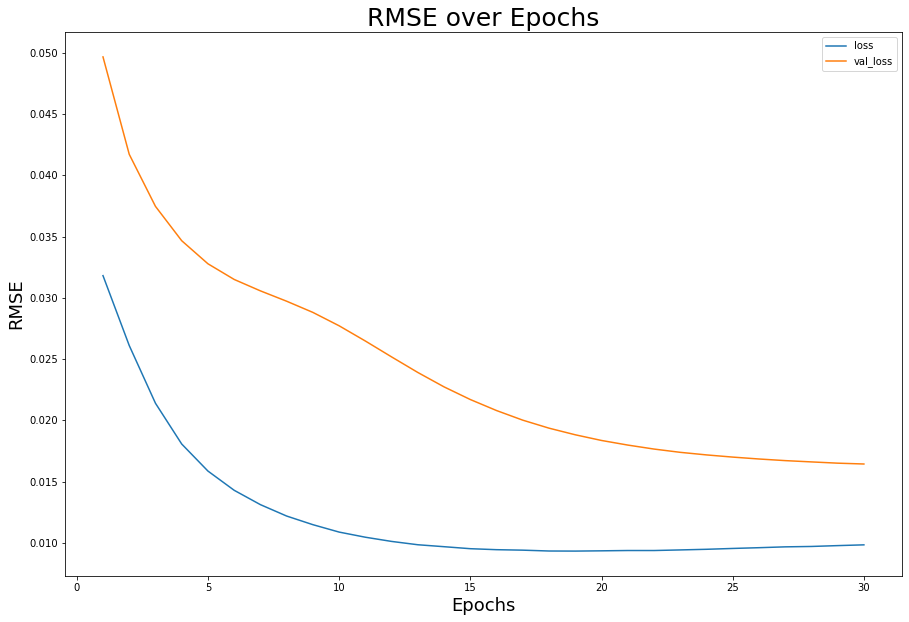

In [14]:
IMAGE_folder = image_folder
MODEL_folder = model_folder

define_specs()

start_train = time.time()
model, history, scaler_train, X_train, y_train, _, X_val, y_val = nn.train_model(ex_train, ex_val, scaler = SCALER,
                                                                                 save_folder = MODEL_folder, 
                                                                                 difference_chosen = DIFFERENCE,
                                                                                 lag_chosen = LAG, nmb_epochs = EPOCH,
                                                                                 neurons_chosen = NEUR, batch_size = BATCH_SIZE)
dur_train = time.time() - start_train
gf.save_losses(history, IMAGE_folder)
#predictions()

In [15]:
# model, history, scaler_train, X_train, y_train, _, X_val, y_val = nn.train_model(ex_train, ex_val, save_folder = model_folder,
#                                                                                  difference_chosen = DIFFERENCE, lag_chosen = LAG,
#                                                                                  nmb_epochs = EPOCH, neurons_chosen = NEUR, batch_size = BATCH_SIZE)

# gf.save_losses(history, image_folder)

In [16]:
# gf.save_losses(history, image_folder)

In [17]:
model = nn.load_best_model(model_folder)

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


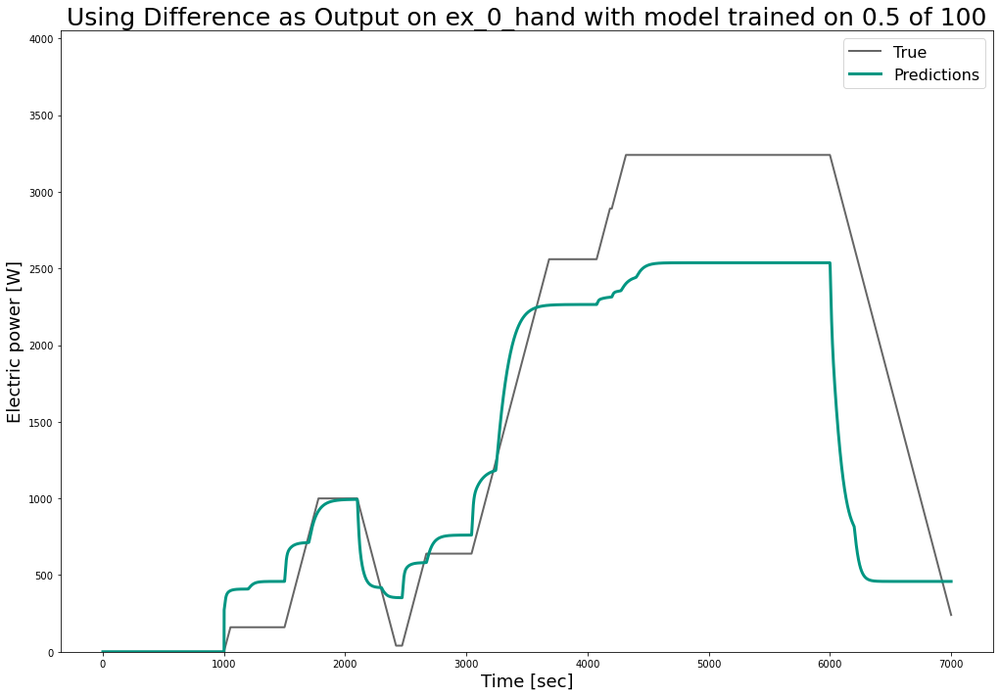

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


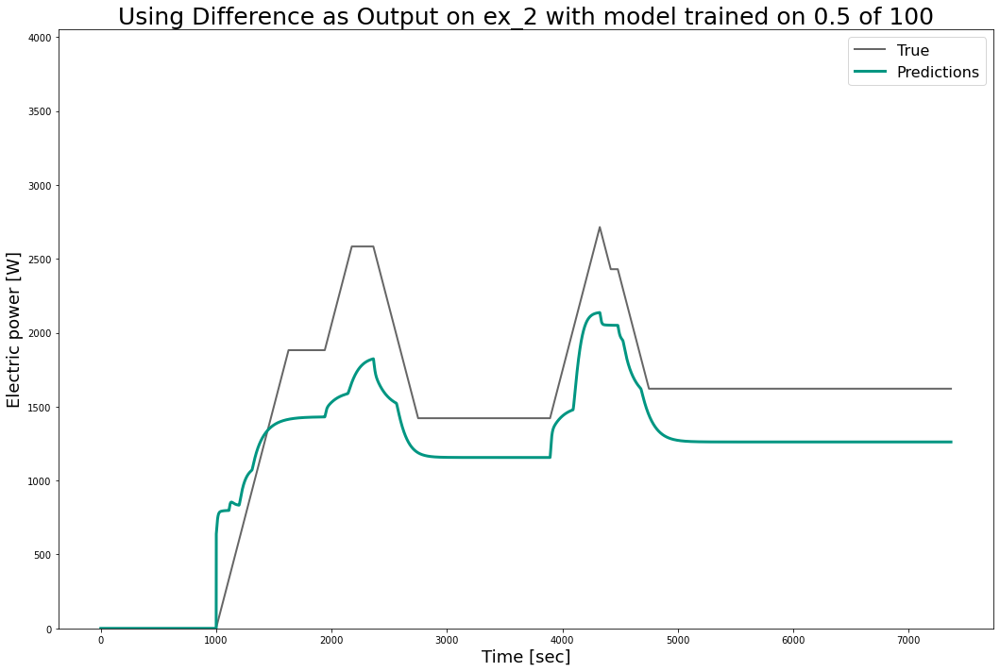

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


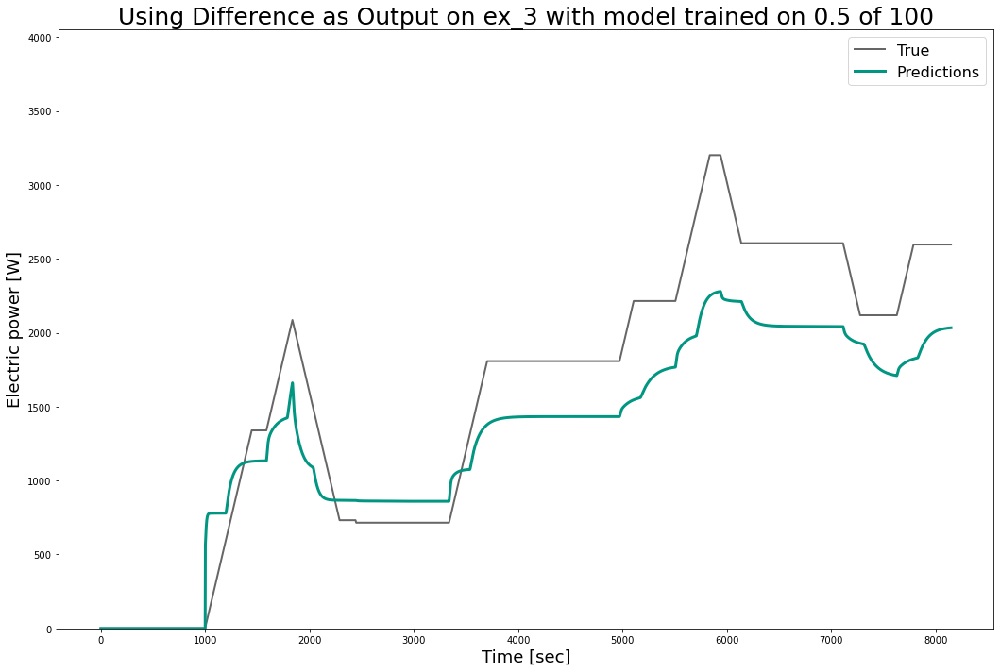

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


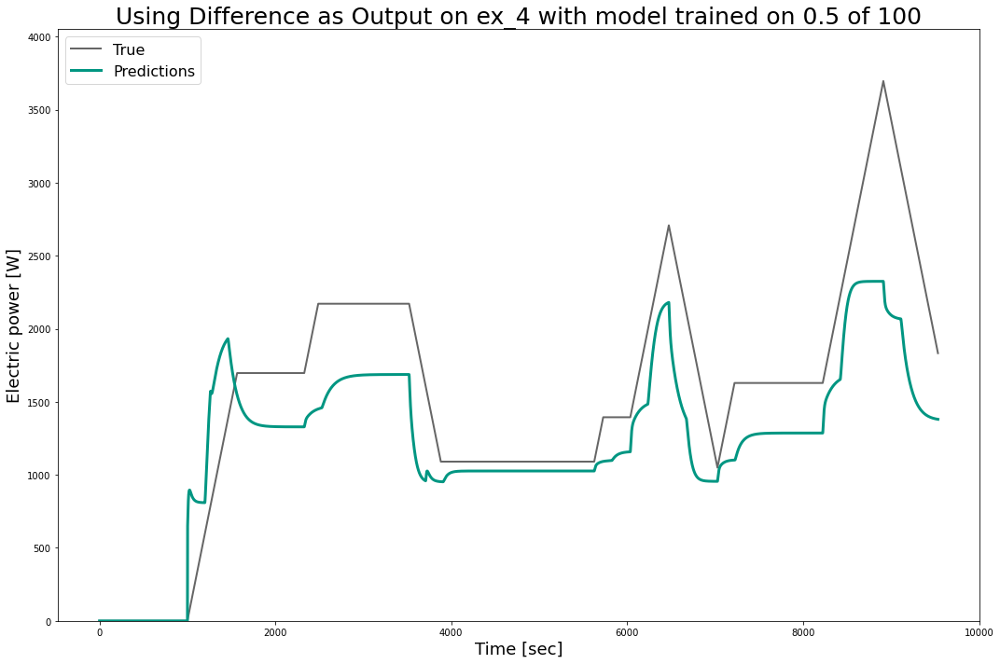

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


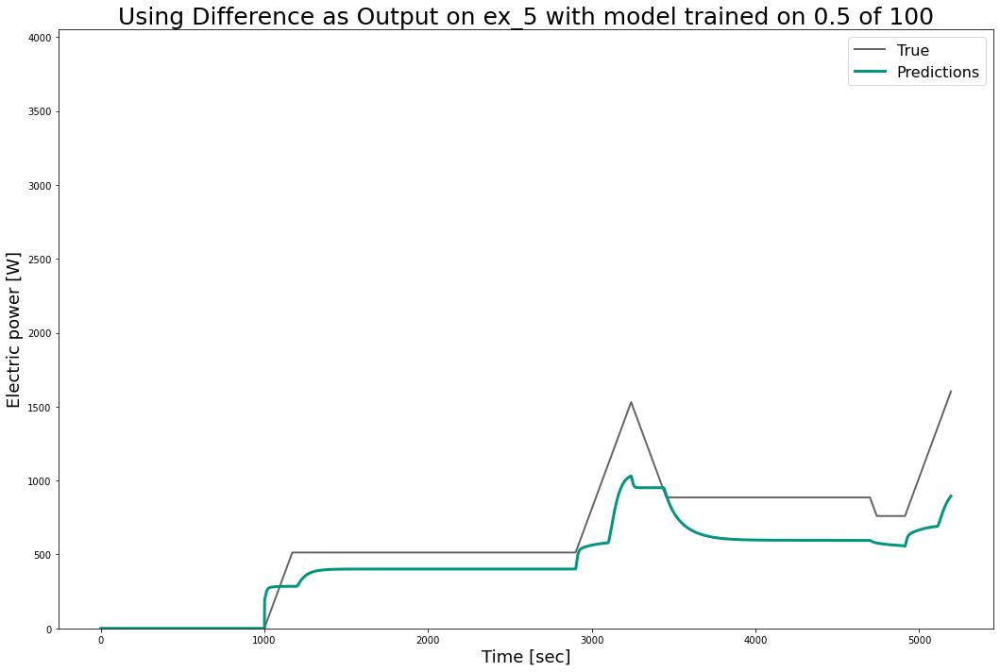

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


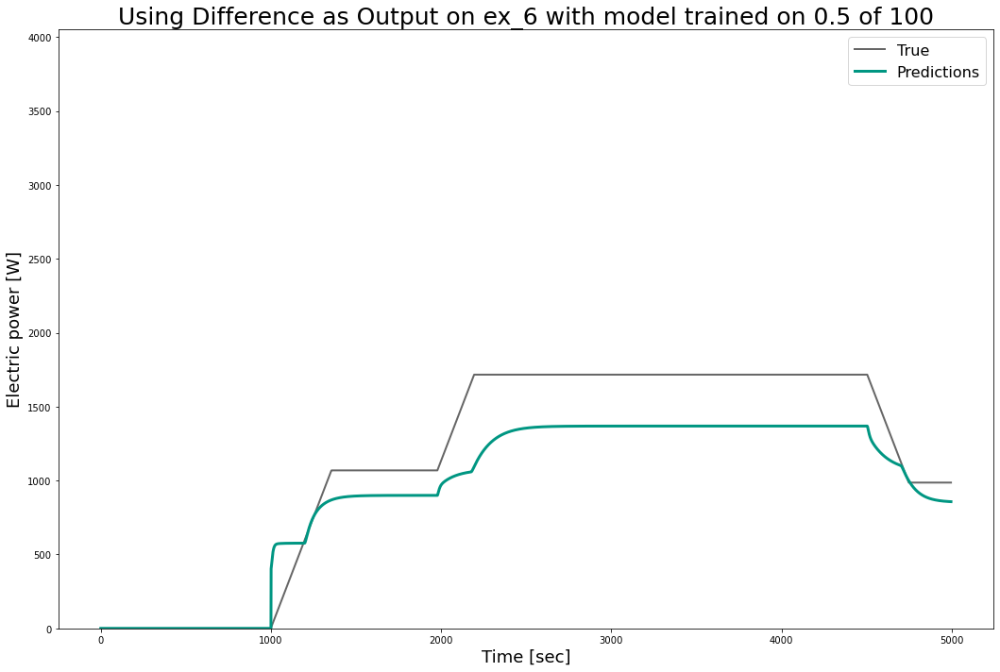

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


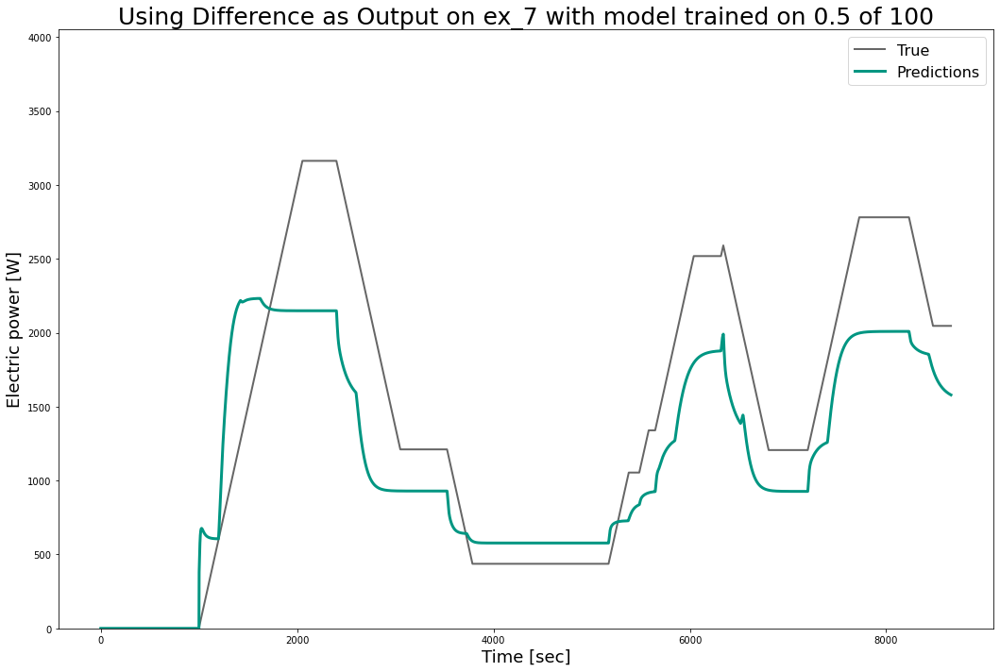

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


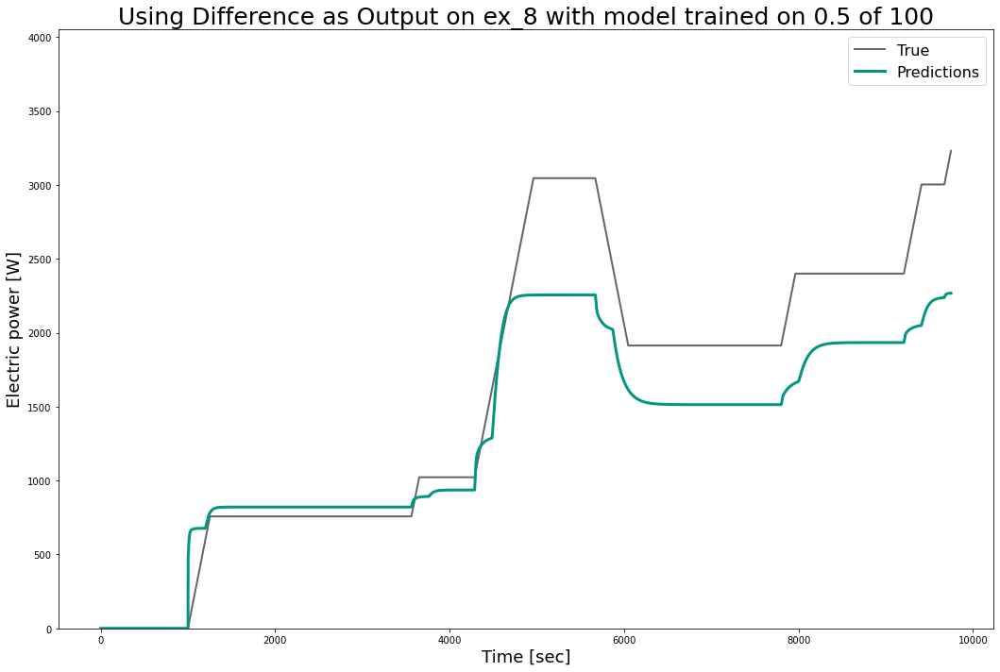

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


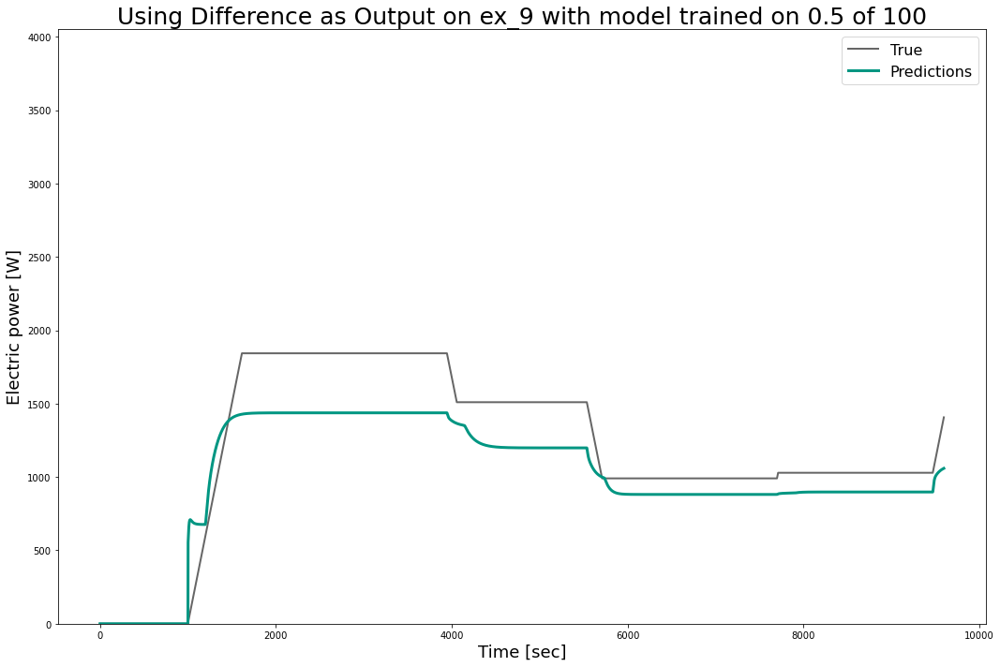

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


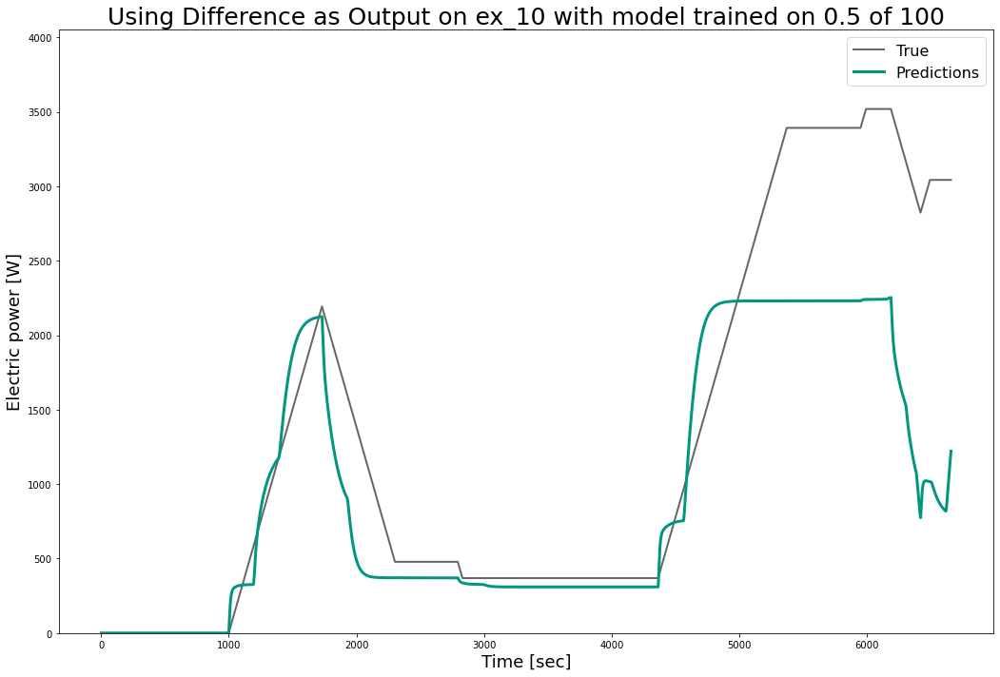

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


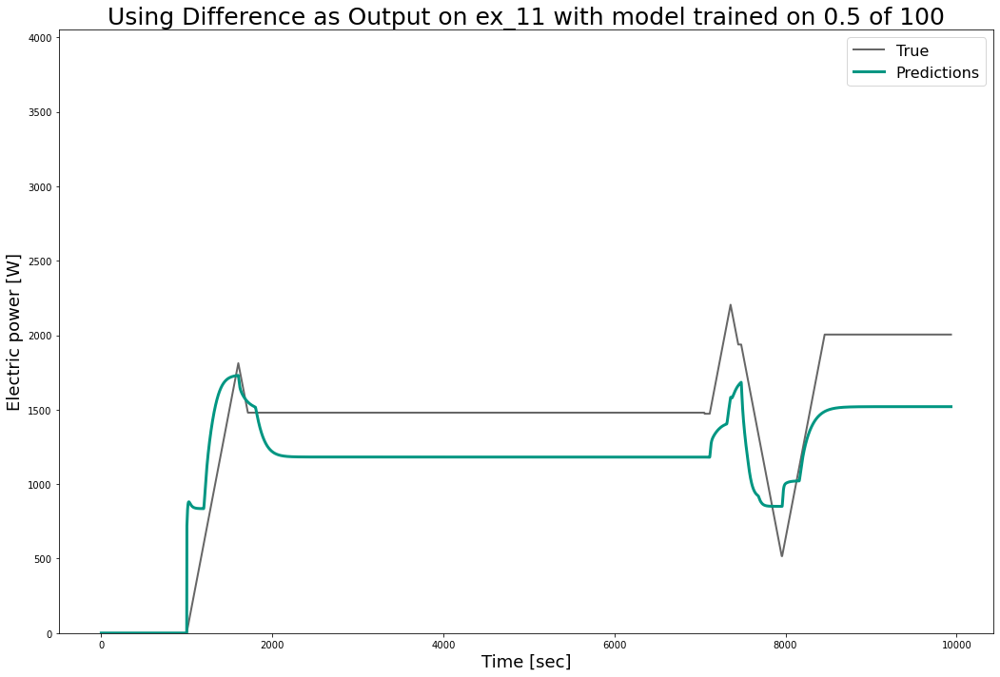

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


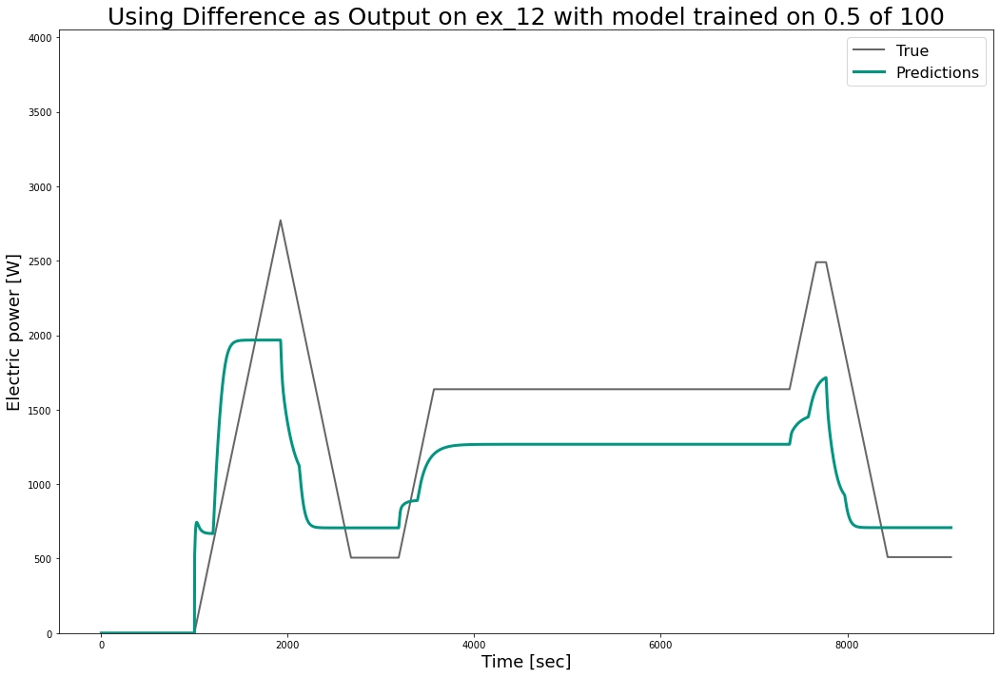

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


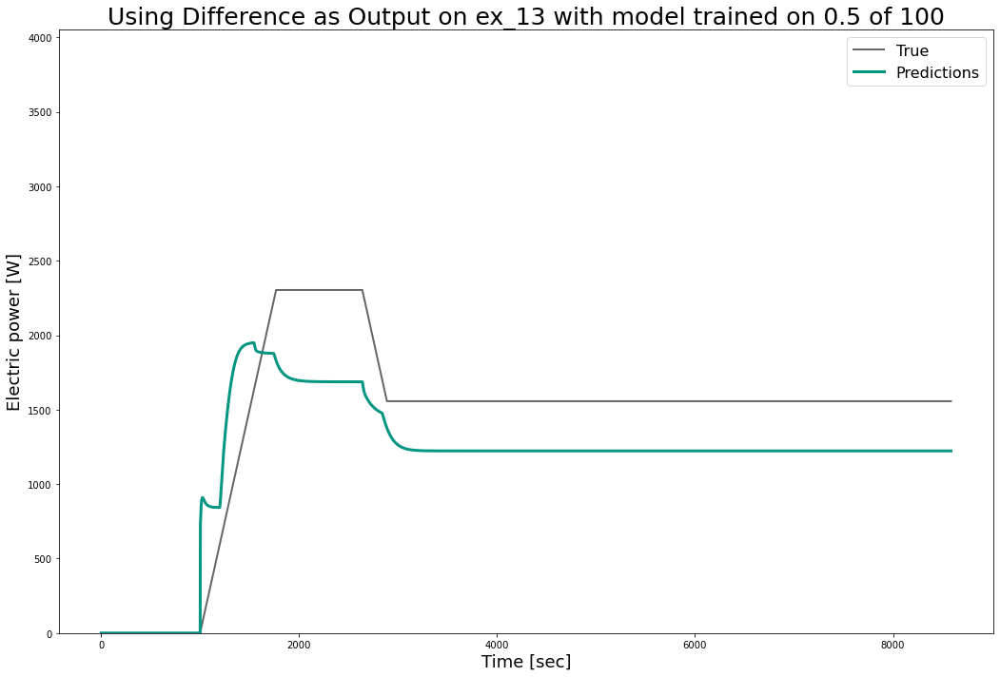

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


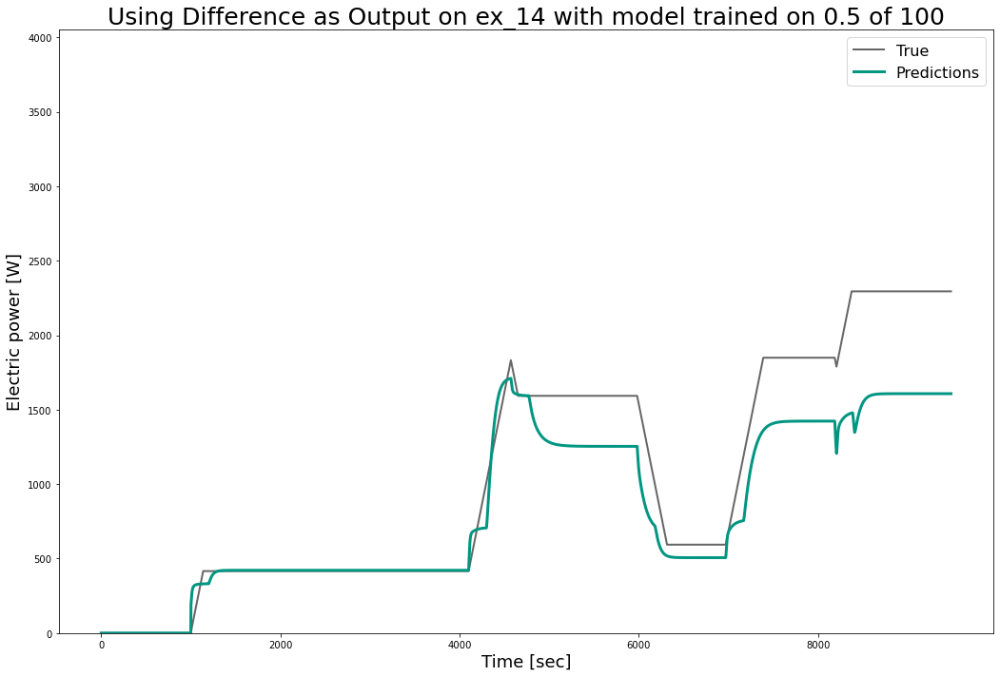

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


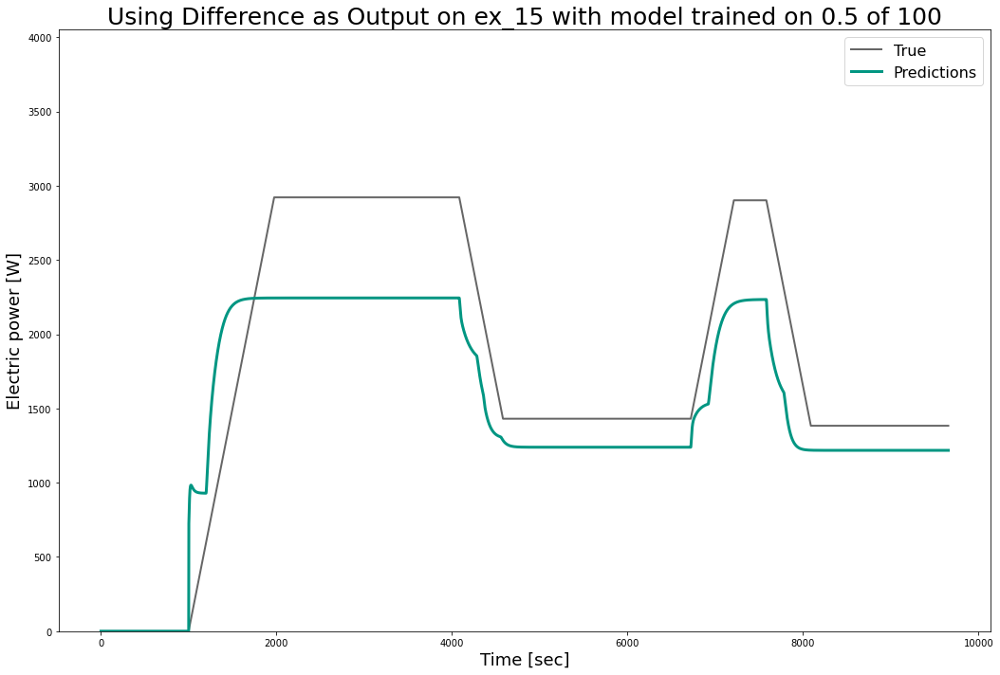

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


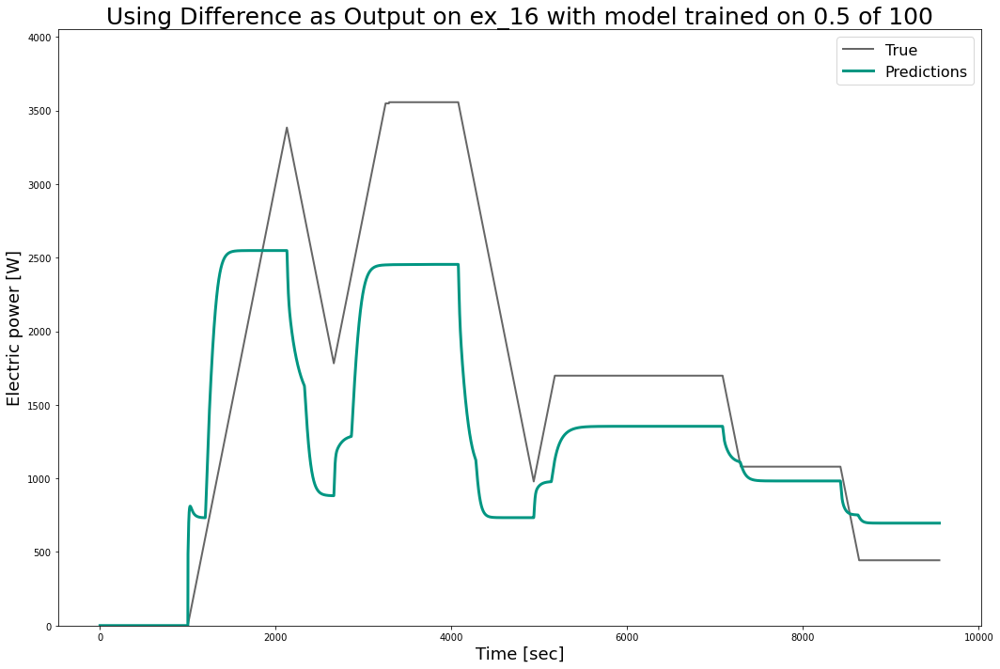

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


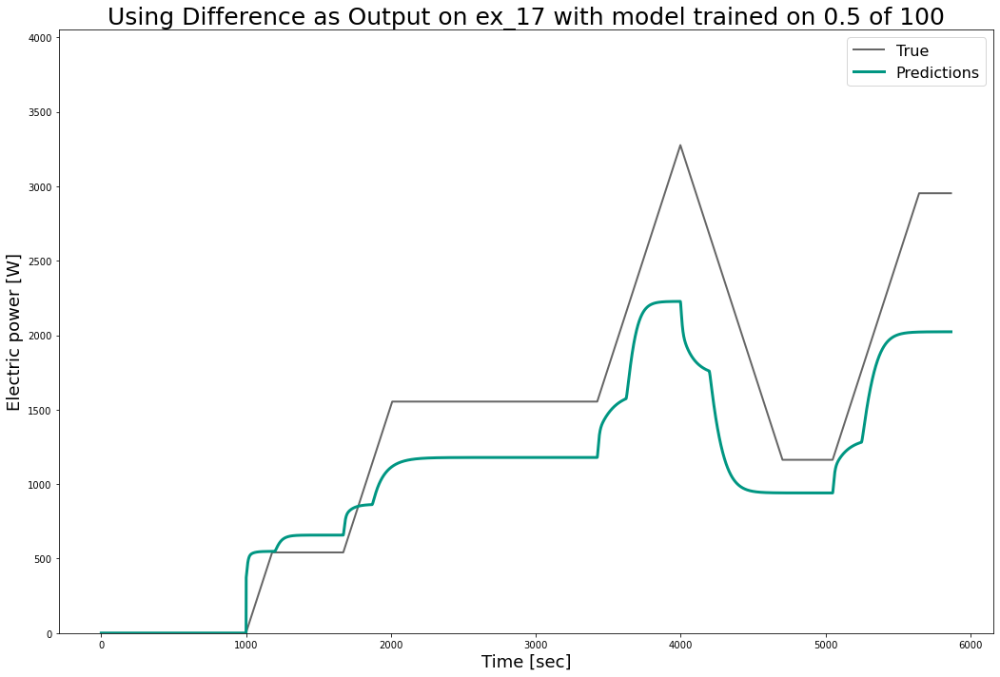

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


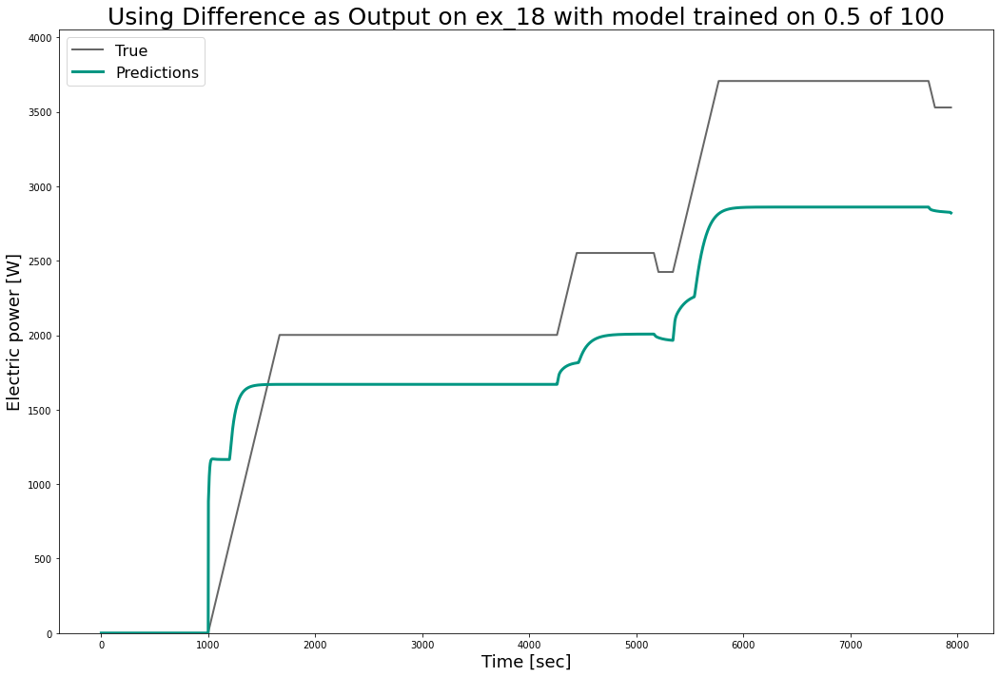

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


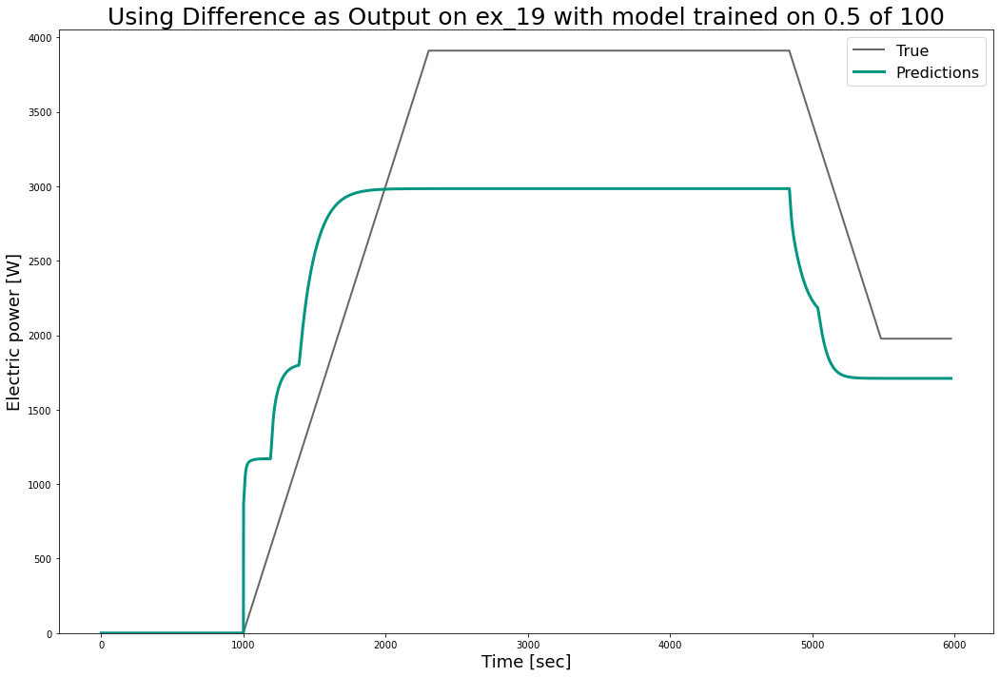

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


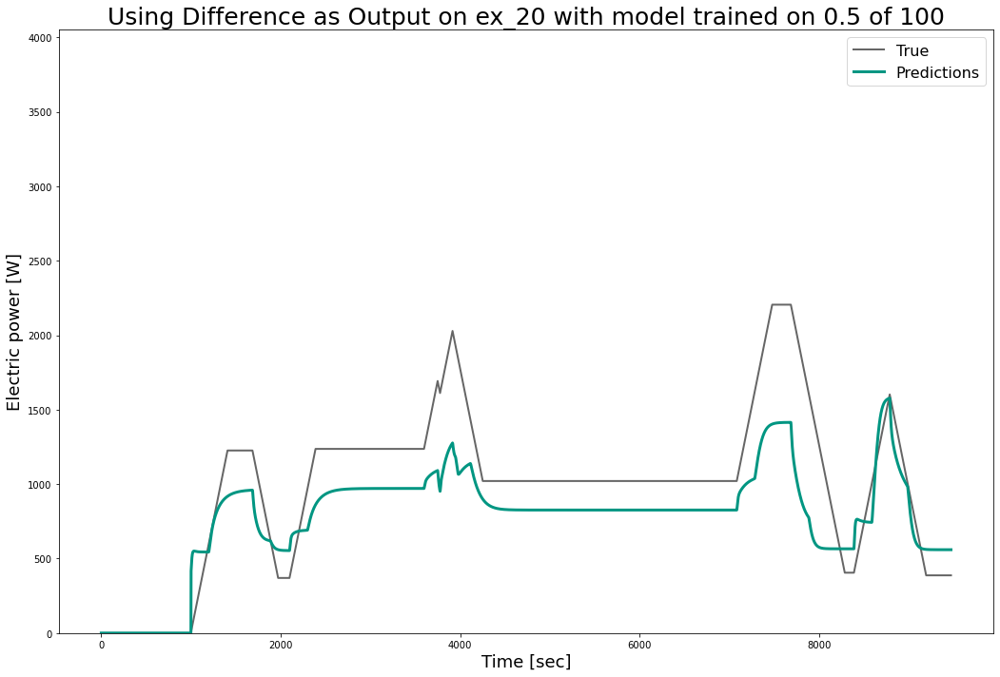

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


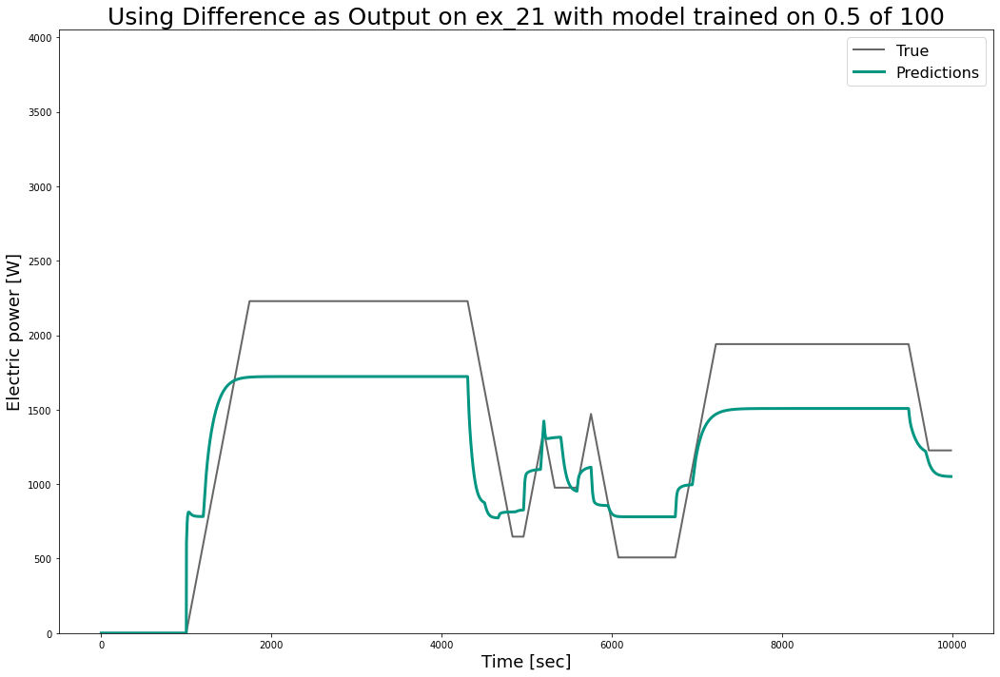

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


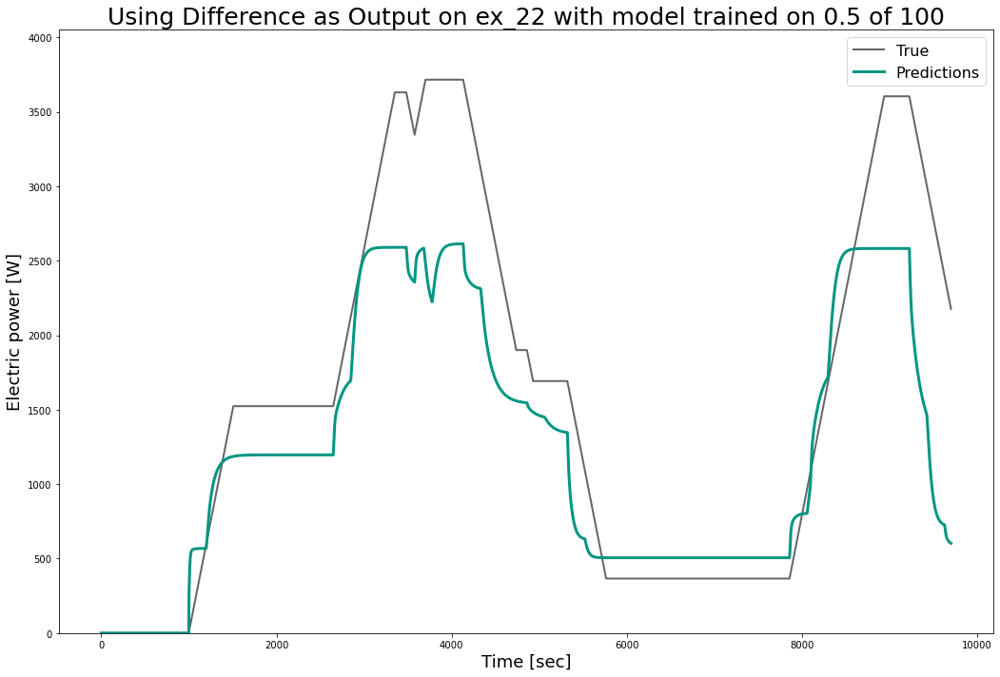

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


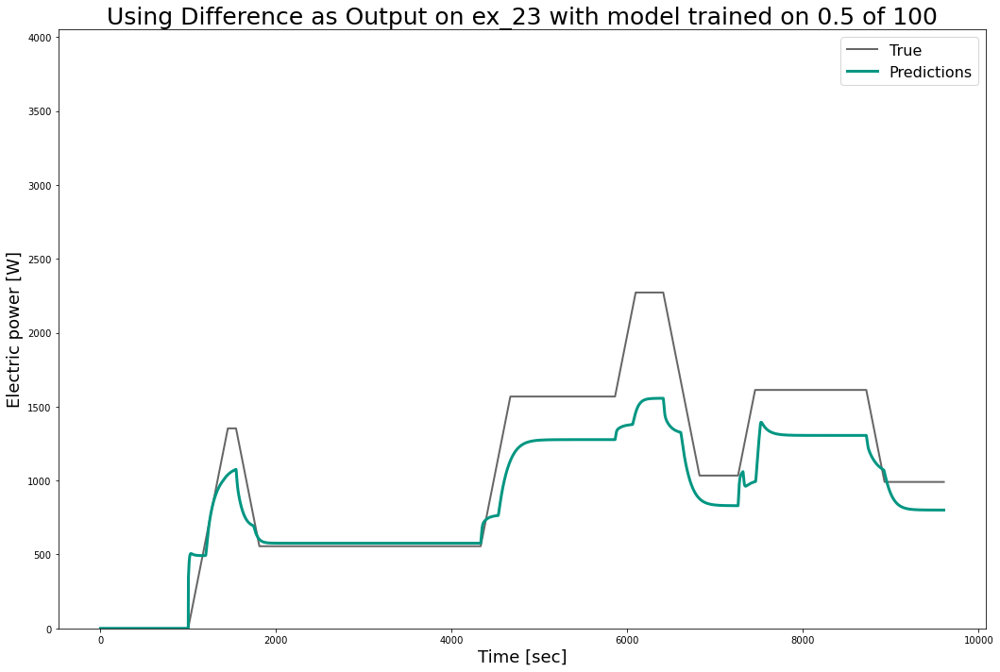

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


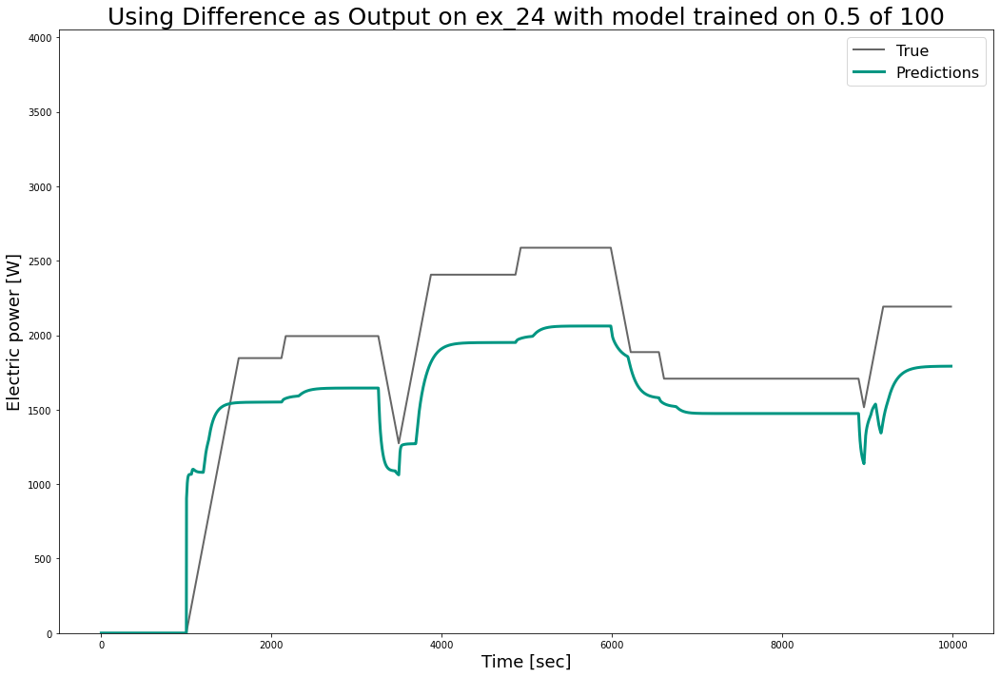

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


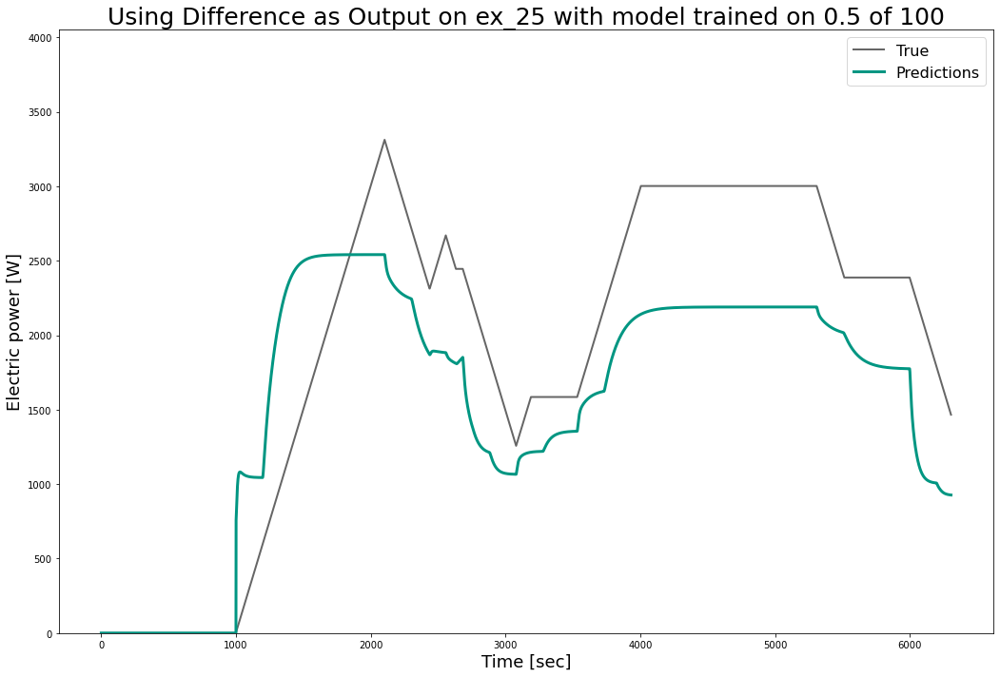

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


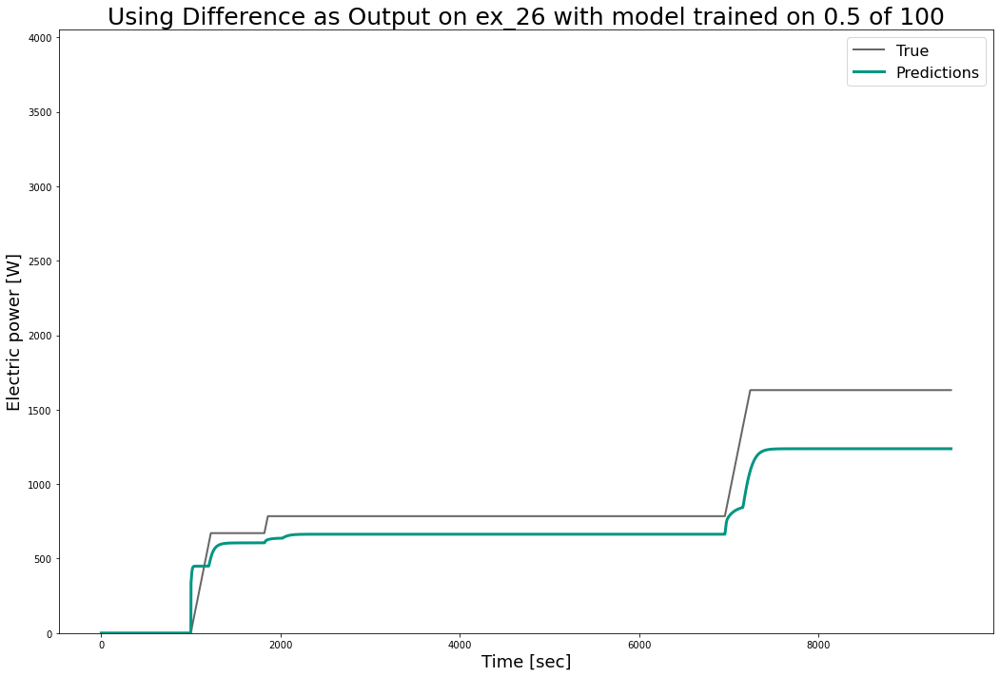

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


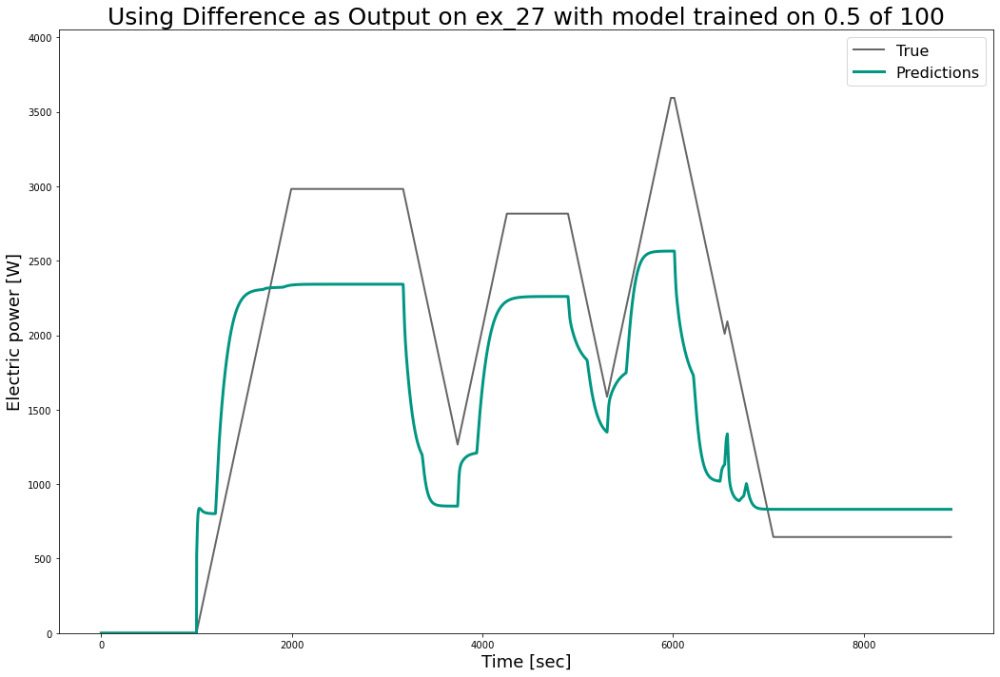

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


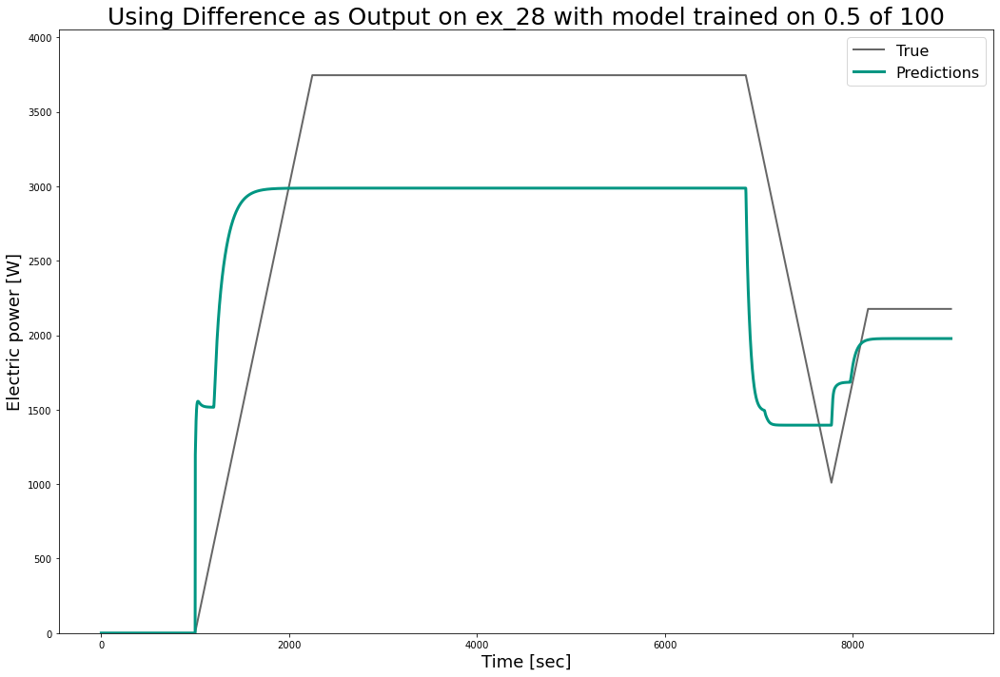

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


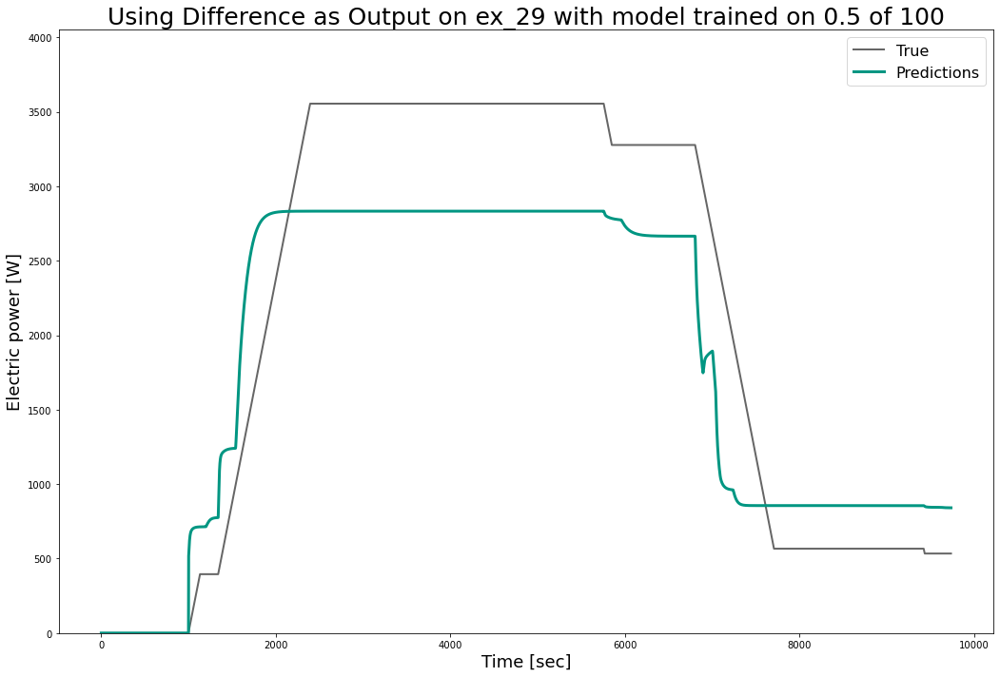

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


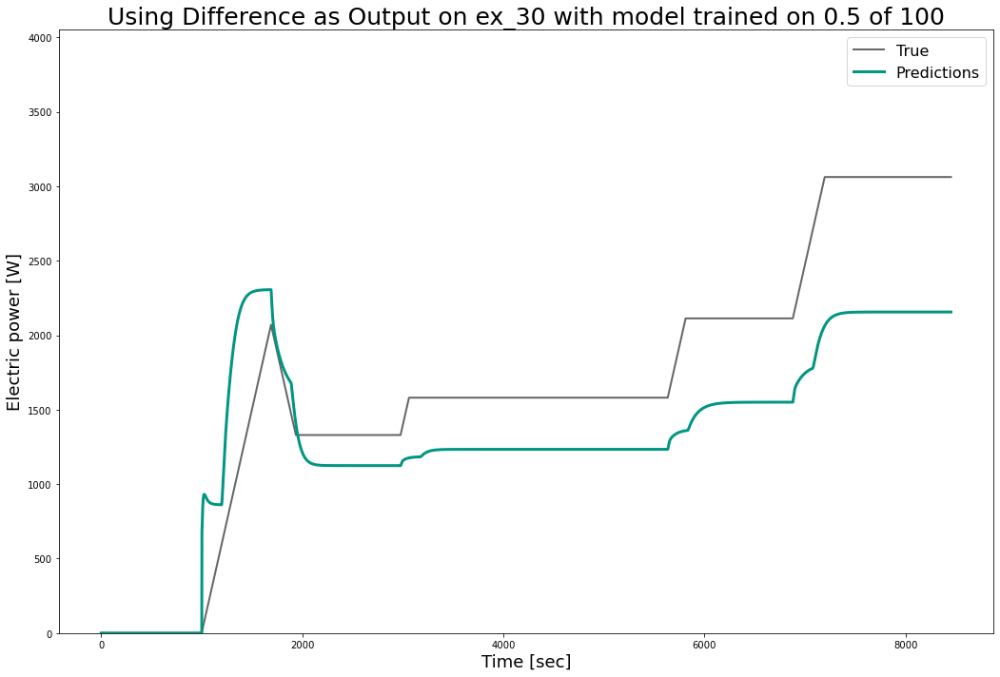

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


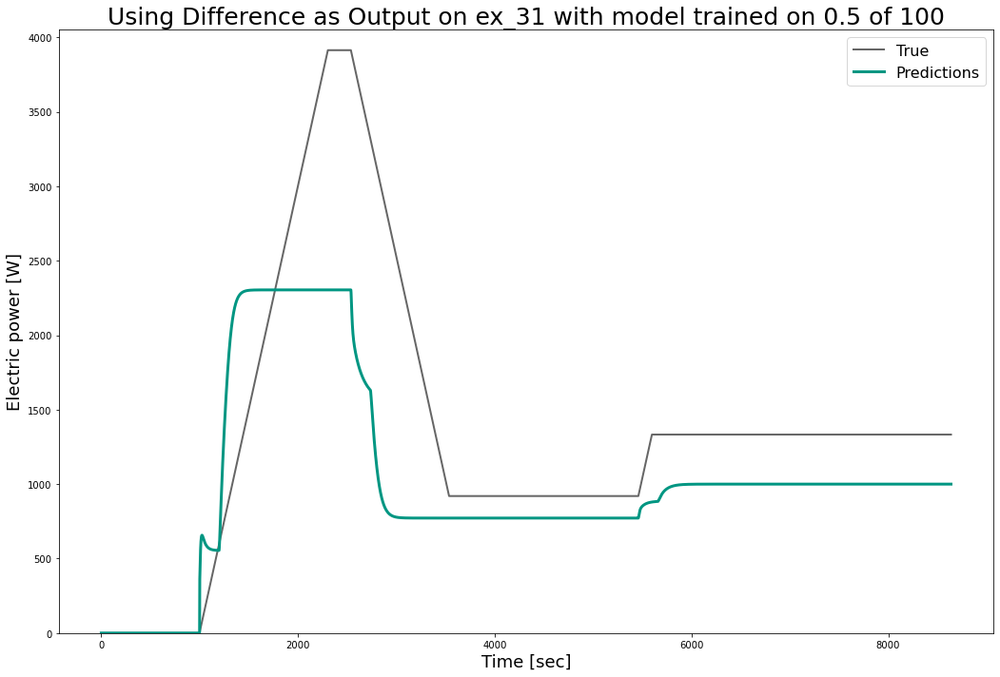

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


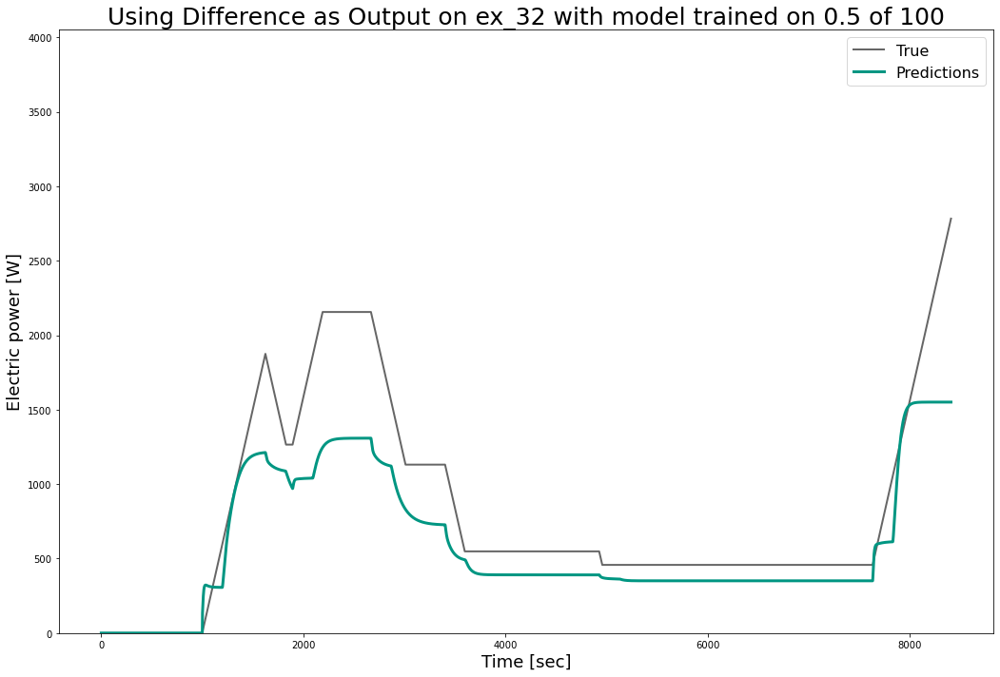

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


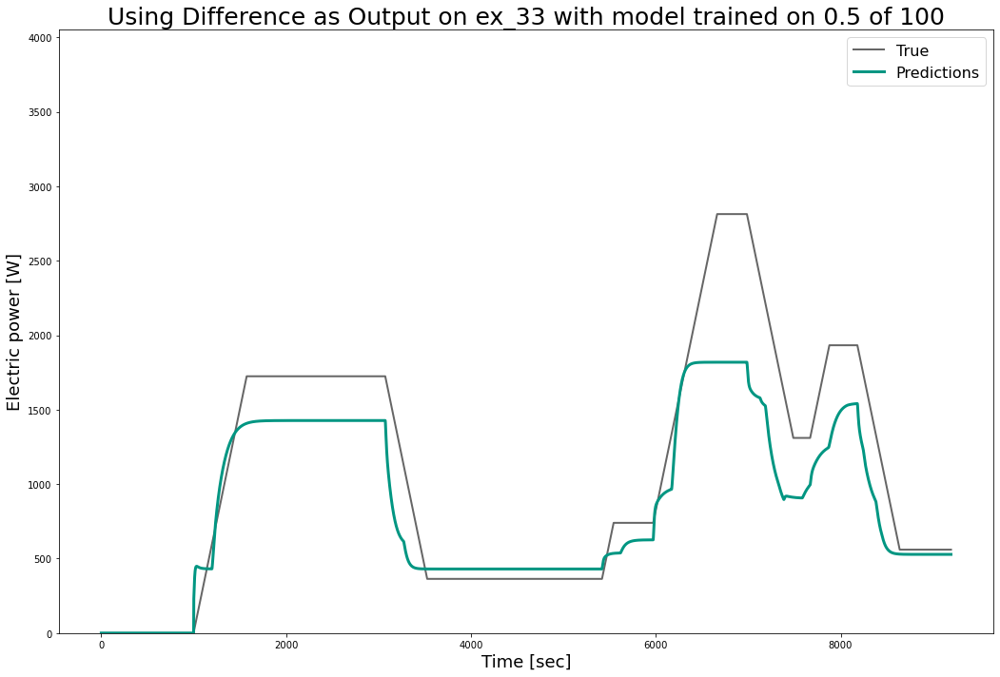

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


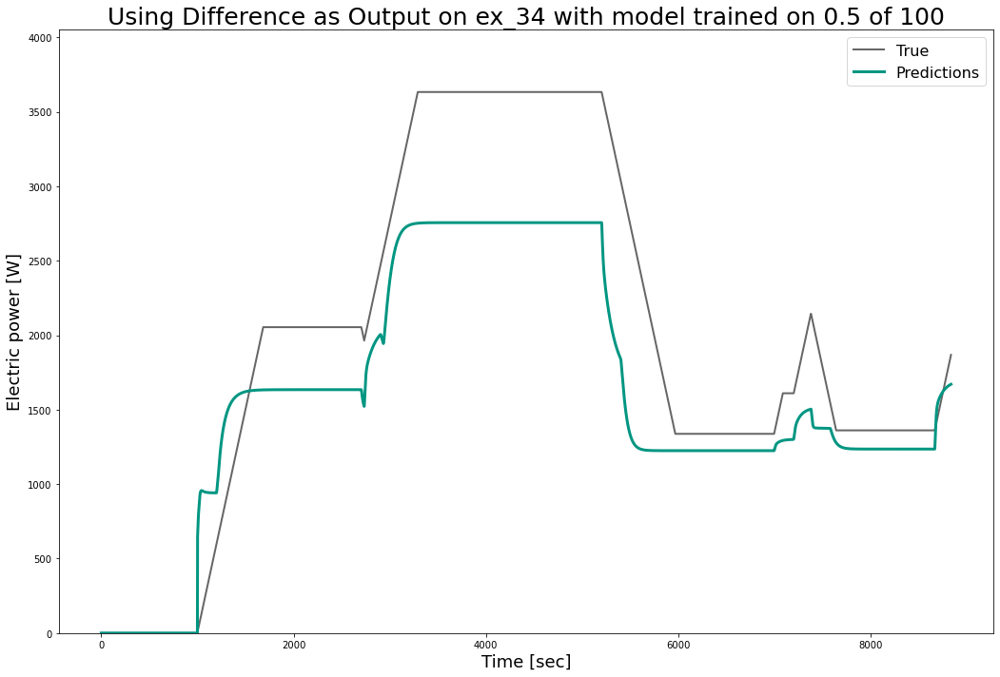

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


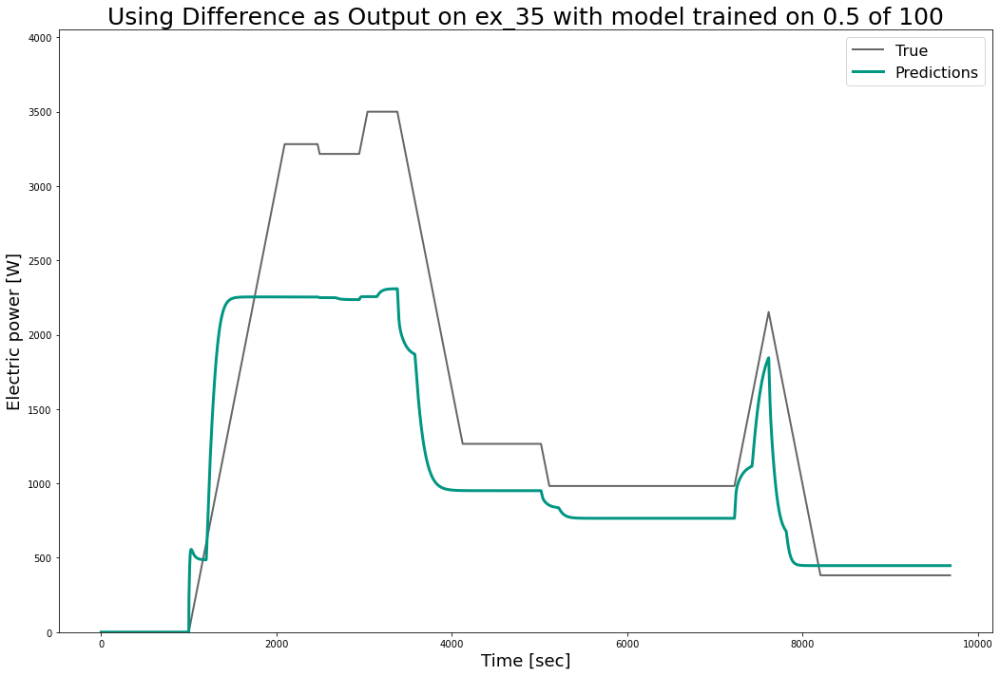

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


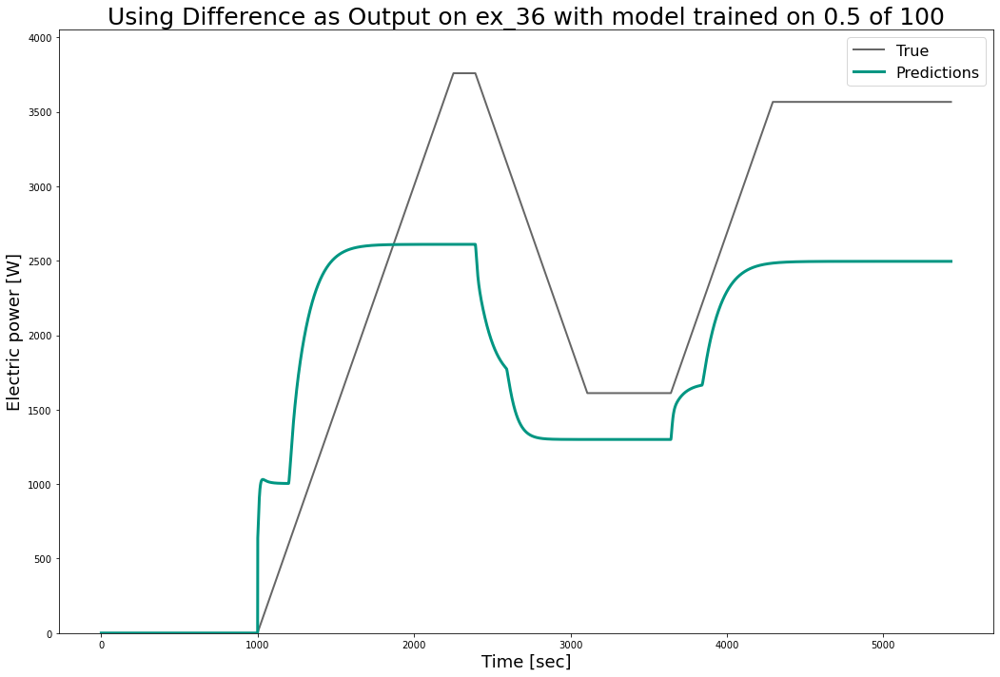

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


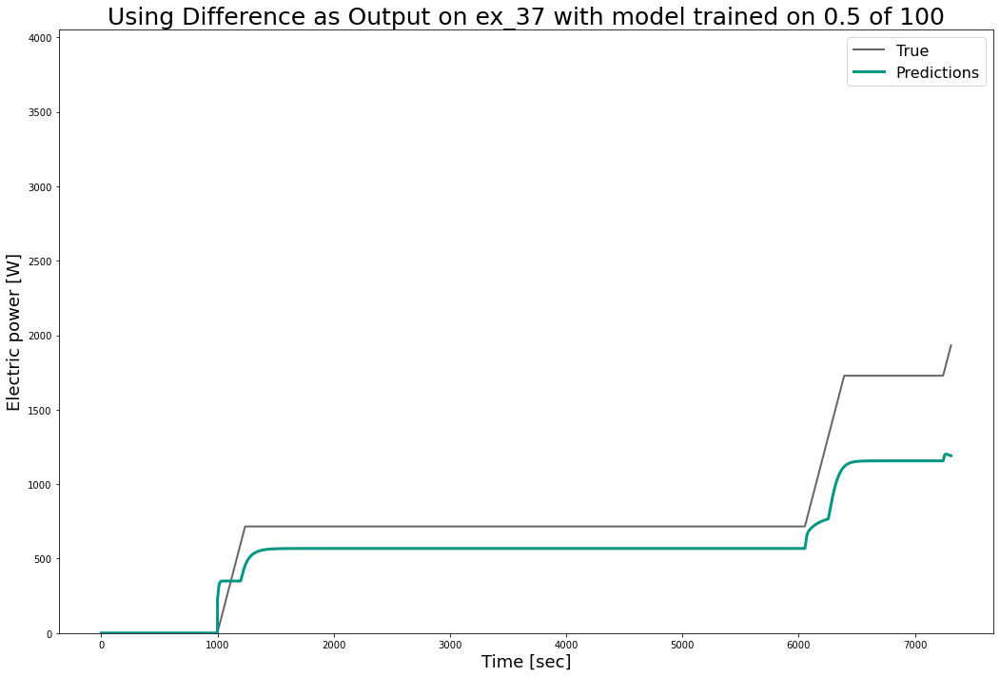

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


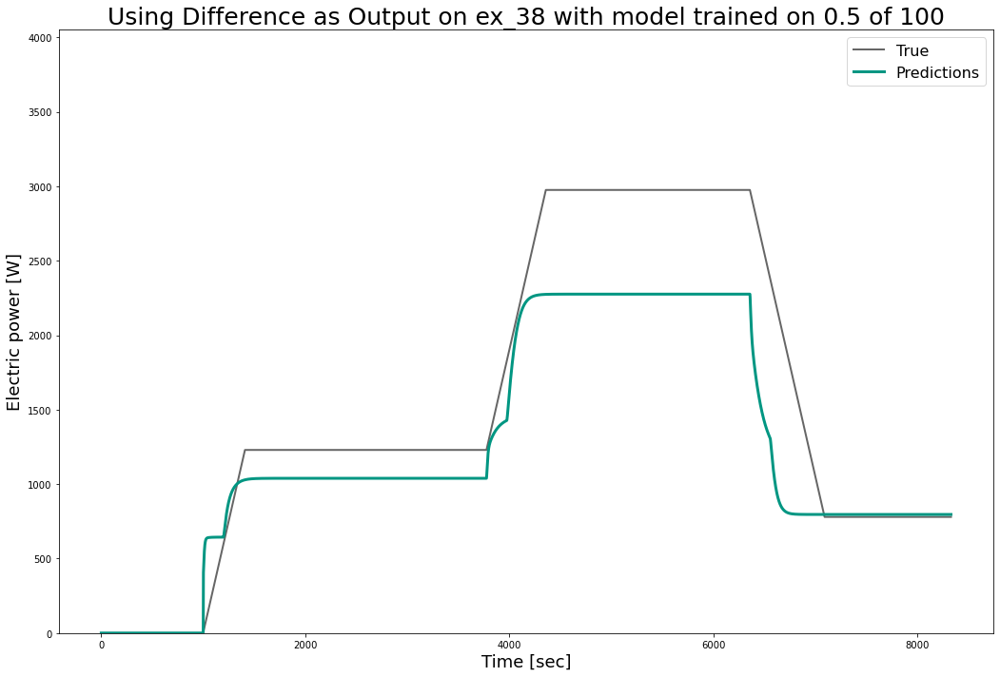

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


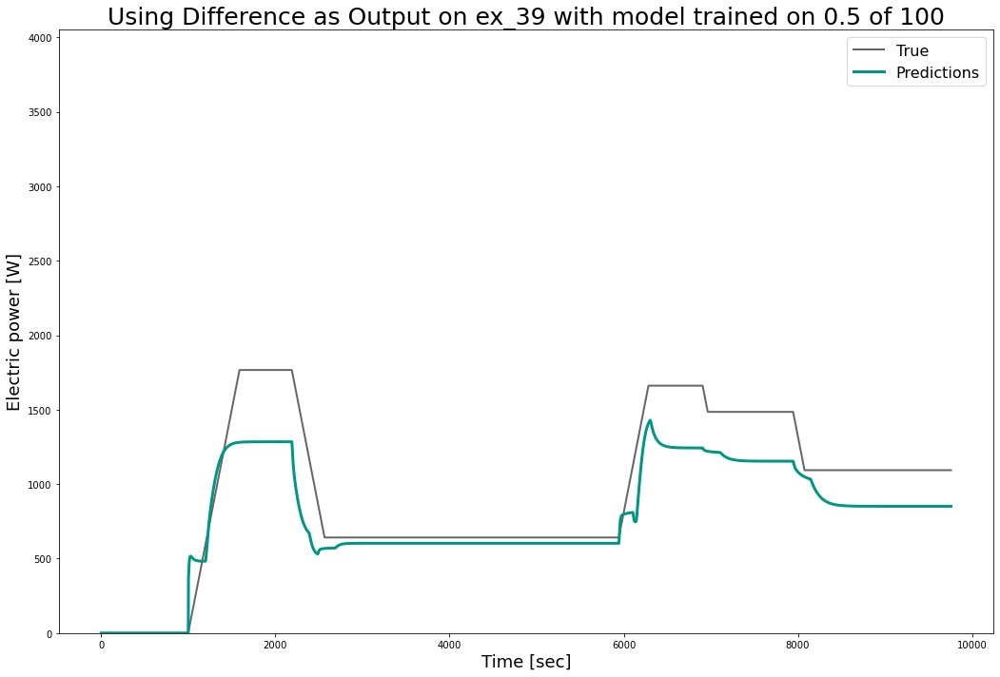

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


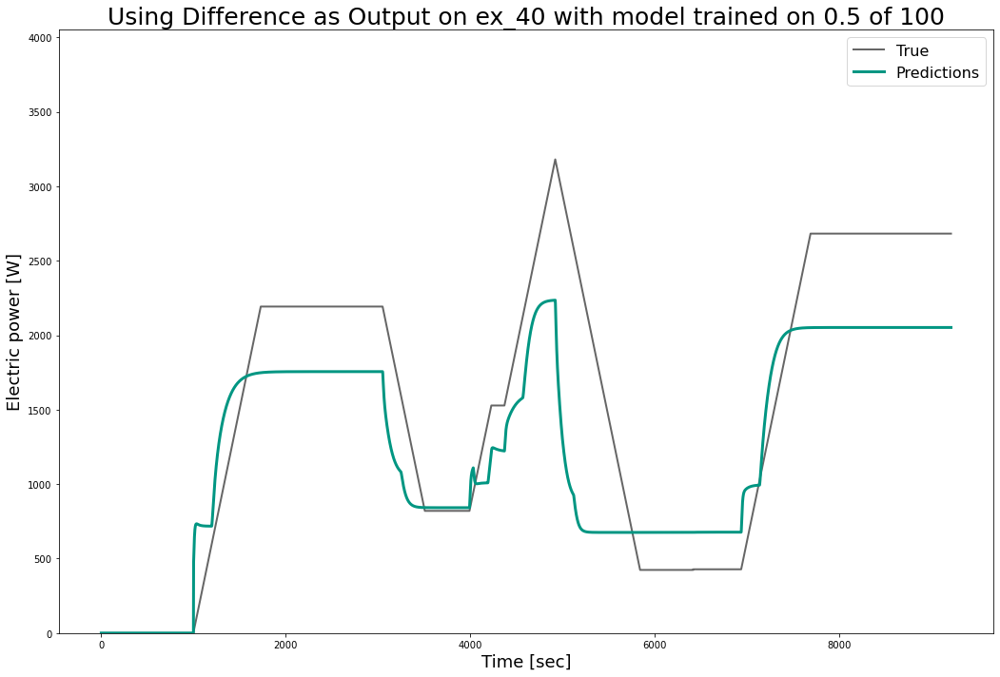

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


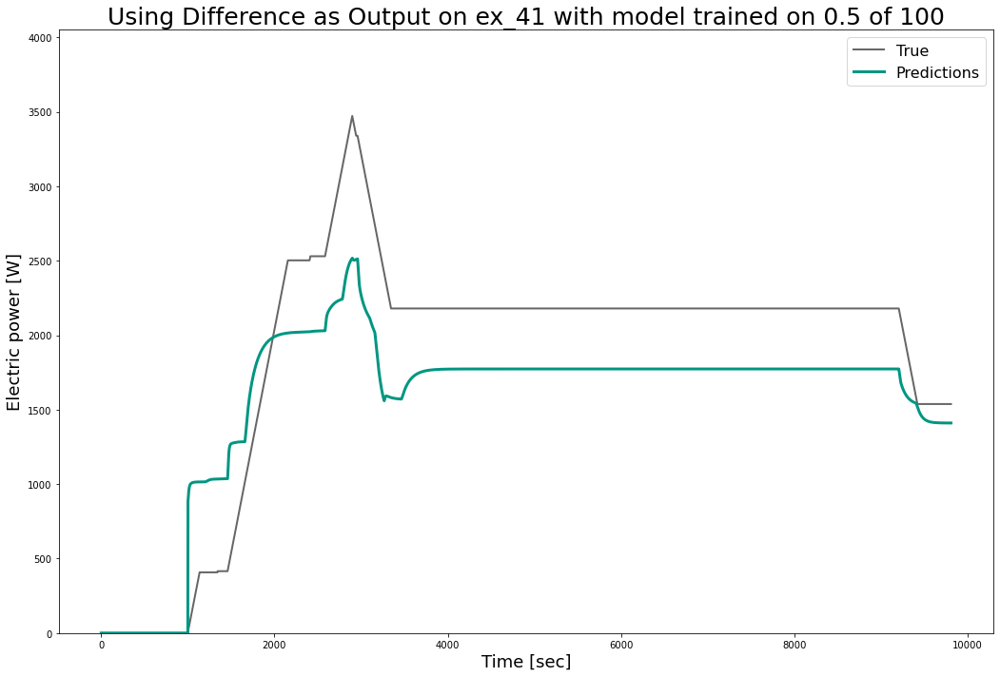

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


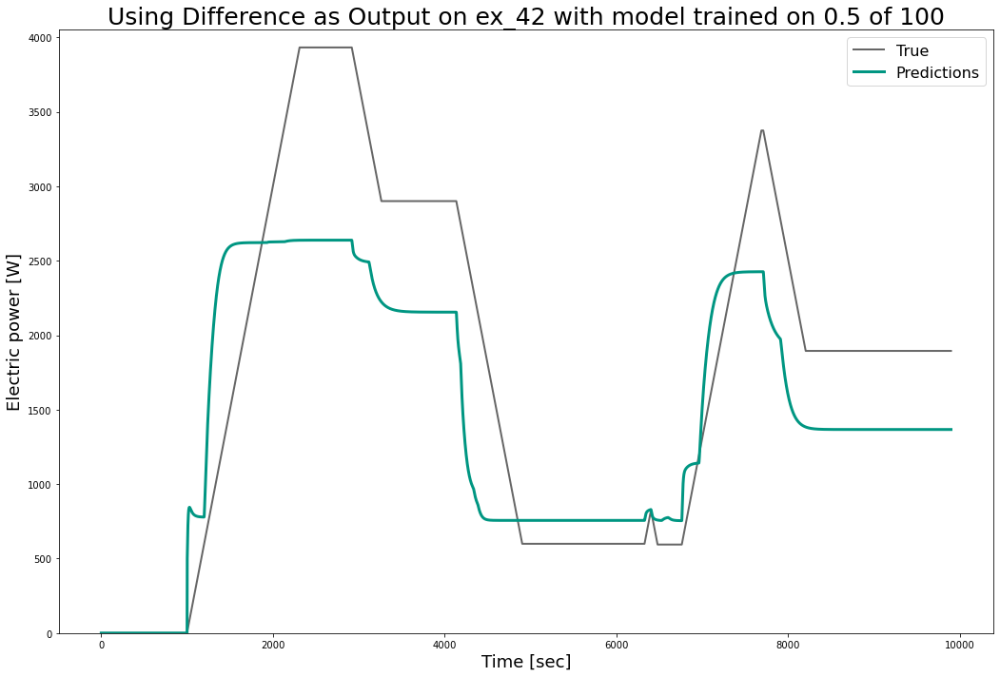

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


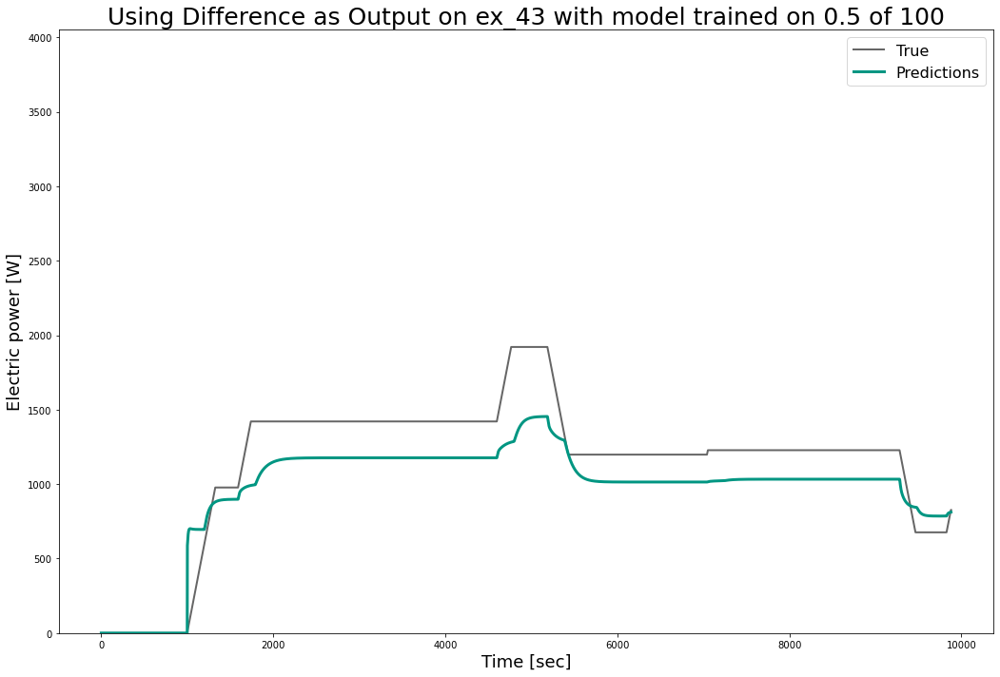

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


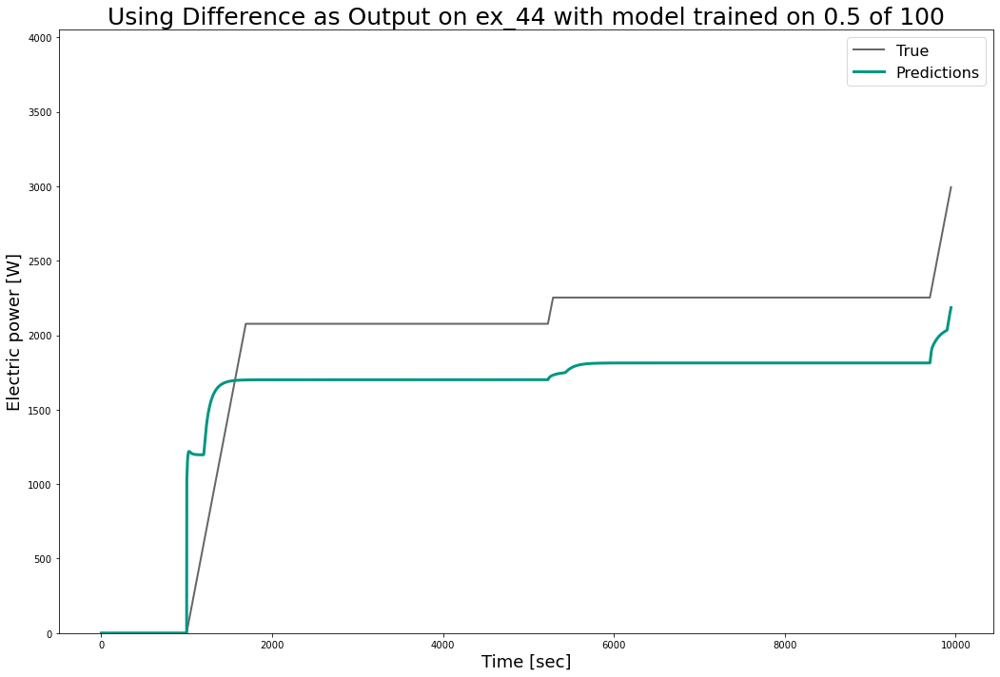

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


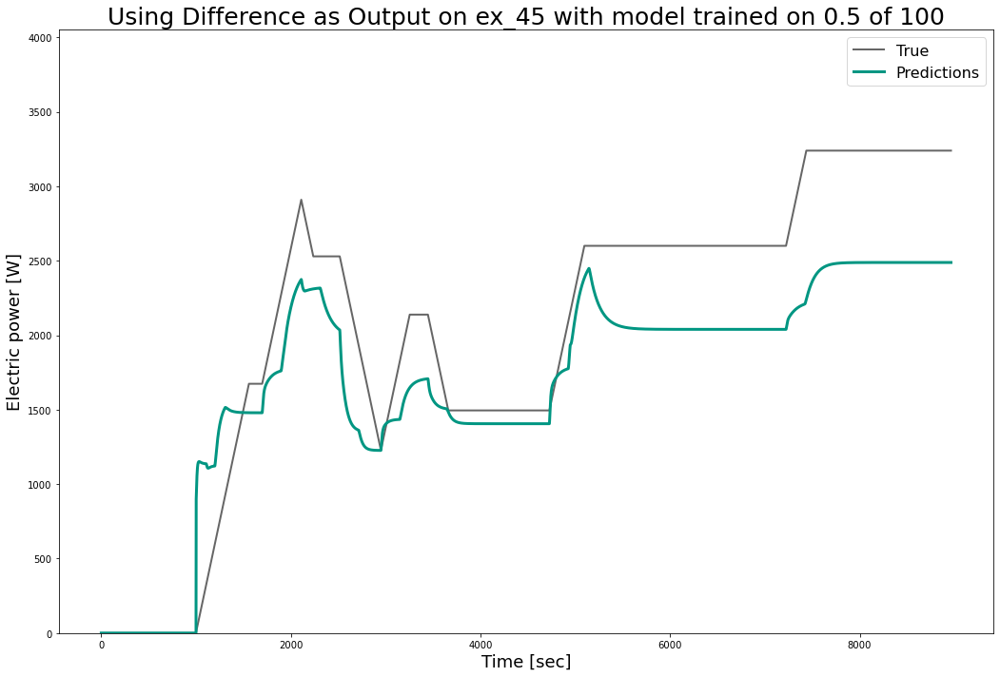

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


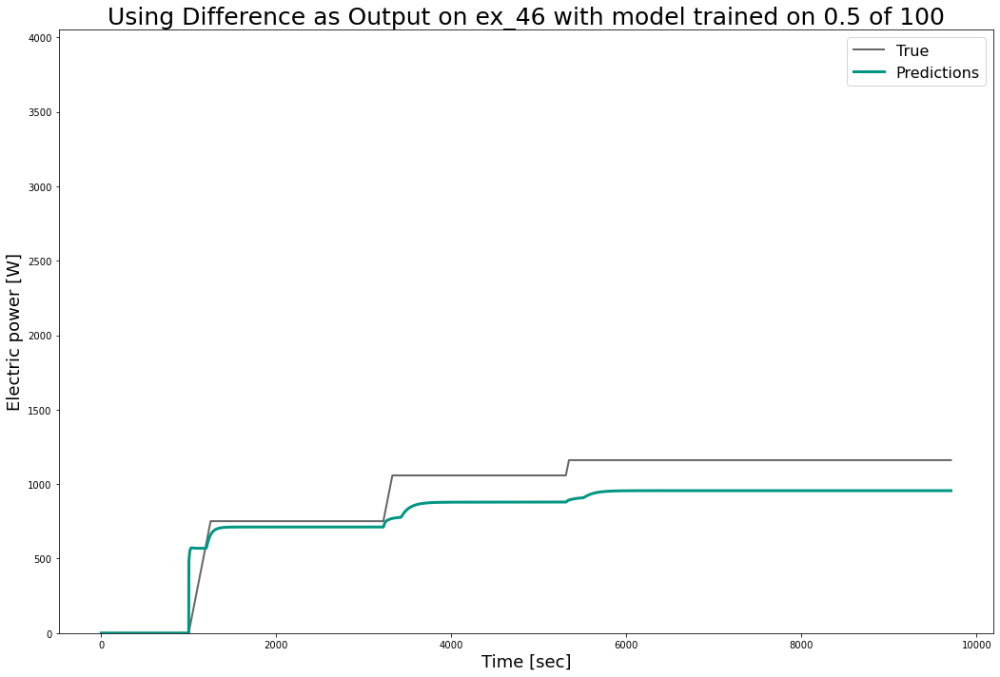

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


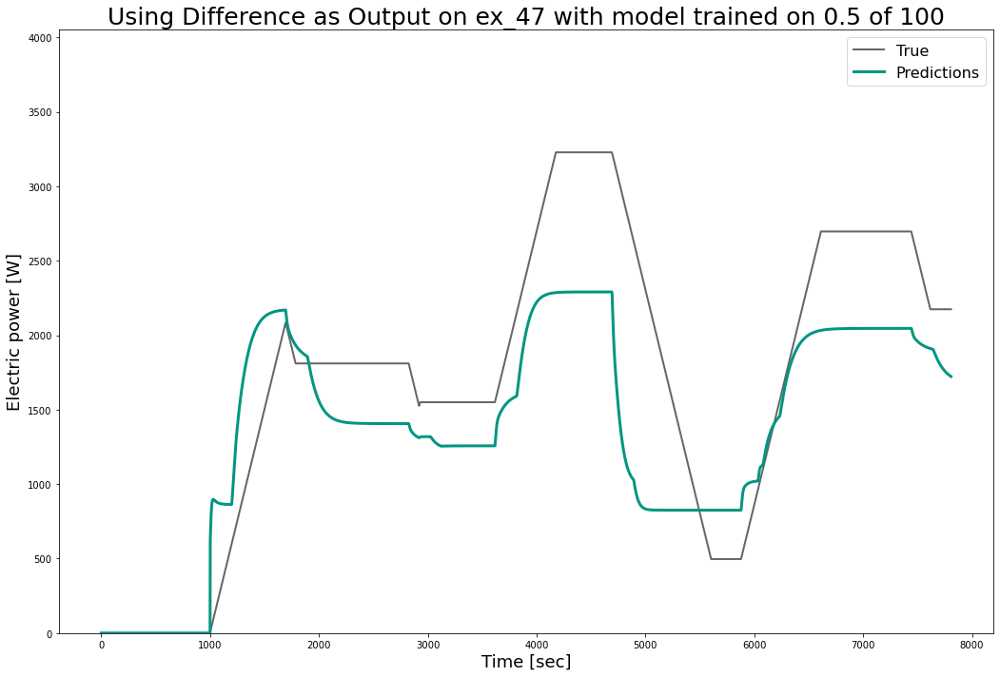

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


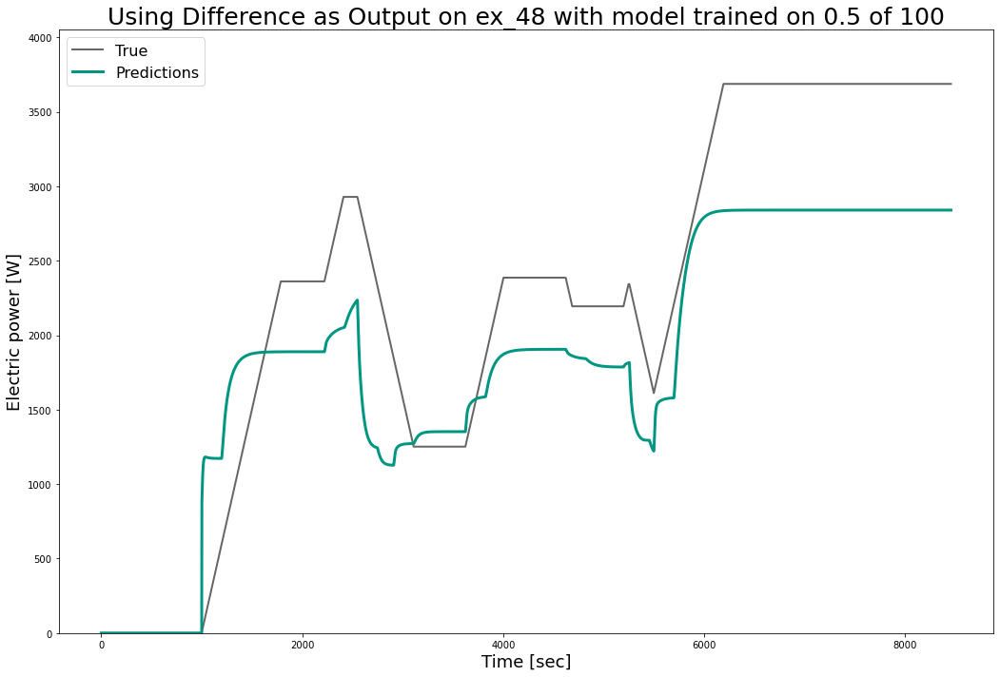

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


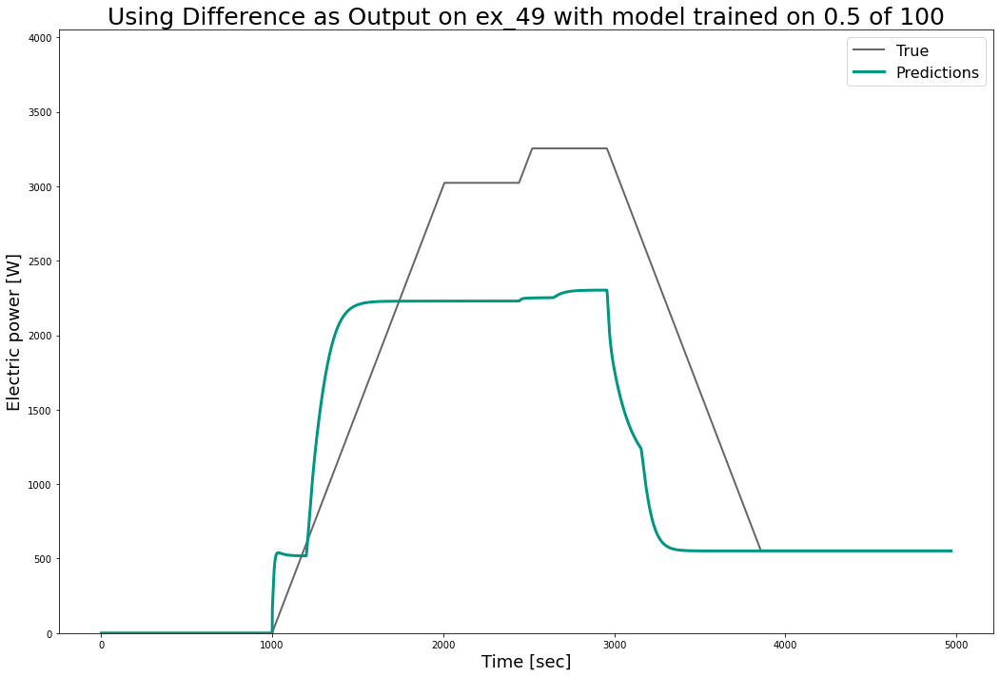

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


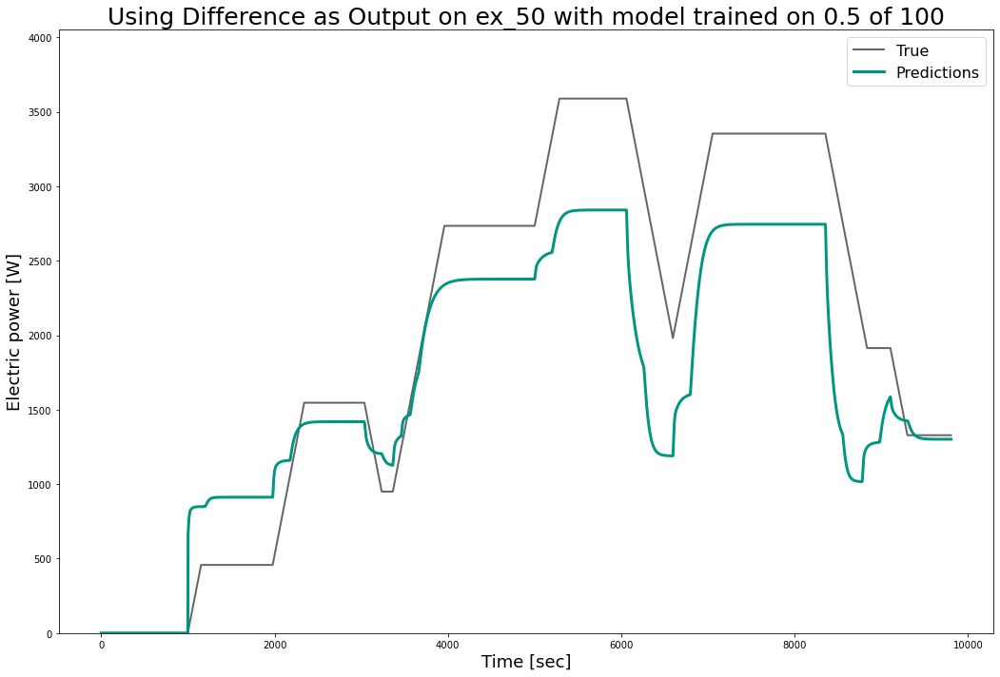

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


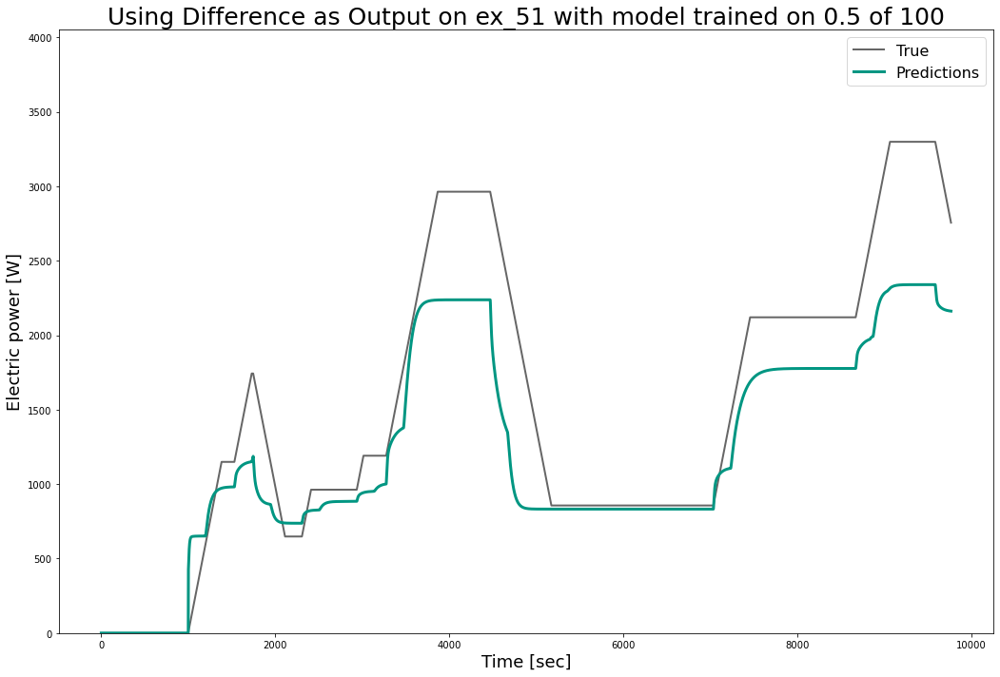

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


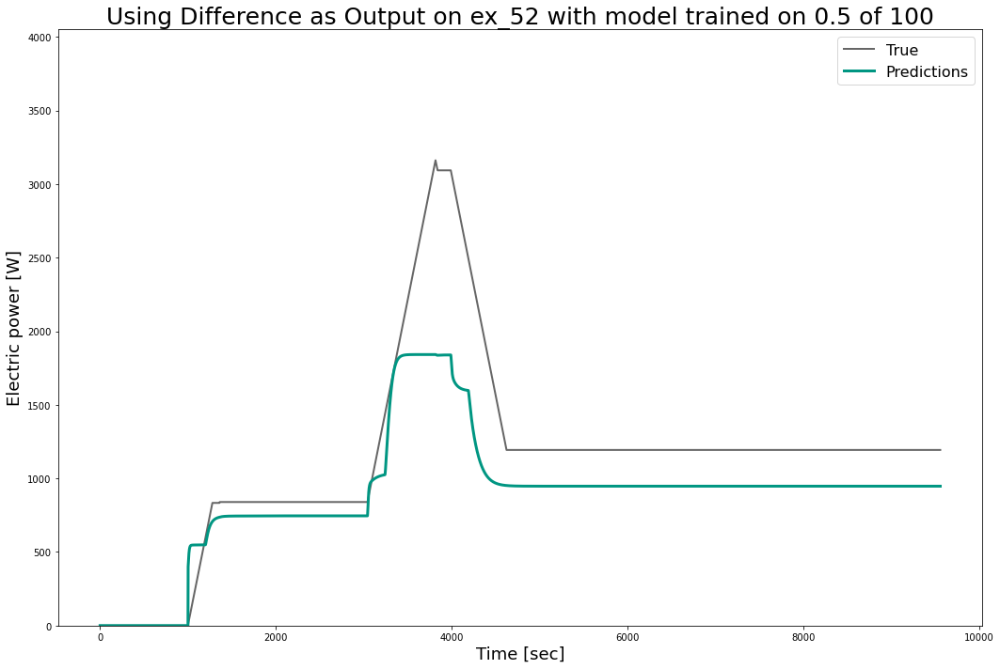

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


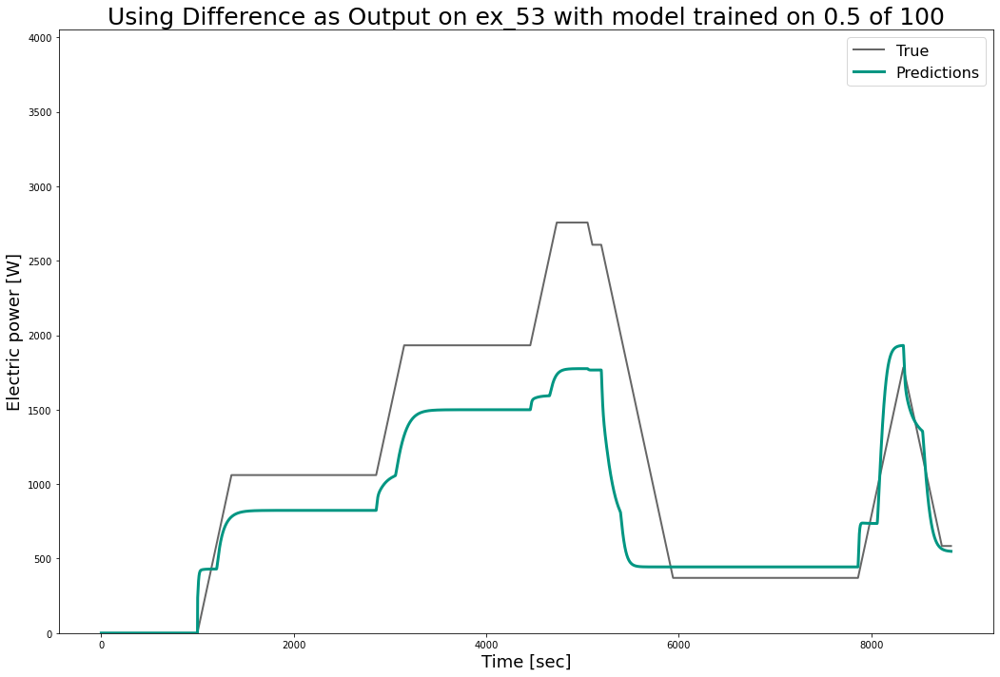

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


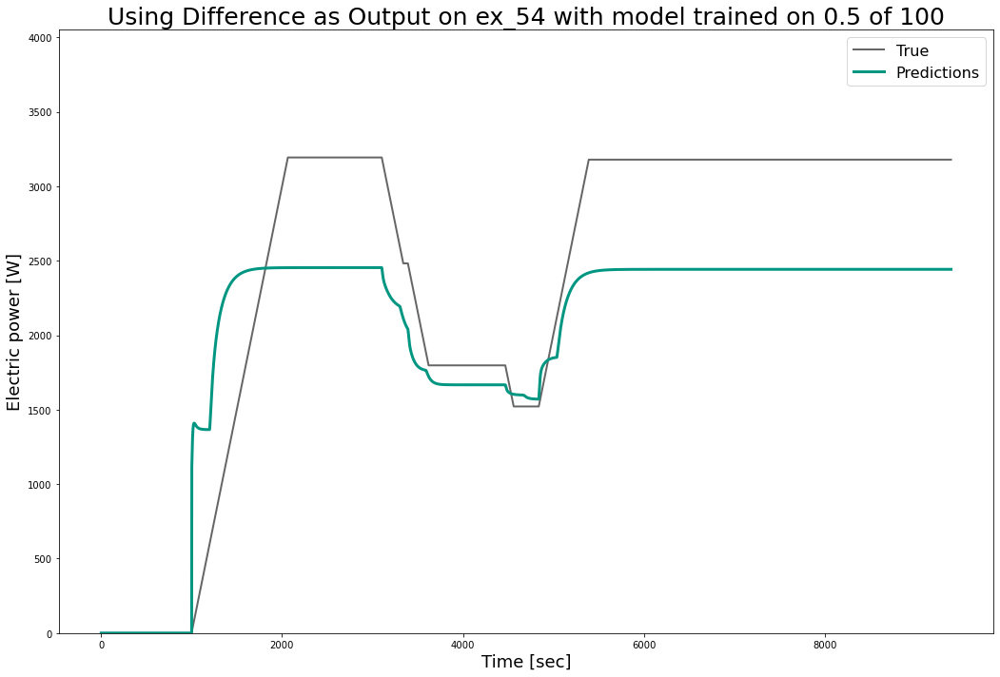

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


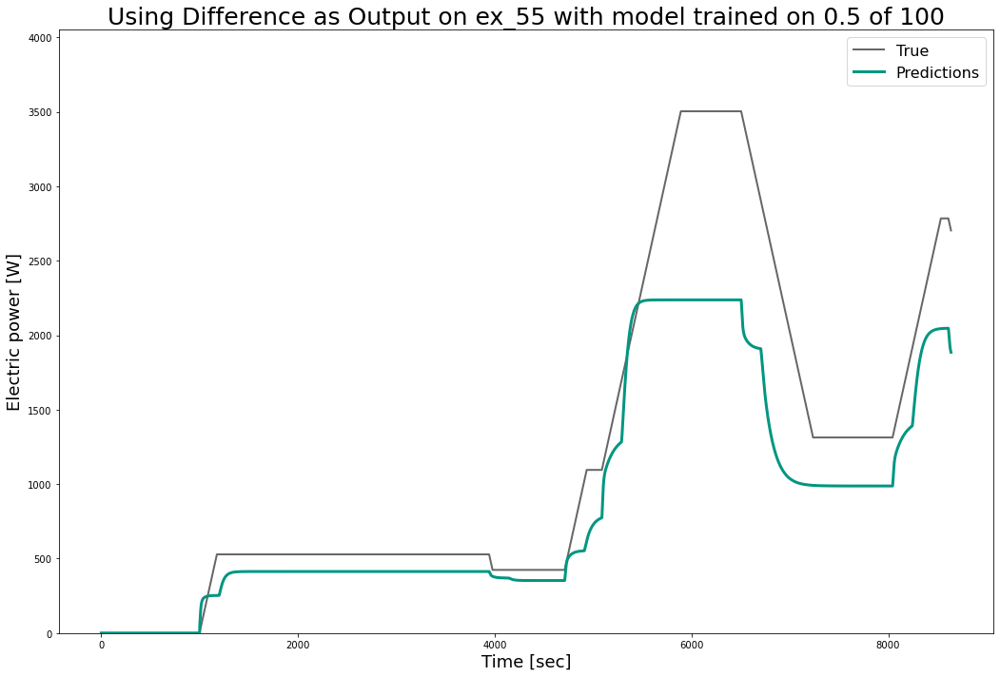

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


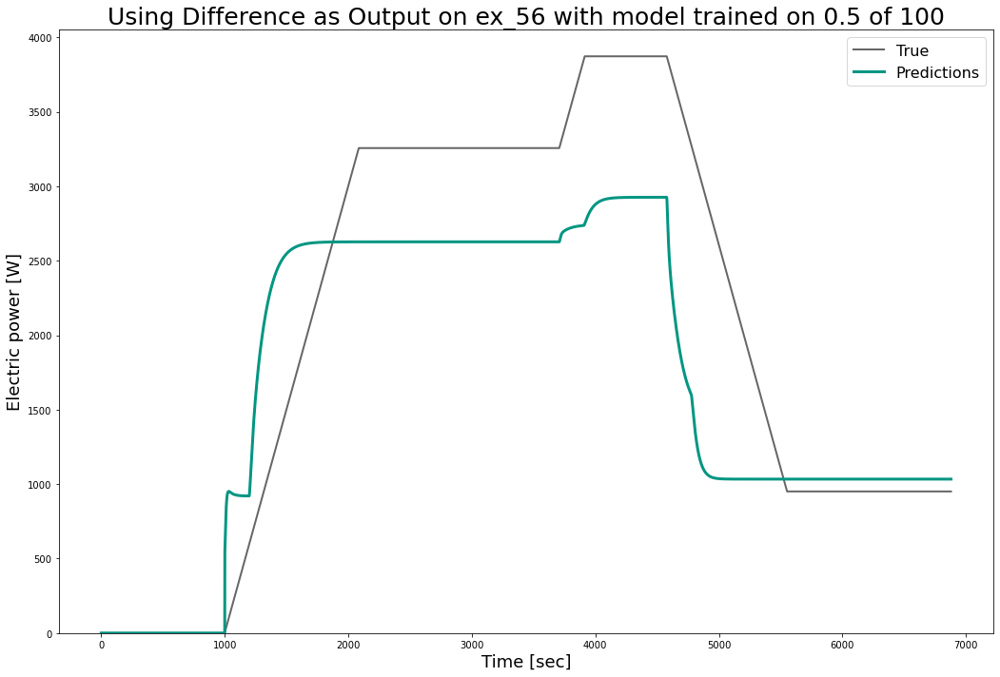

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


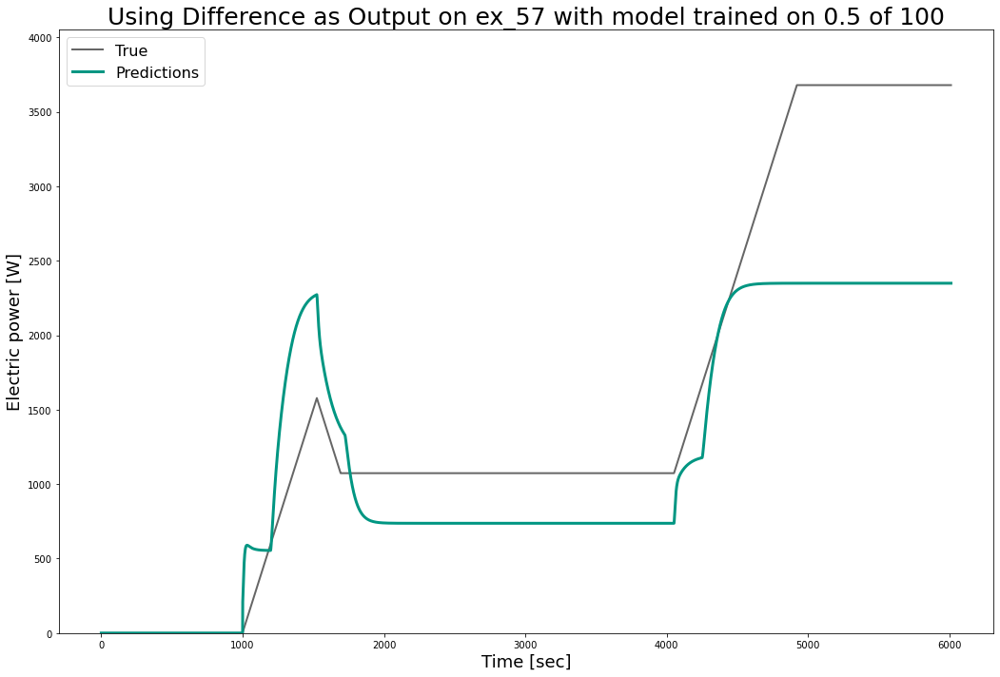

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


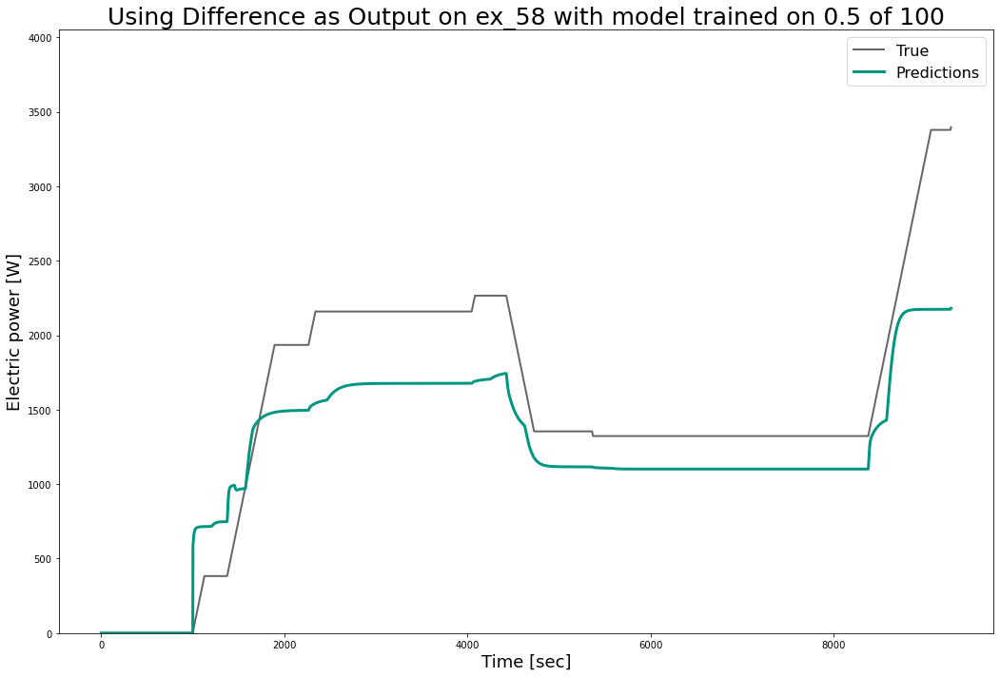

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


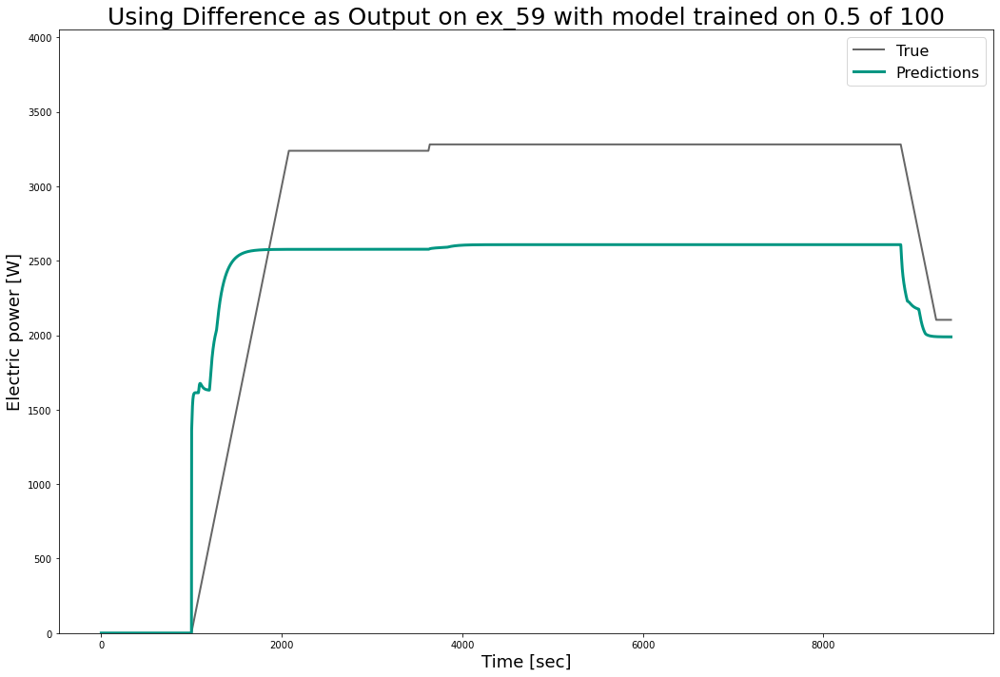

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


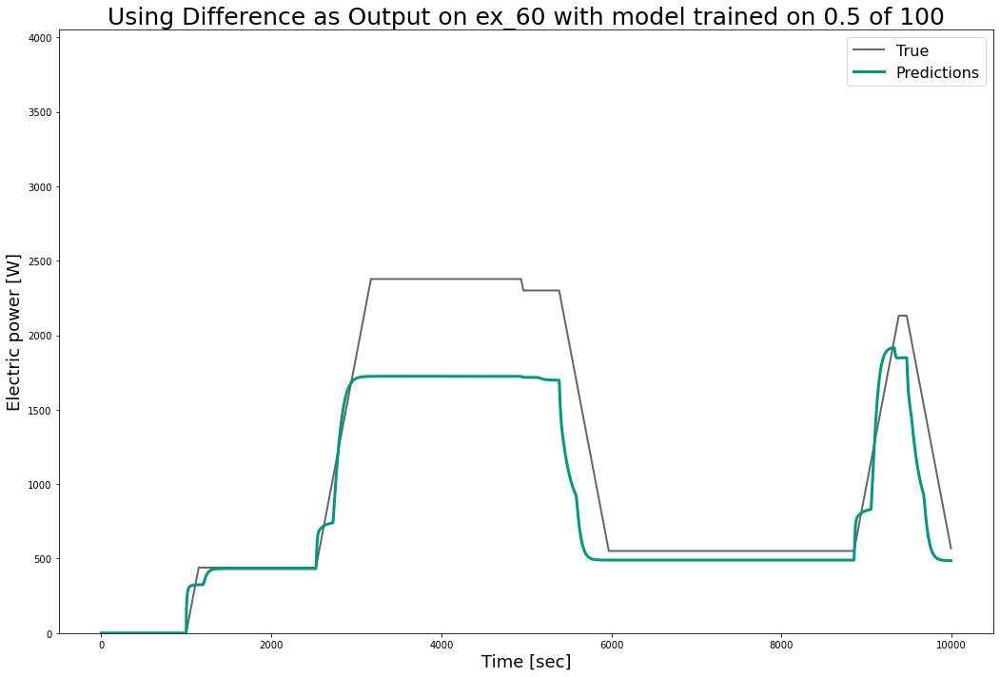

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


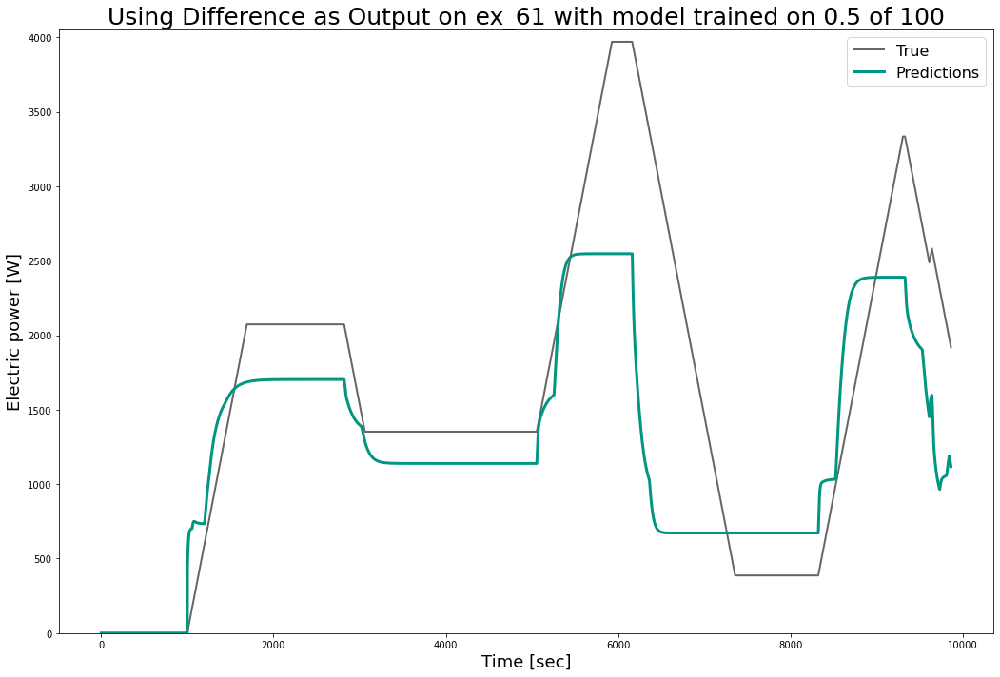

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


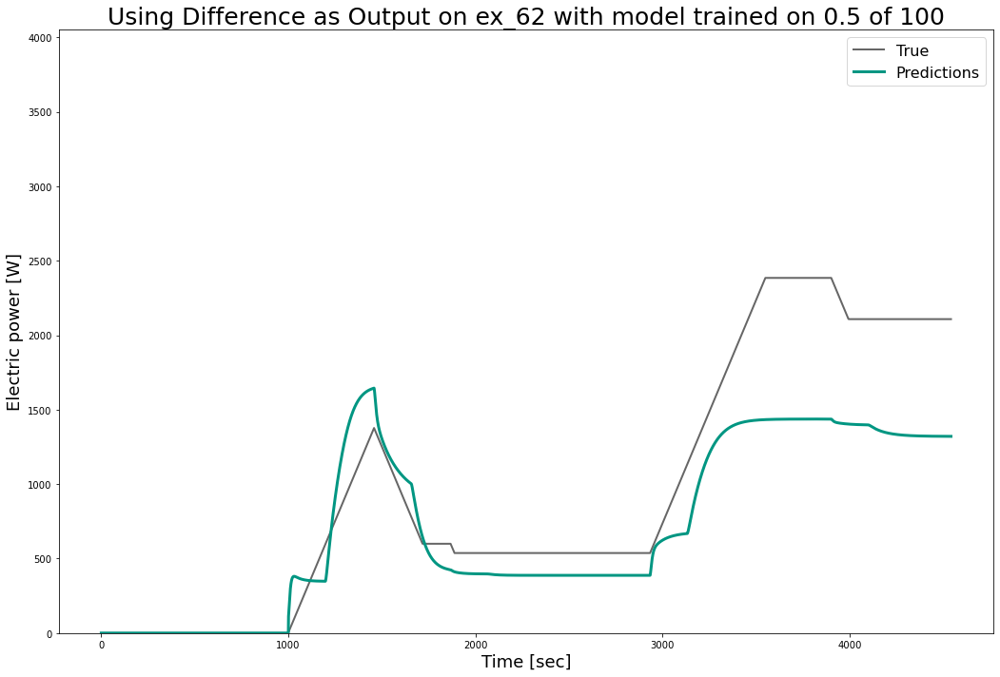

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


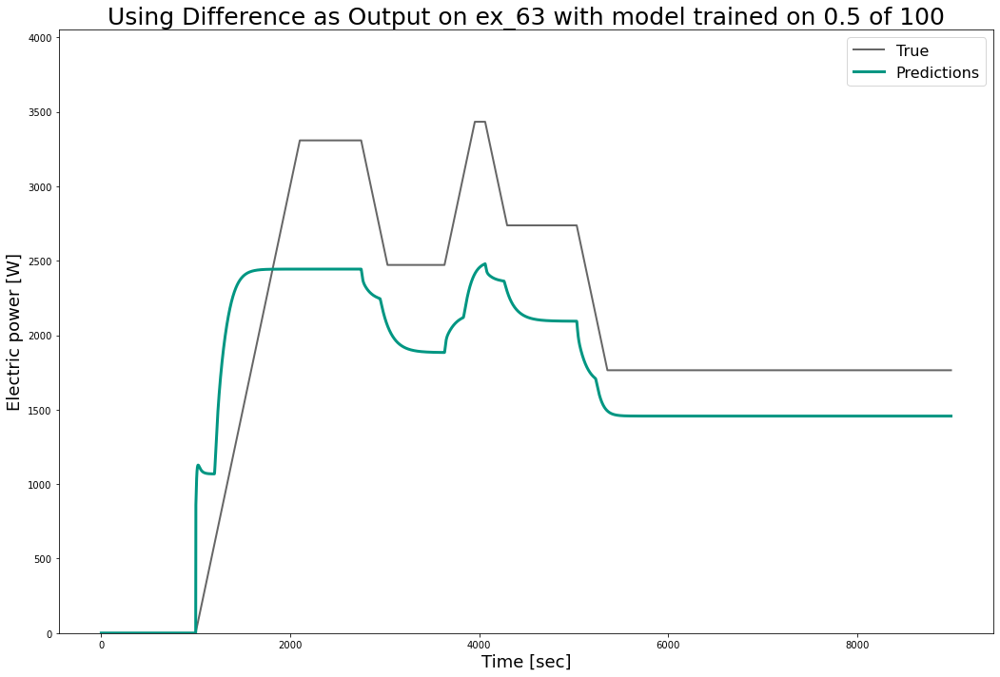

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


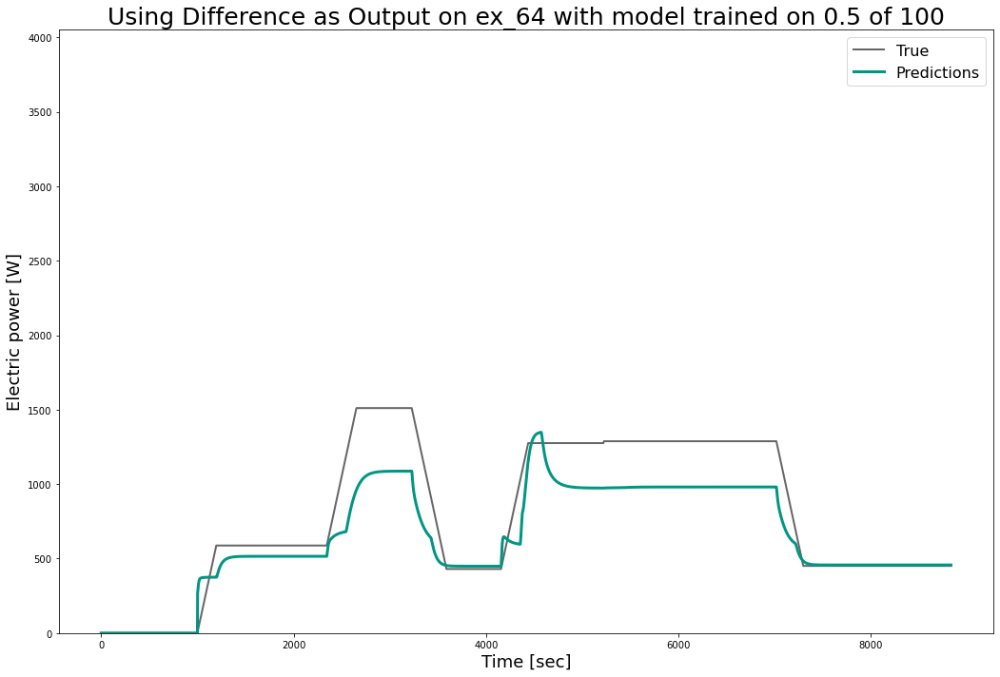

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


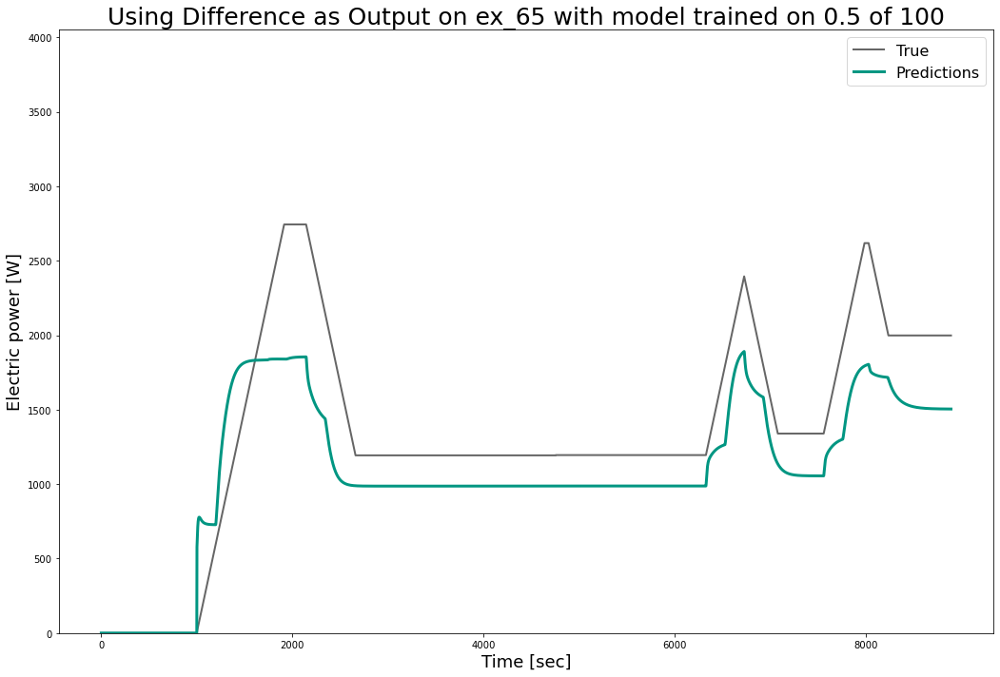

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


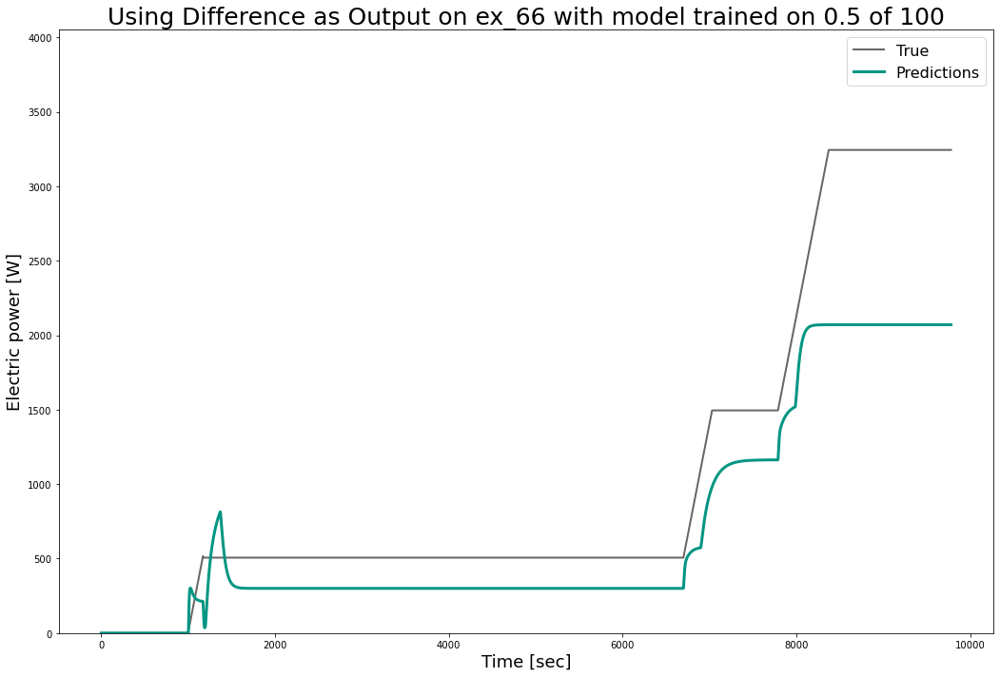

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


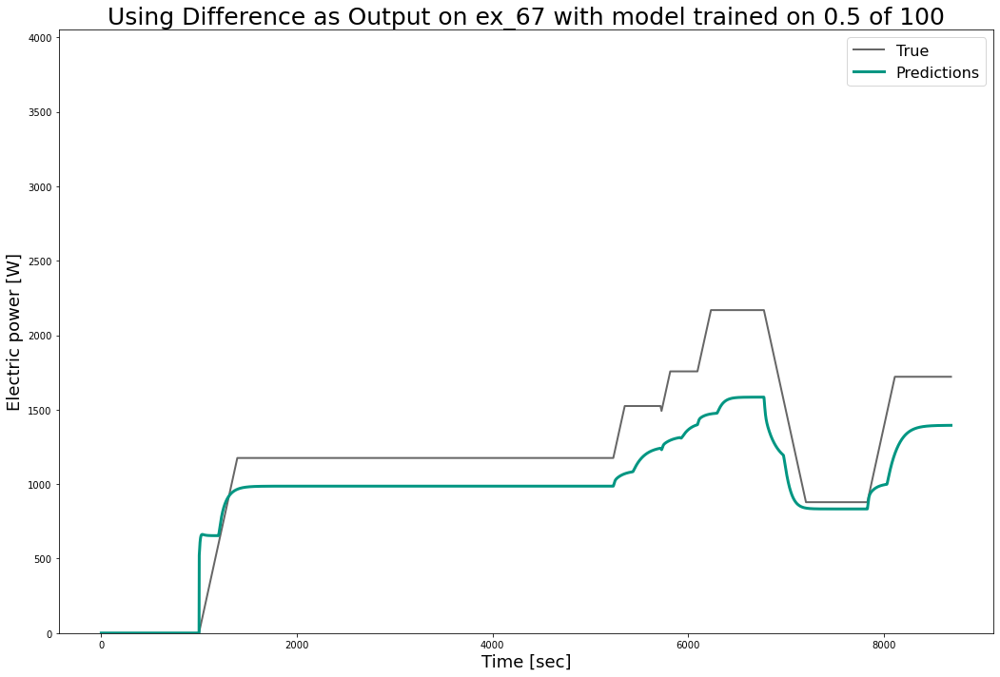

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


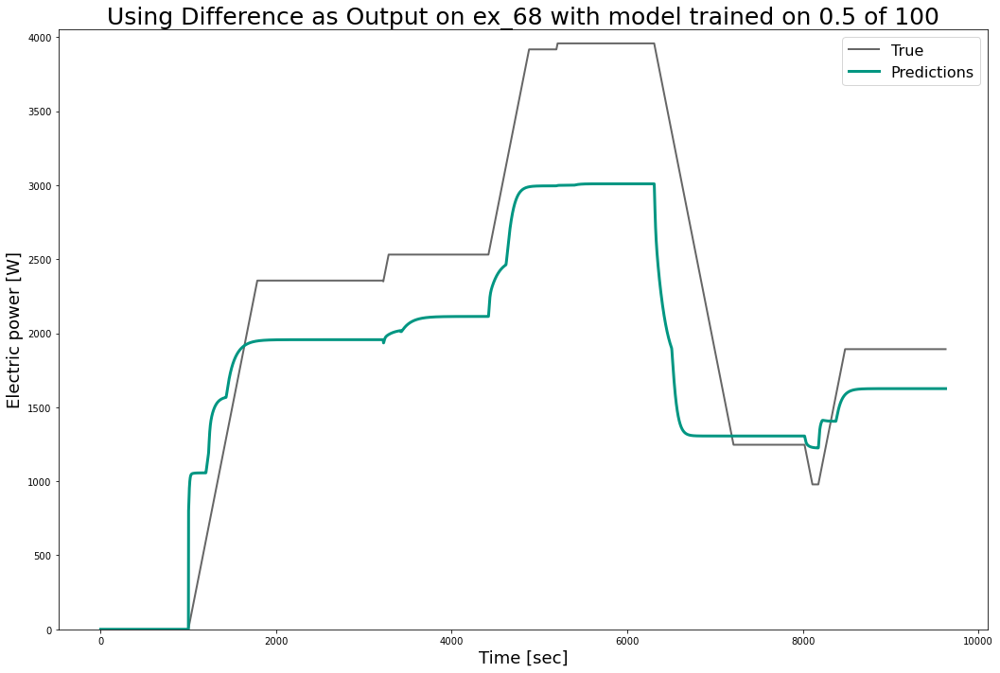

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


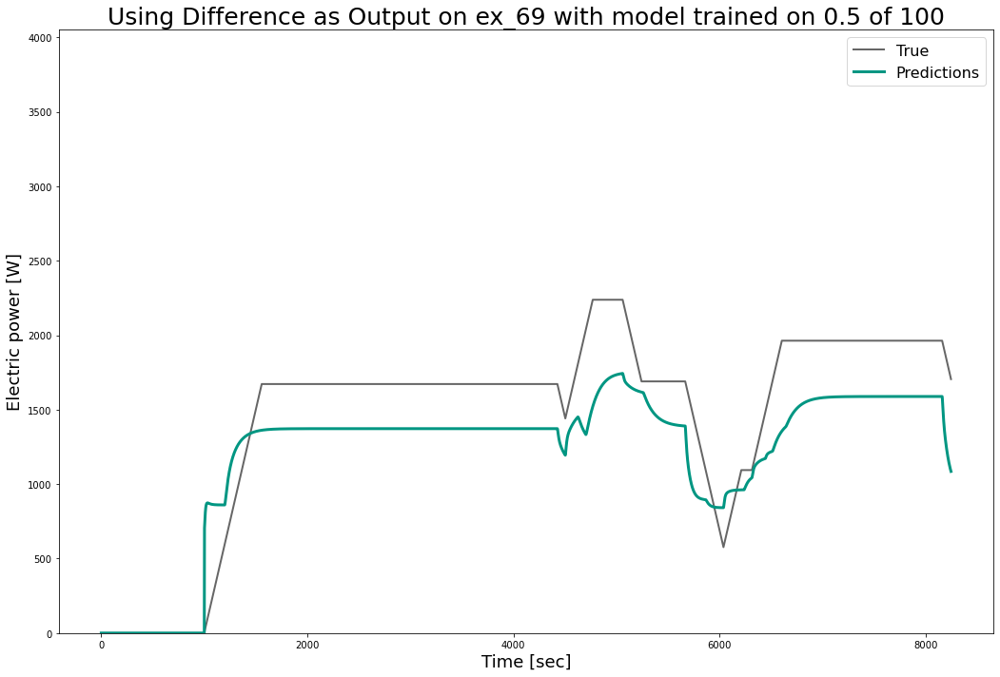

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


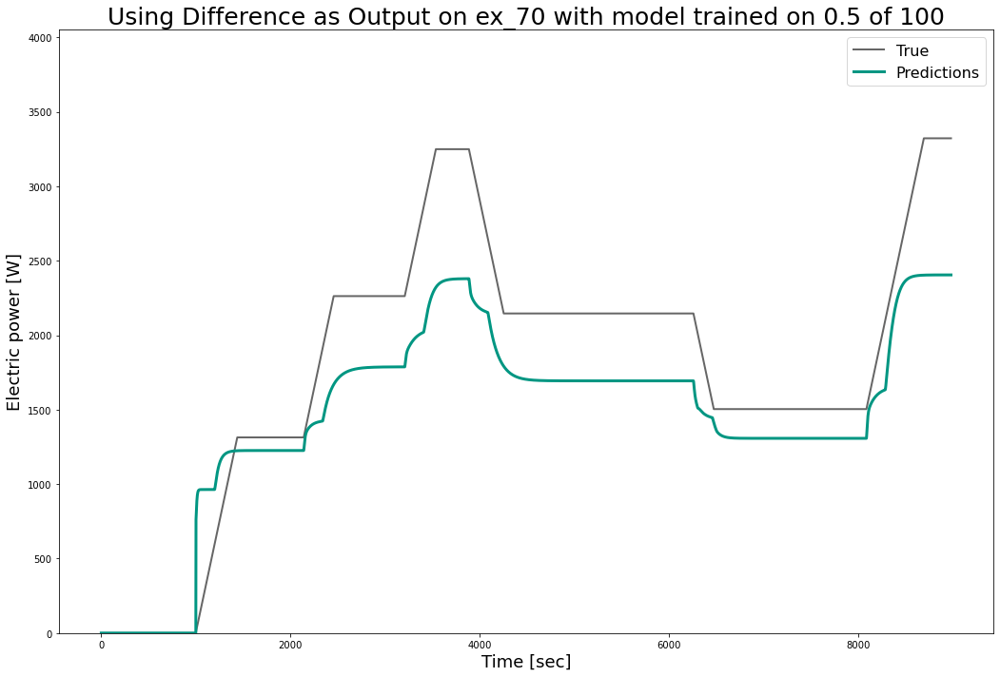

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


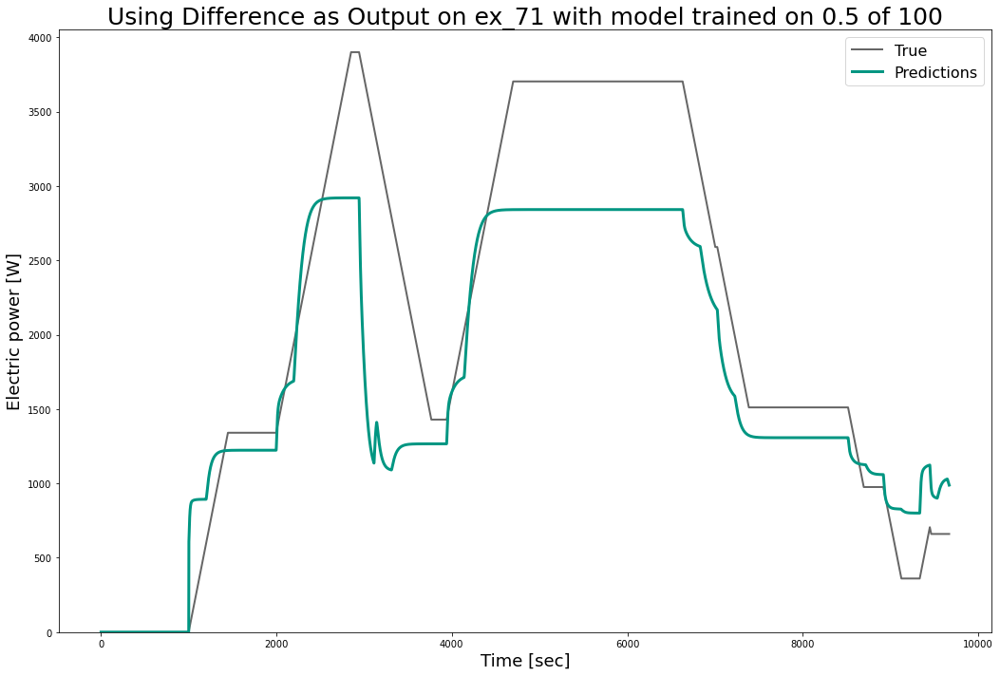

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


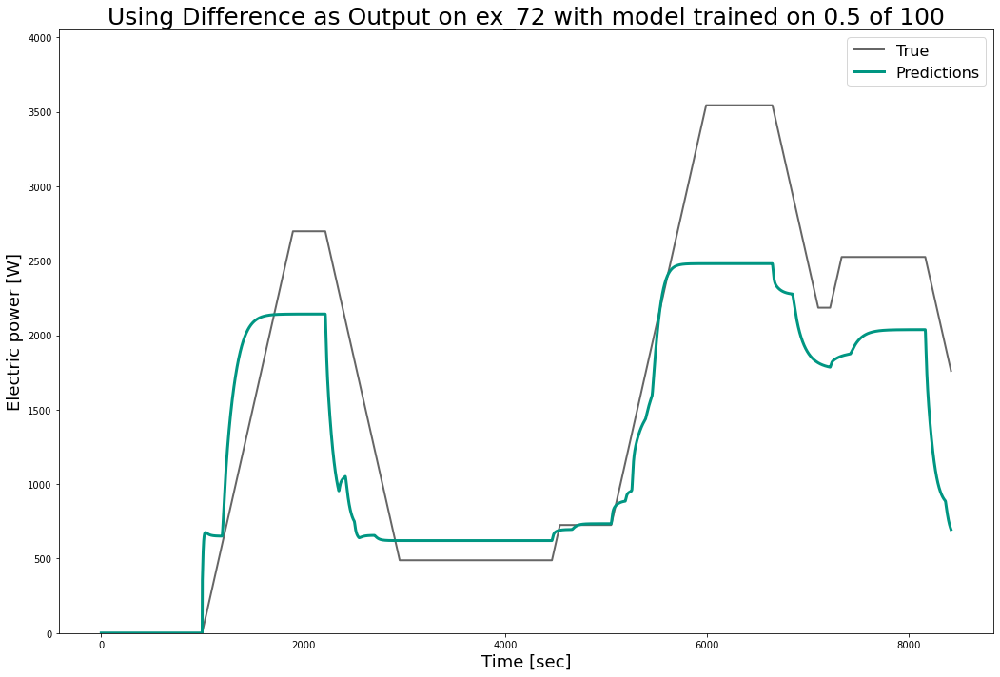

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


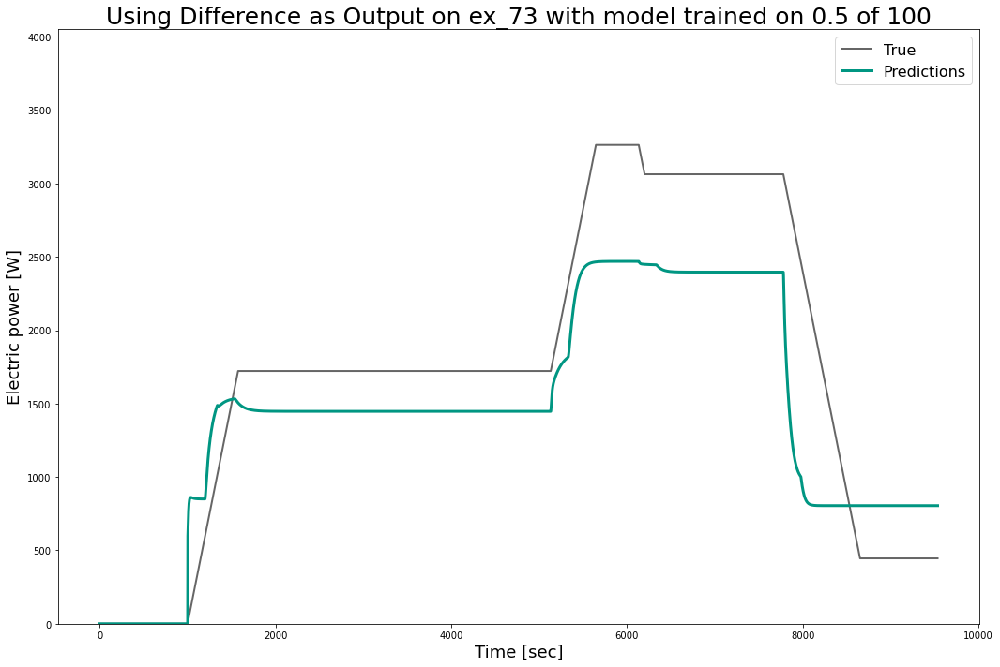

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


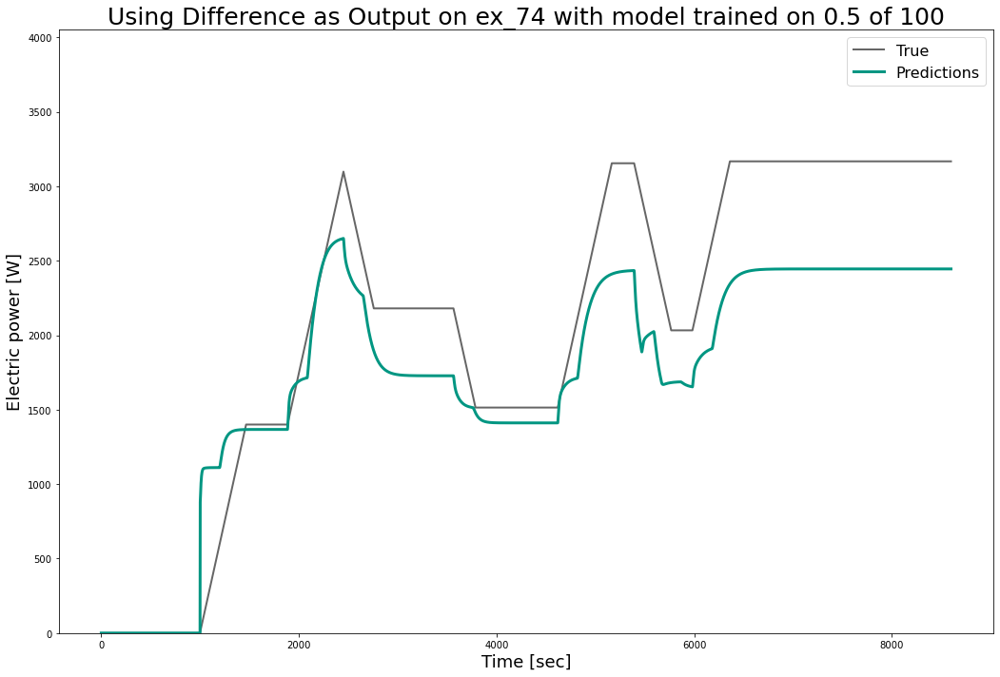

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


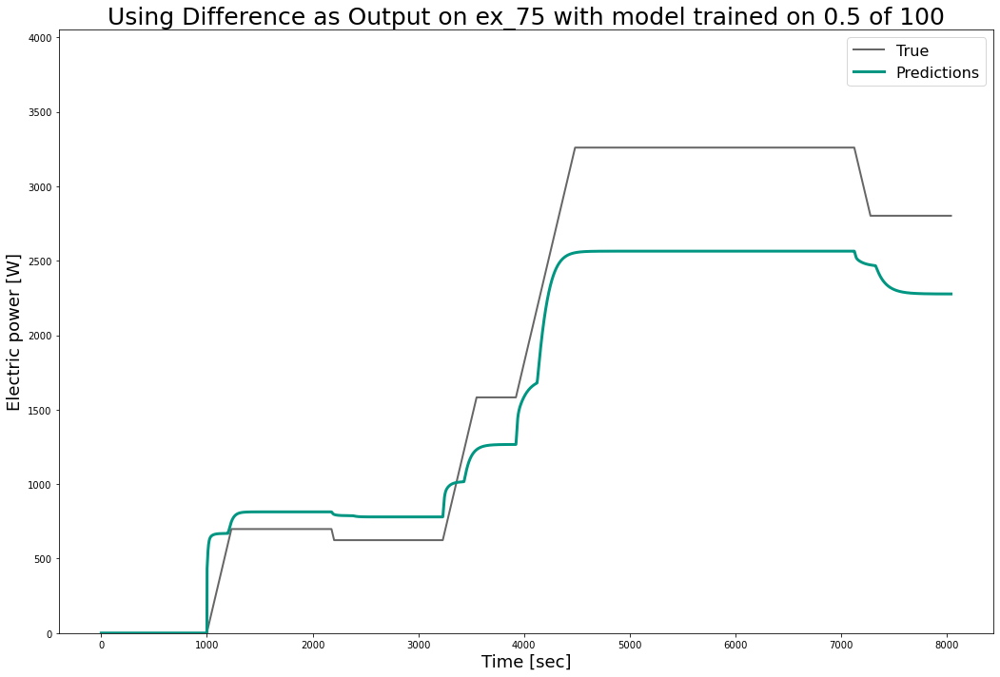

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


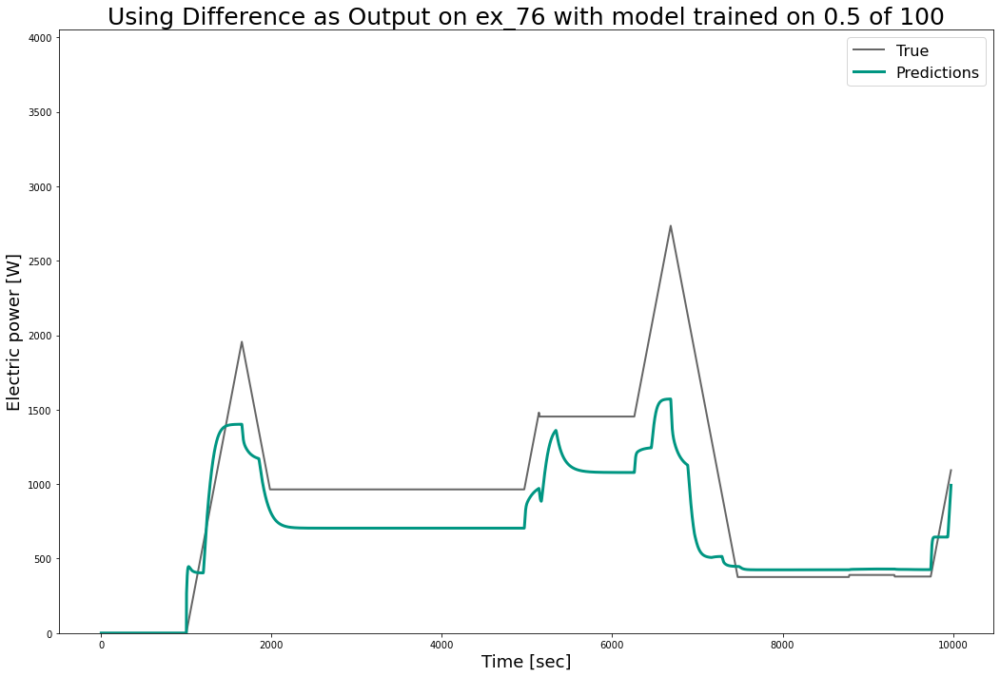

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


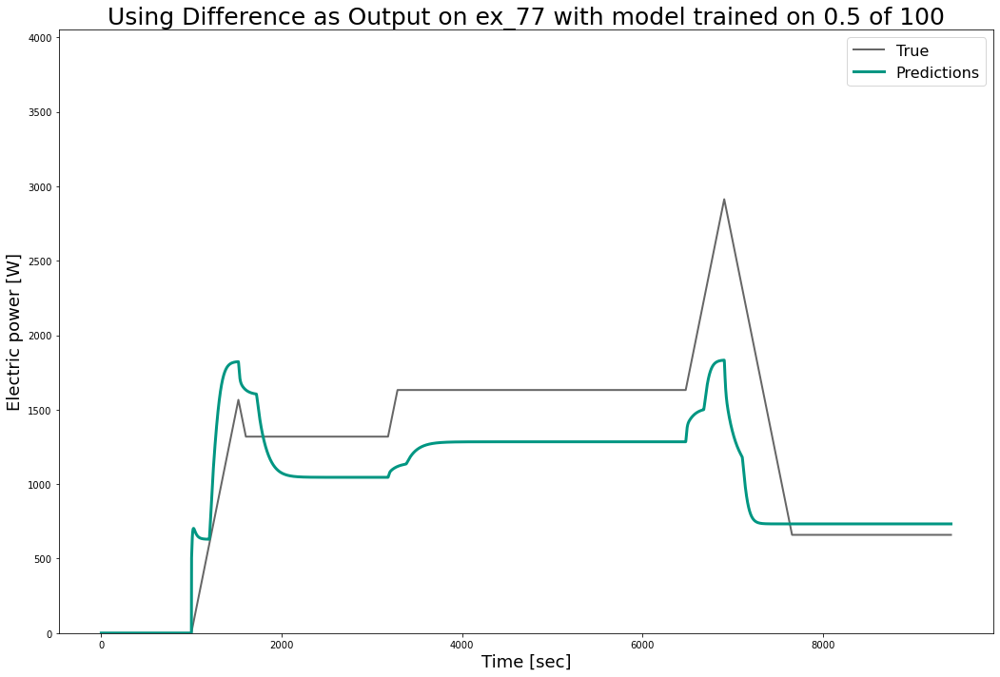

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


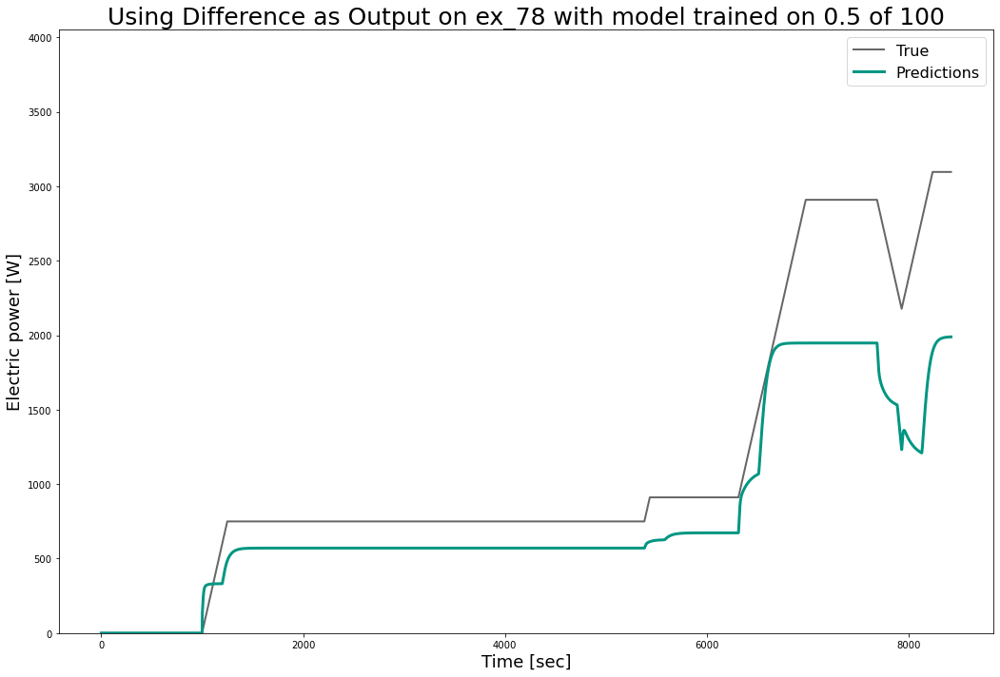

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


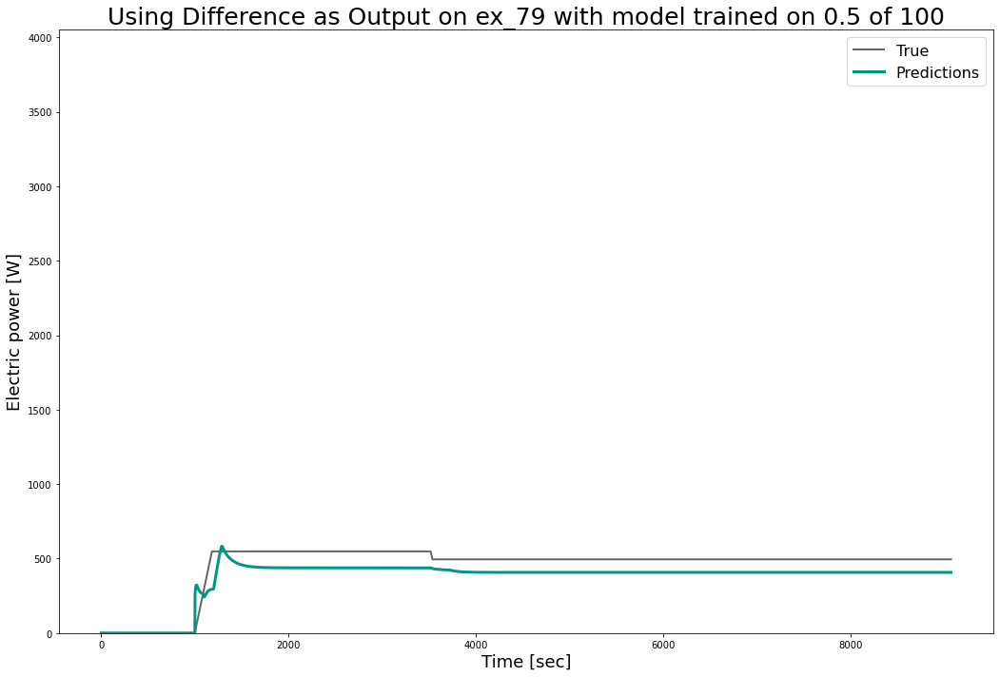

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


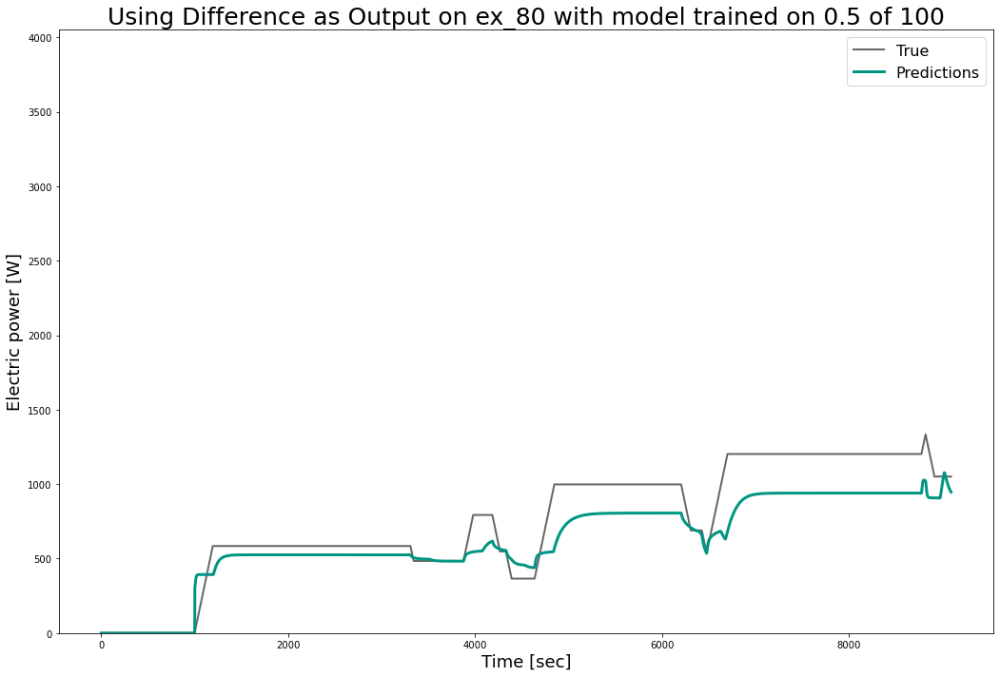

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


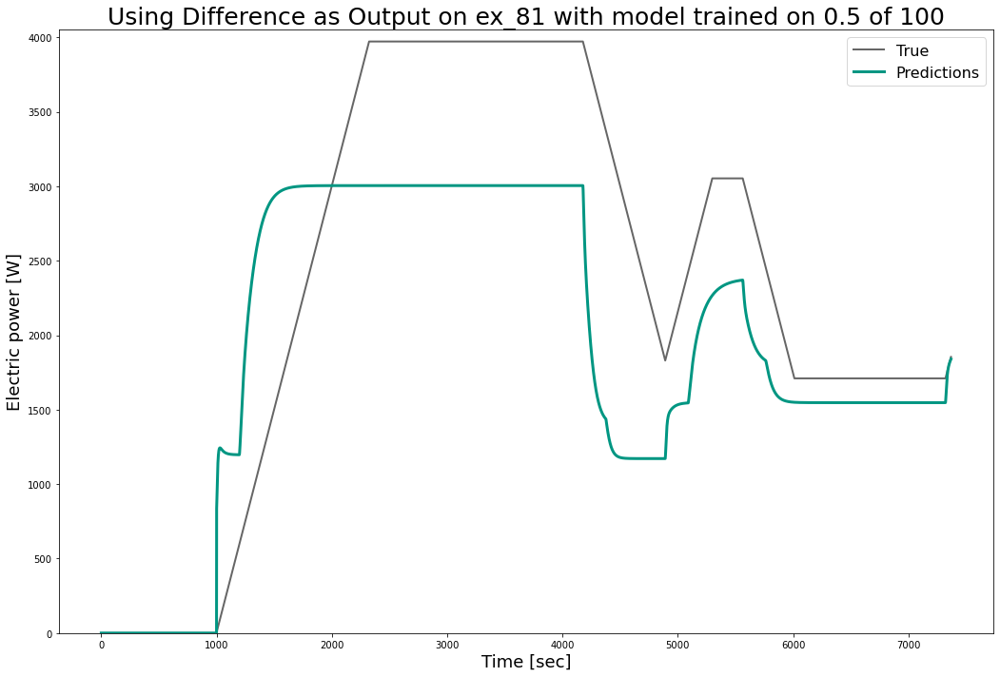

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


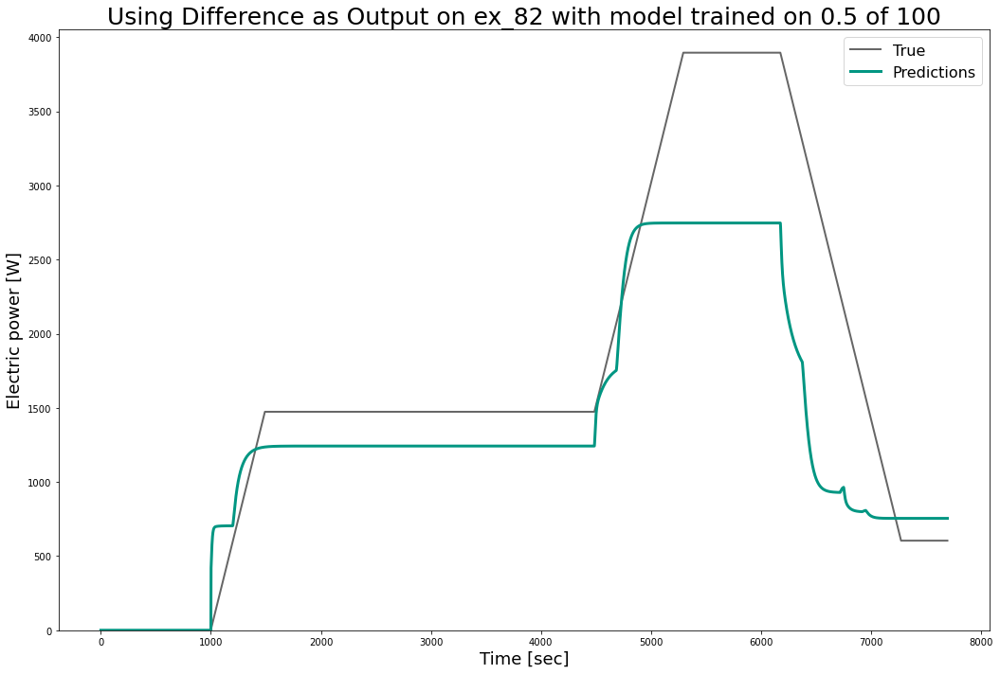

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


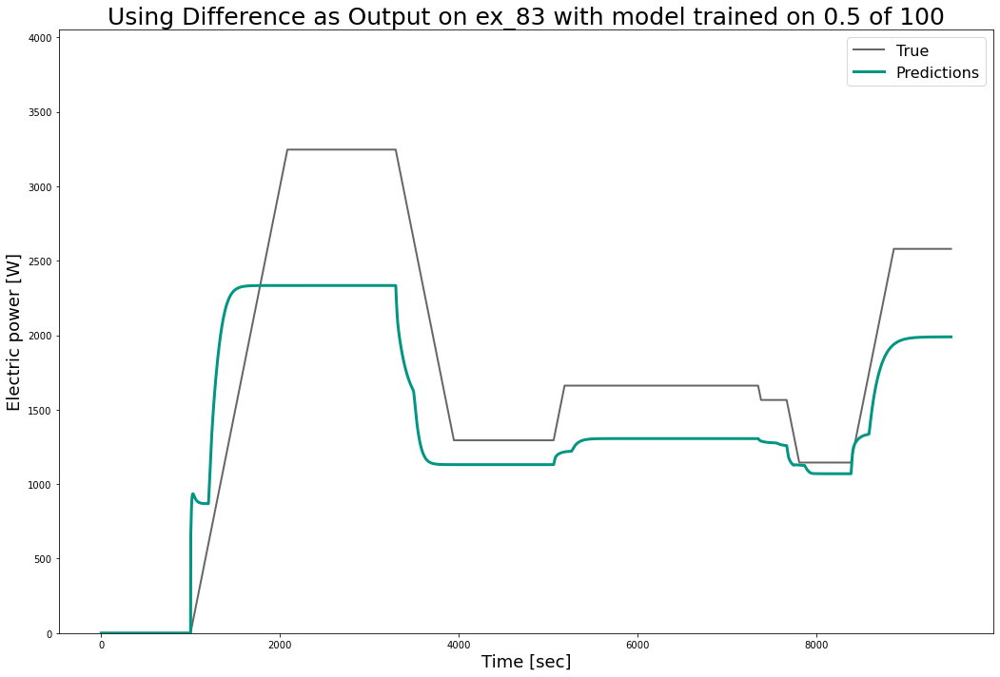

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


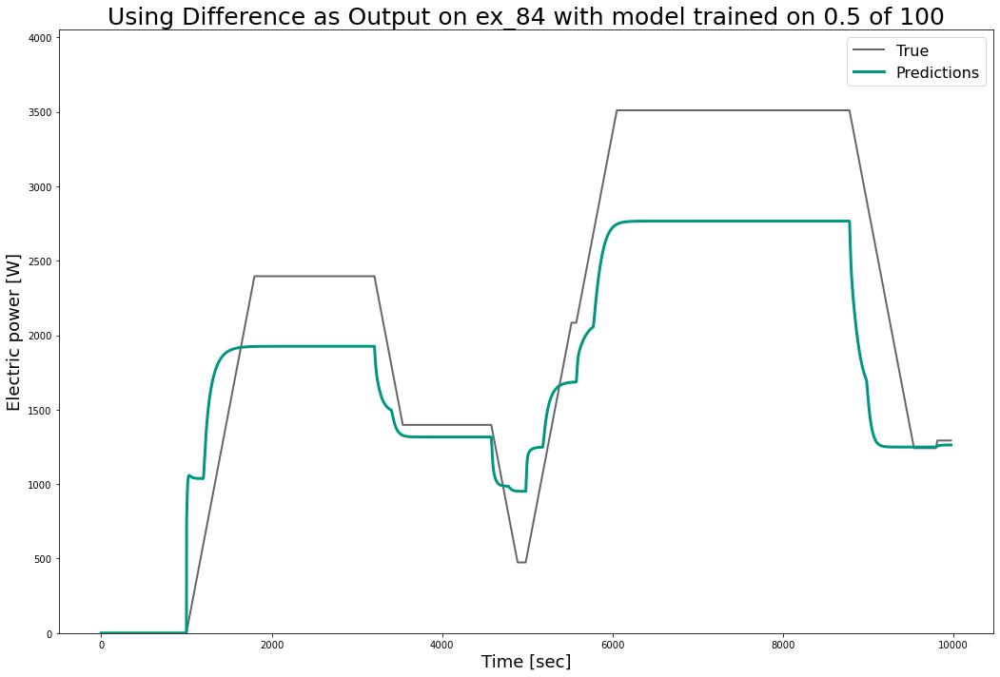

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


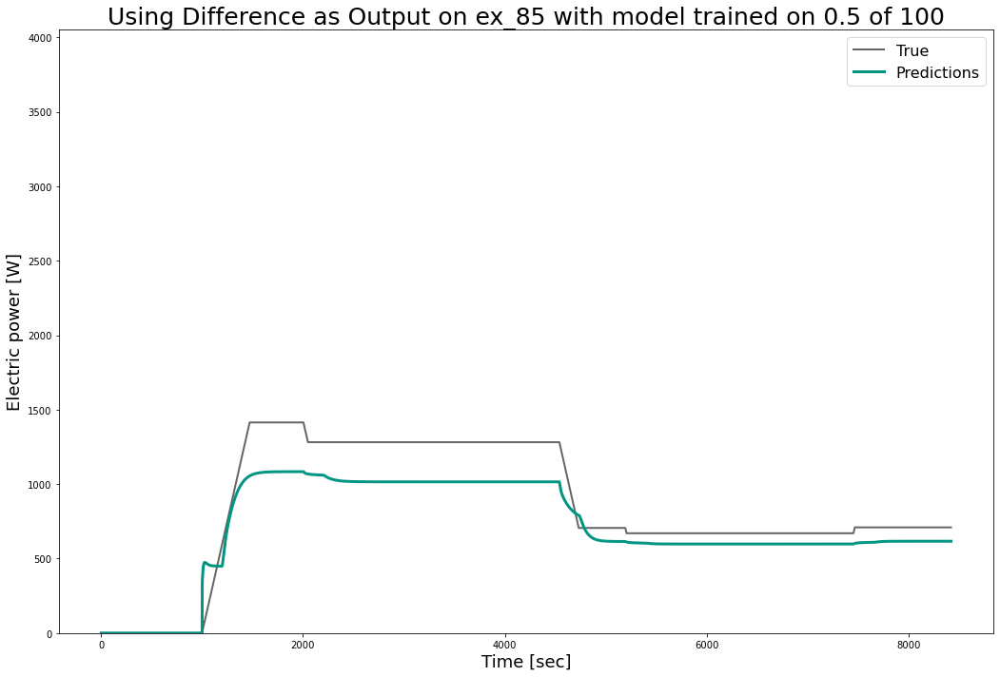

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


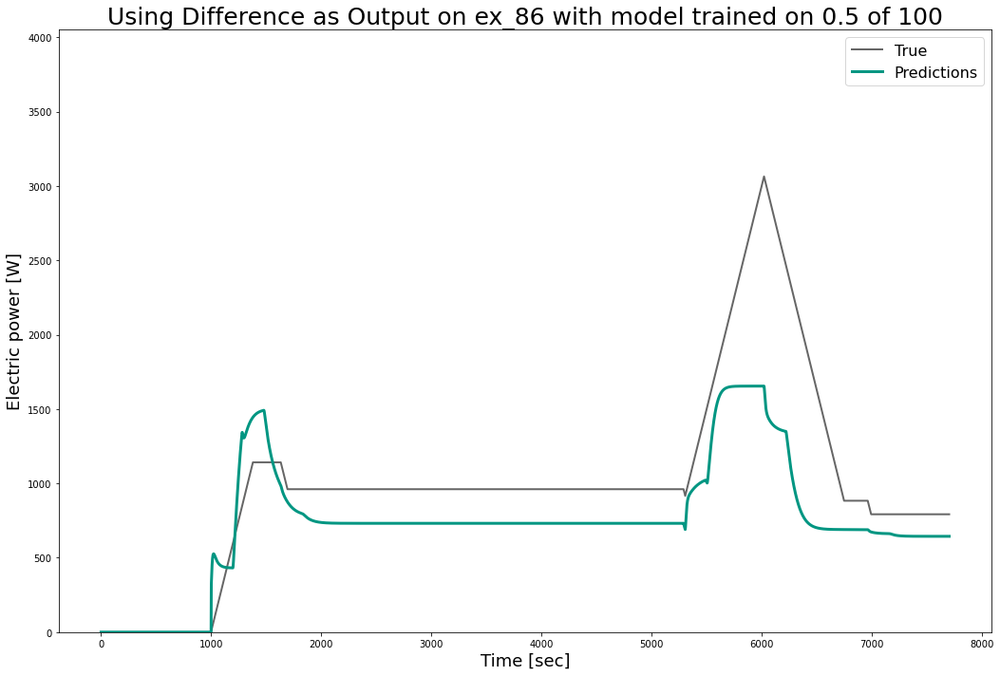

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


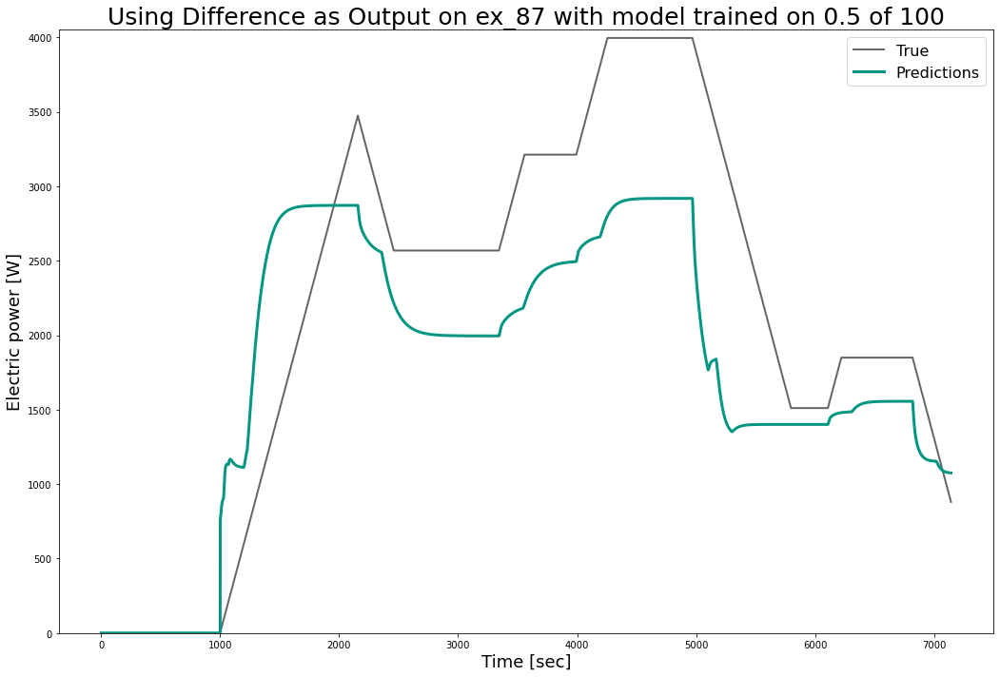

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


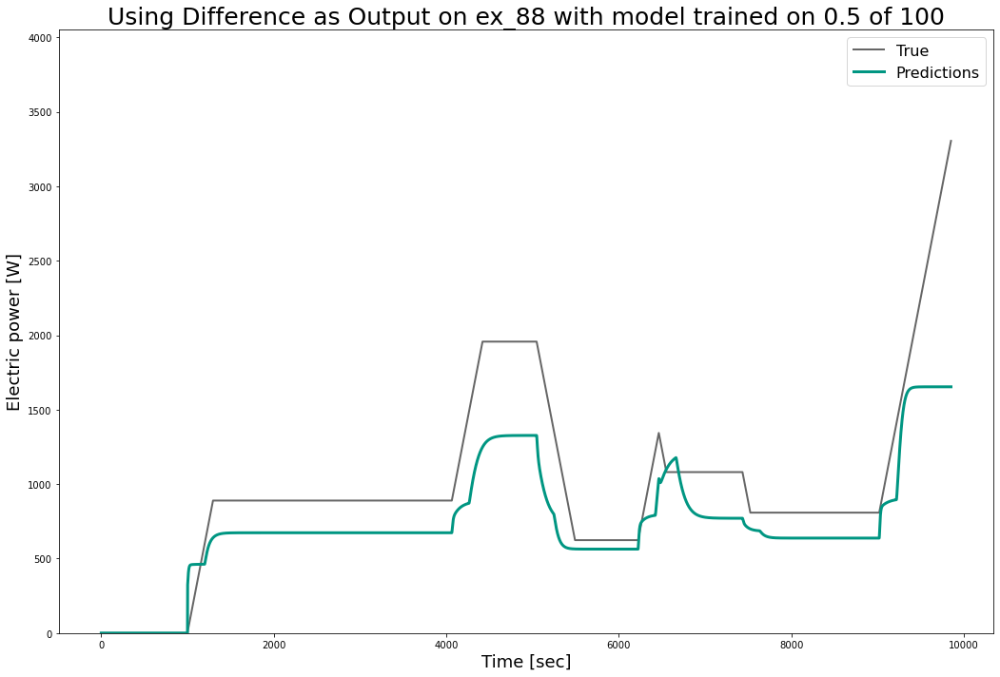

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


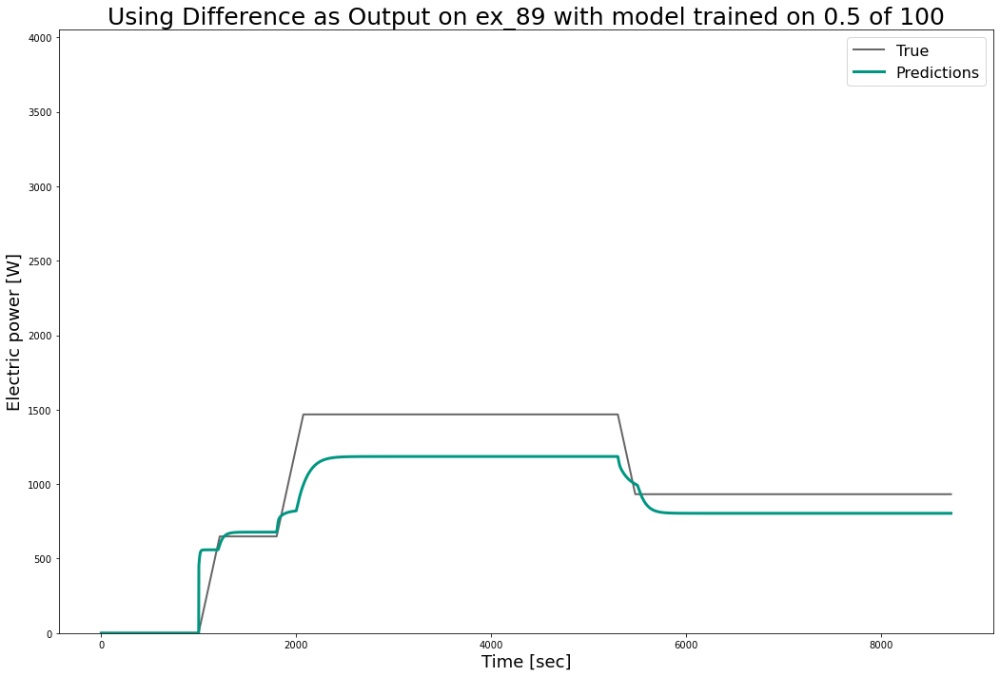

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


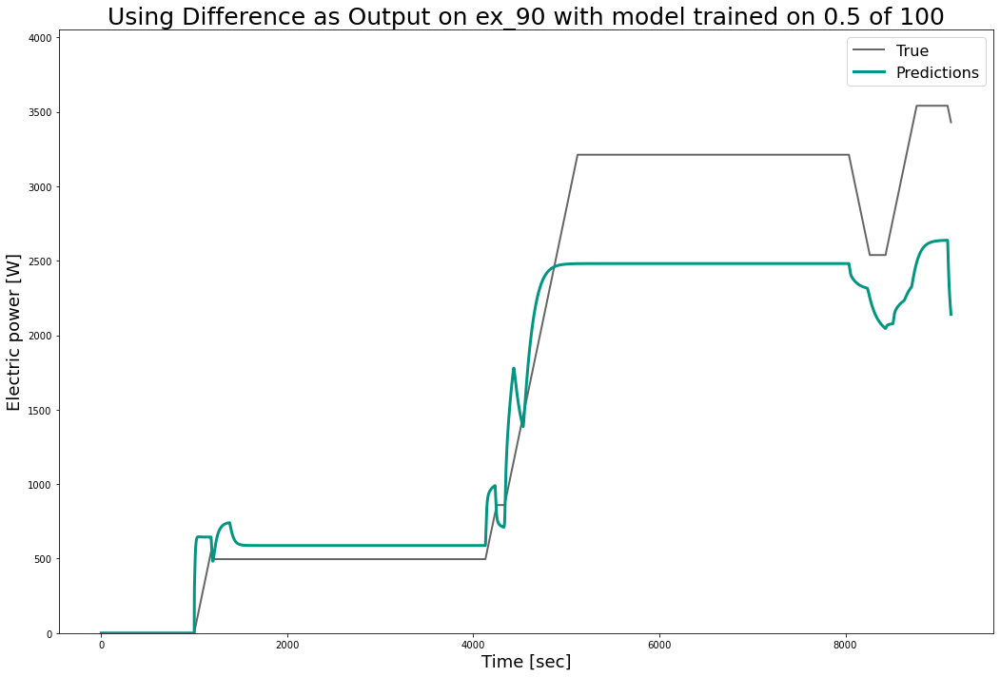

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


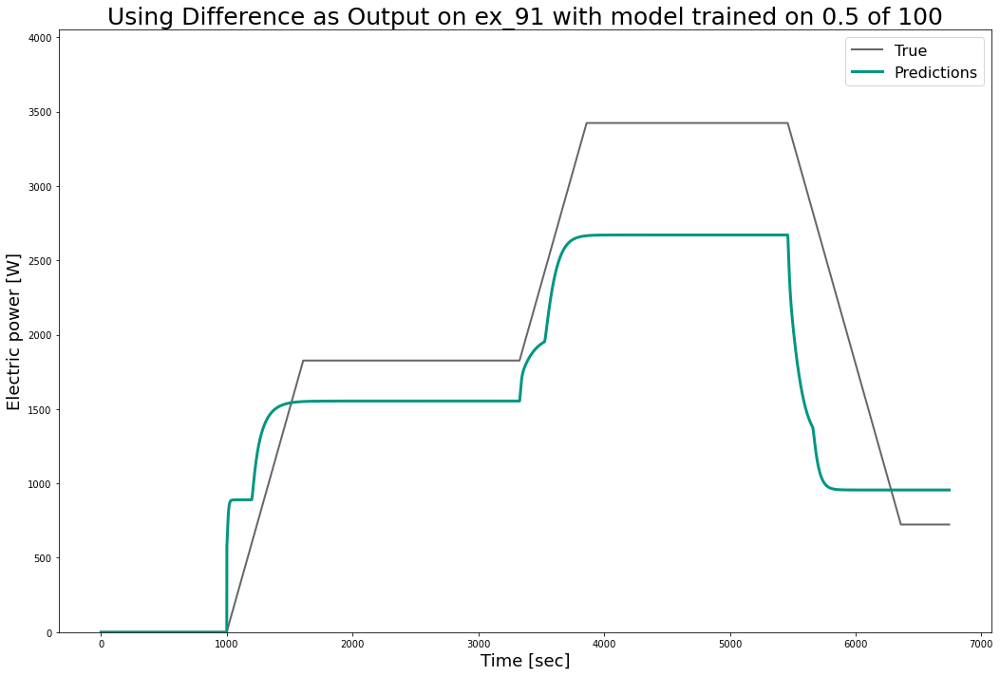

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


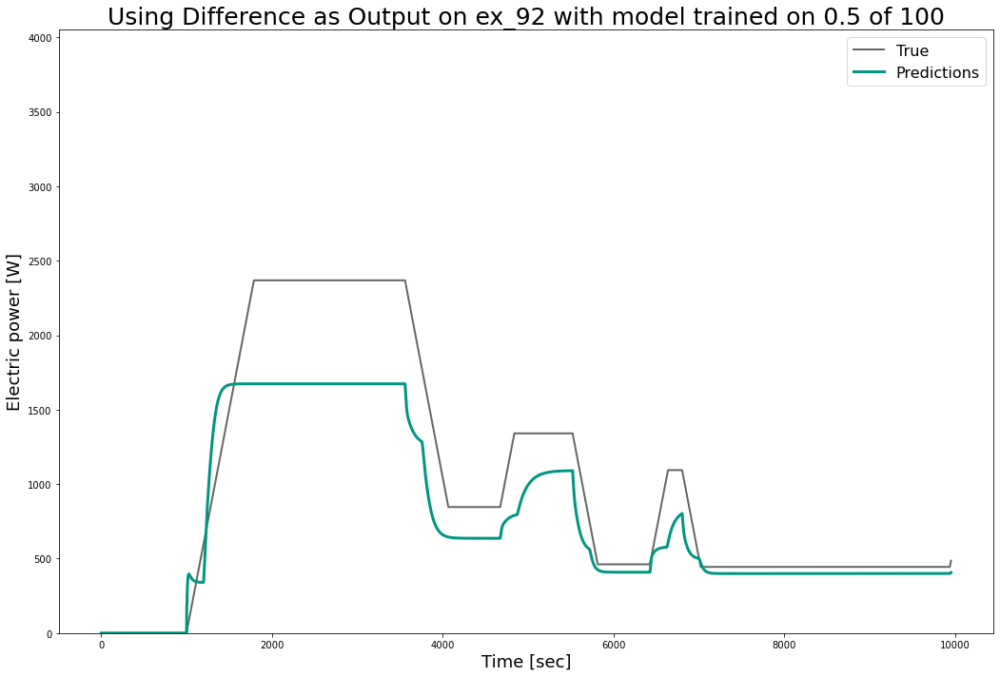

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


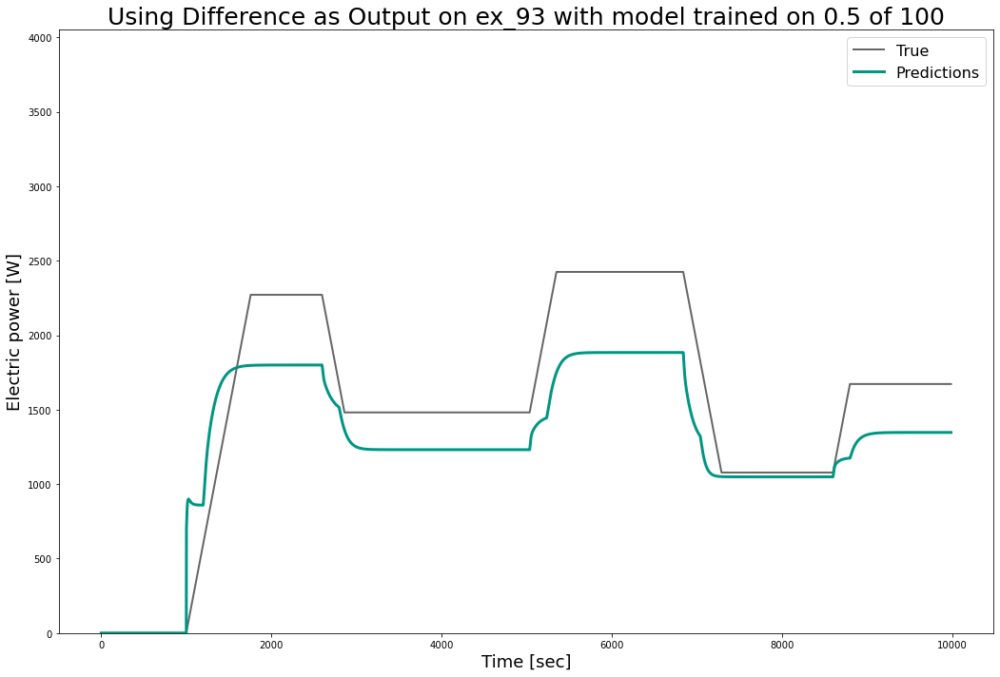

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


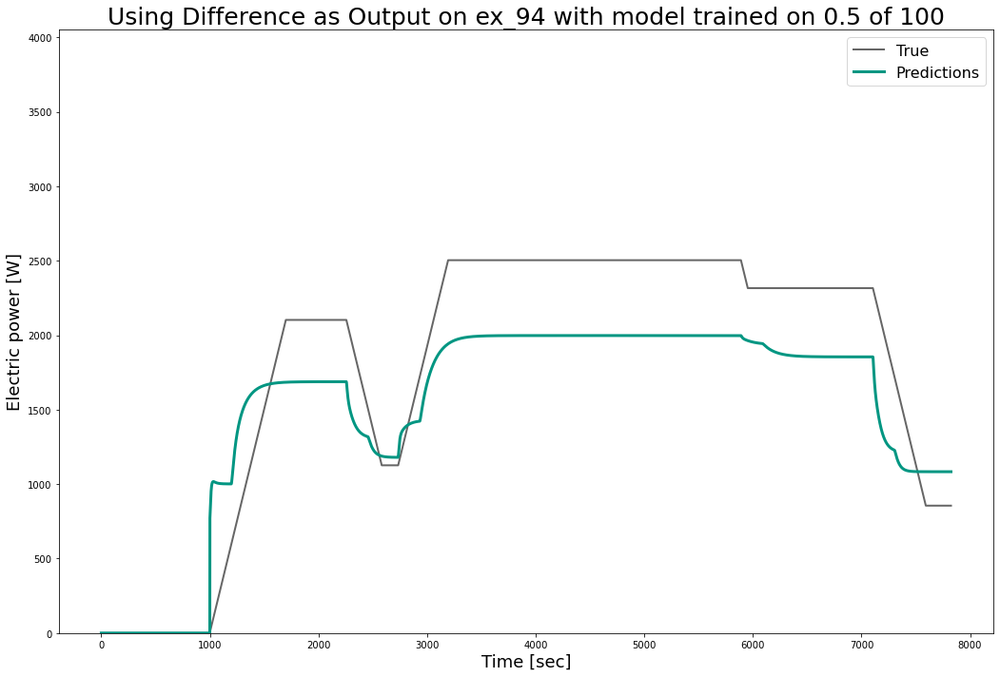

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


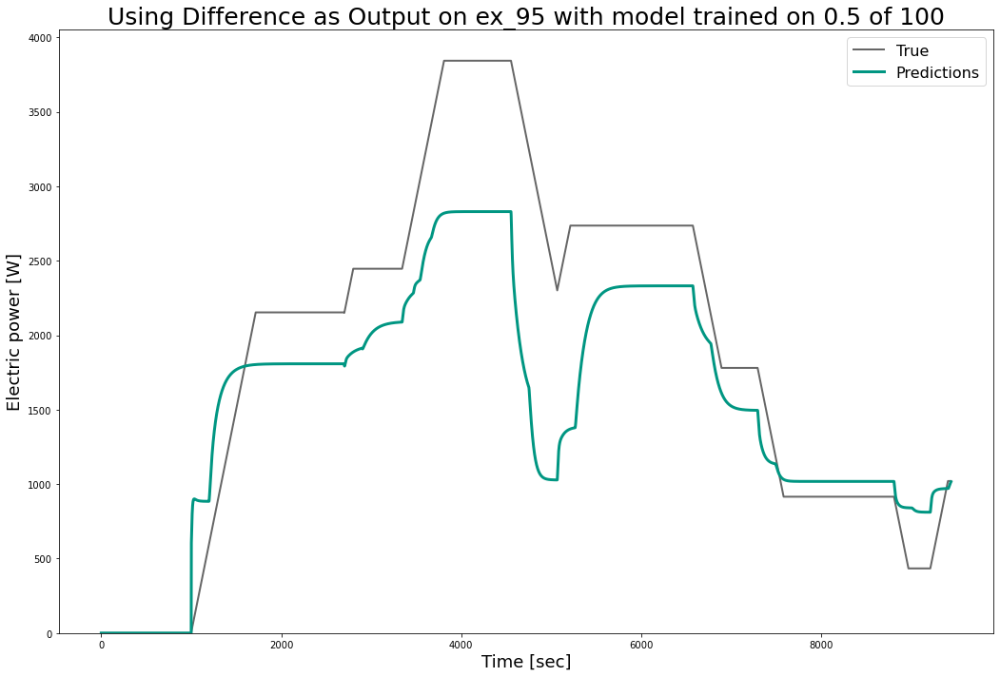

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


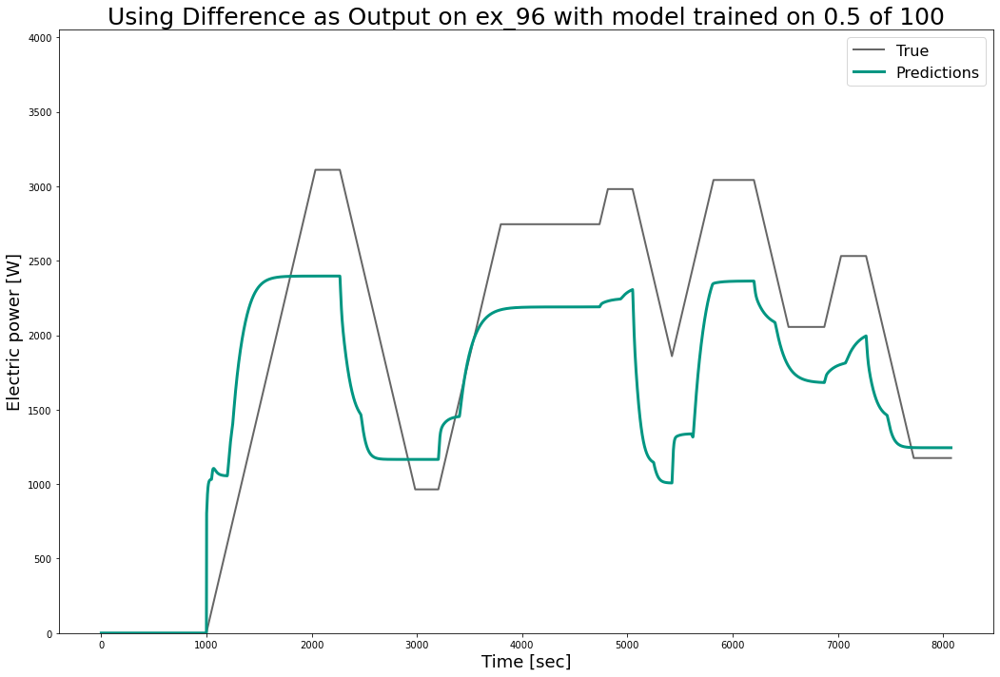

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


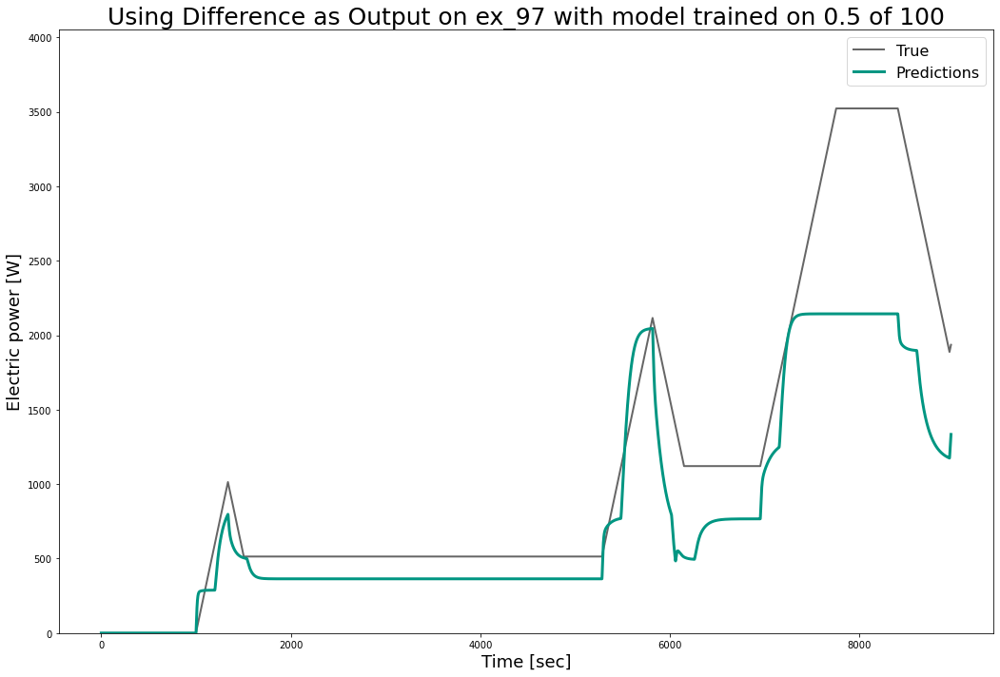

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


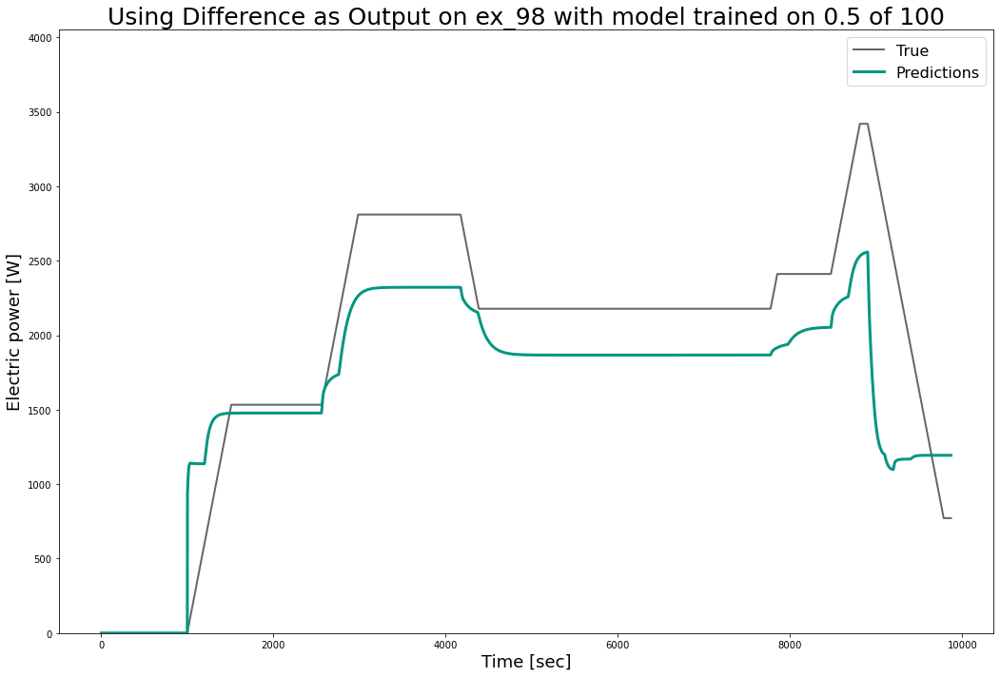

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


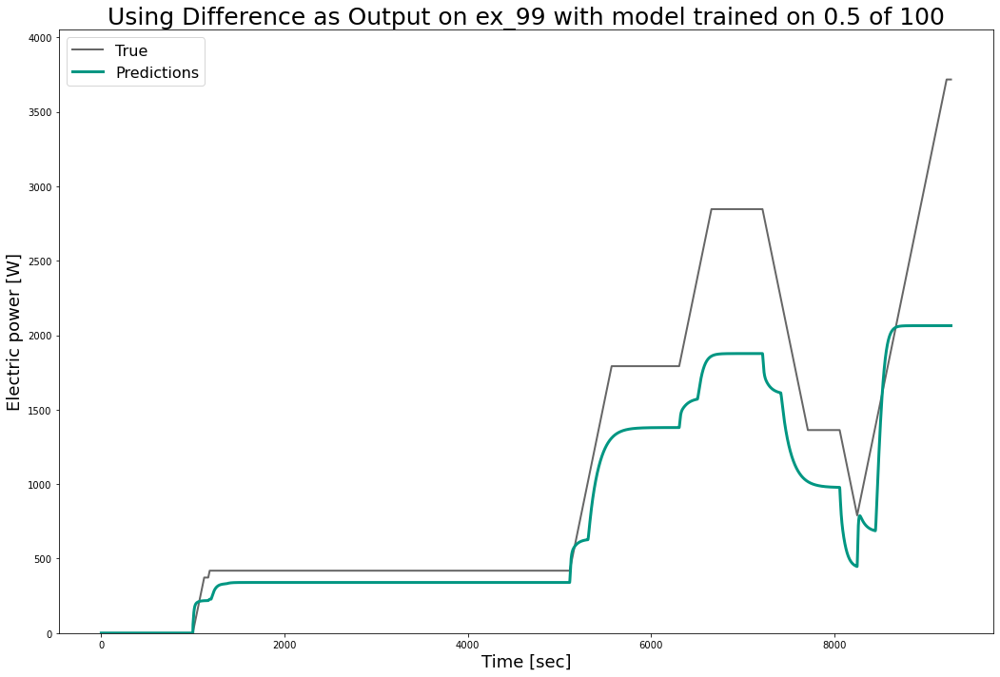

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


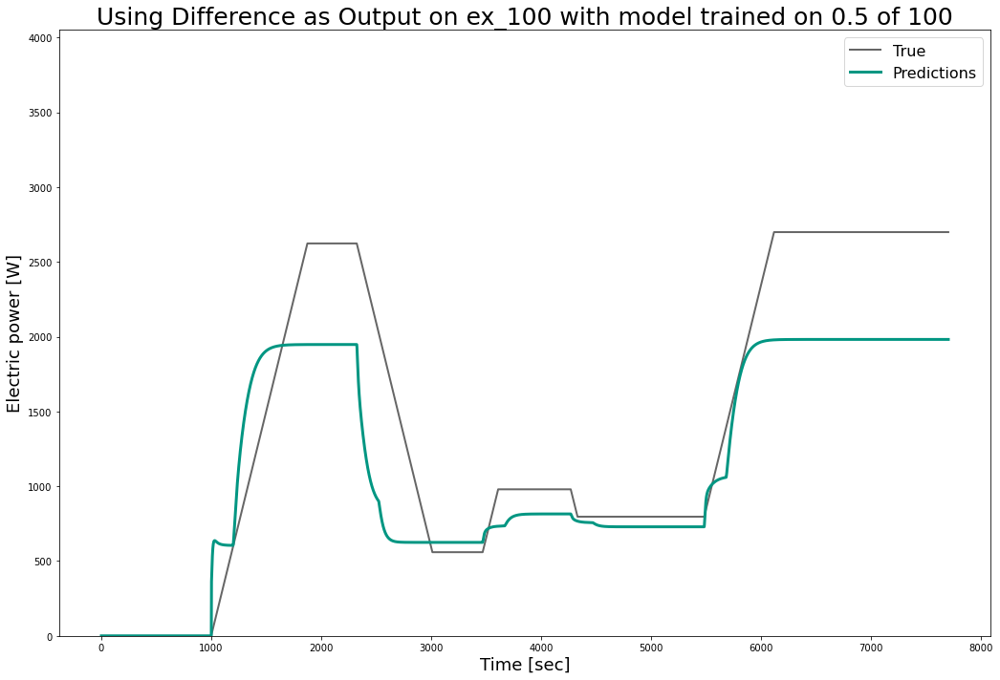

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


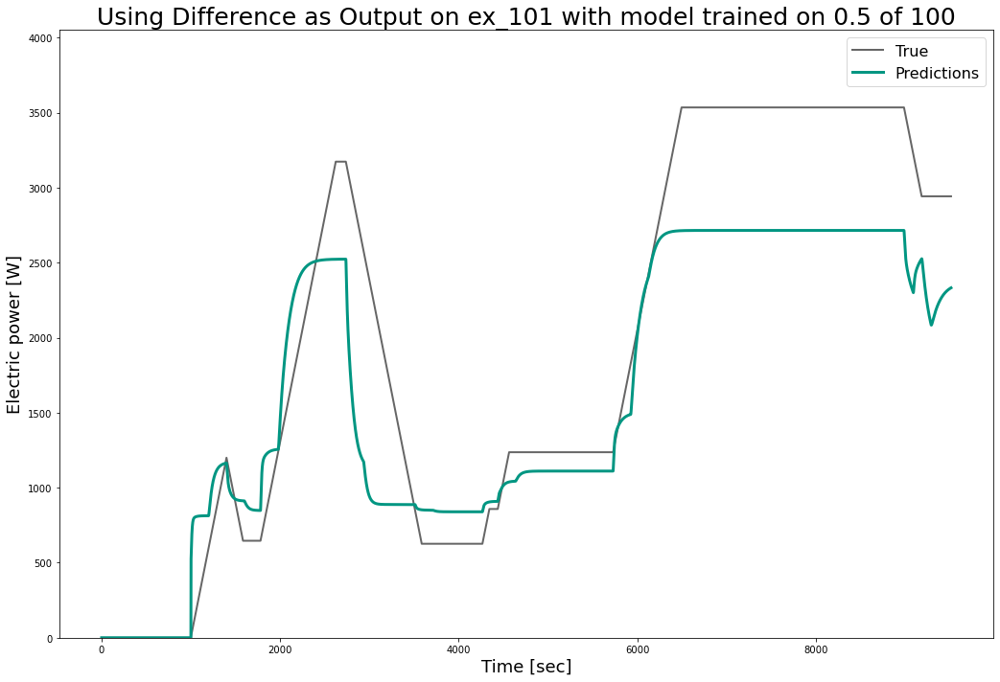

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


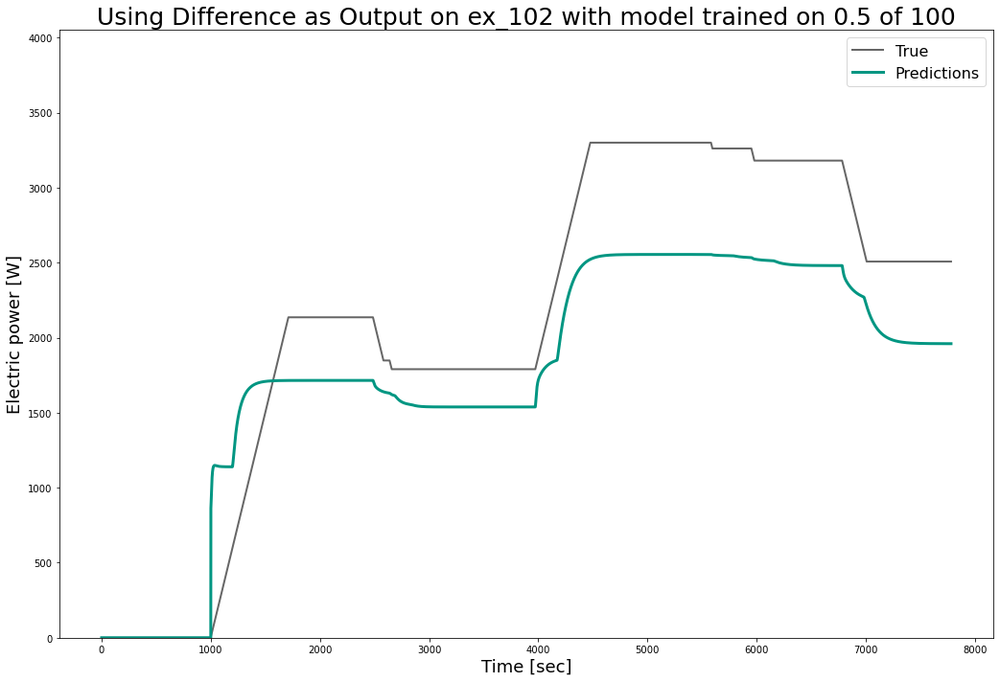

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


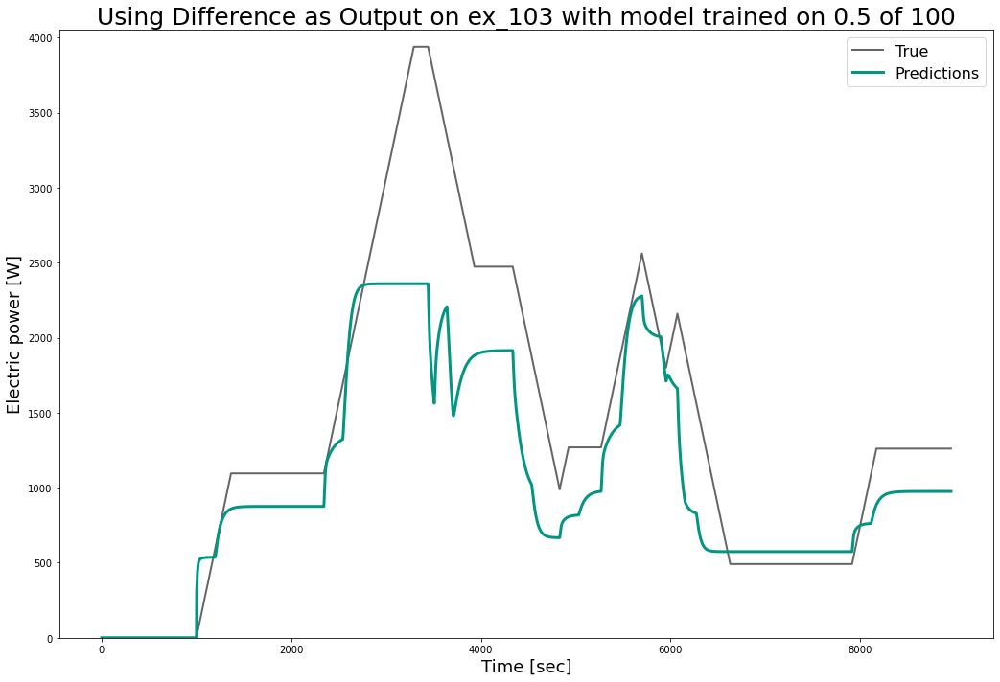

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


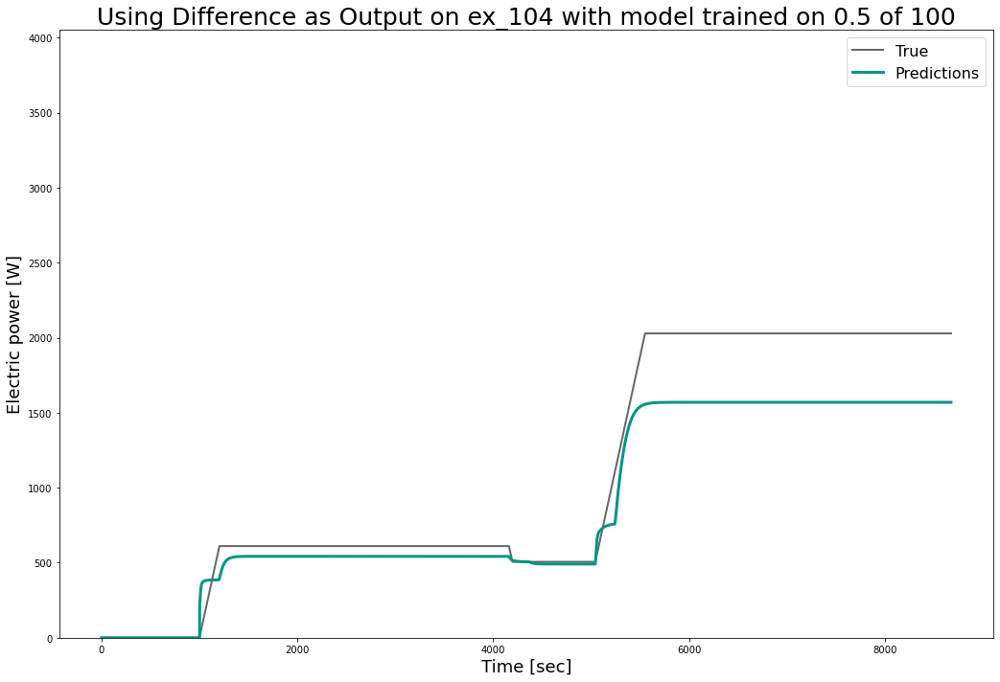

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


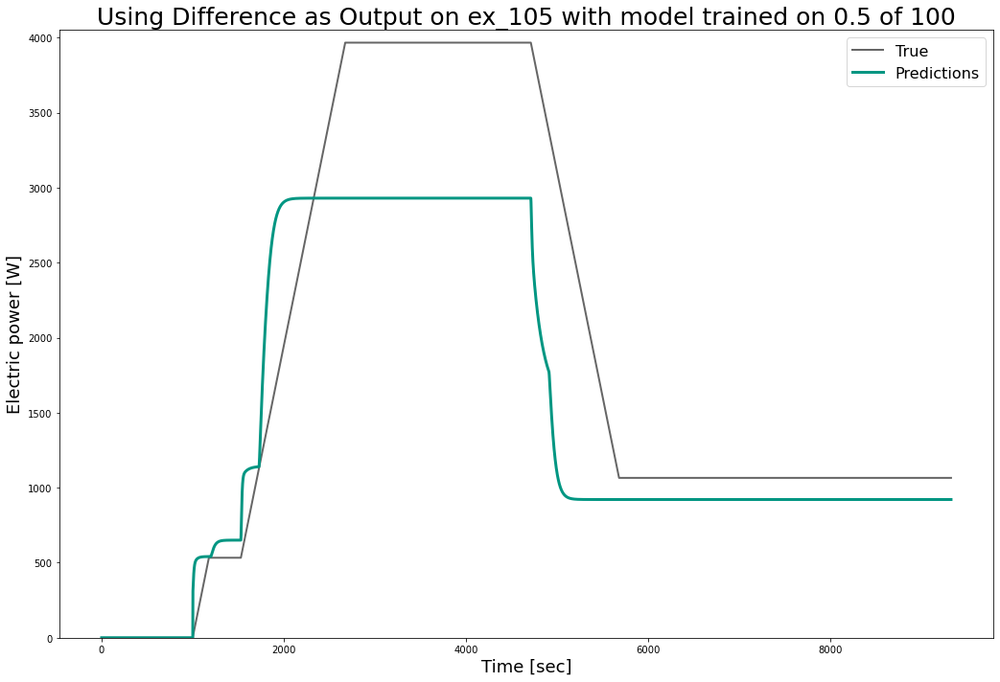

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


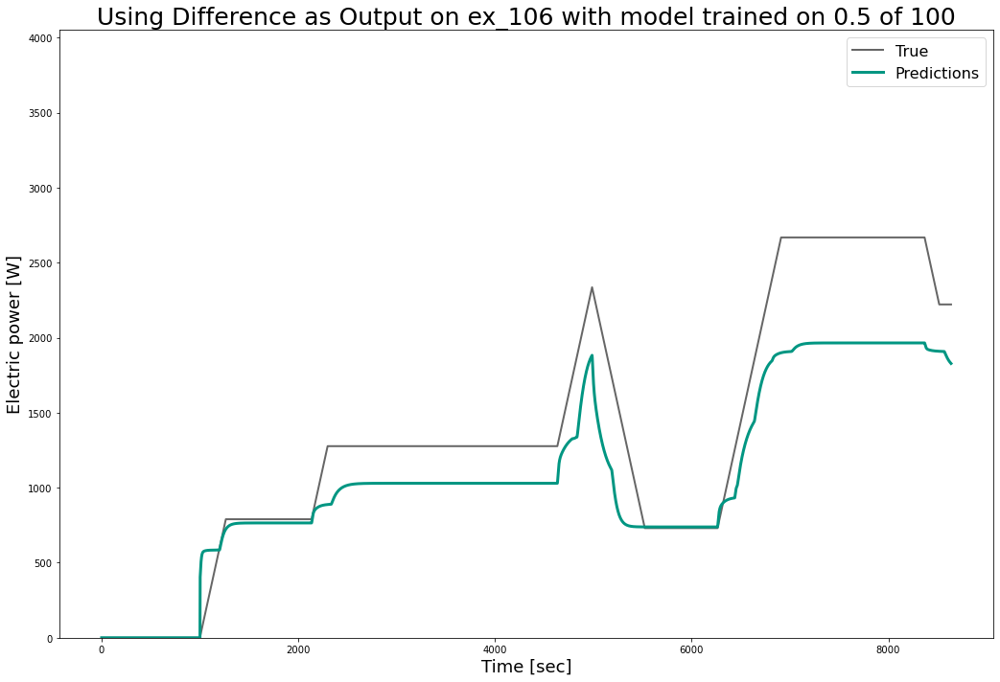

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


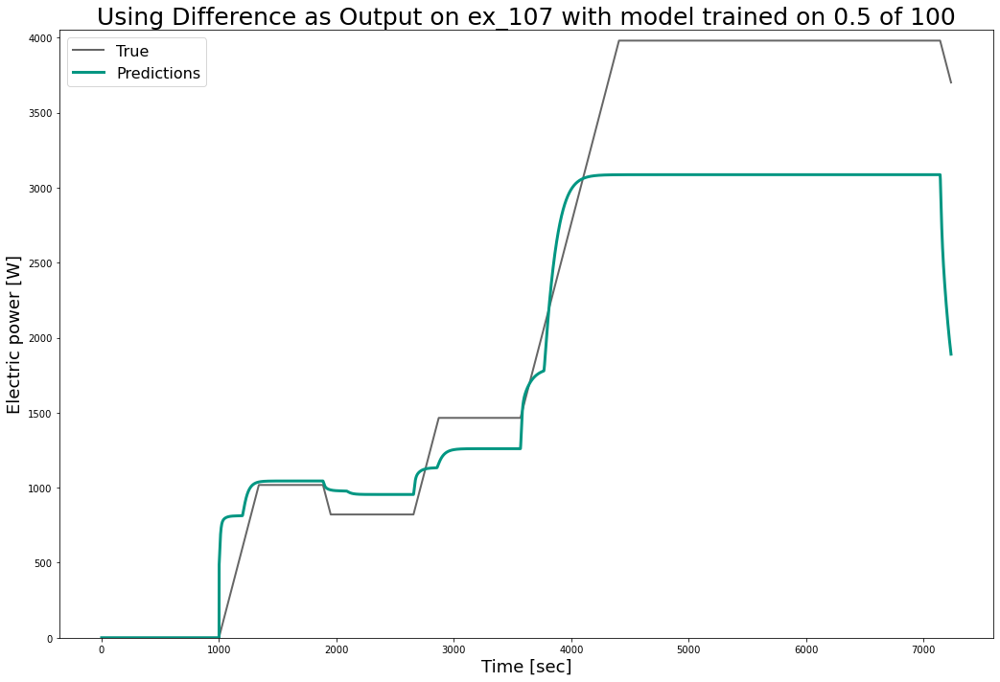

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


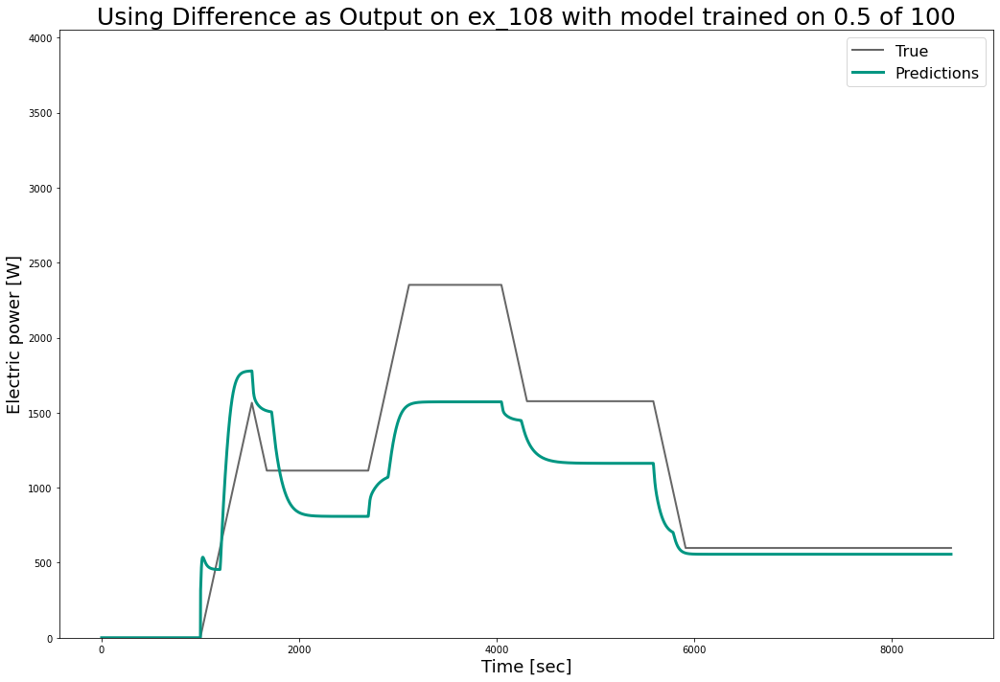

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


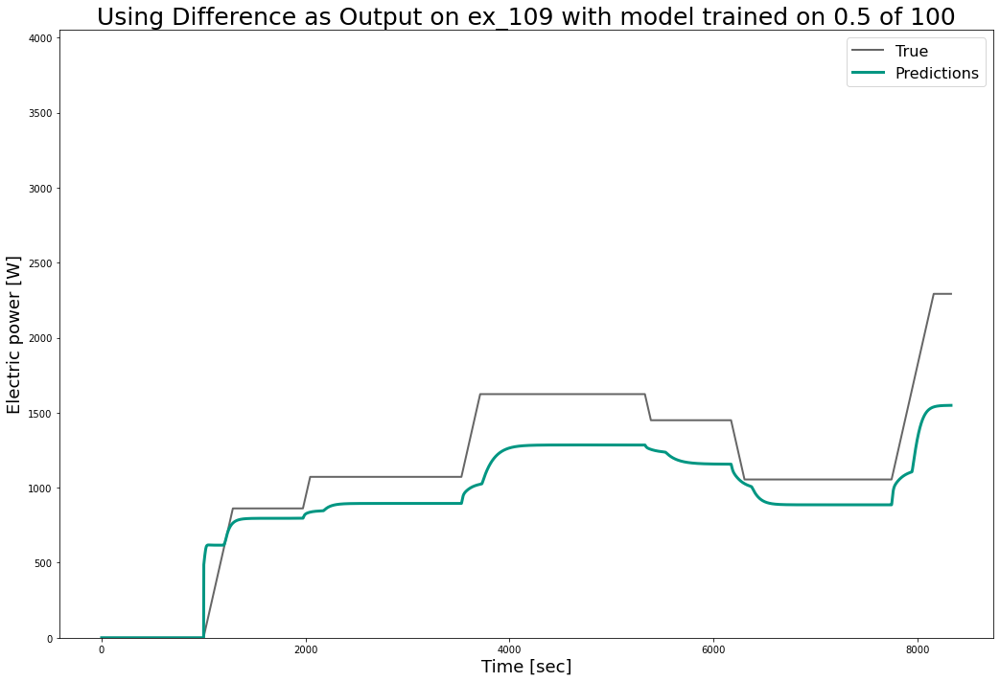

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


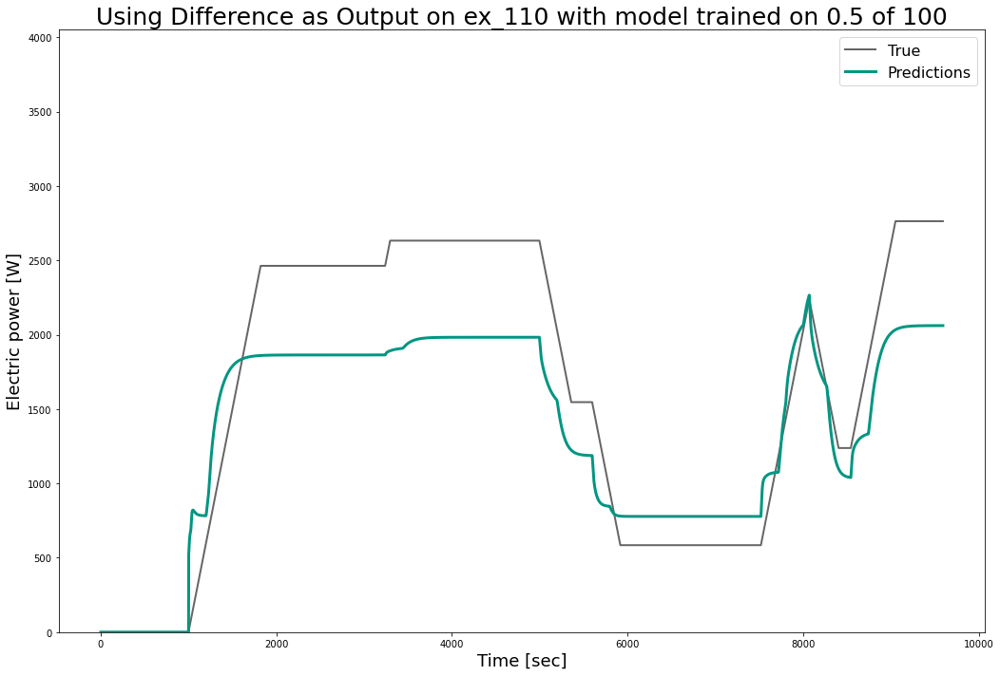

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


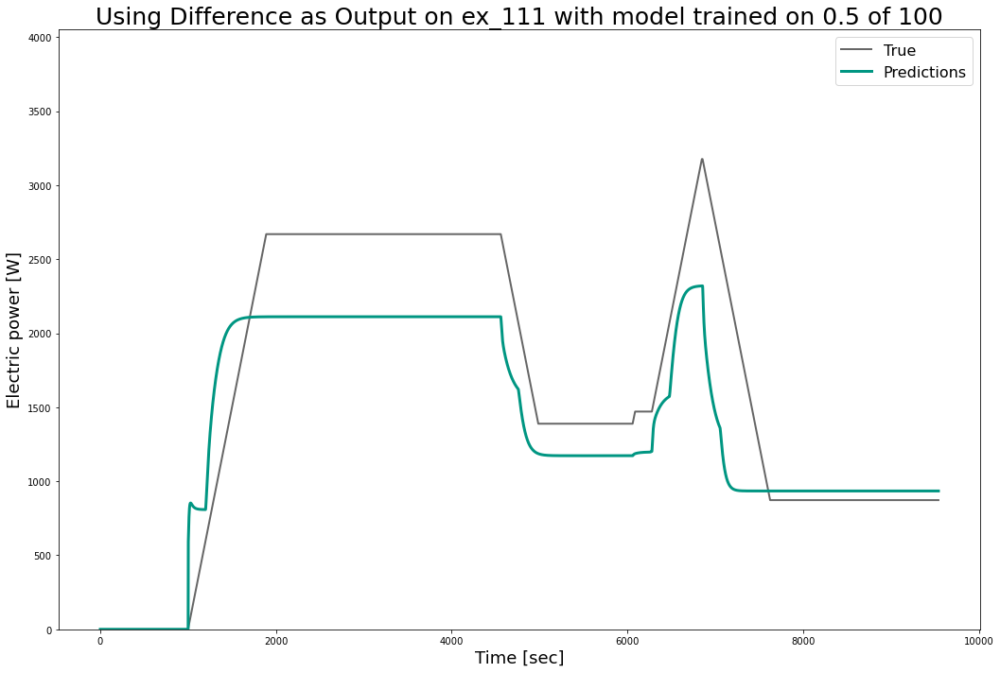

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


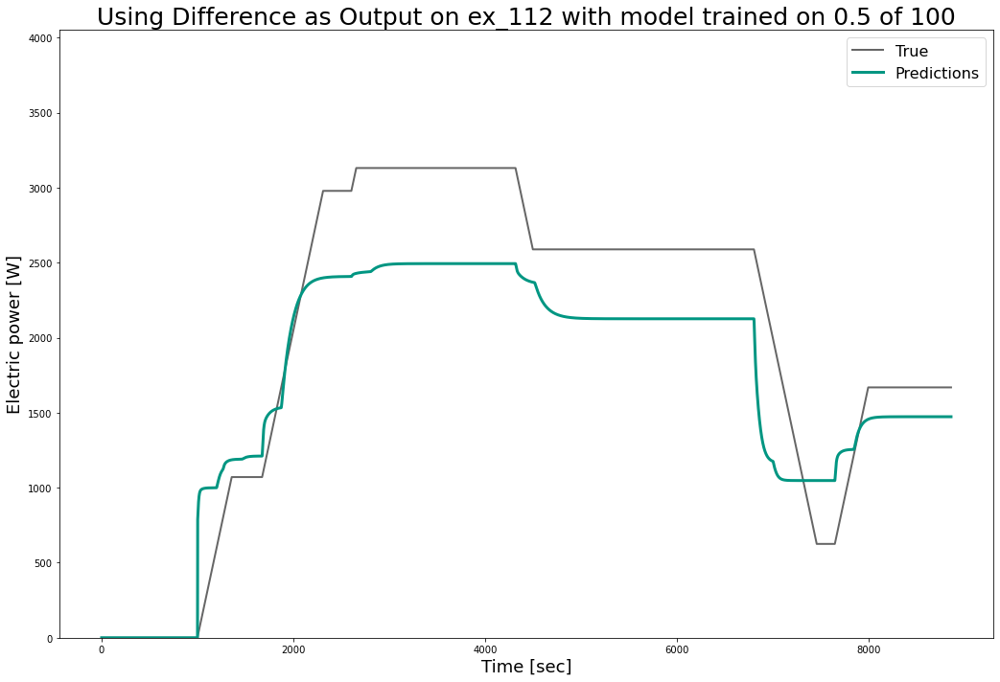

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


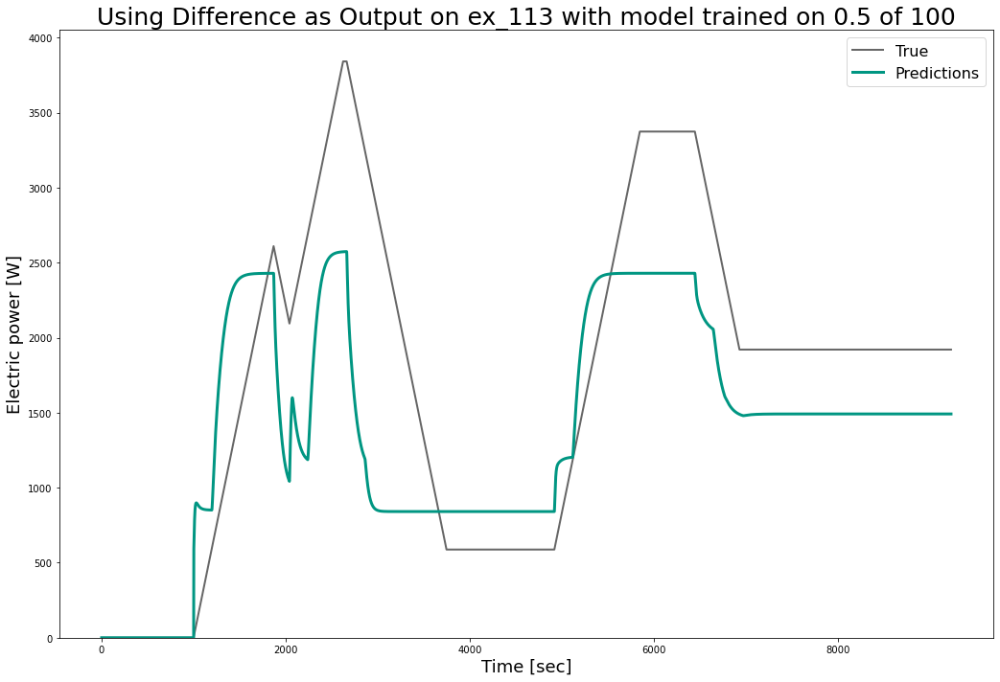

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


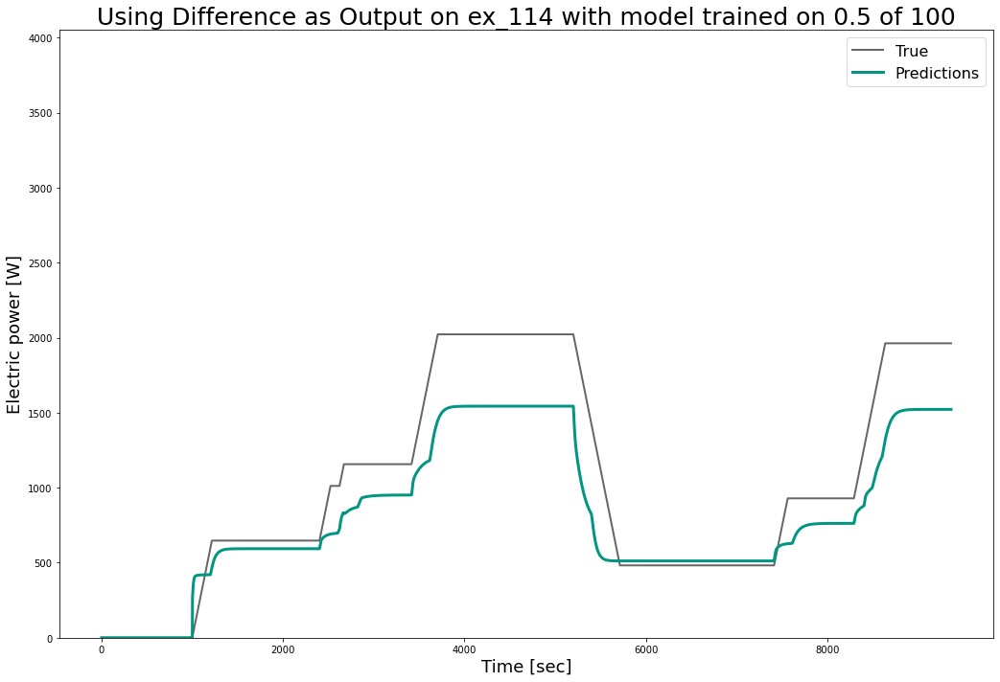

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


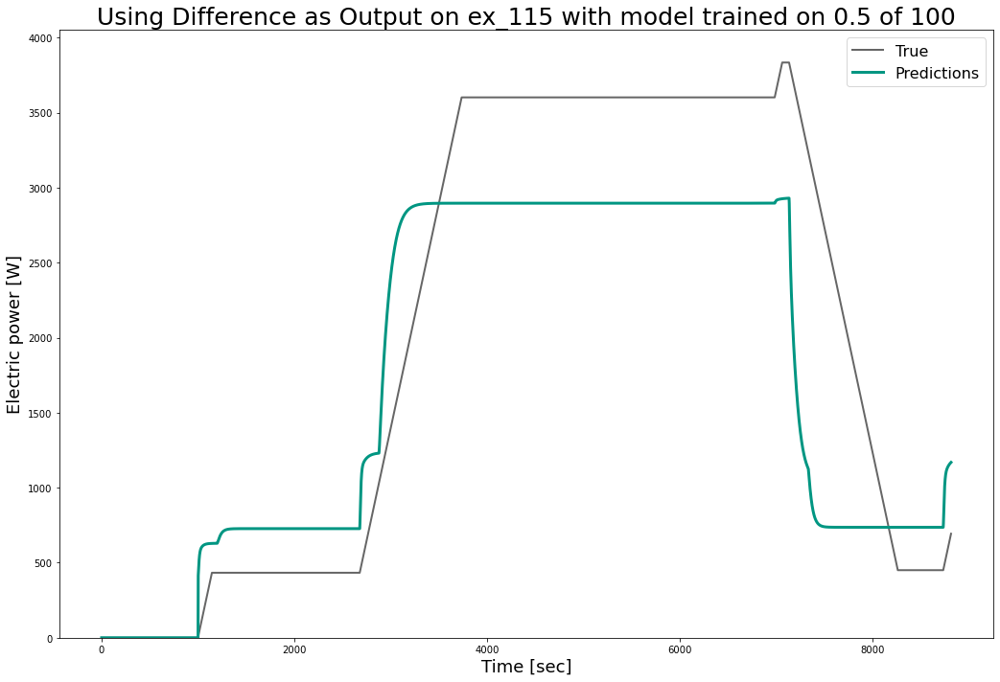

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


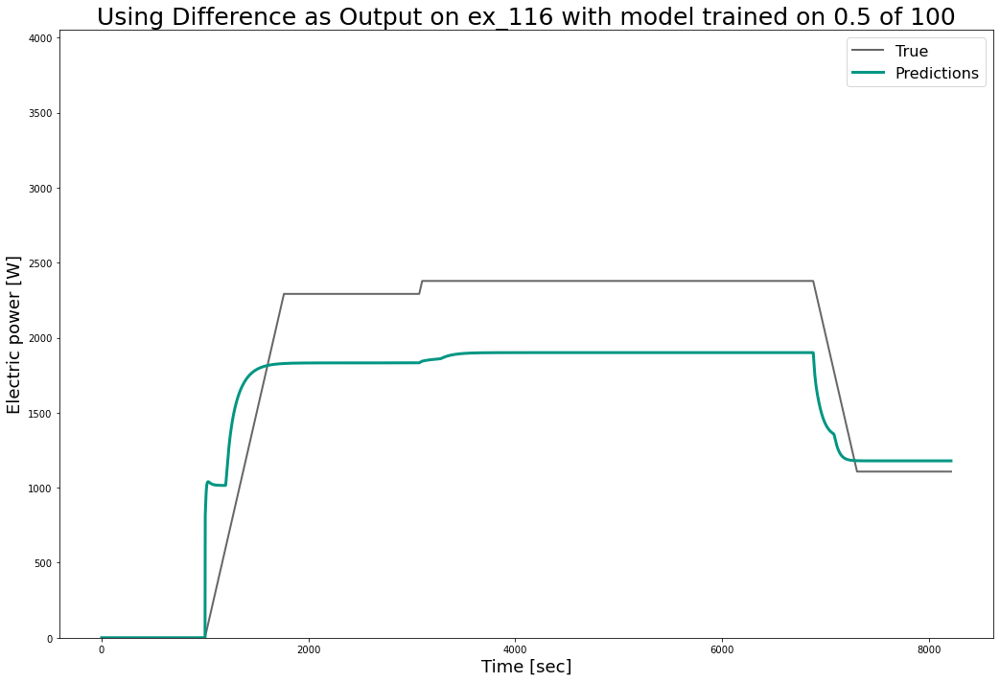

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


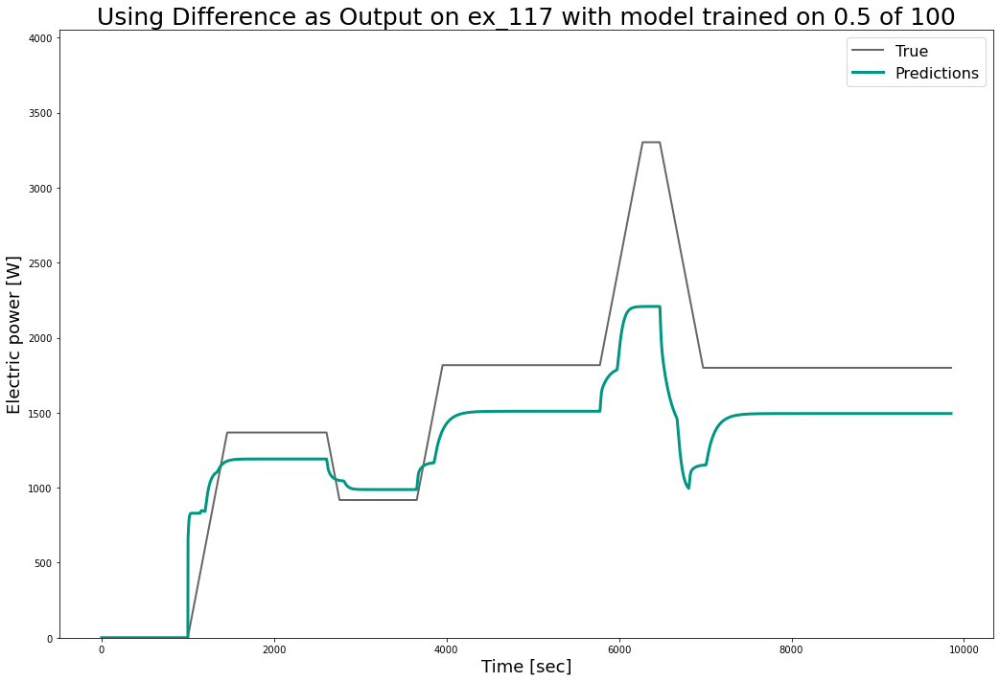

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


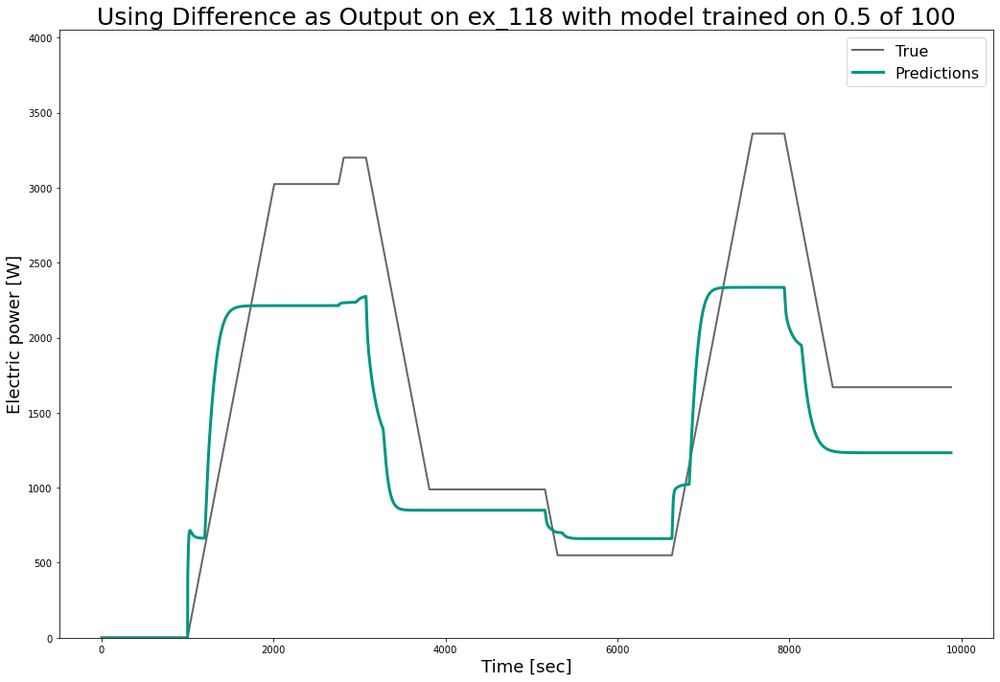

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


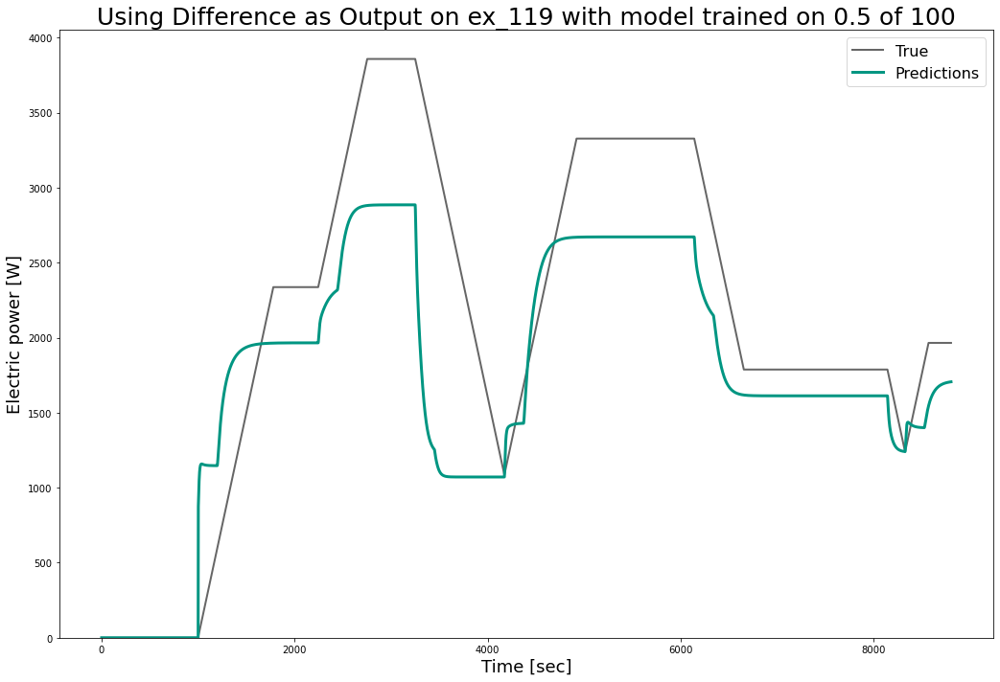

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


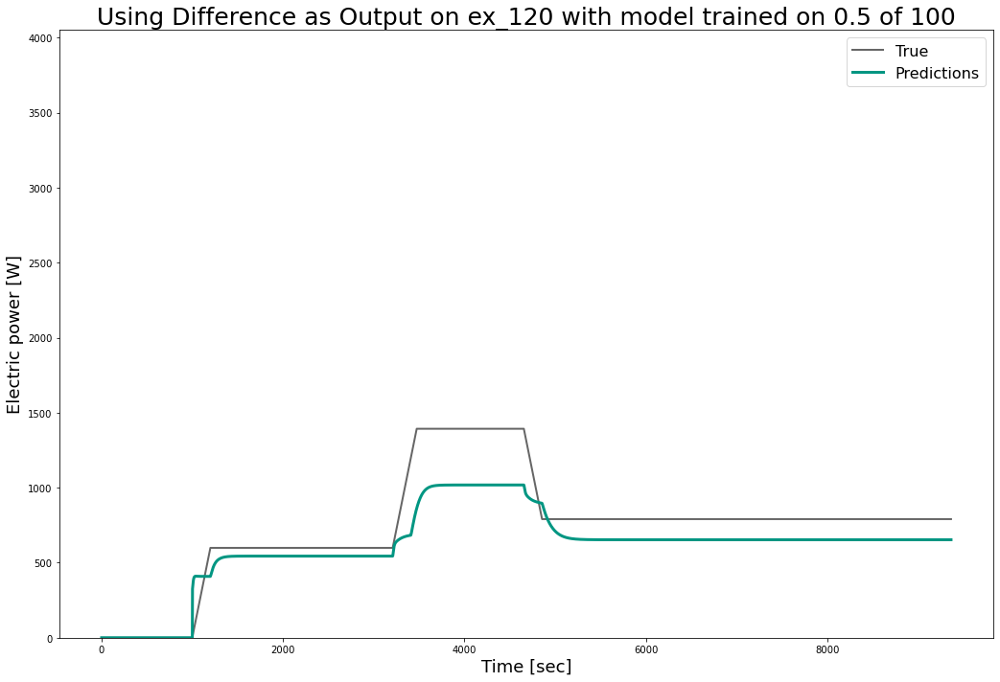

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


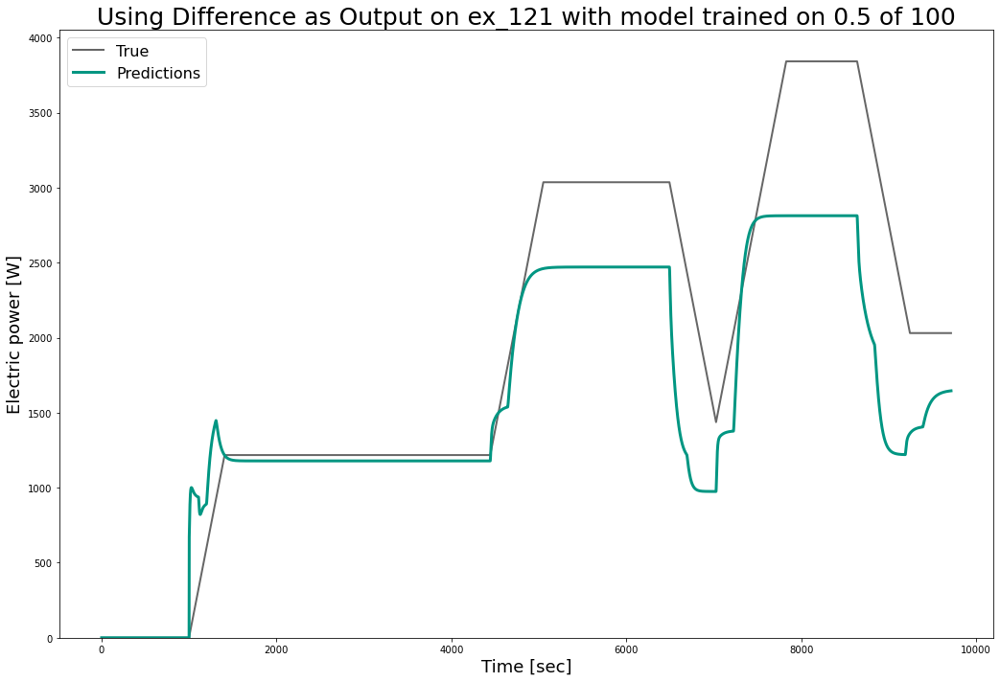

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


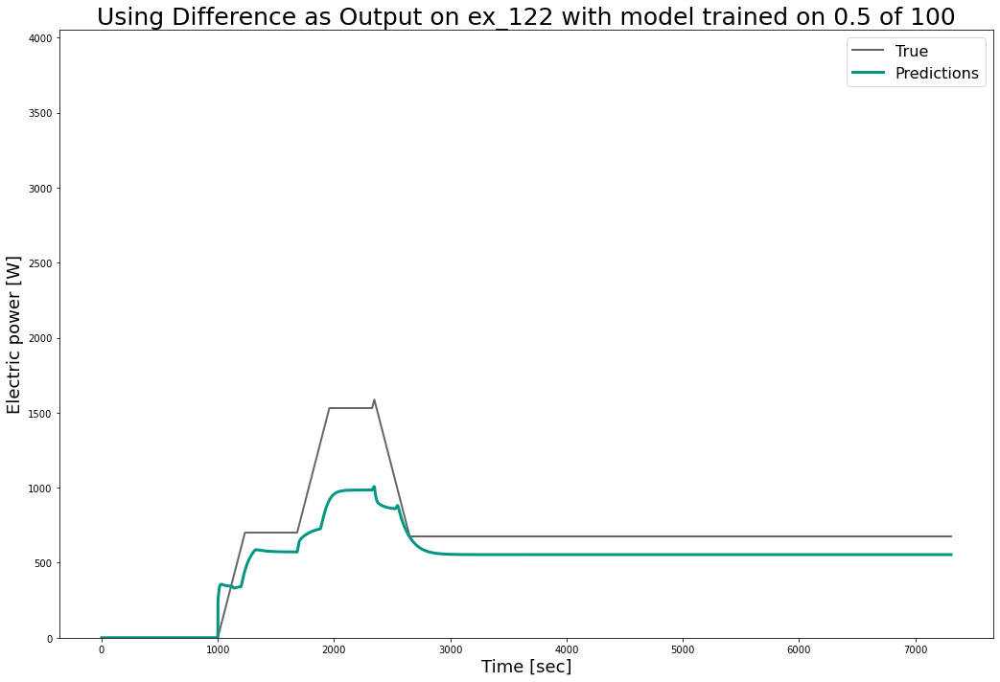

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


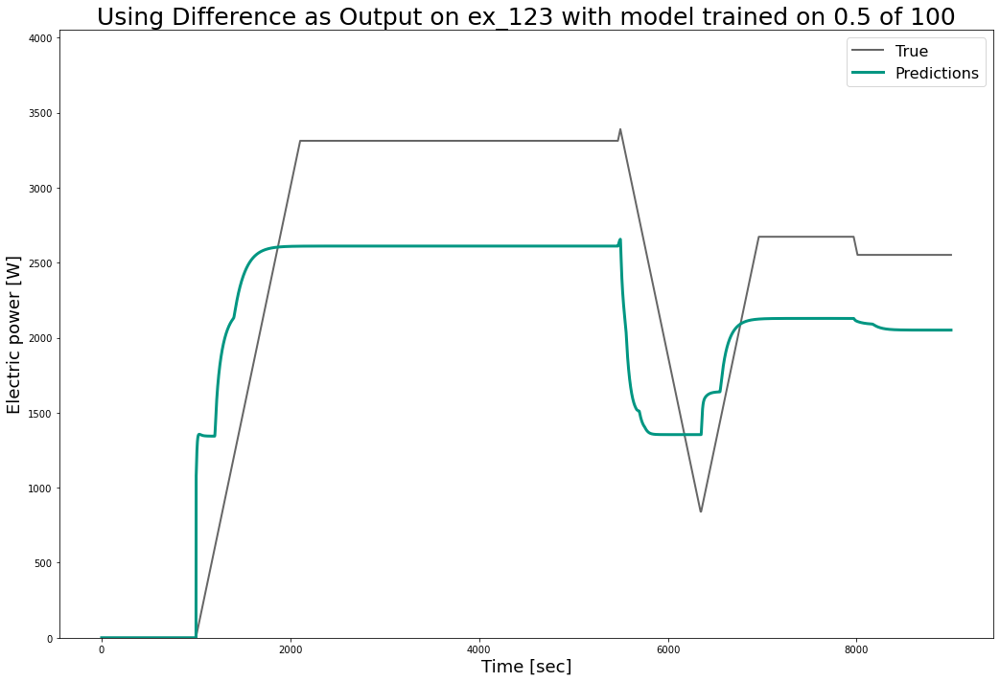

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


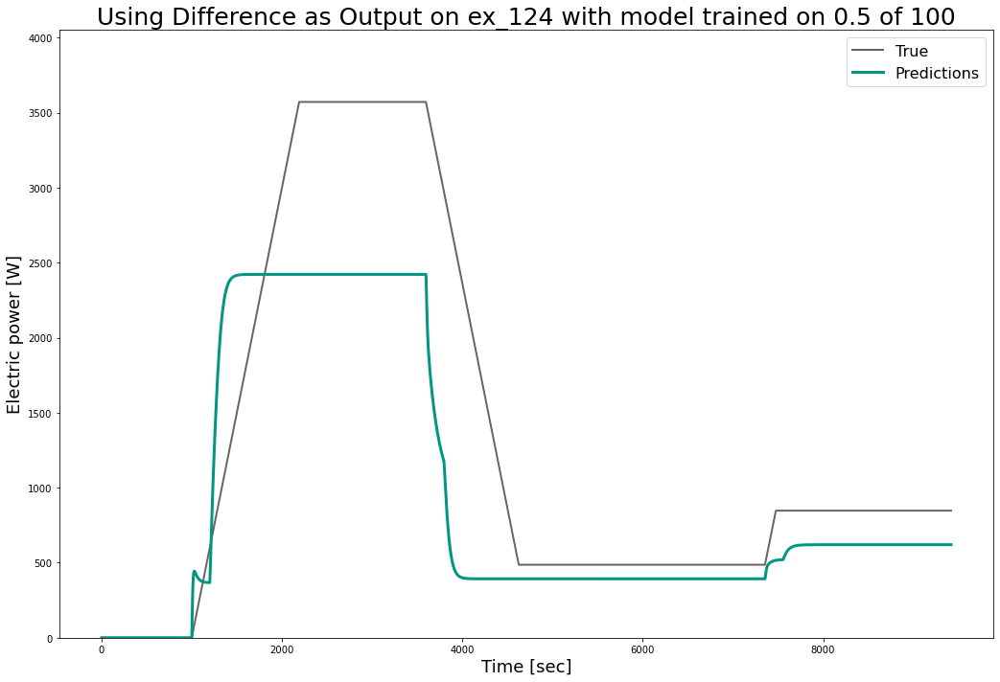

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


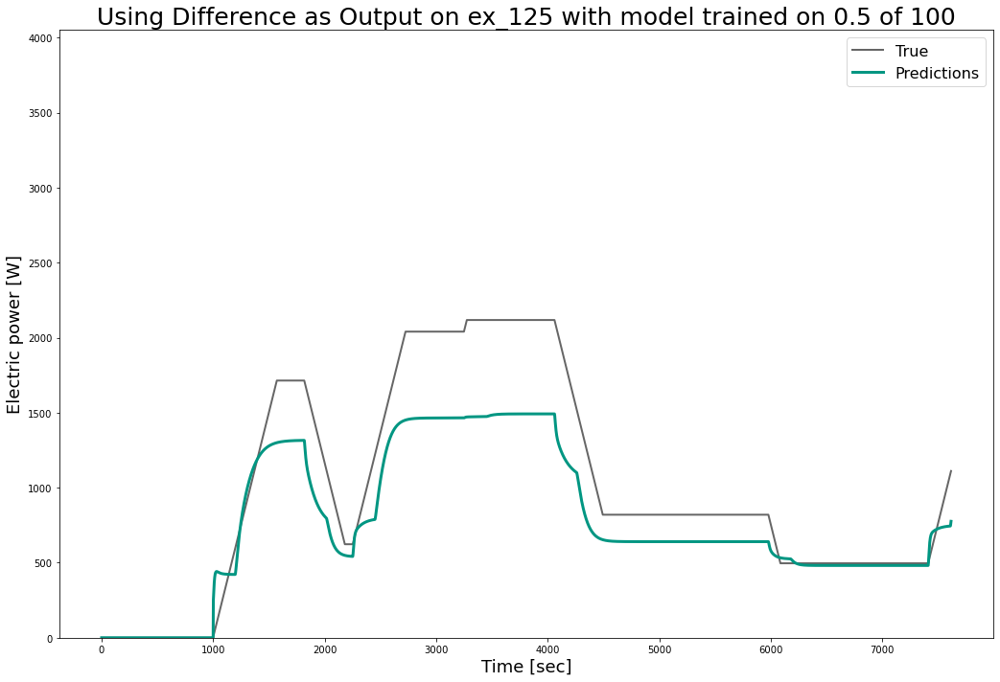

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


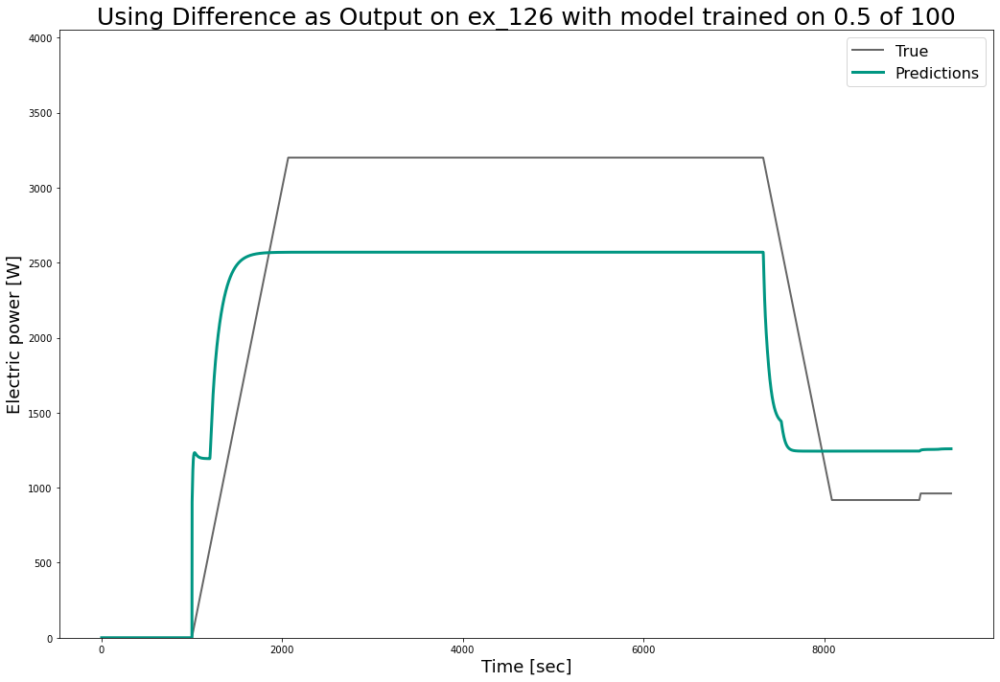

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


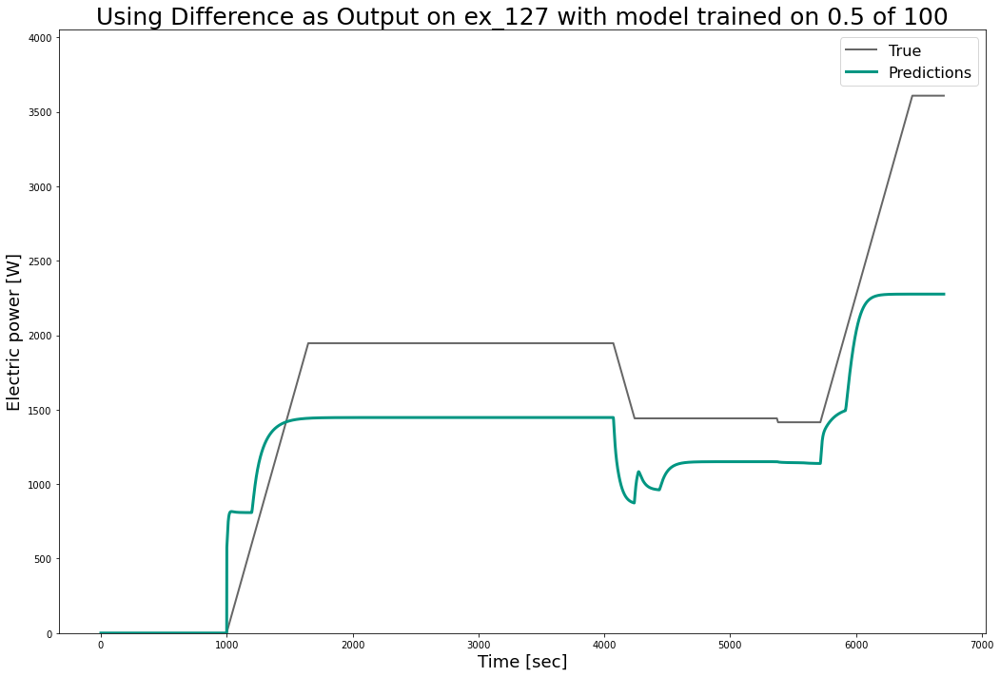

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


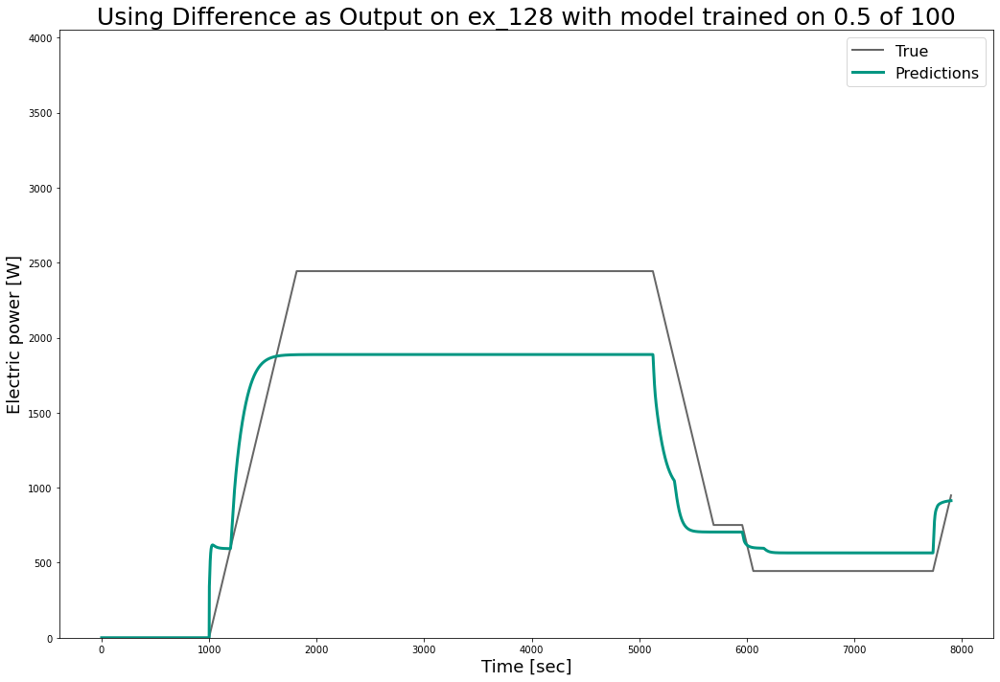

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


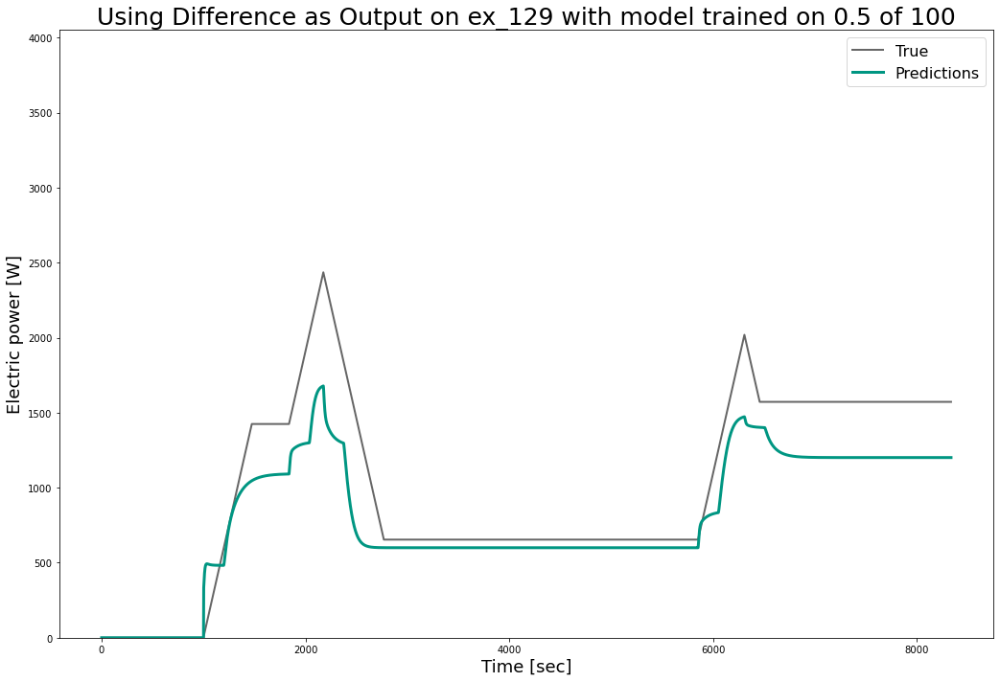

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


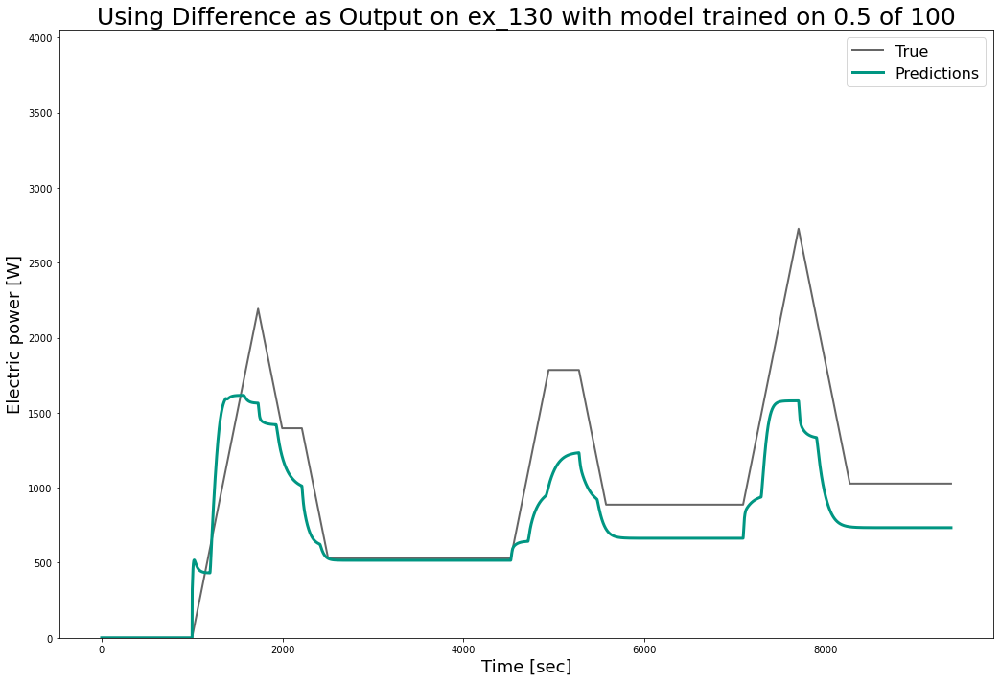

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


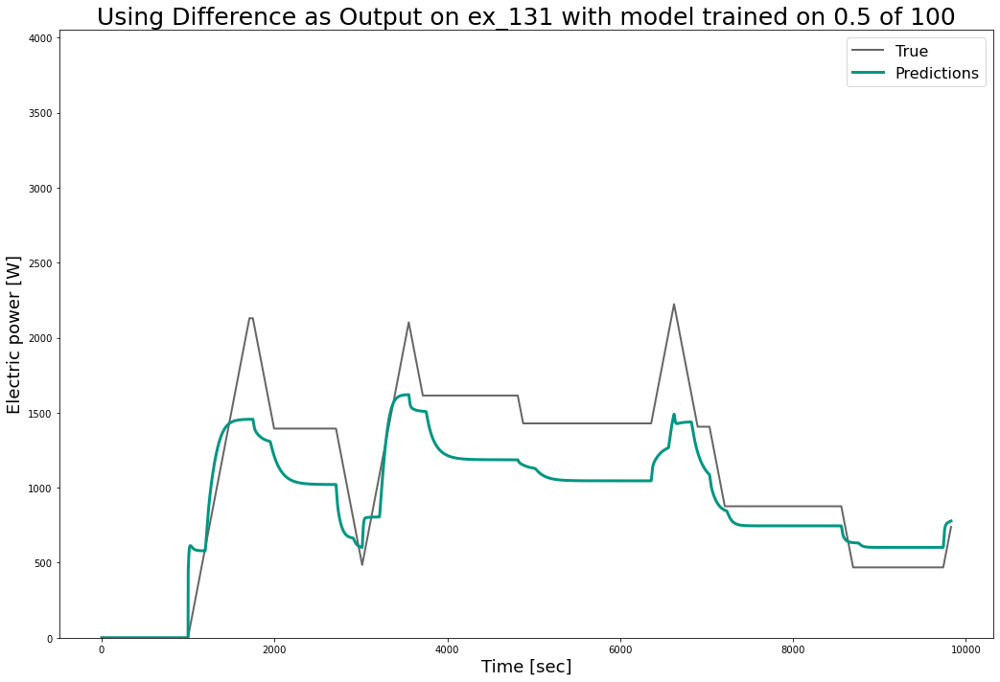

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


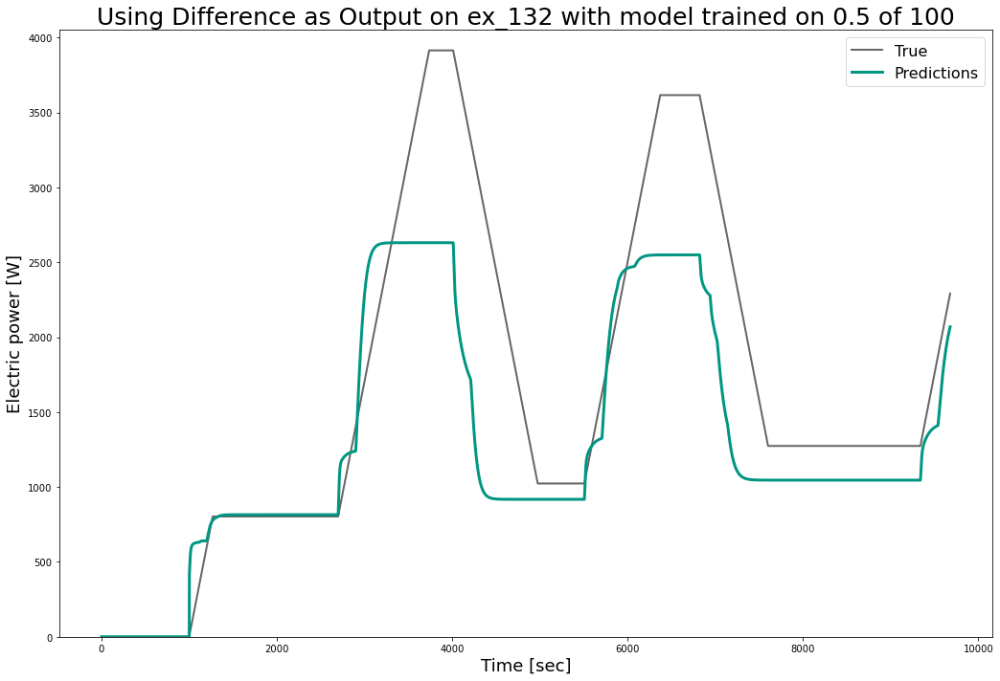

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


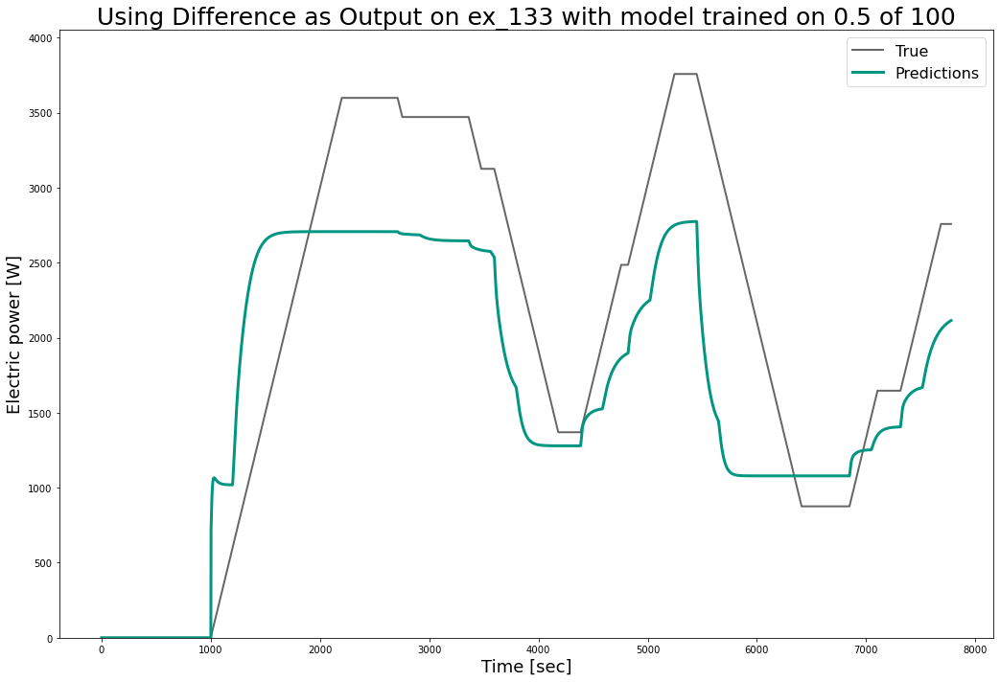

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


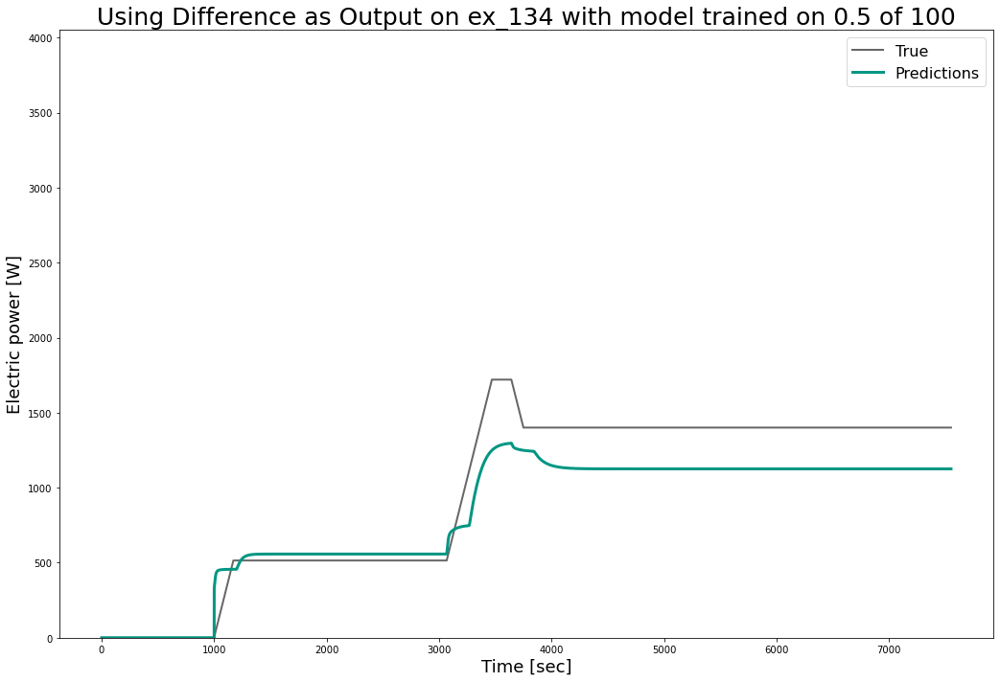

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


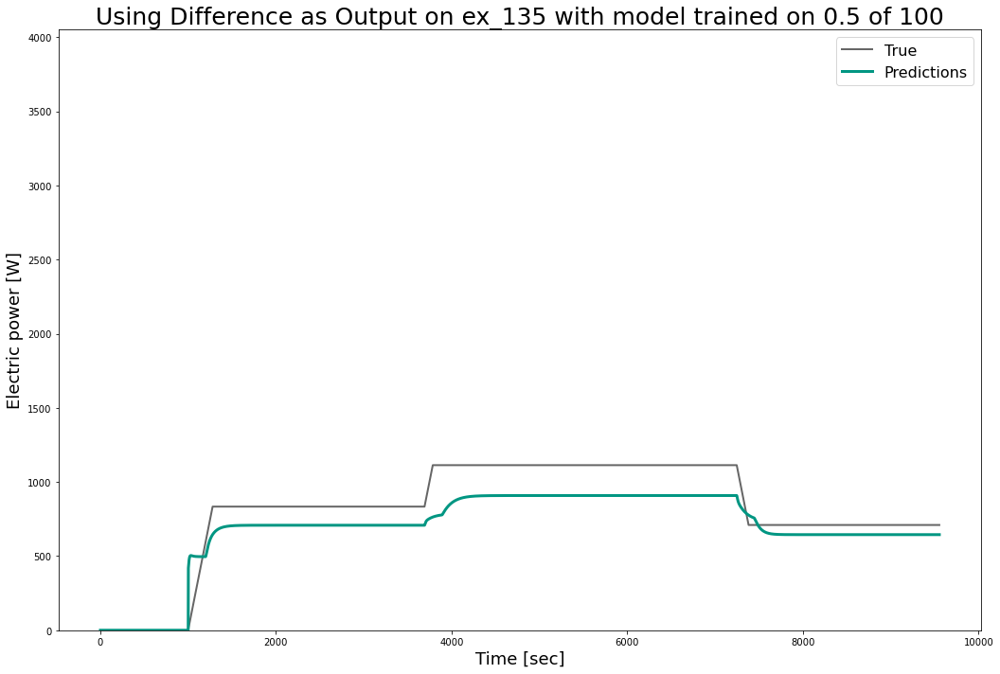

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


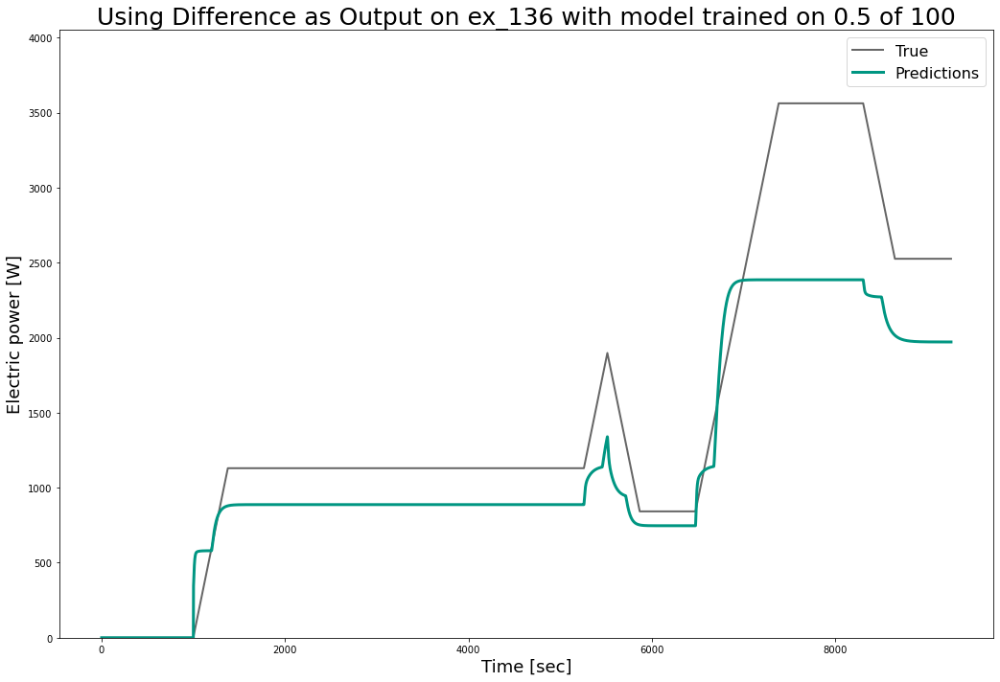

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


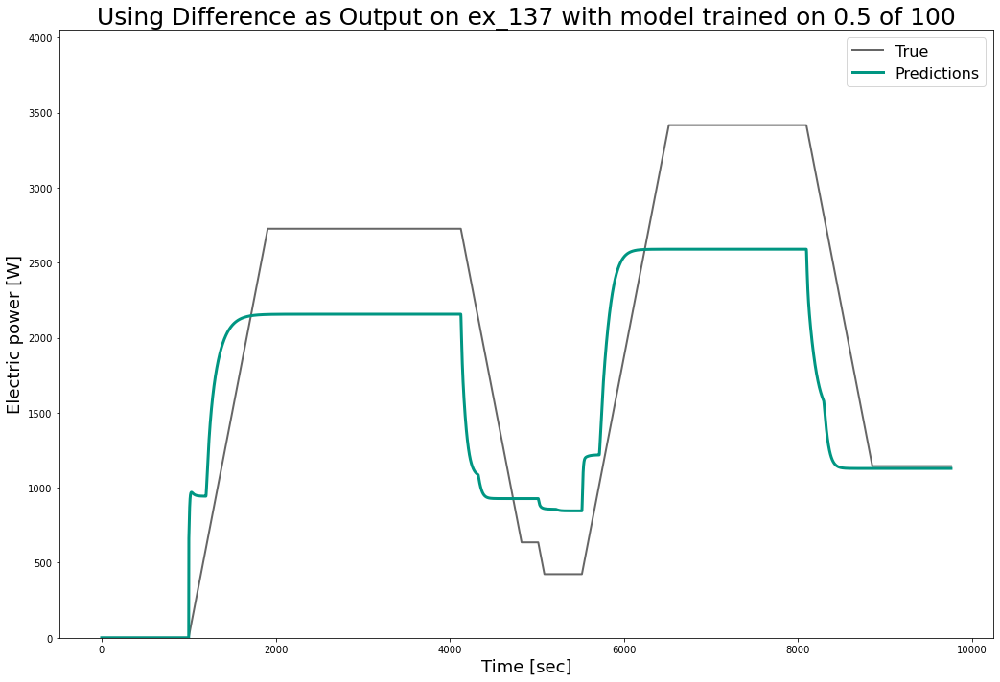

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


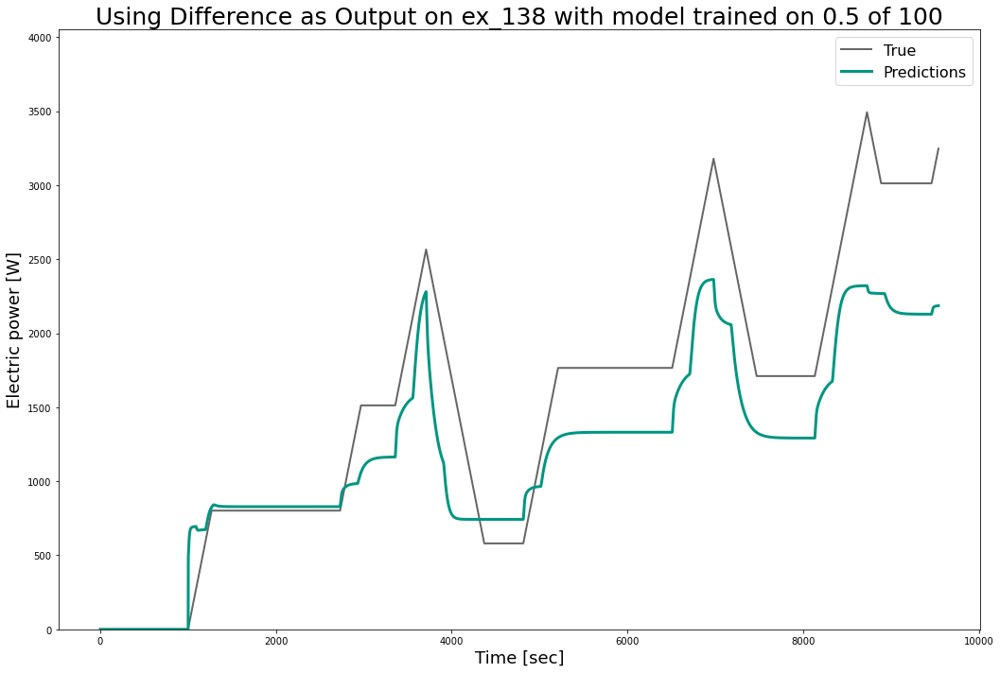

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


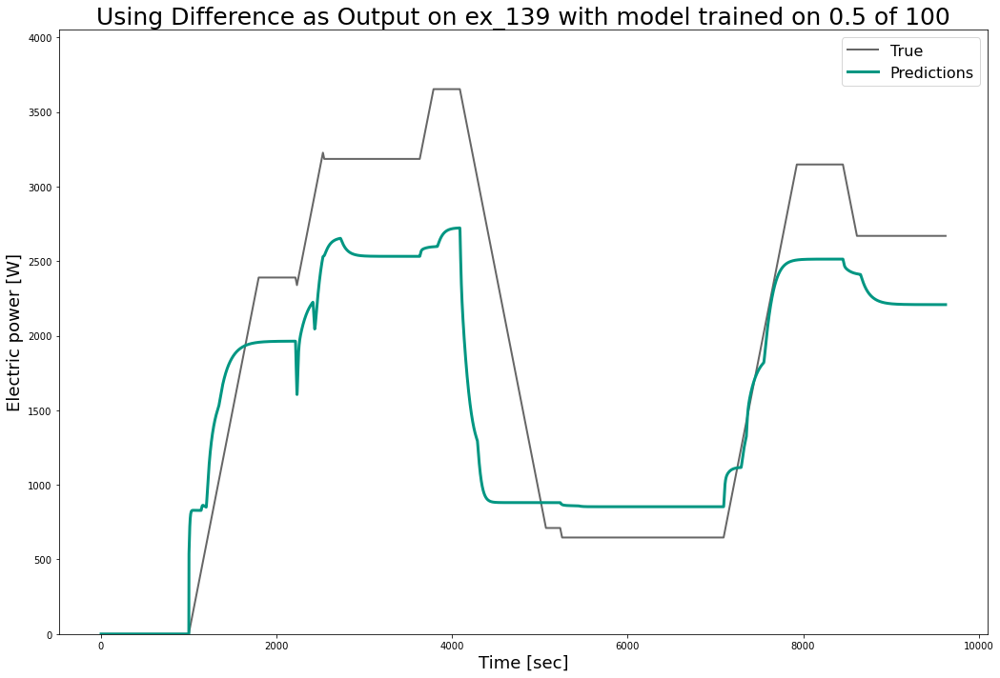

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


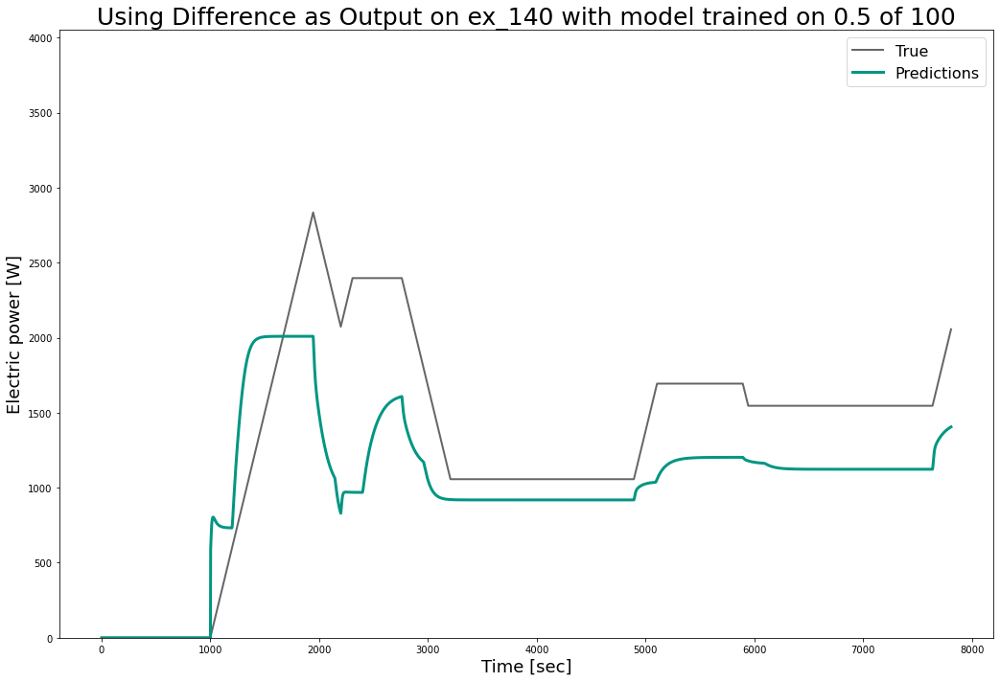

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


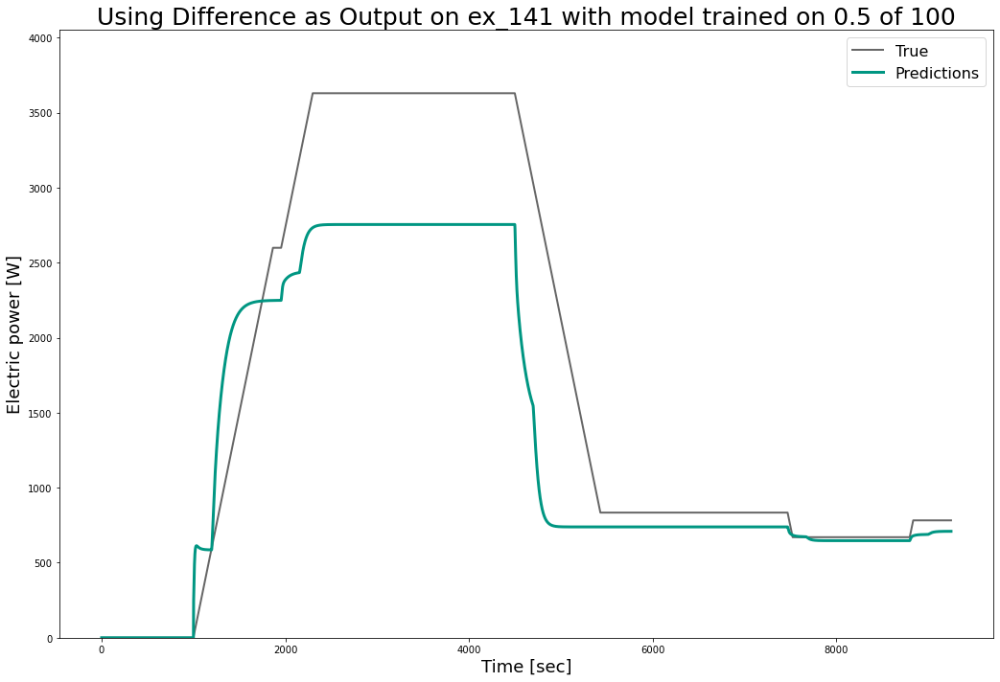

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


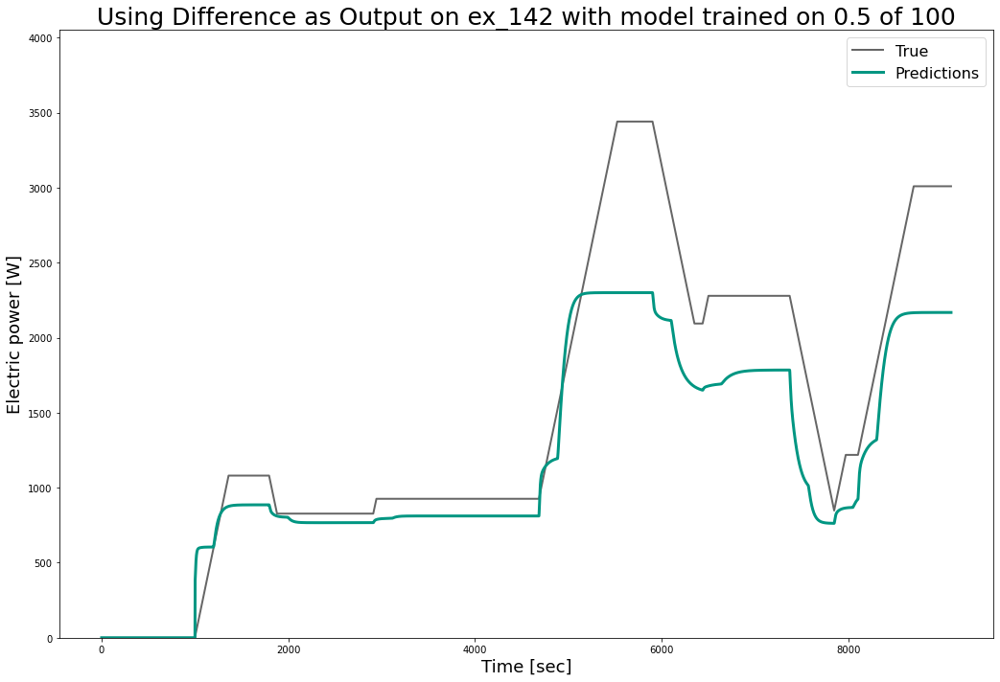

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


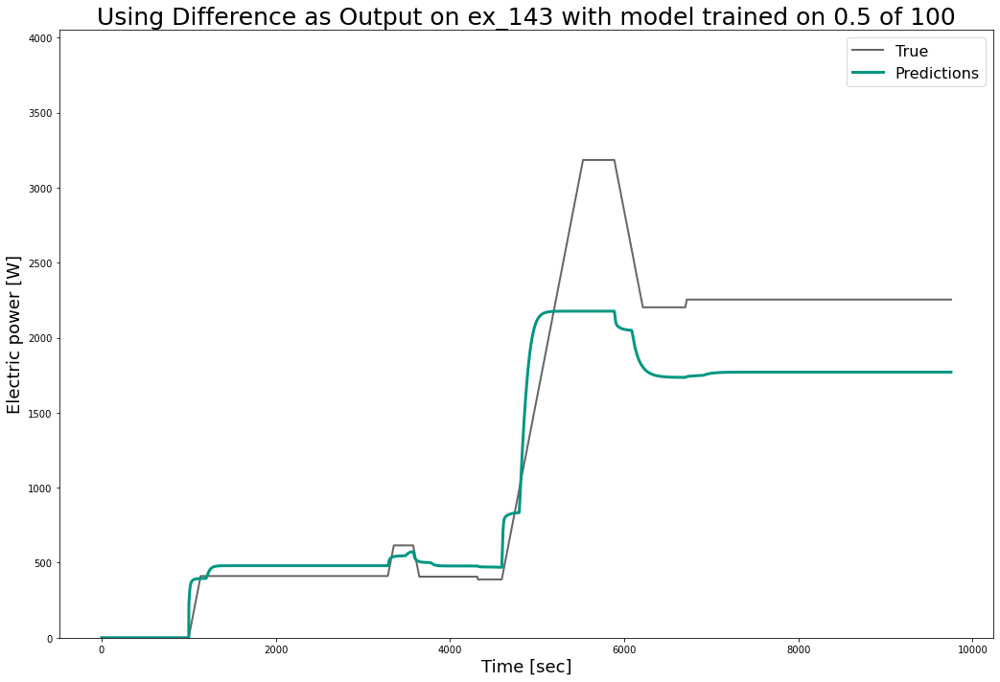

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


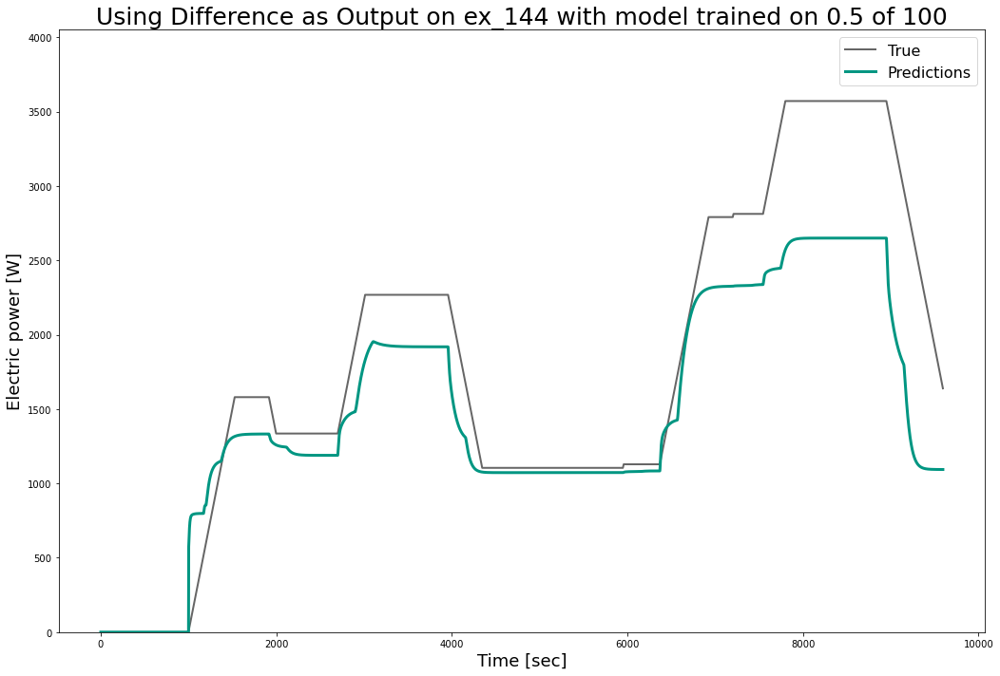

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


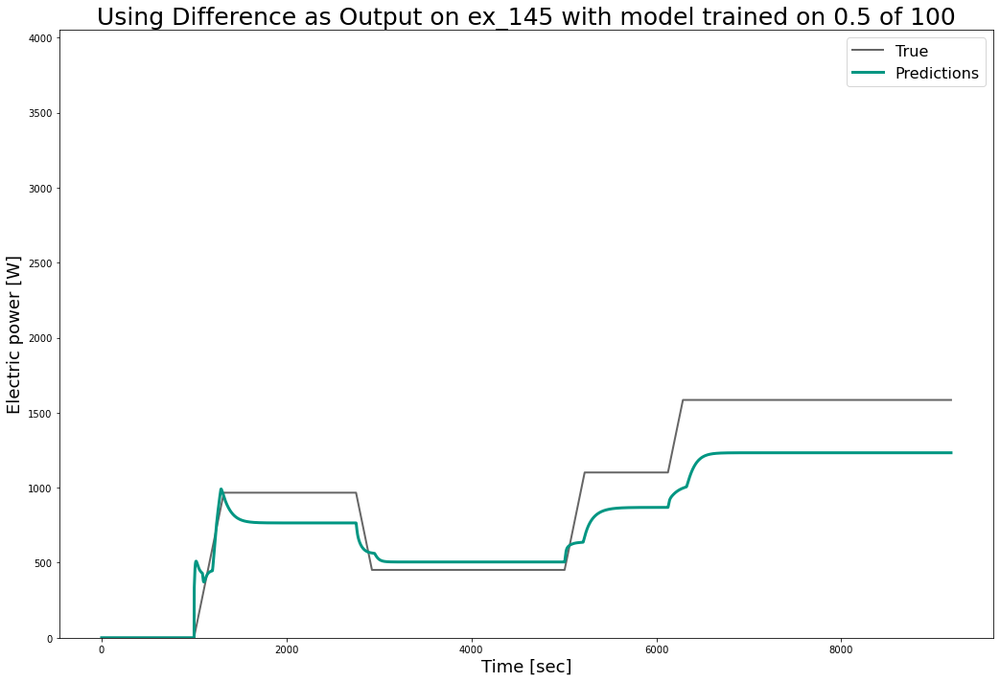

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


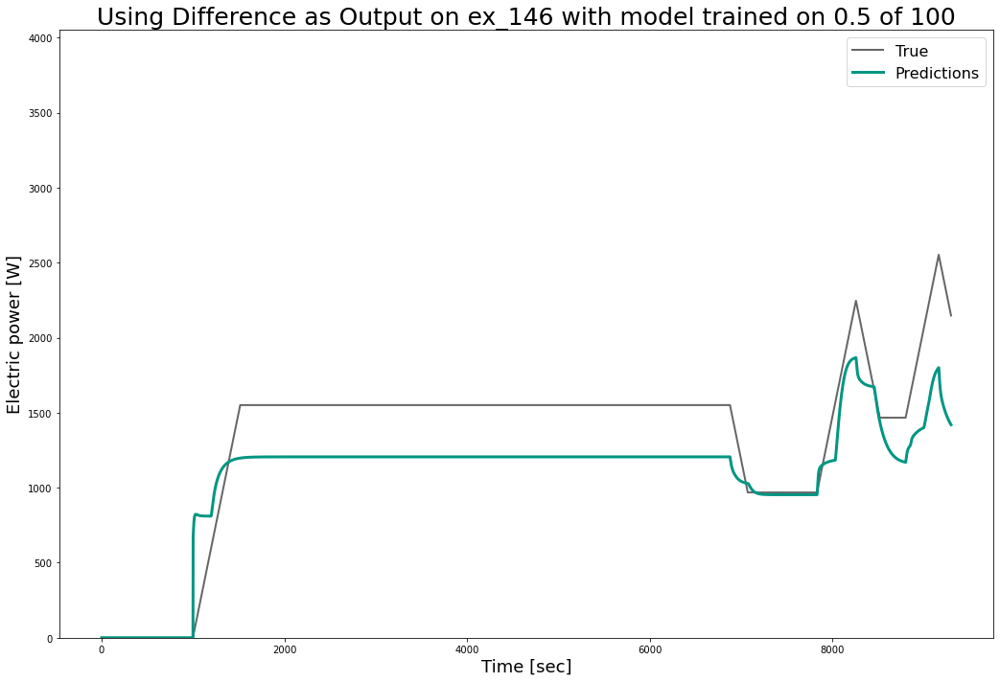

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


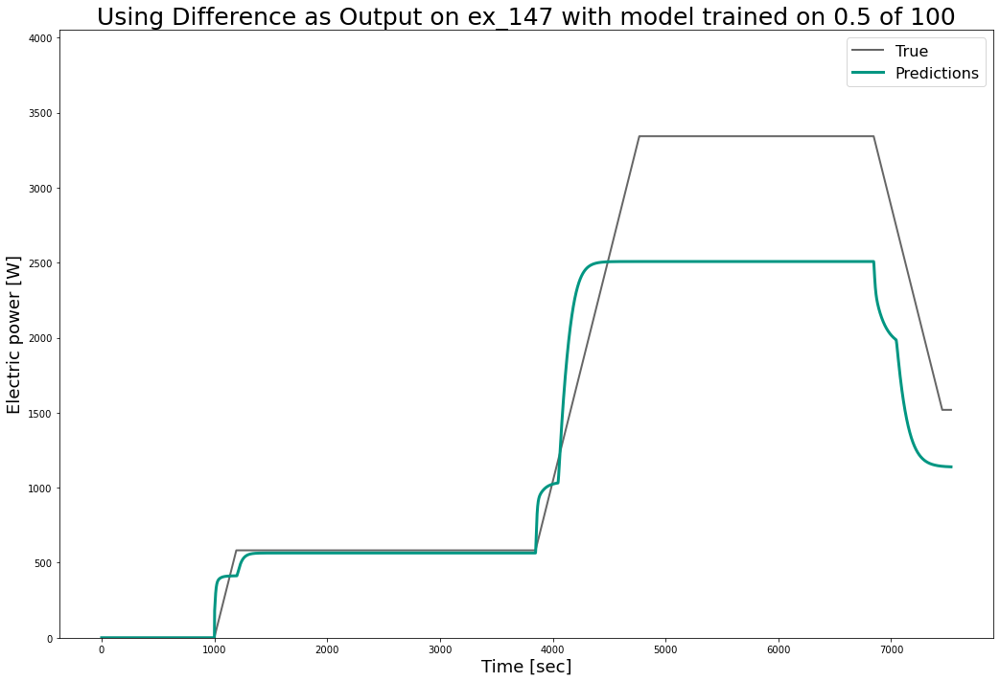

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


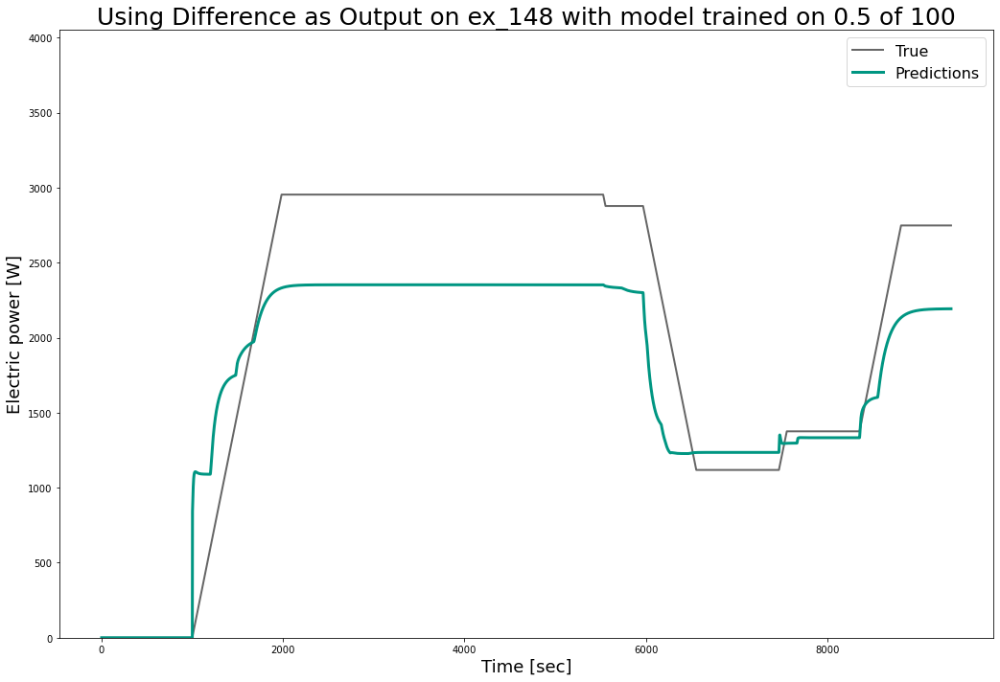

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


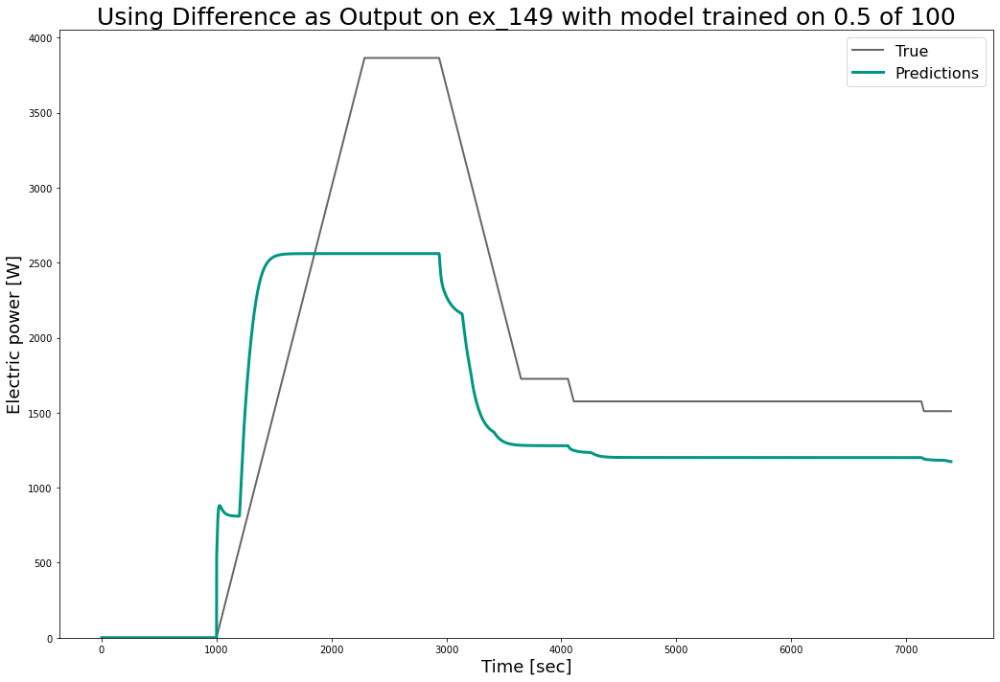

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


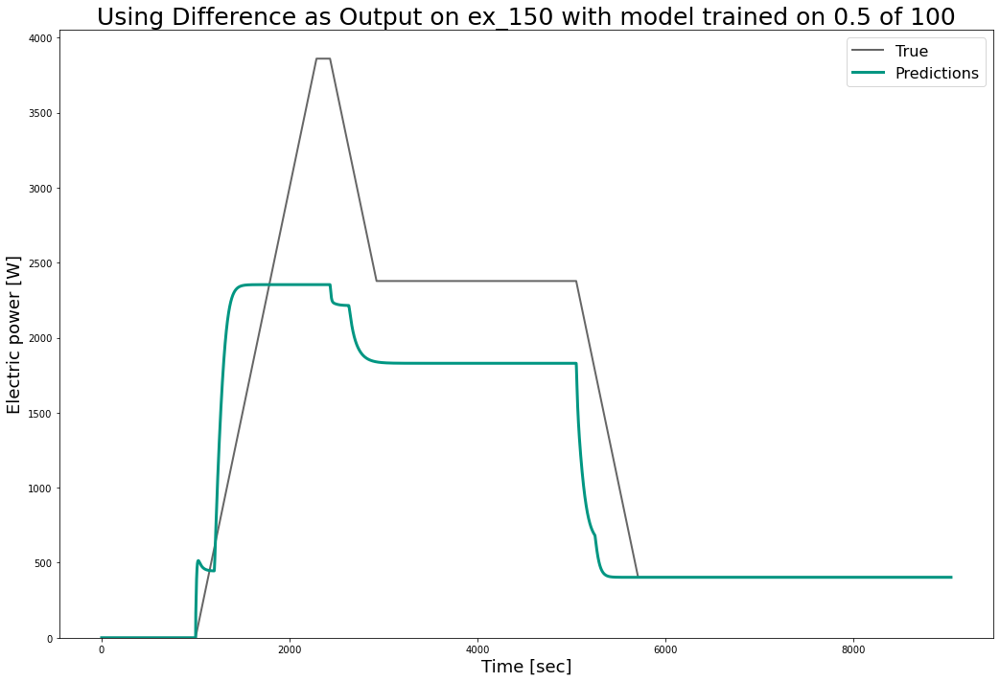

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


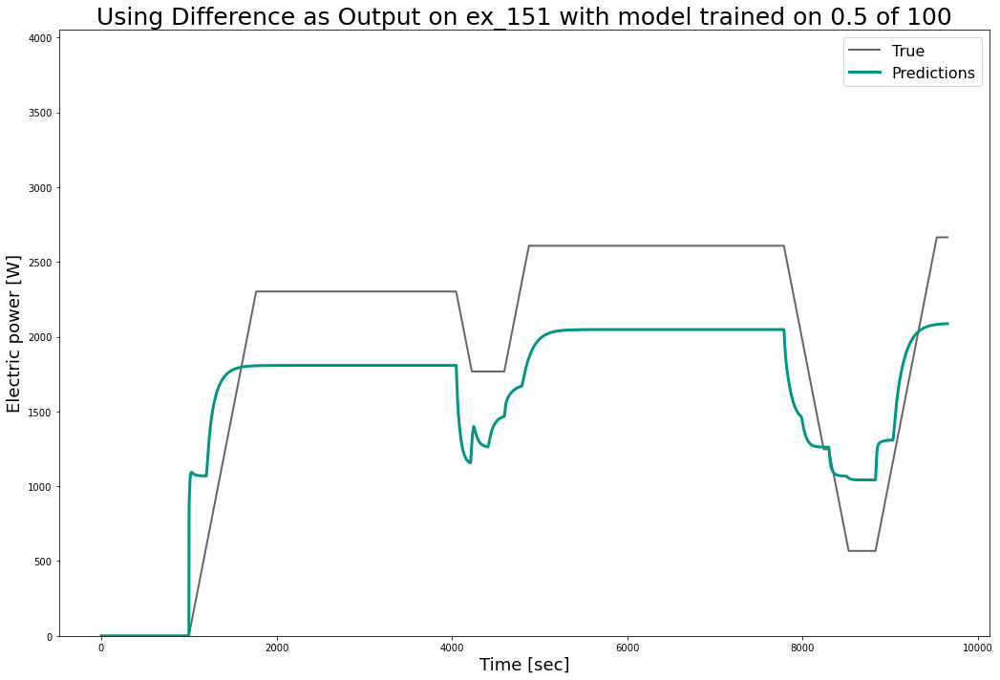

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


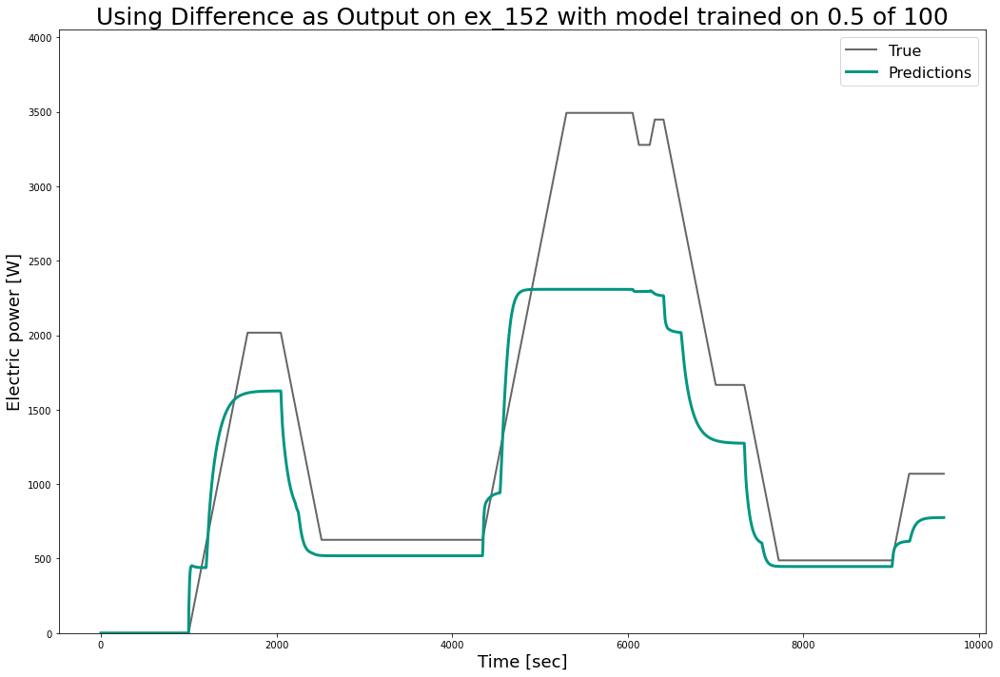

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


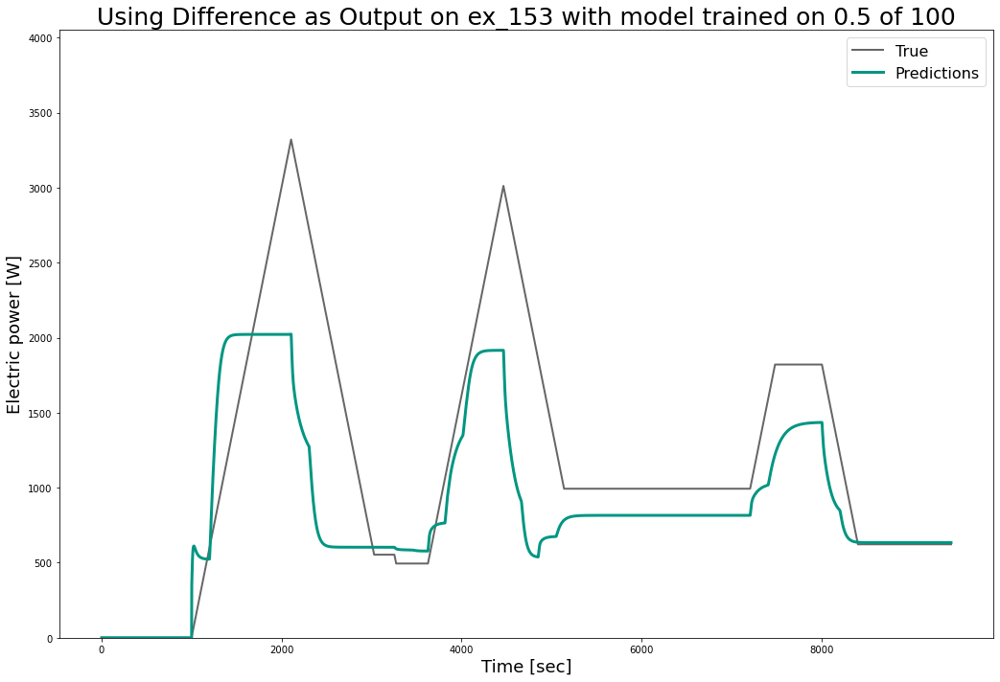

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


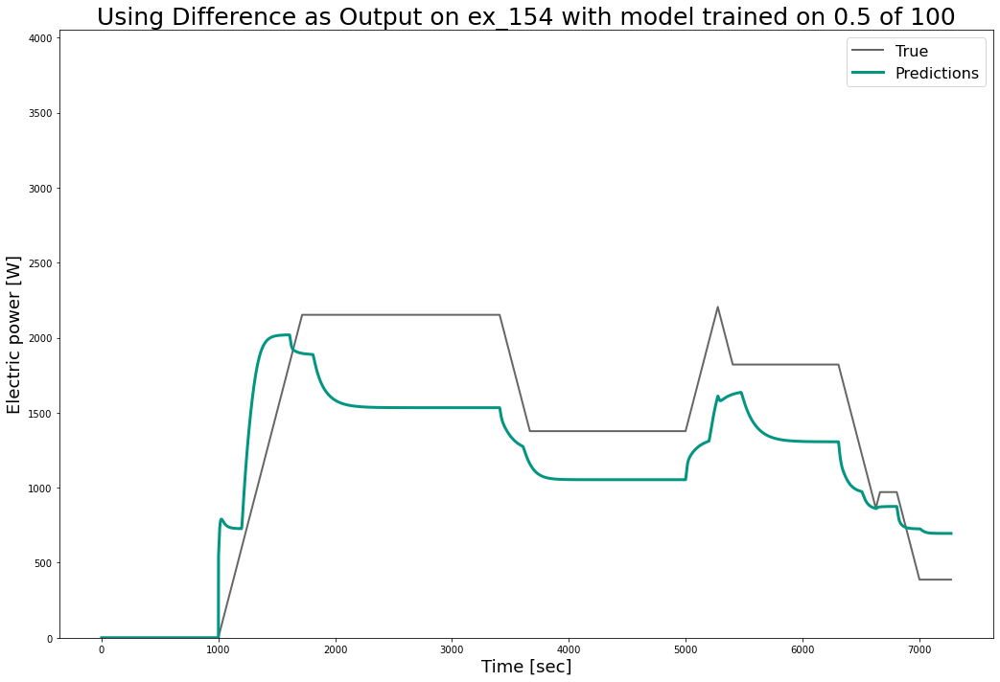

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


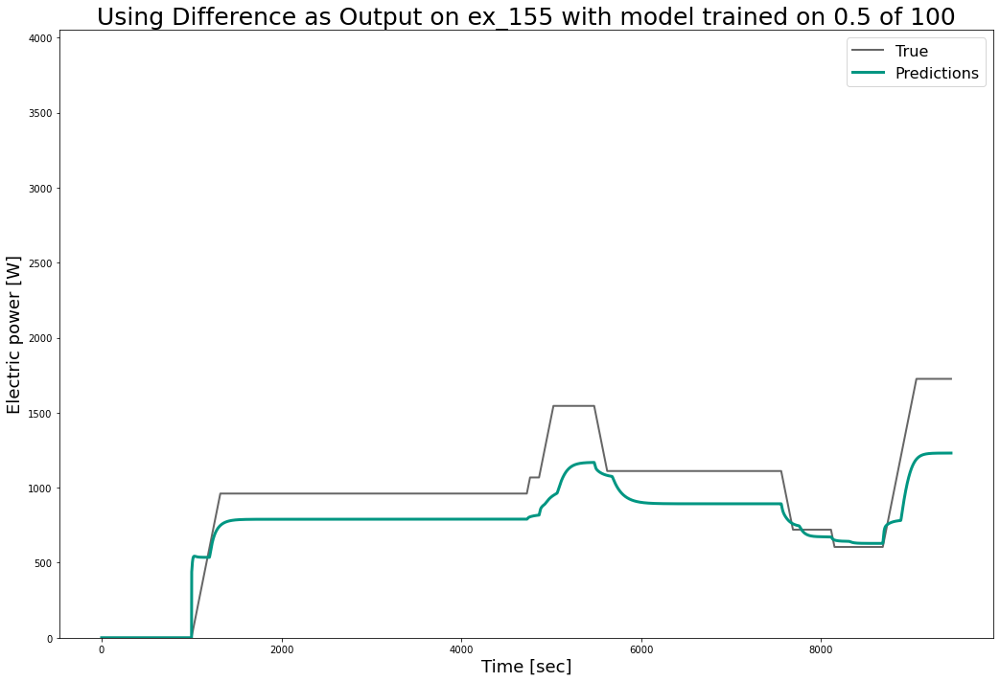

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


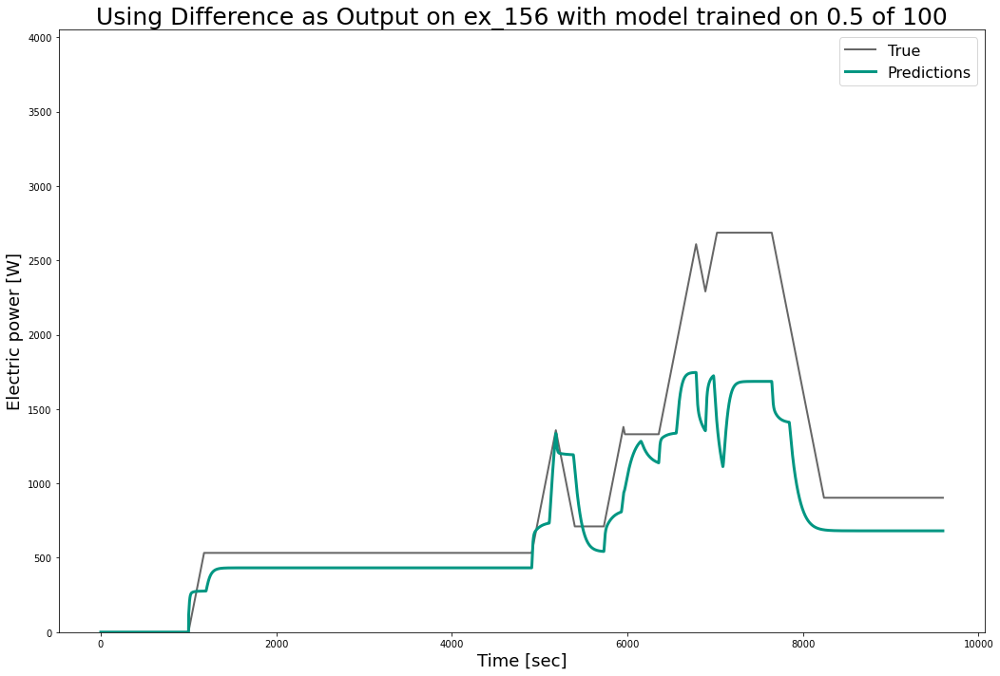

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


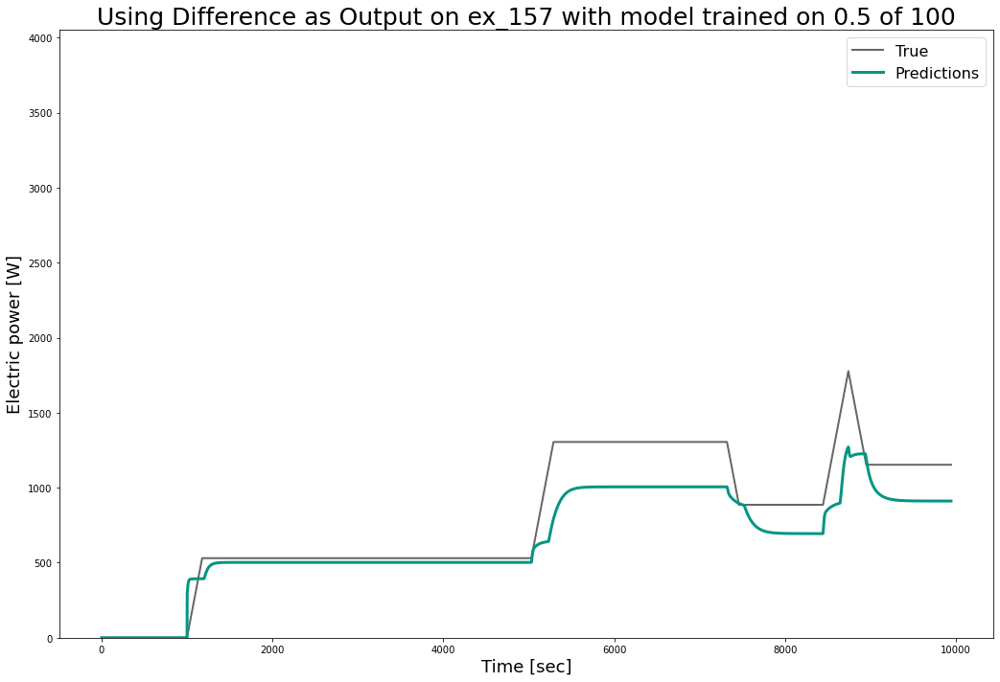

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


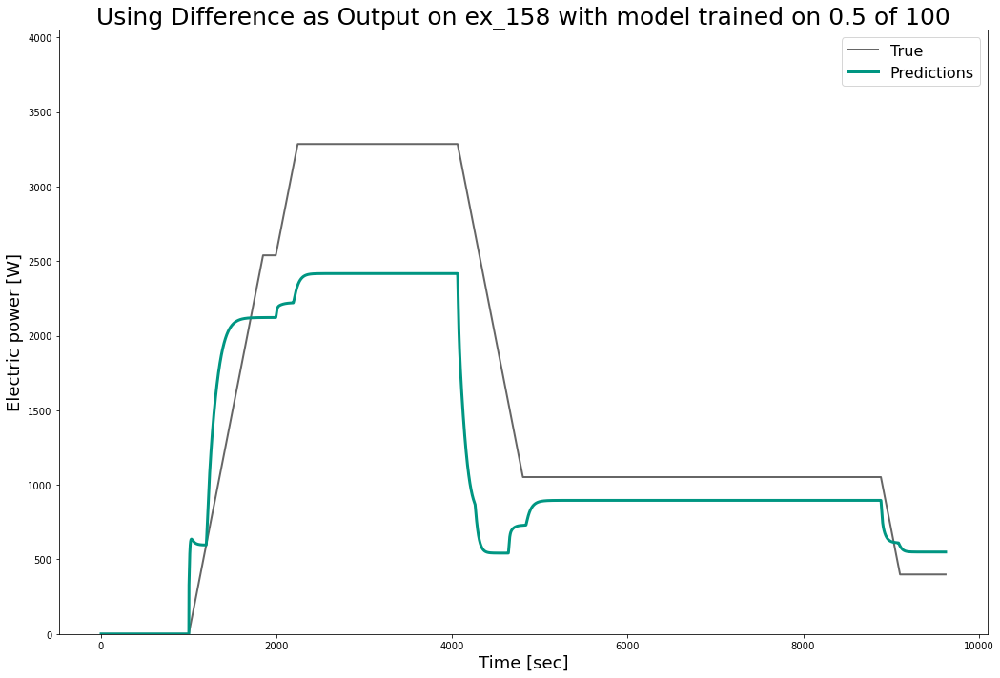

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


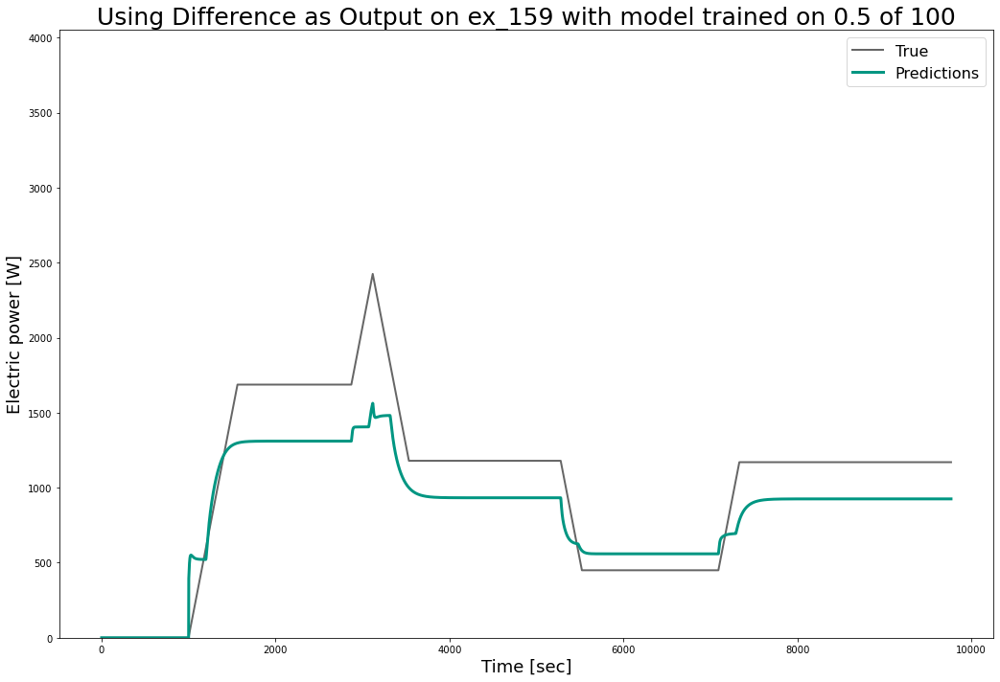

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


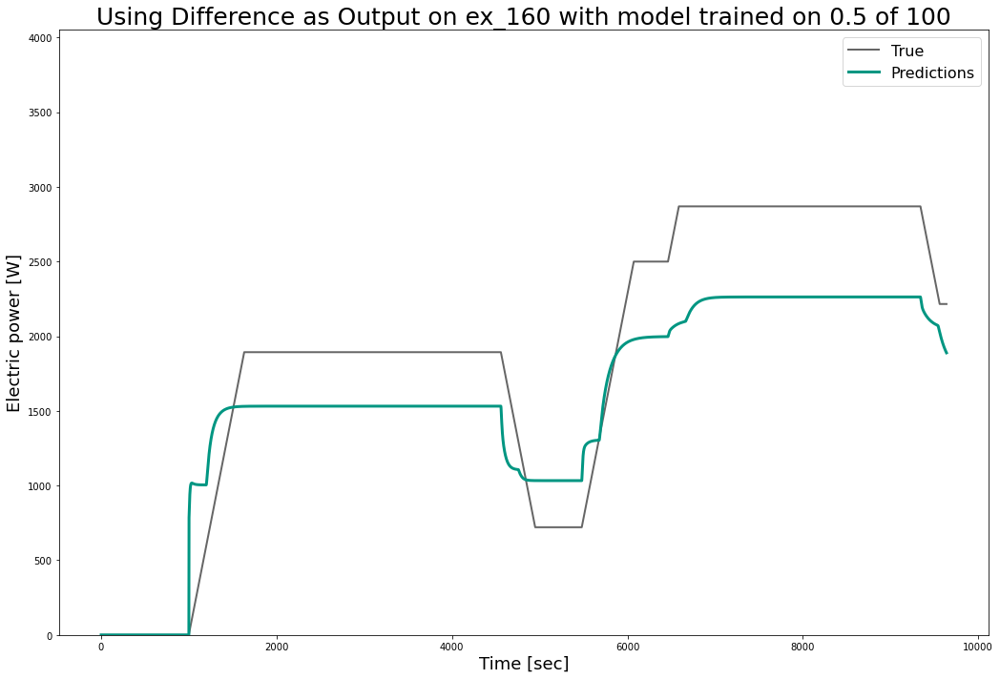

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


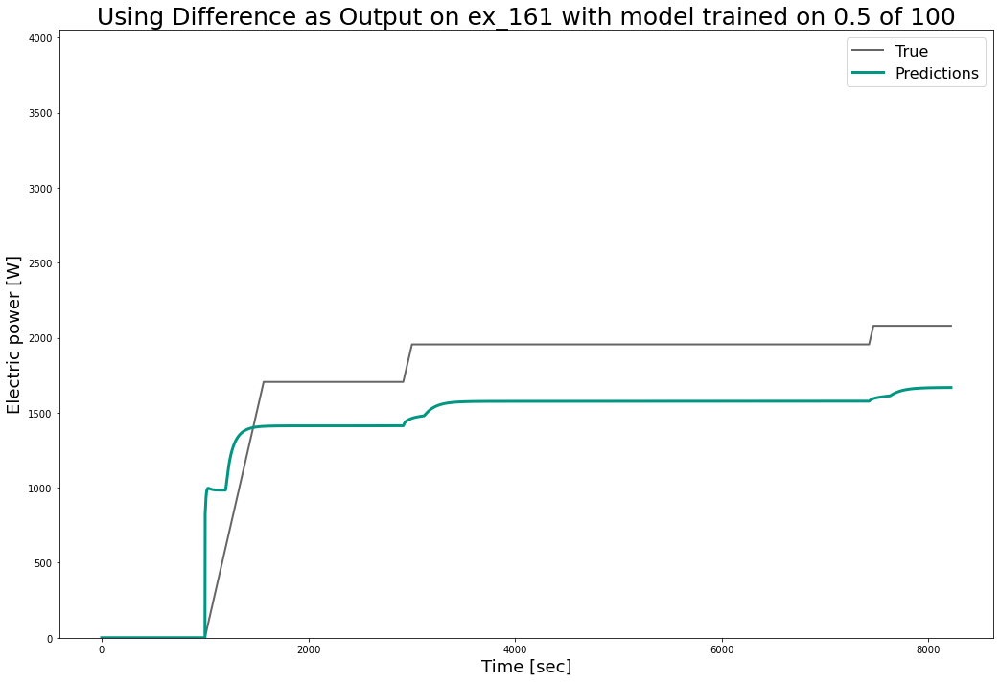

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


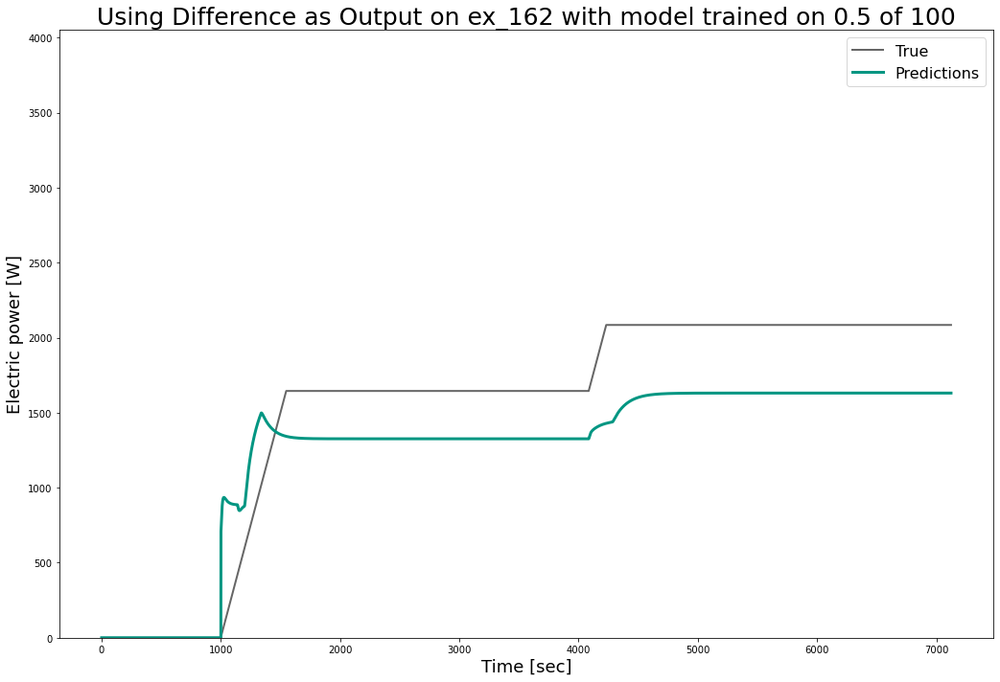

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


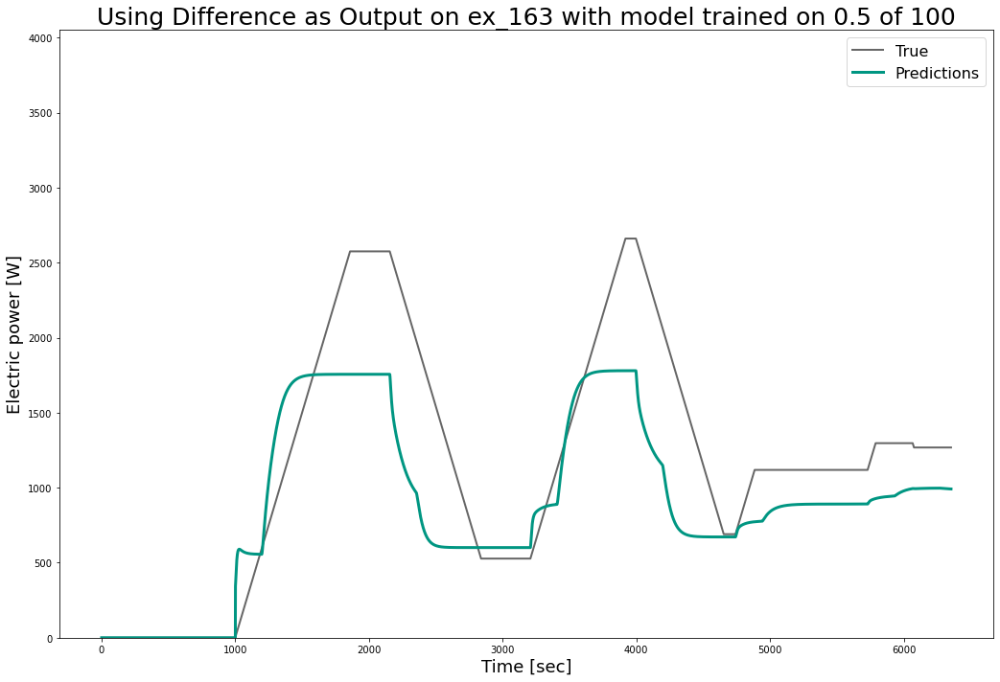

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


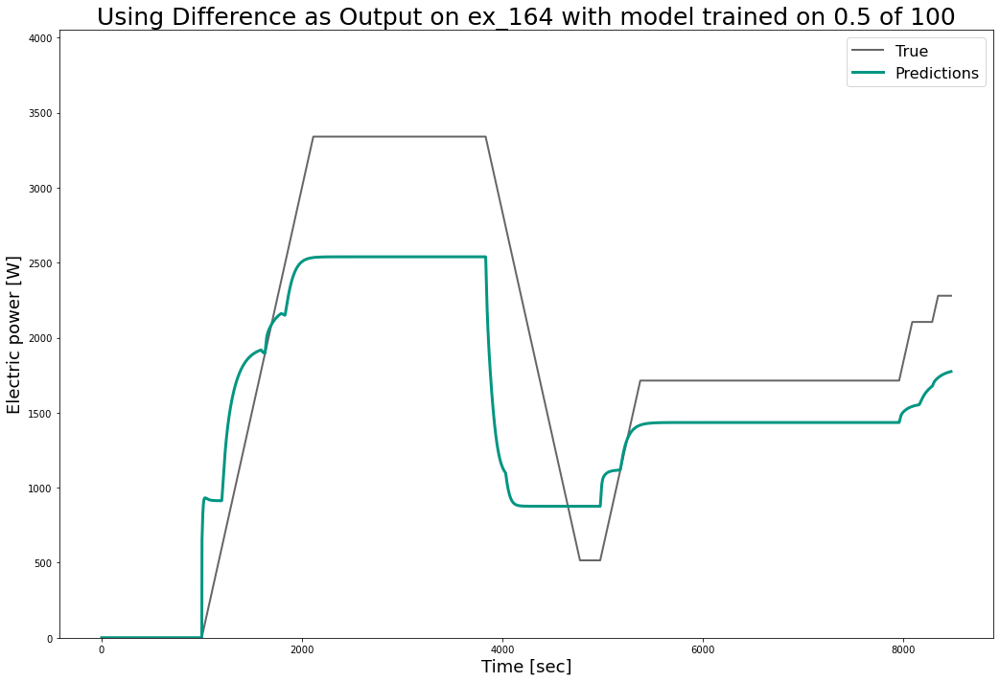

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


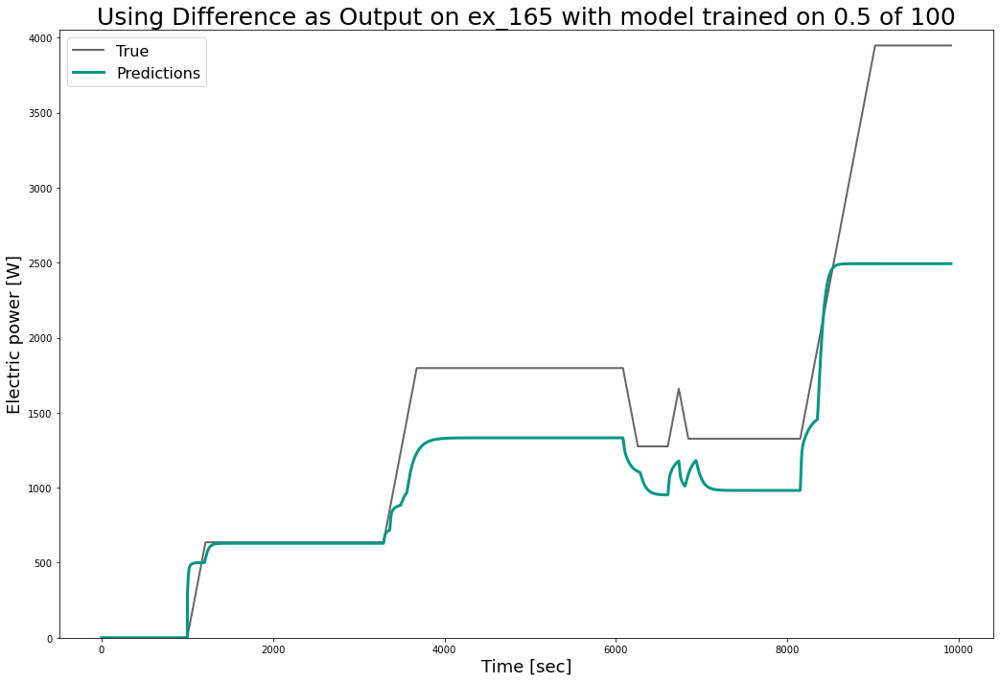

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


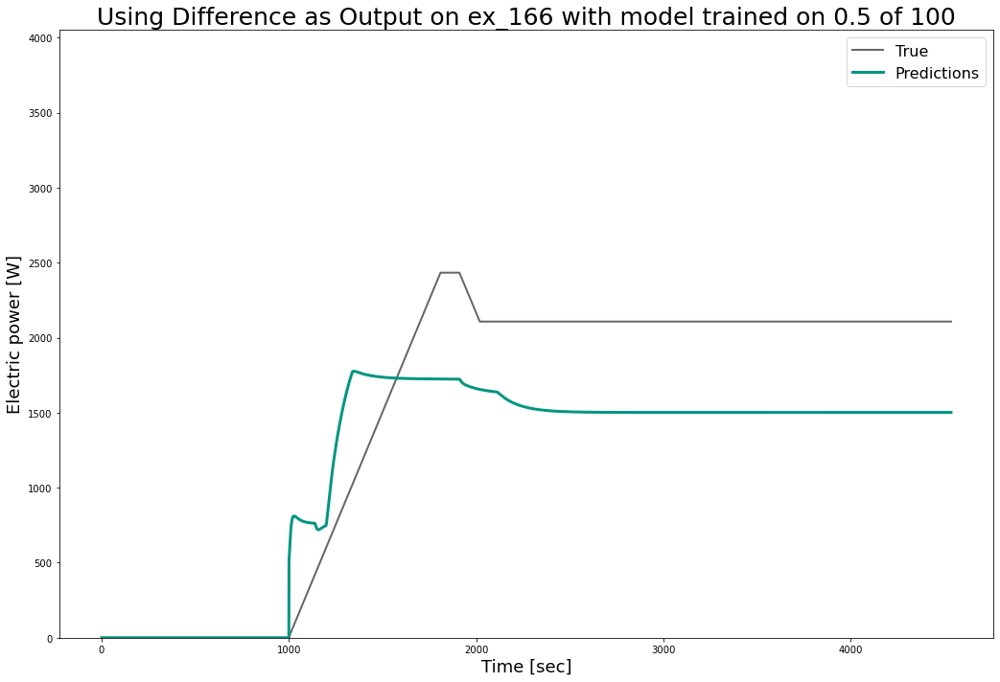

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


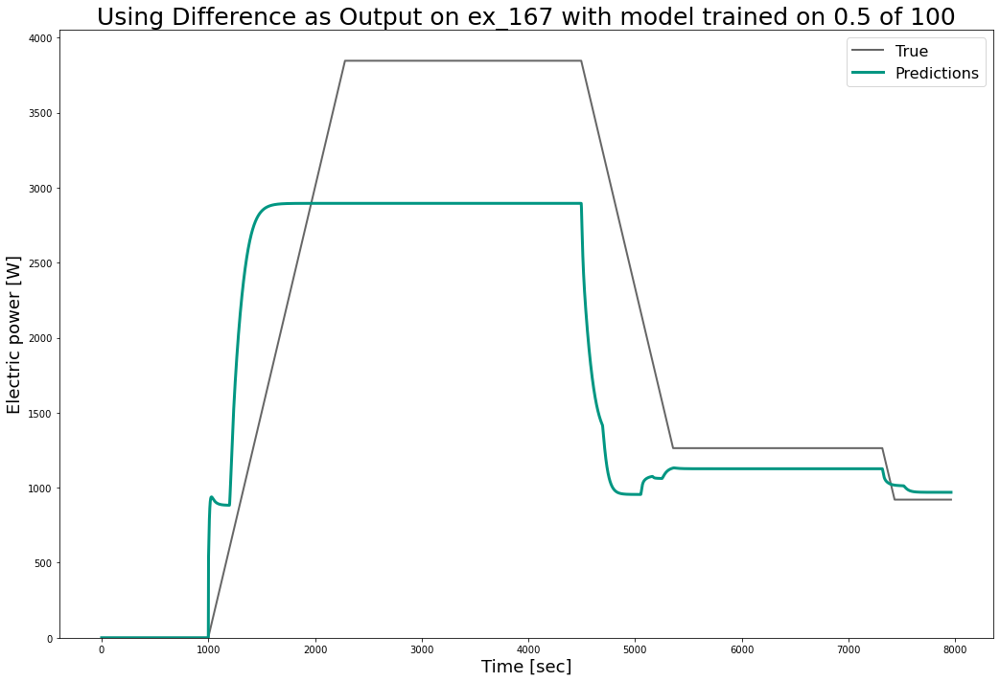

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


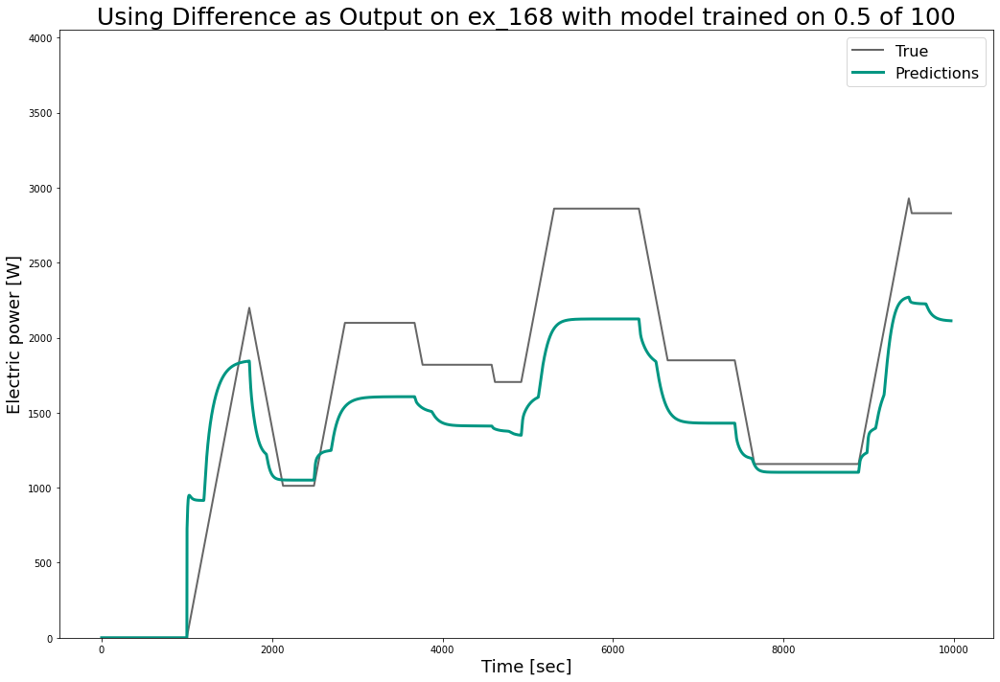

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


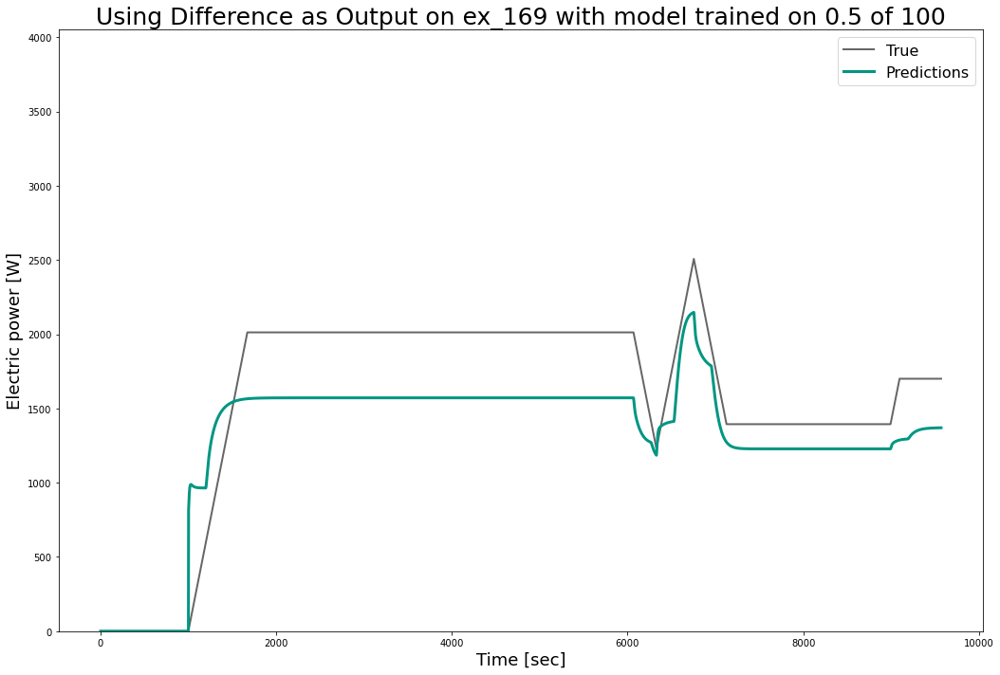

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


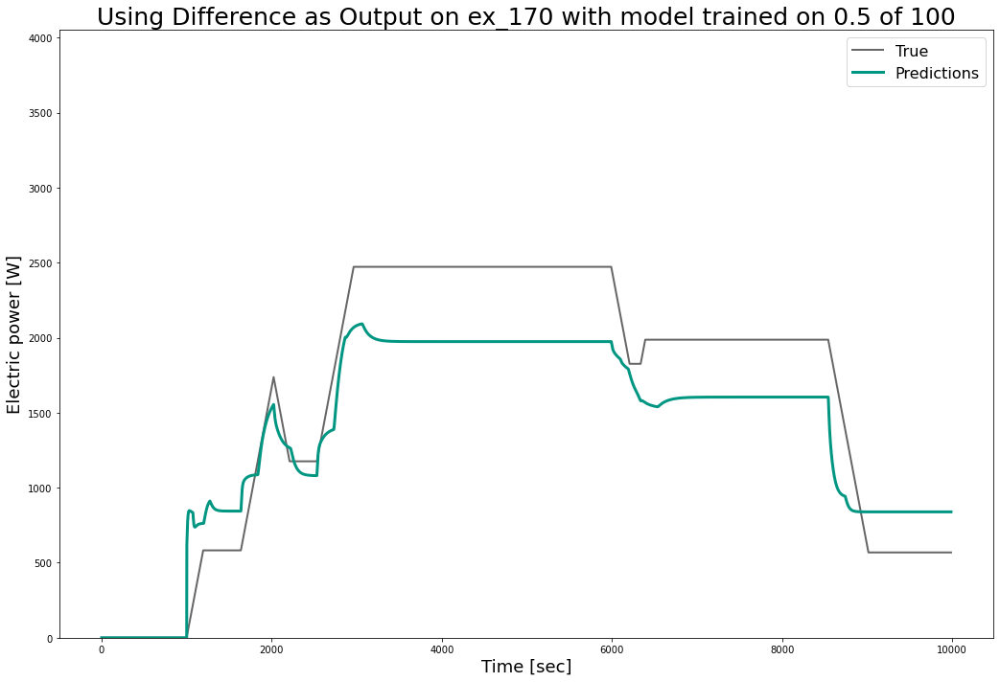

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


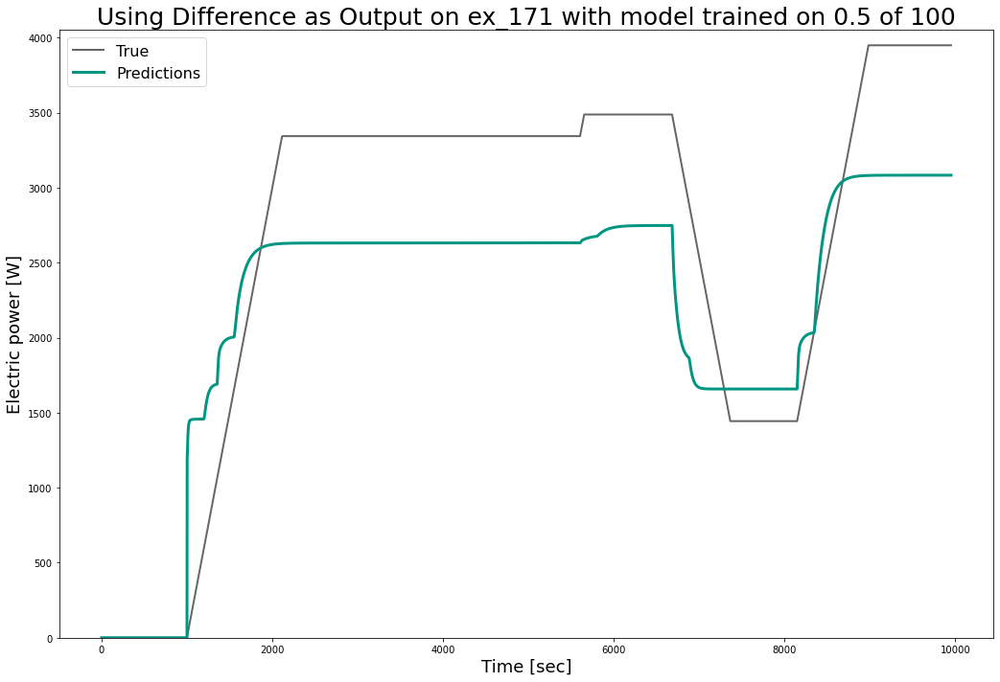

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


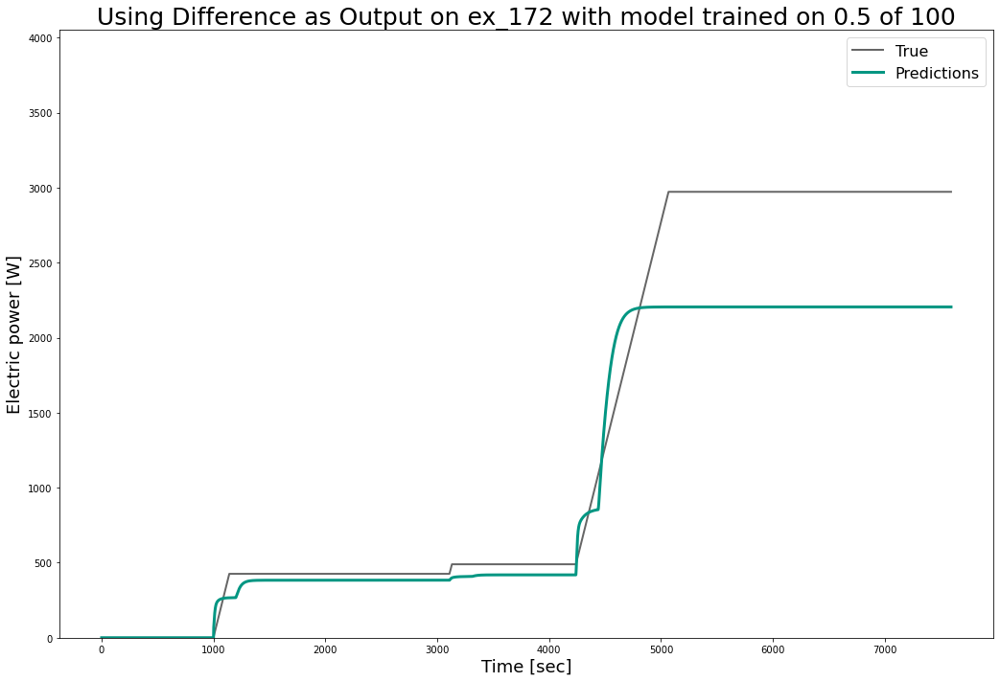

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


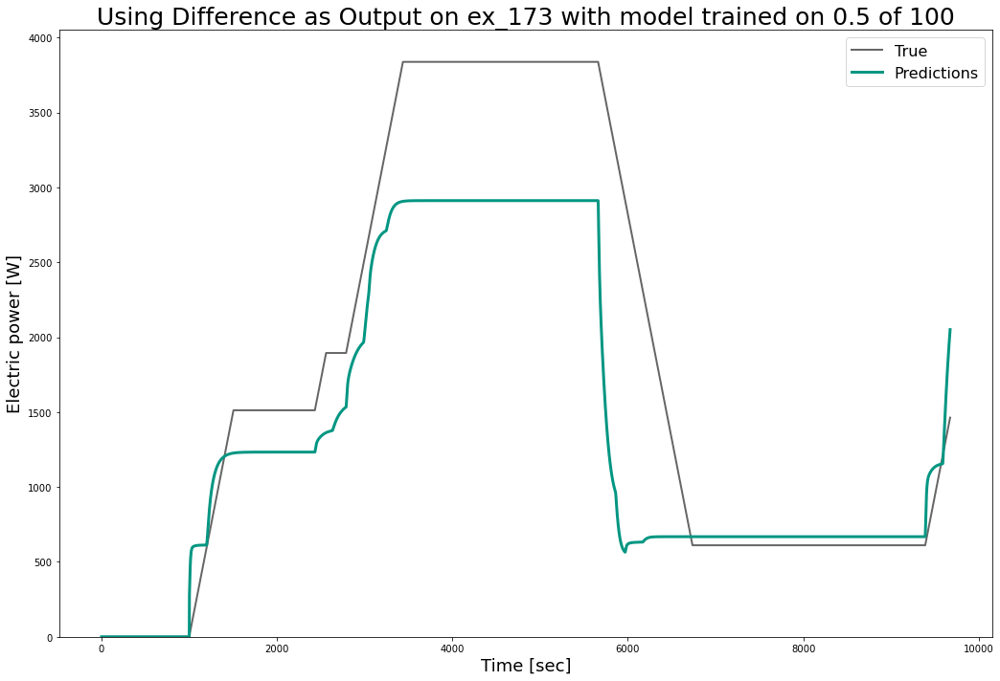

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


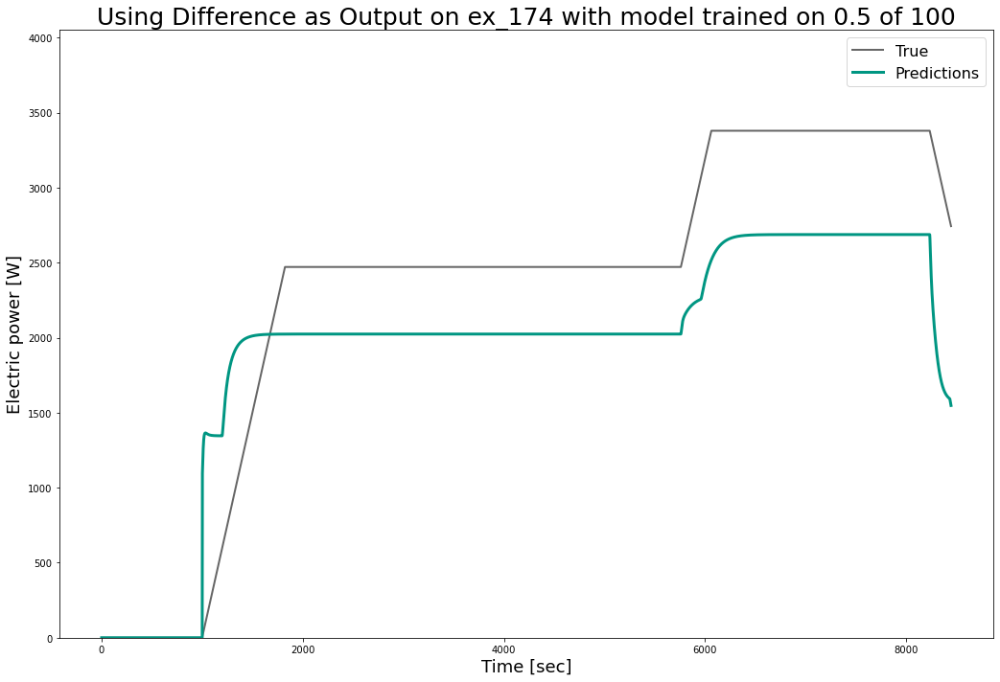

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


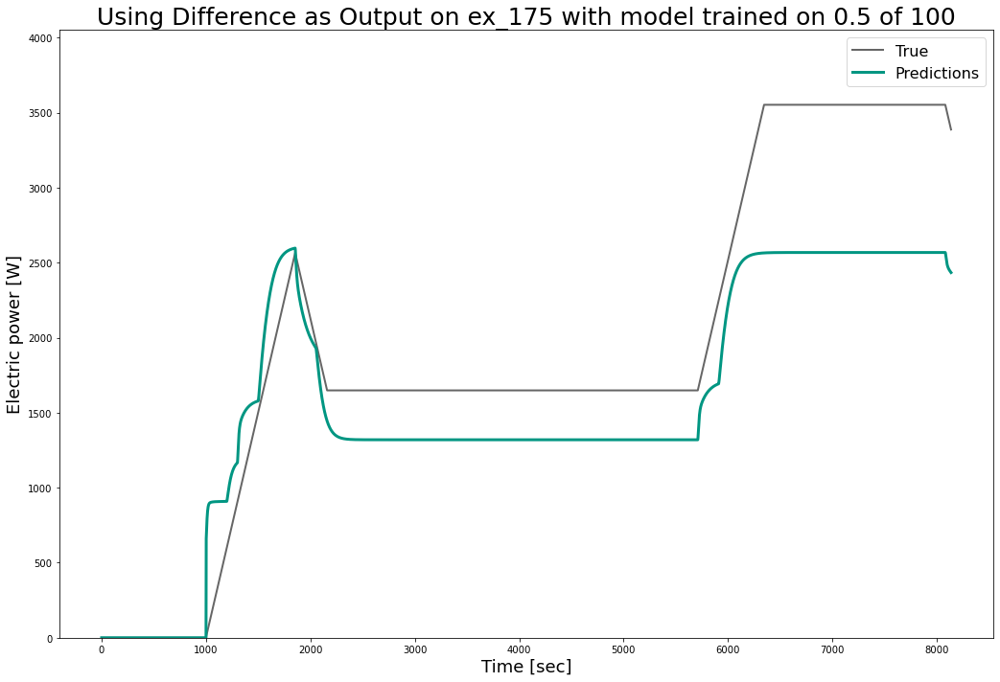

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


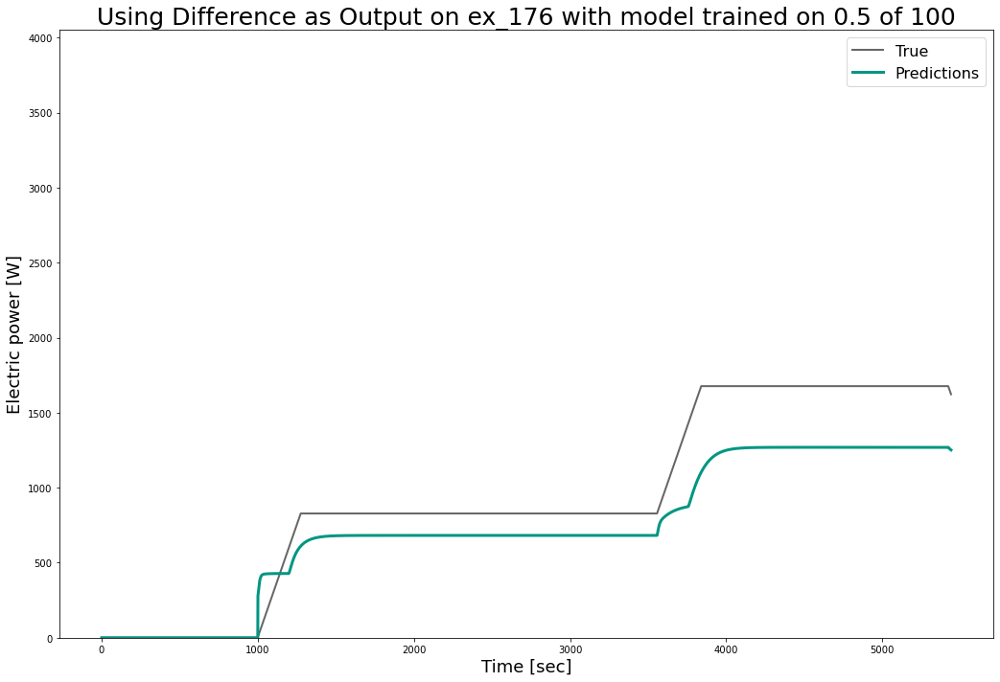

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


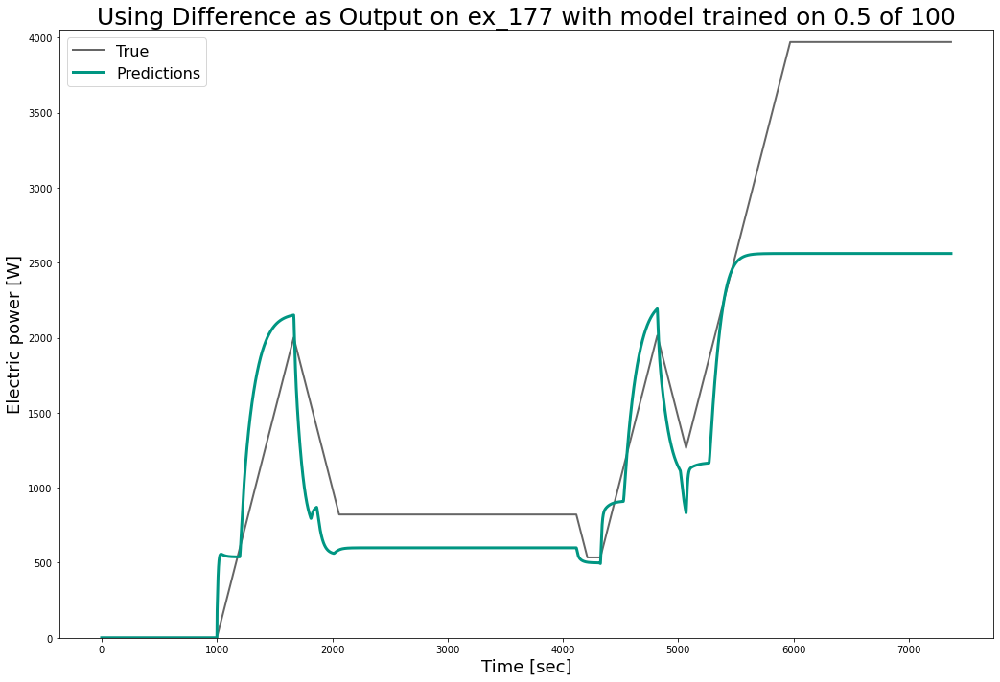

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


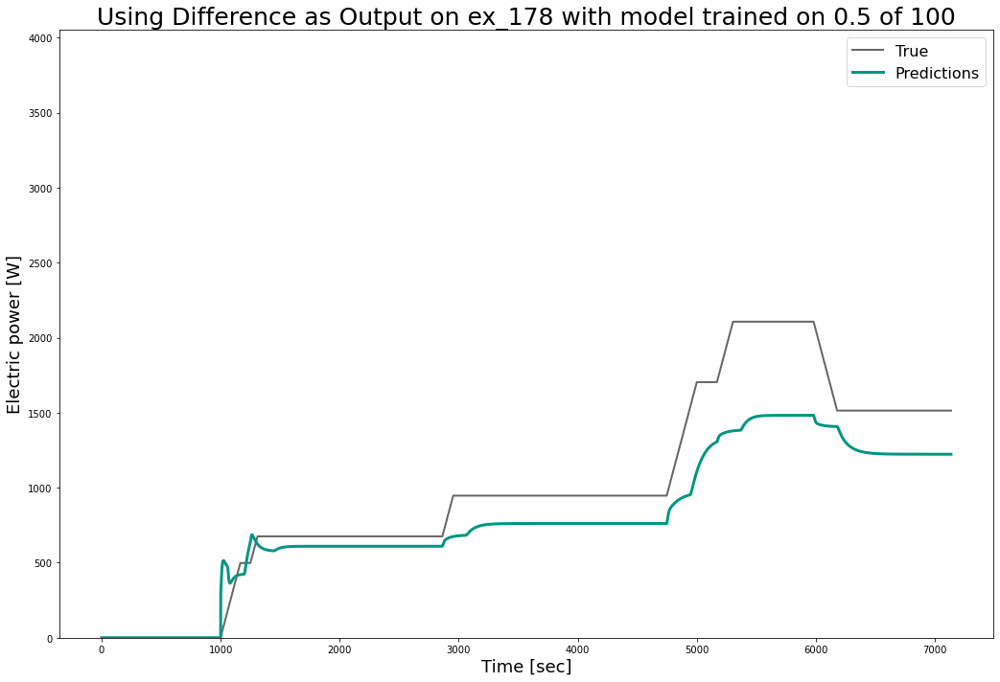

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


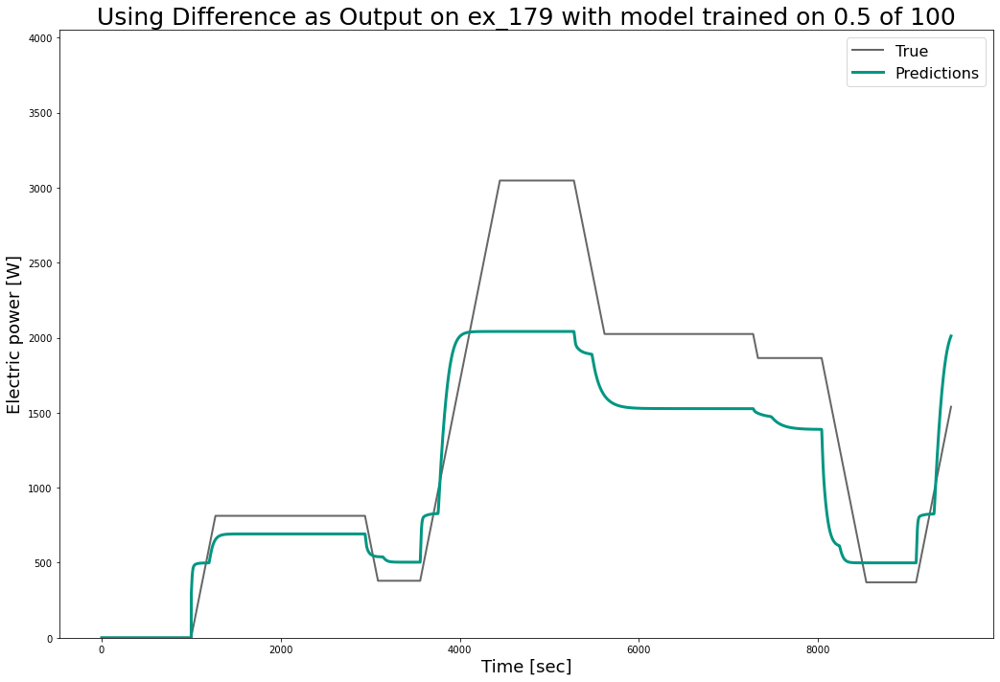

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


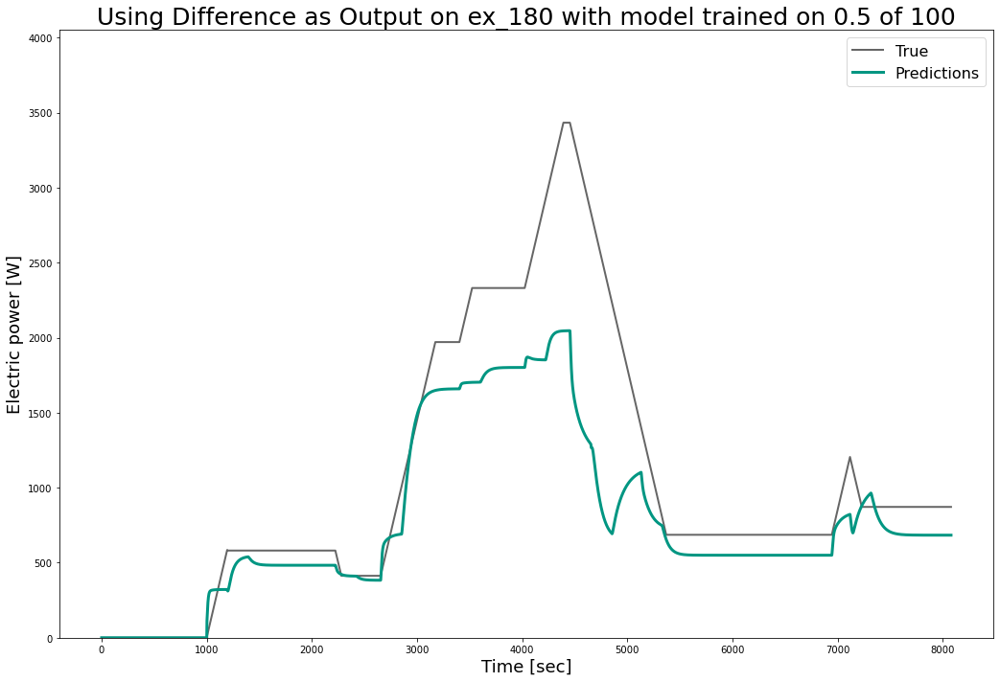

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


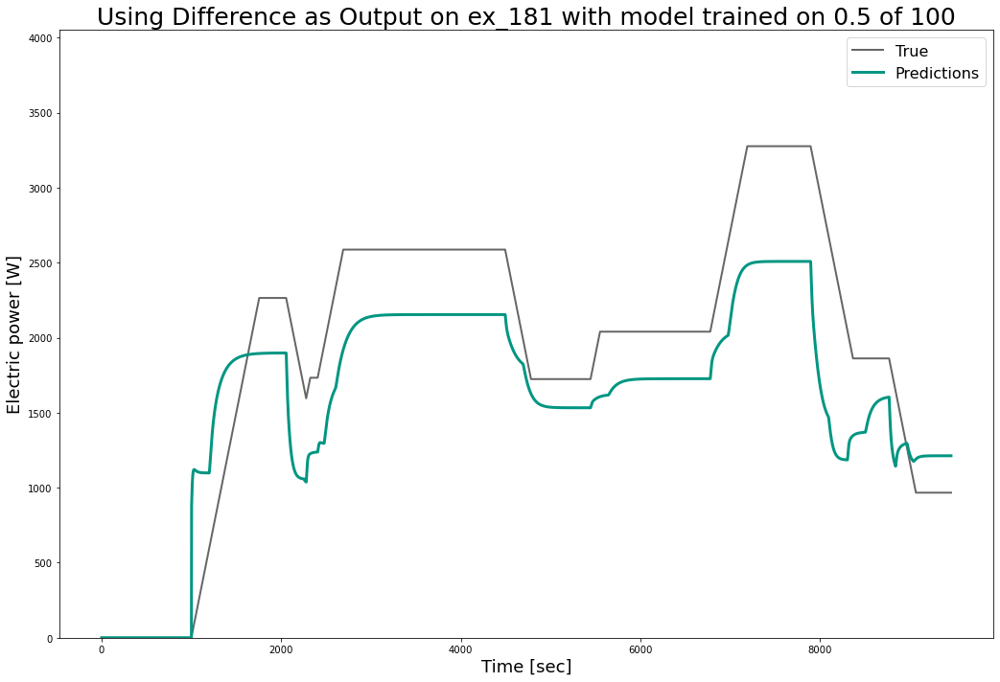

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


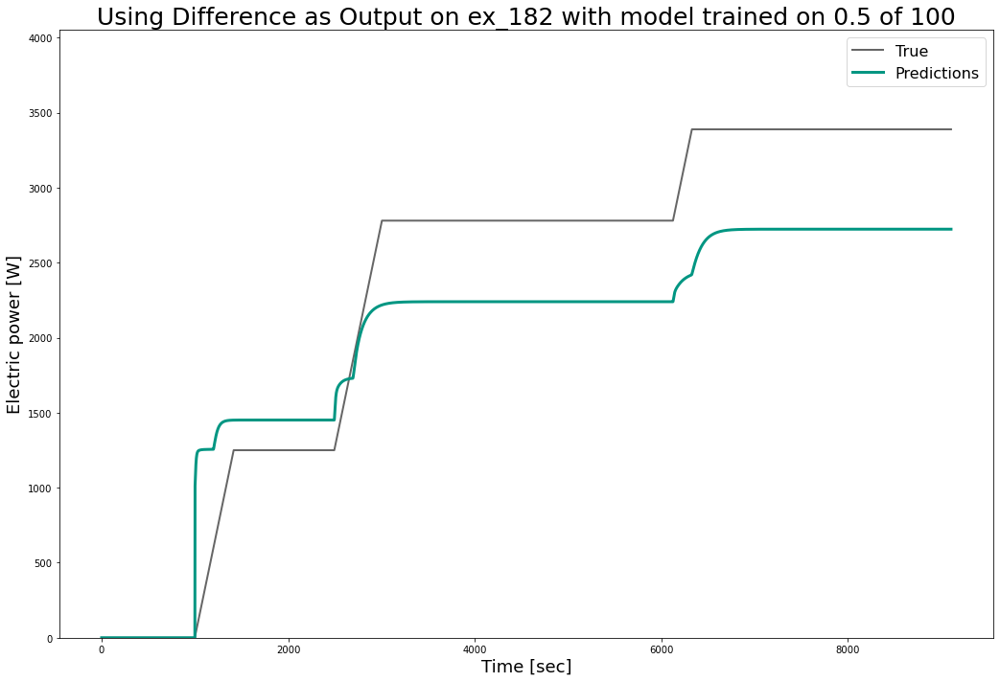

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


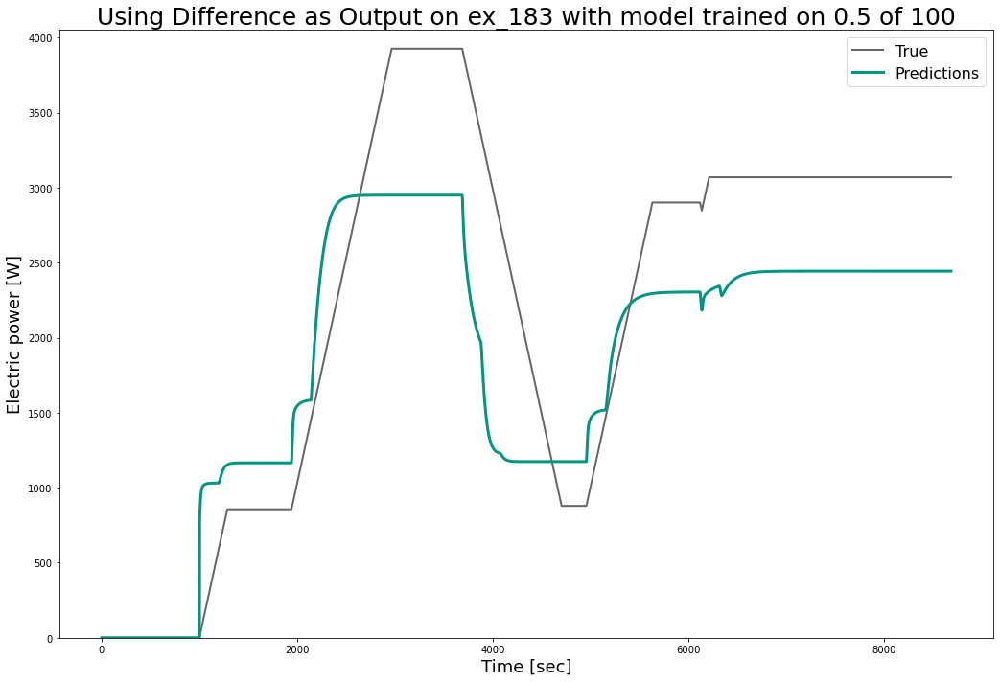

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


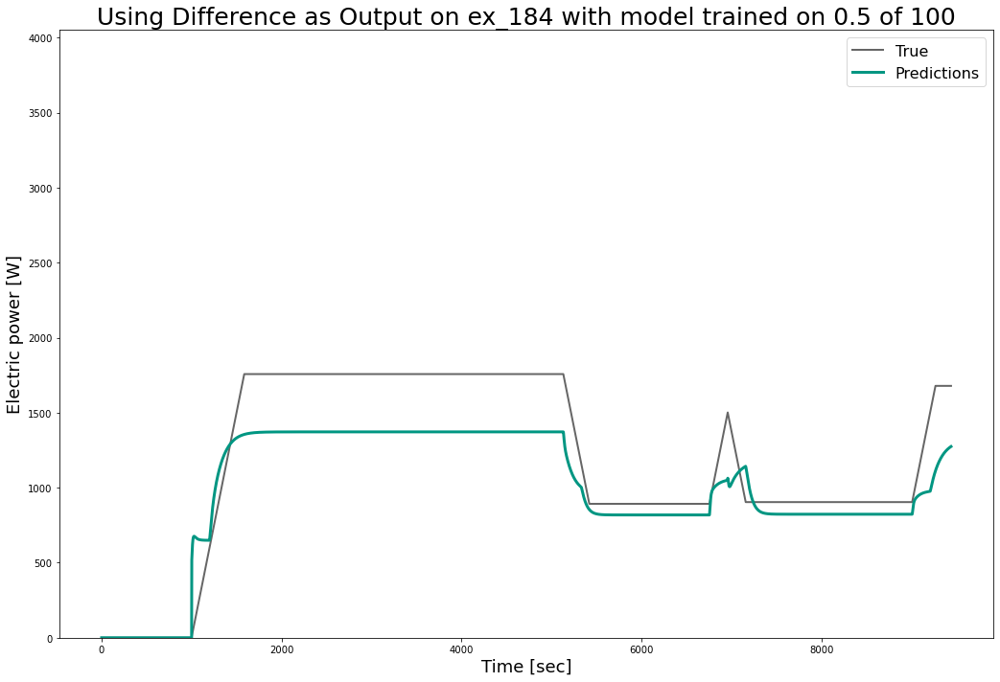

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


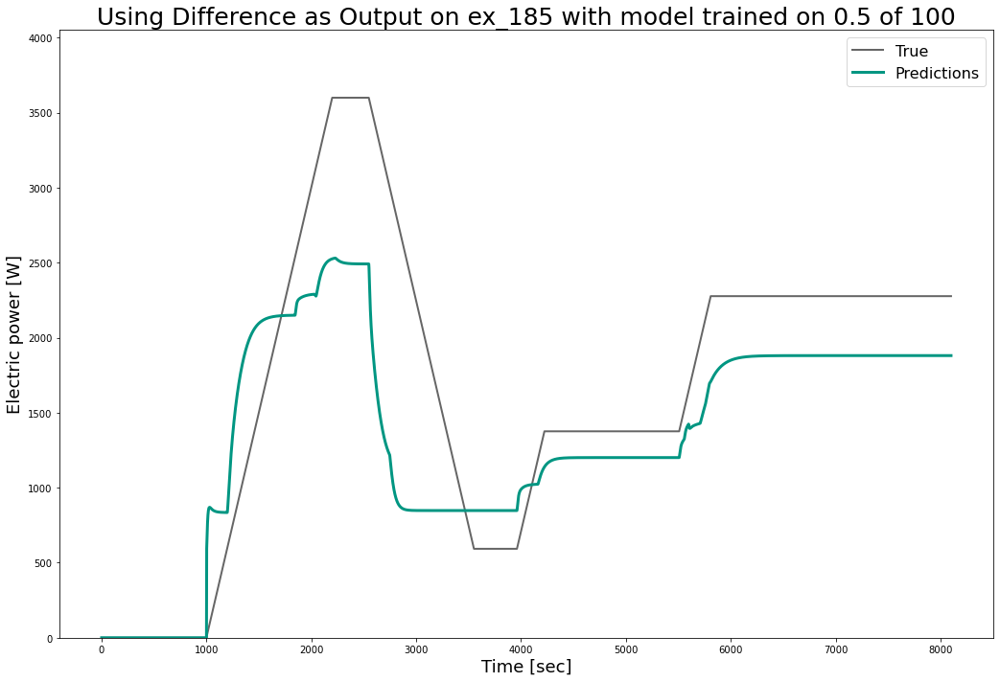

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


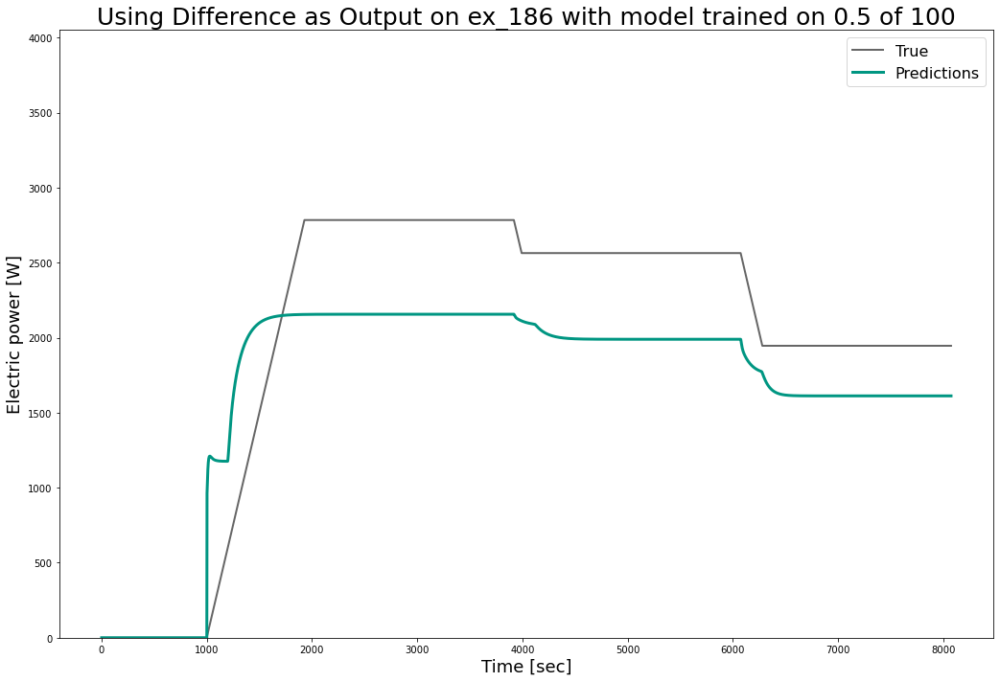

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


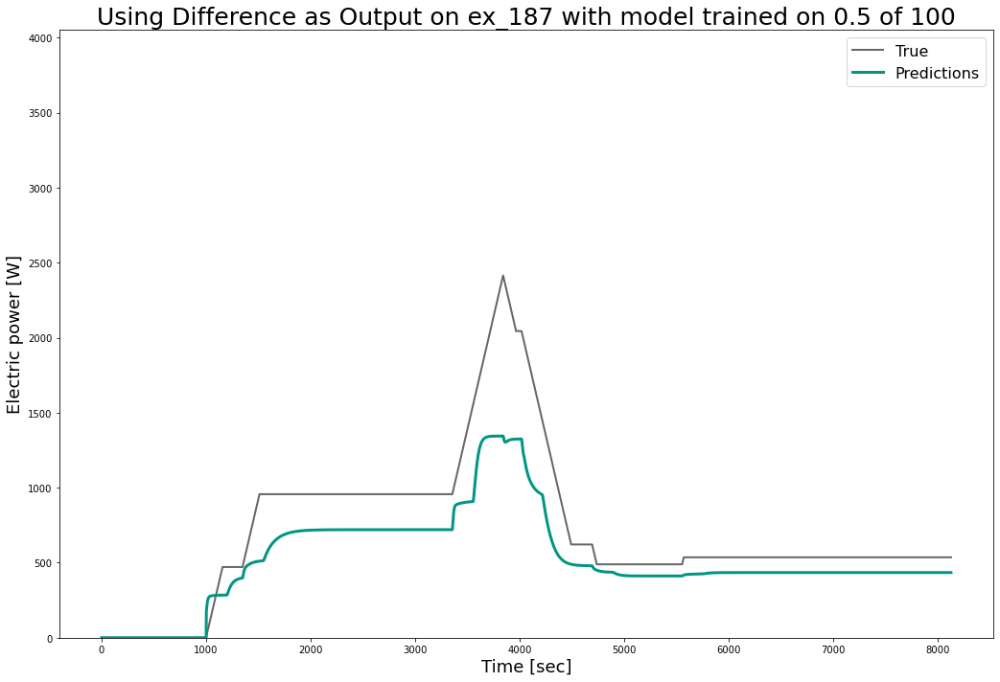

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


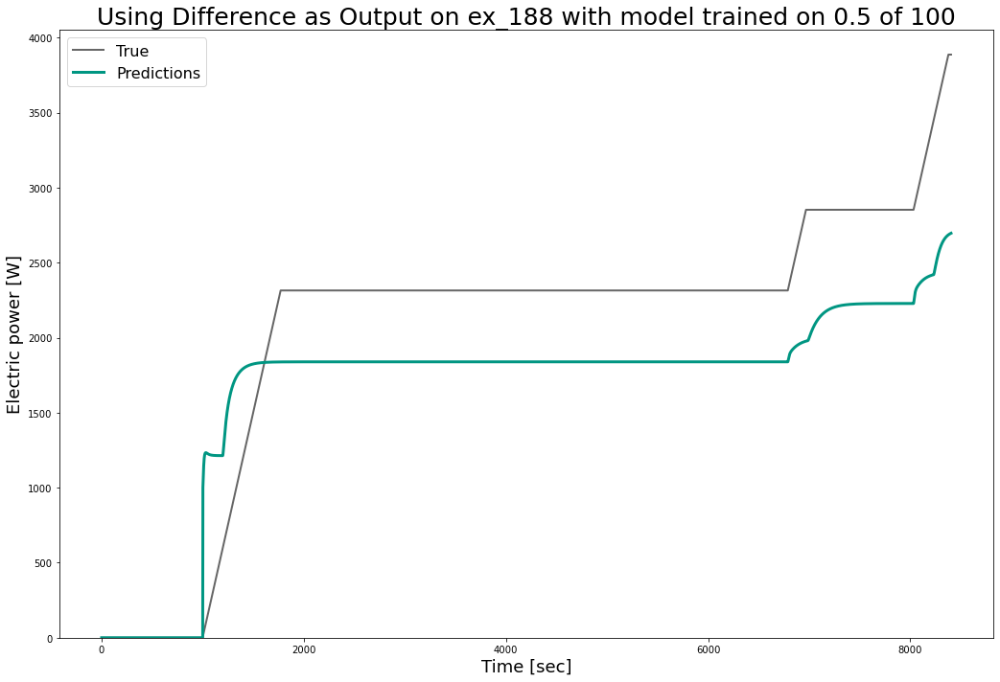

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


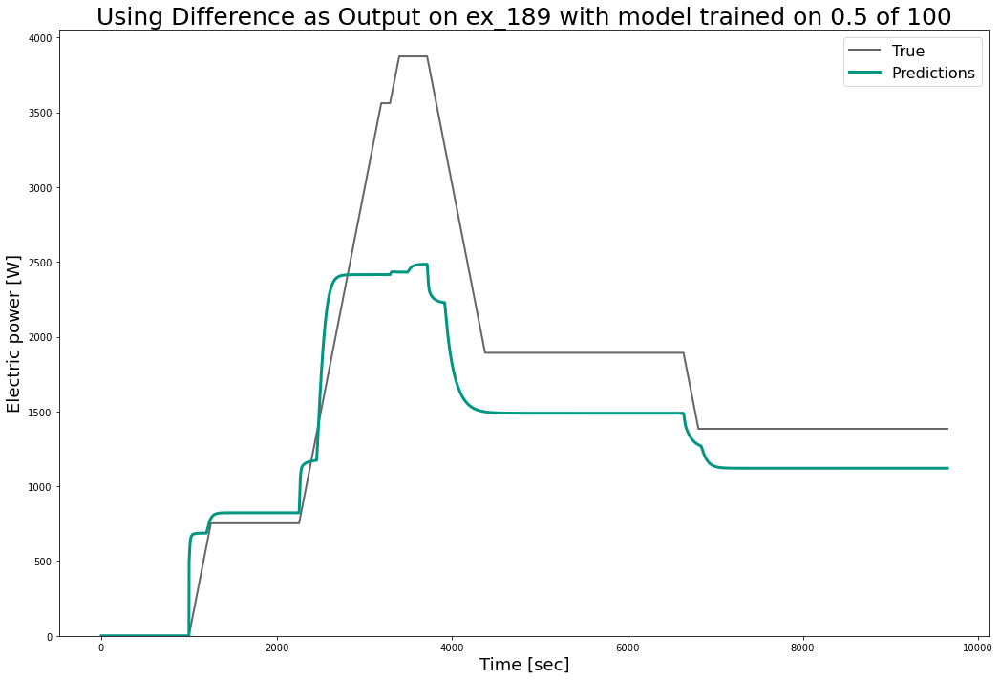

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


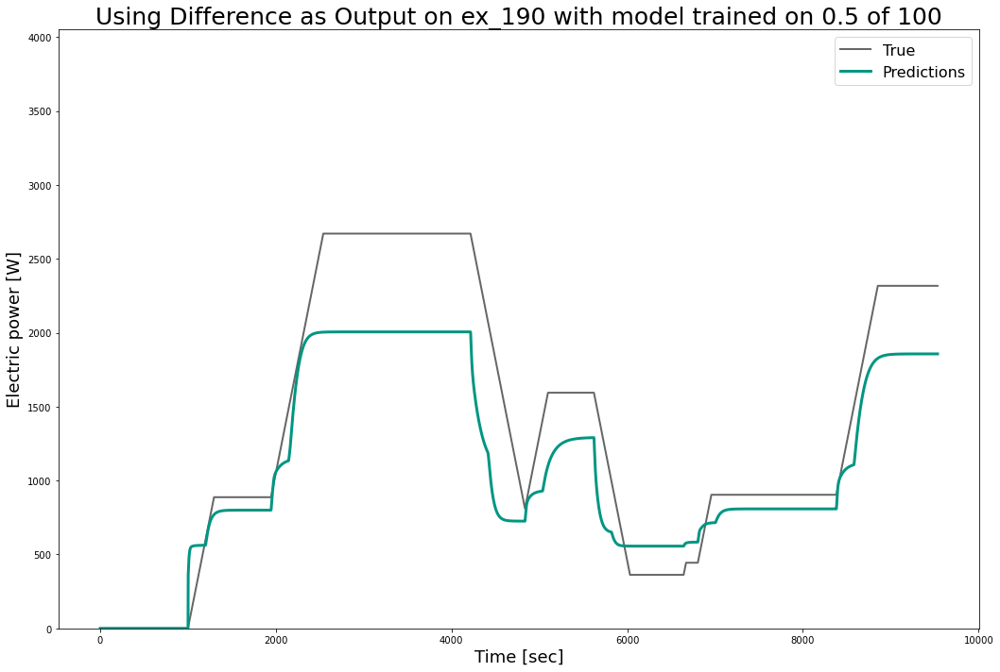

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


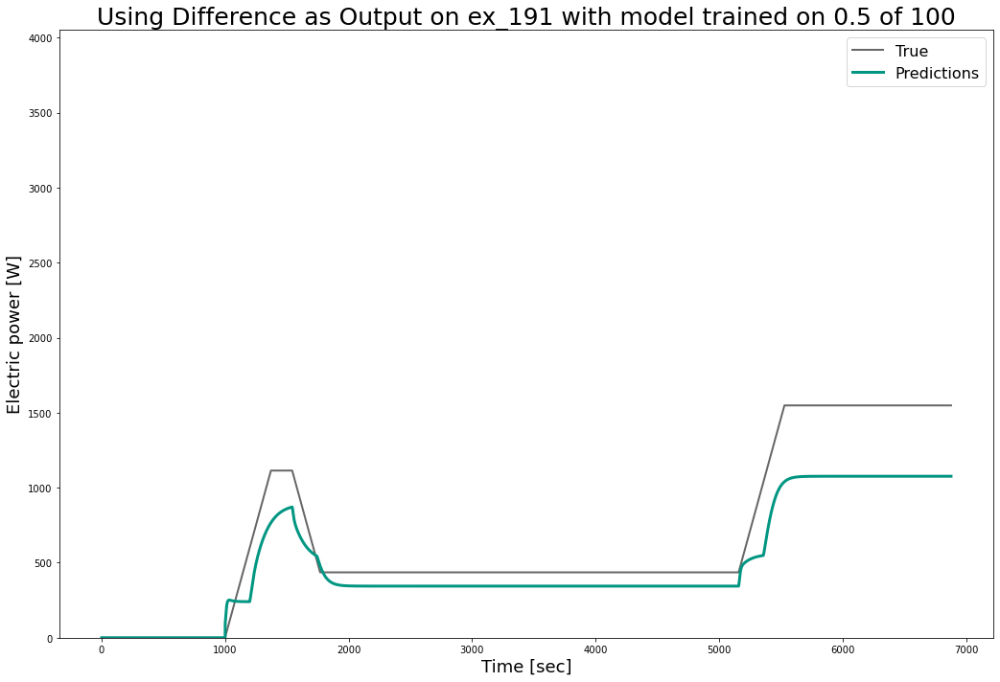

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


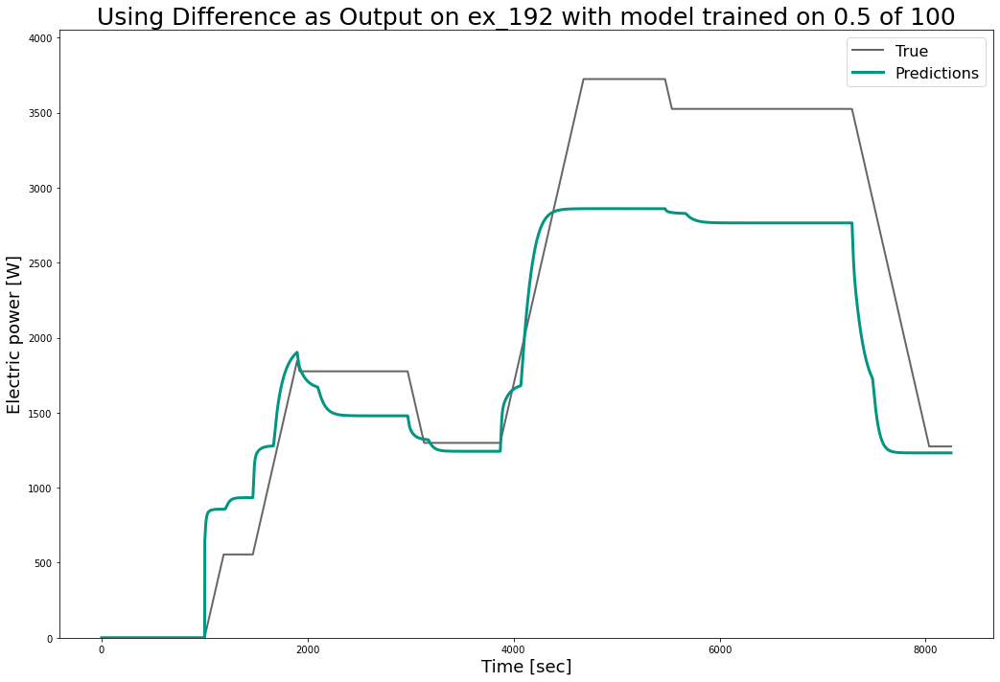

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


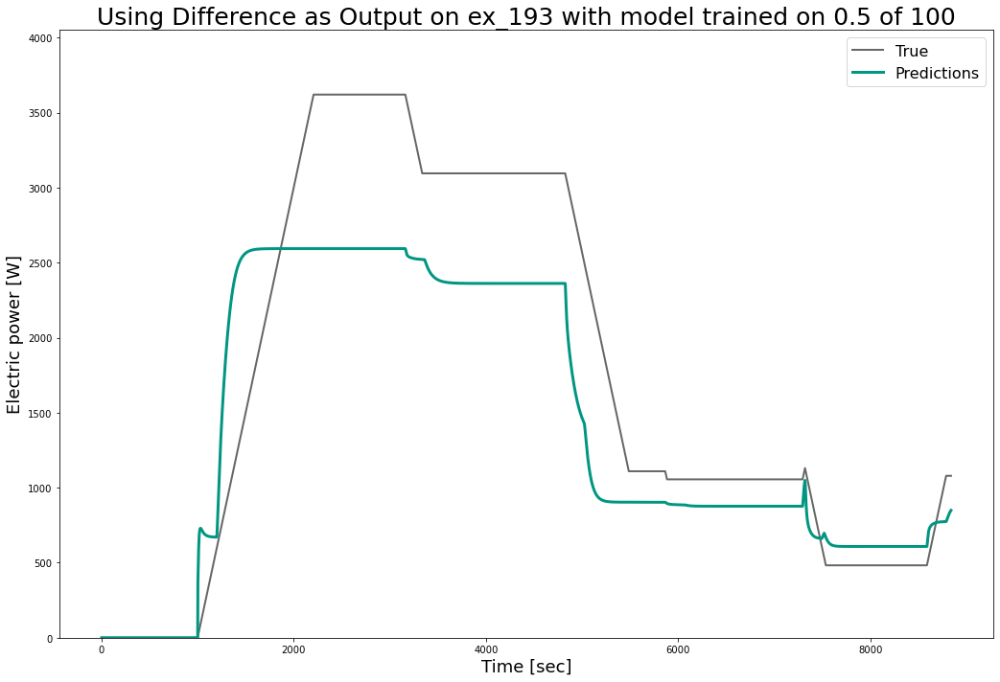

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


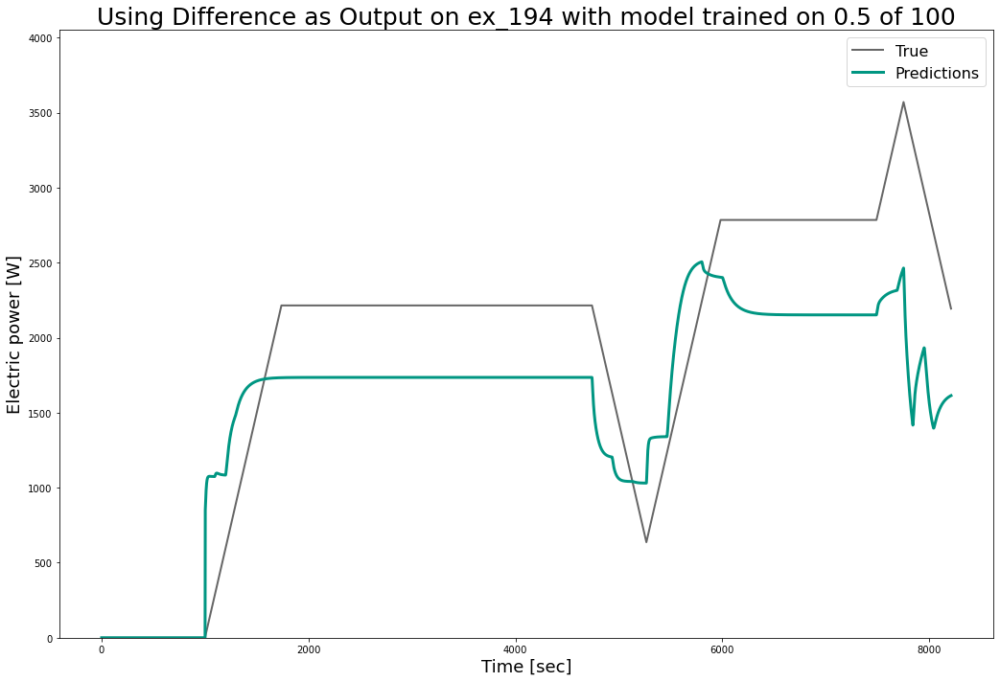

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


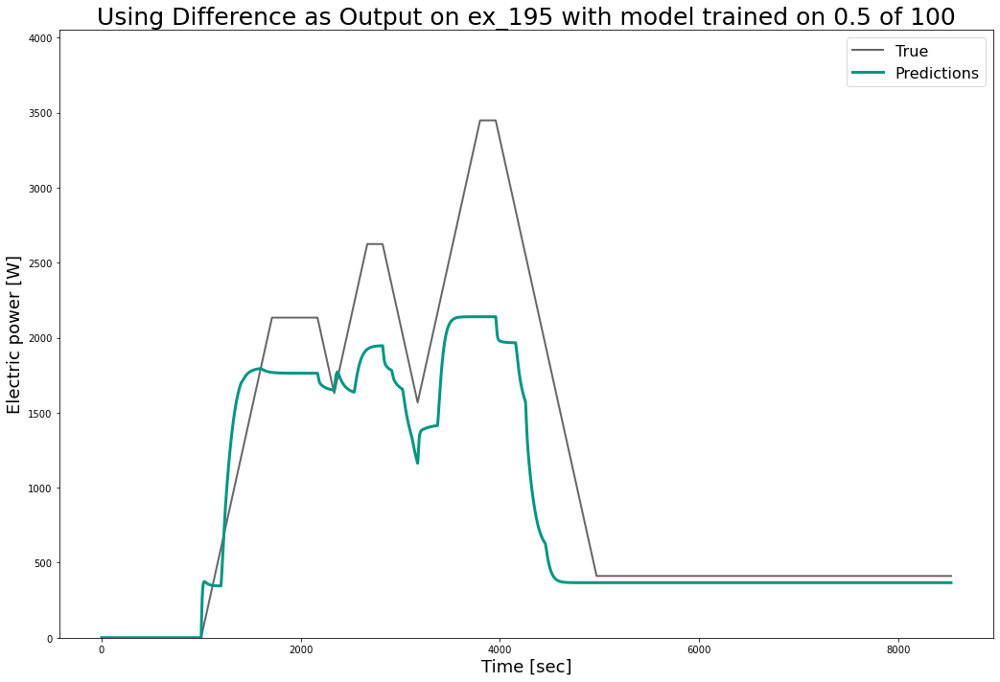

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


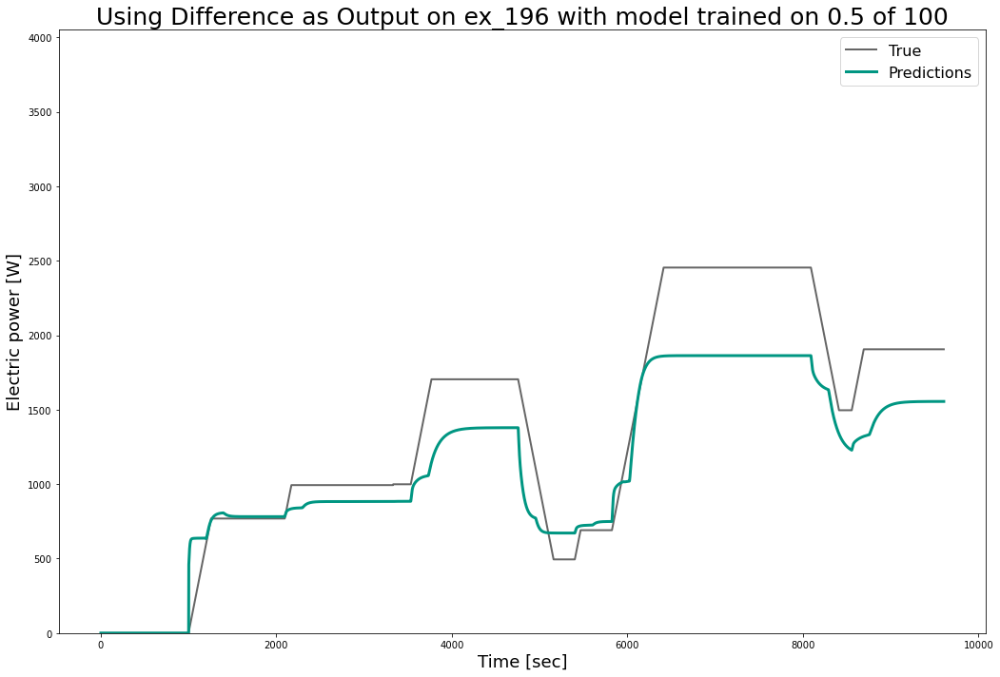

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


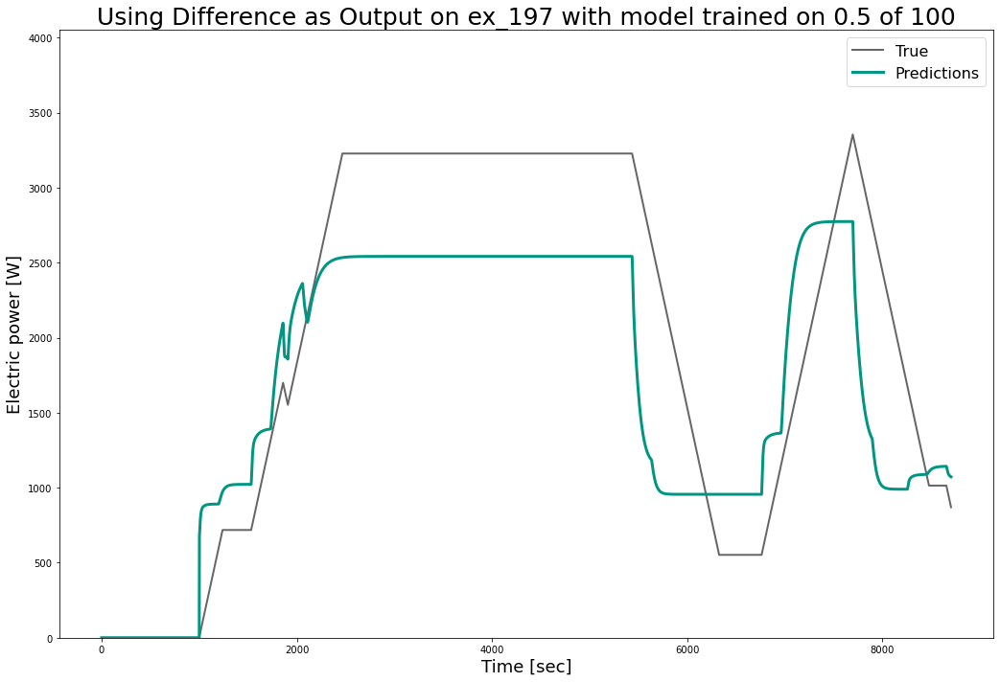

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


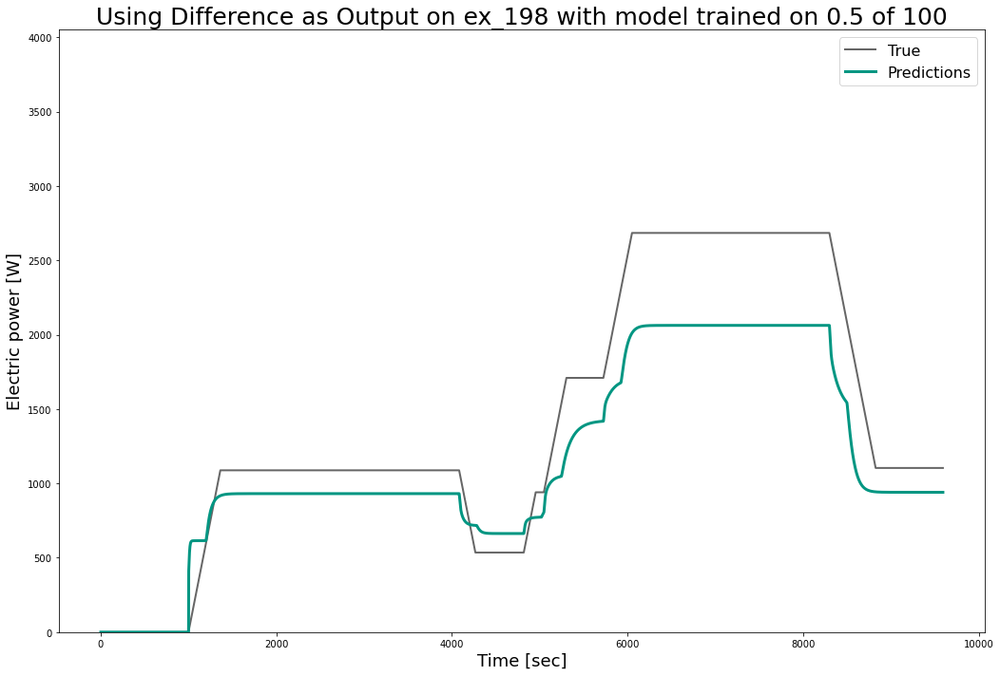

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


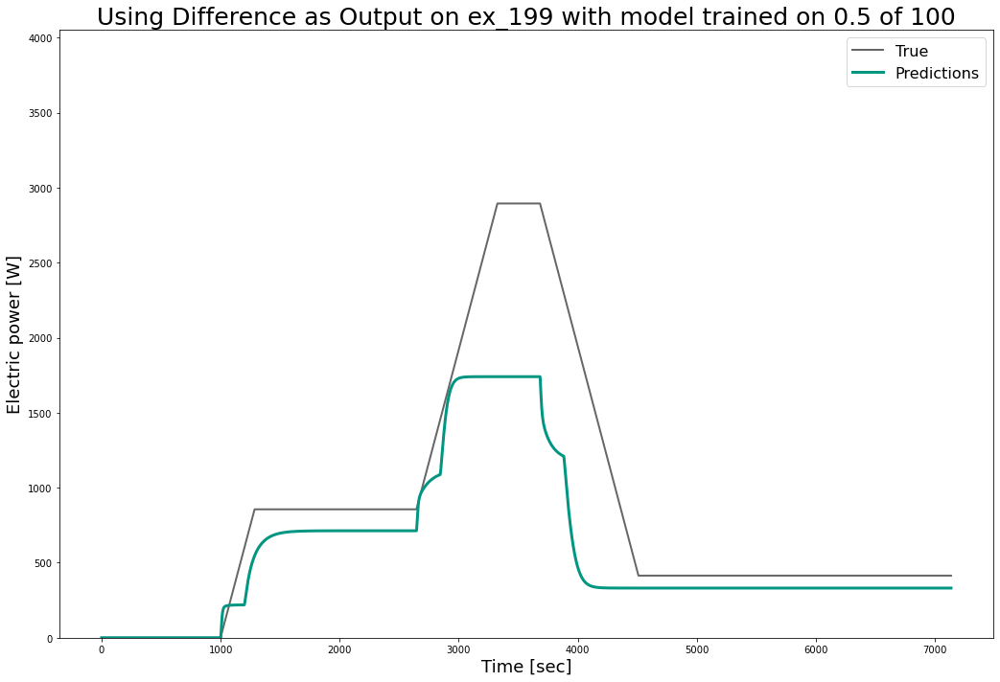

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


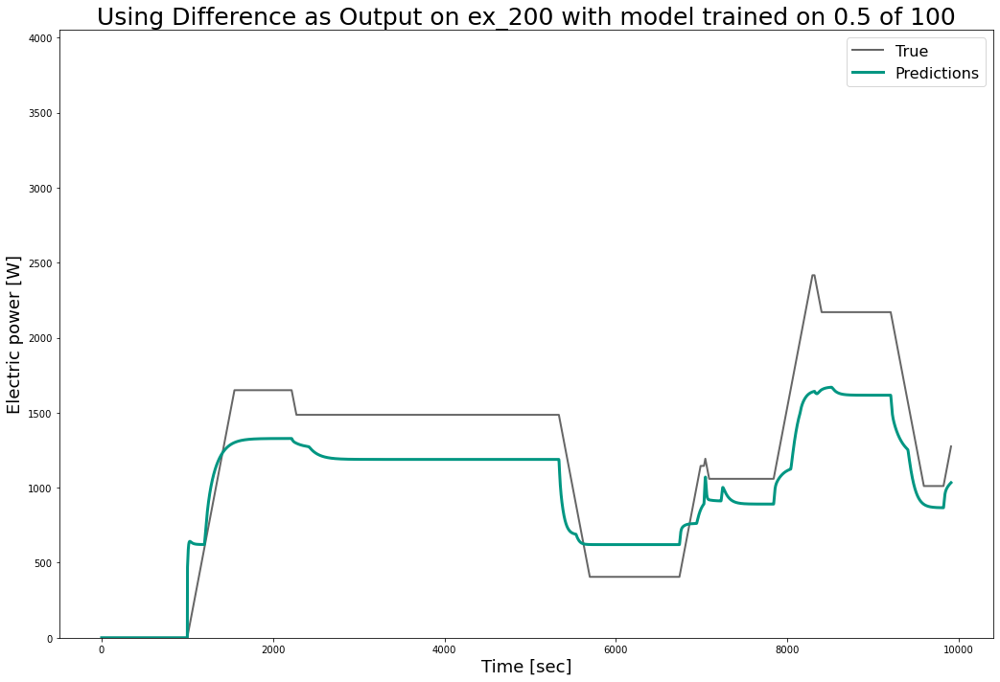

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


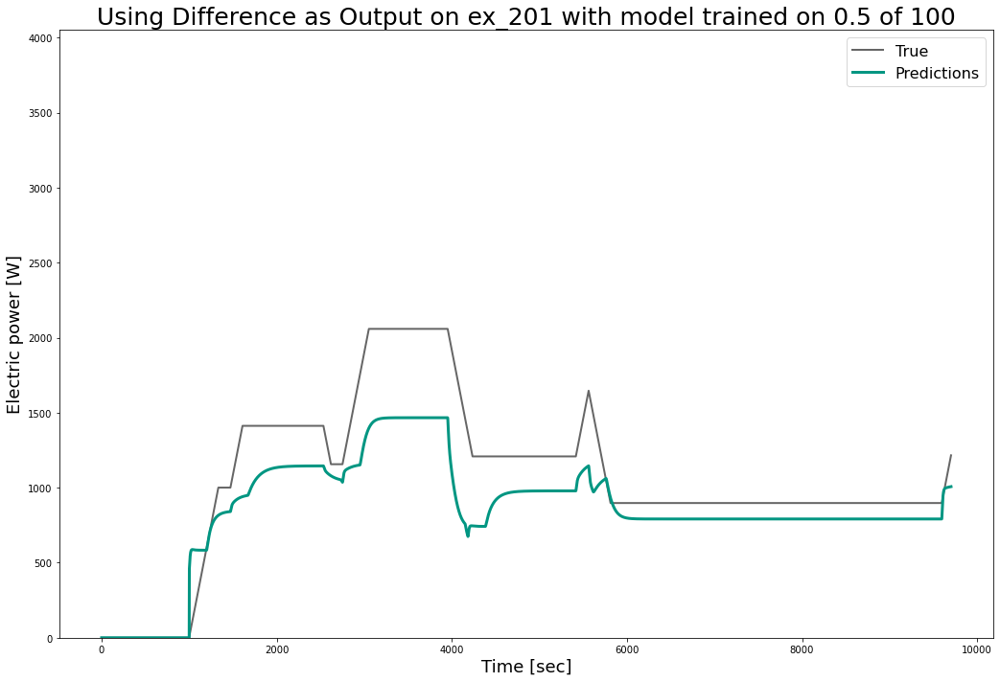

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


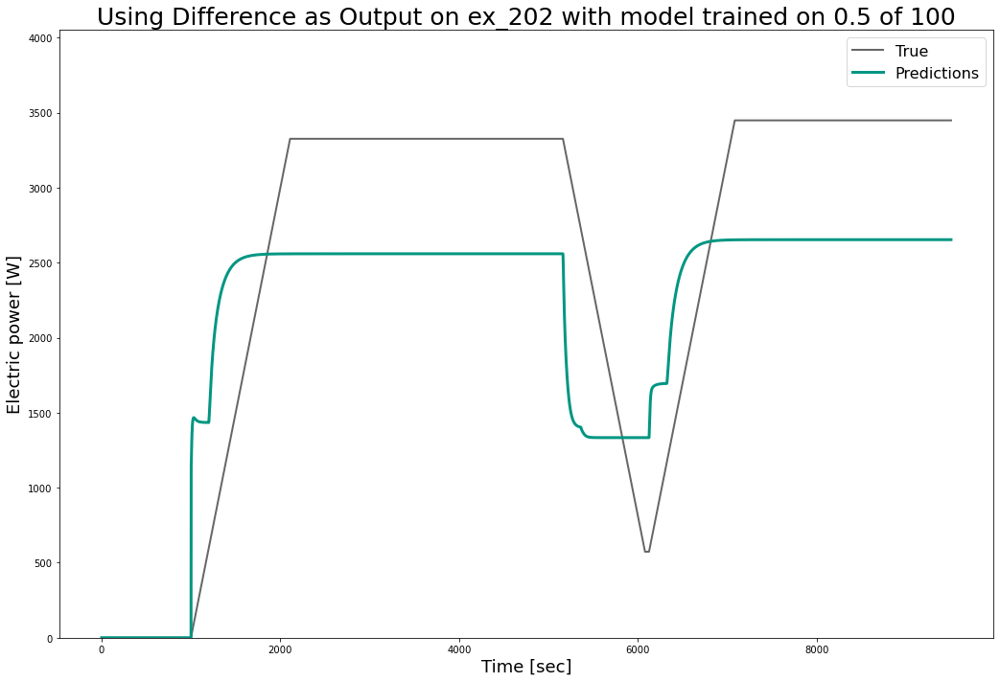

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


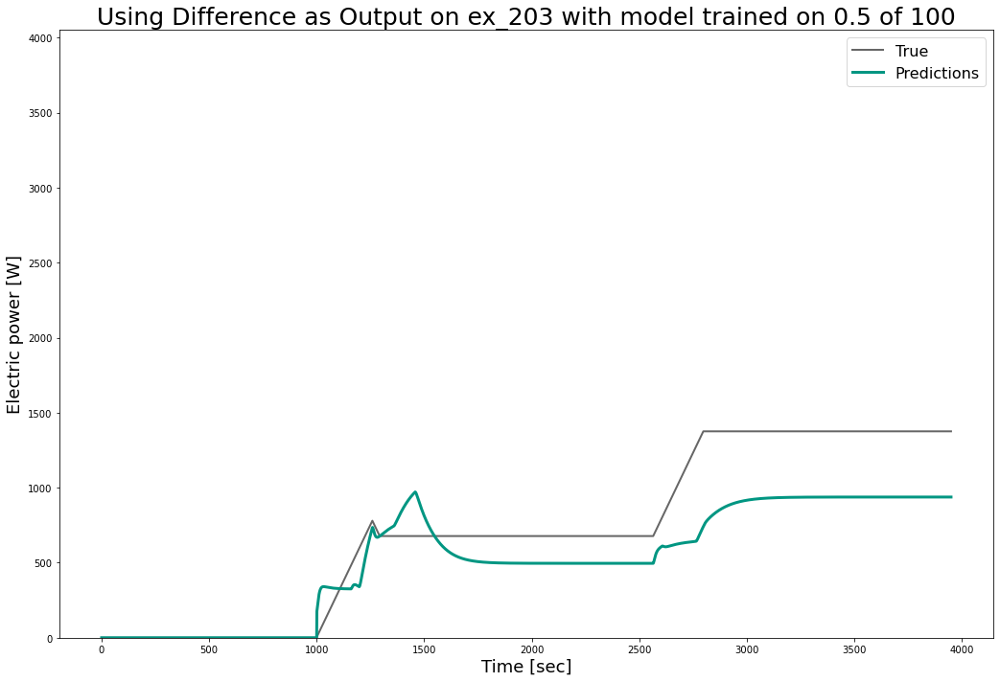

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


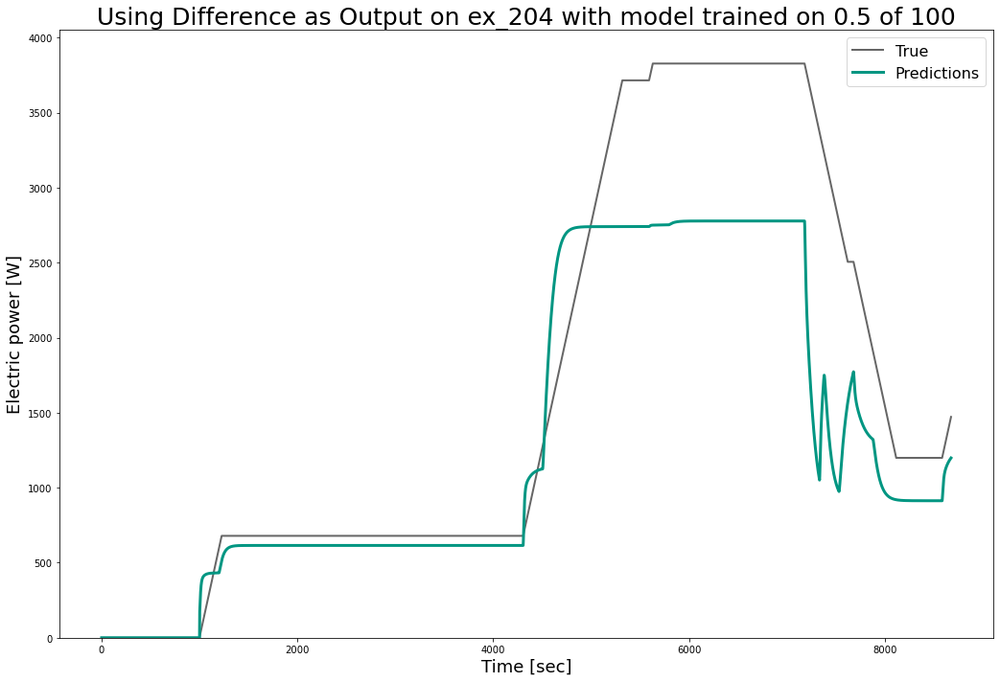

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


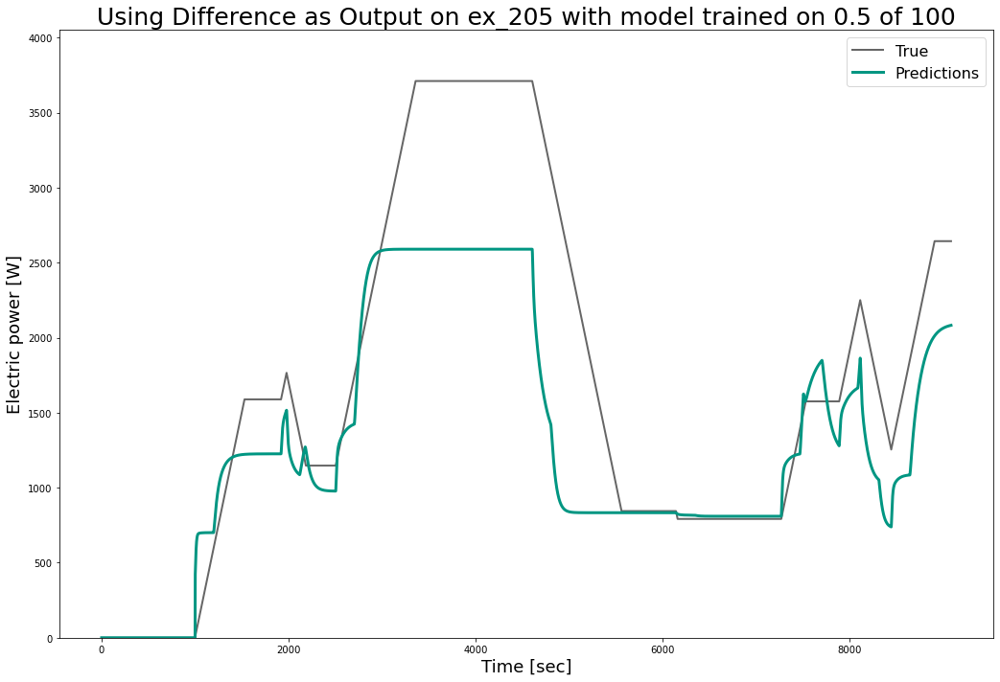

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


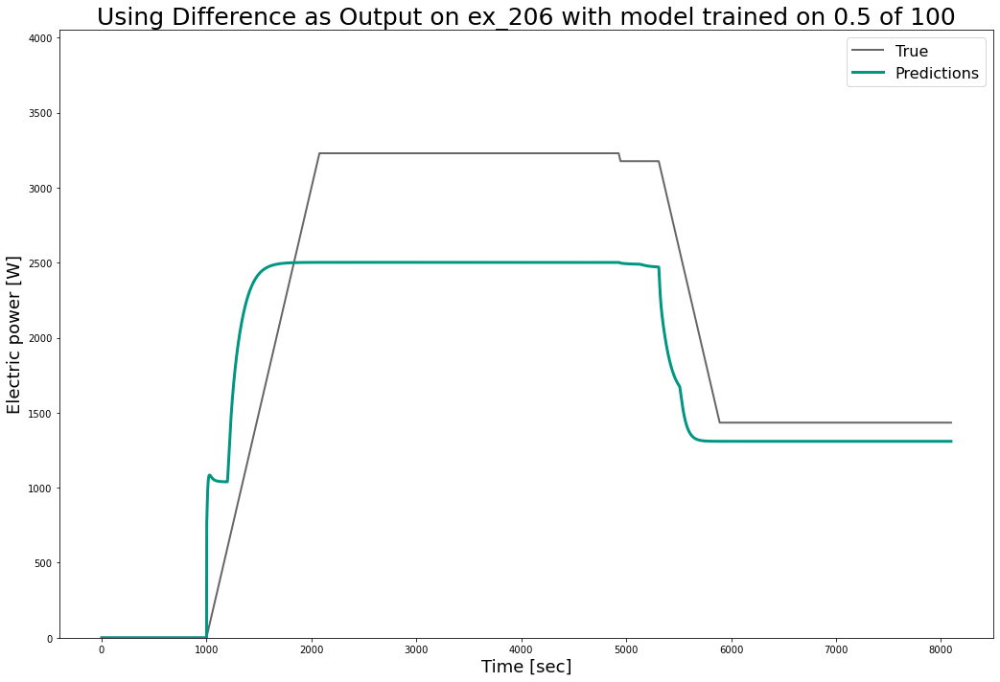

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


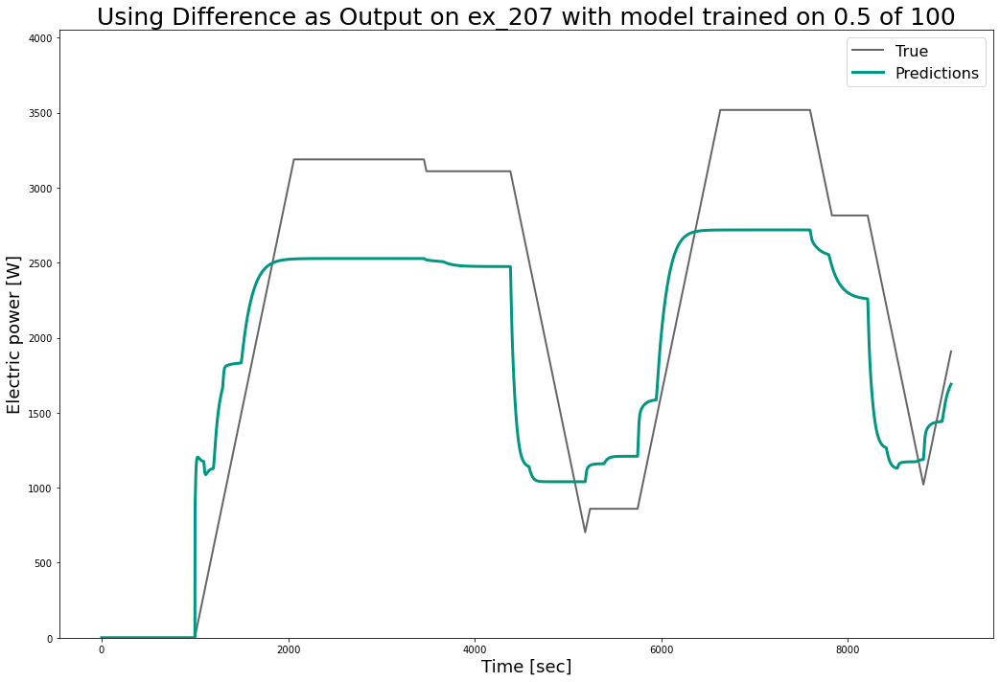

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


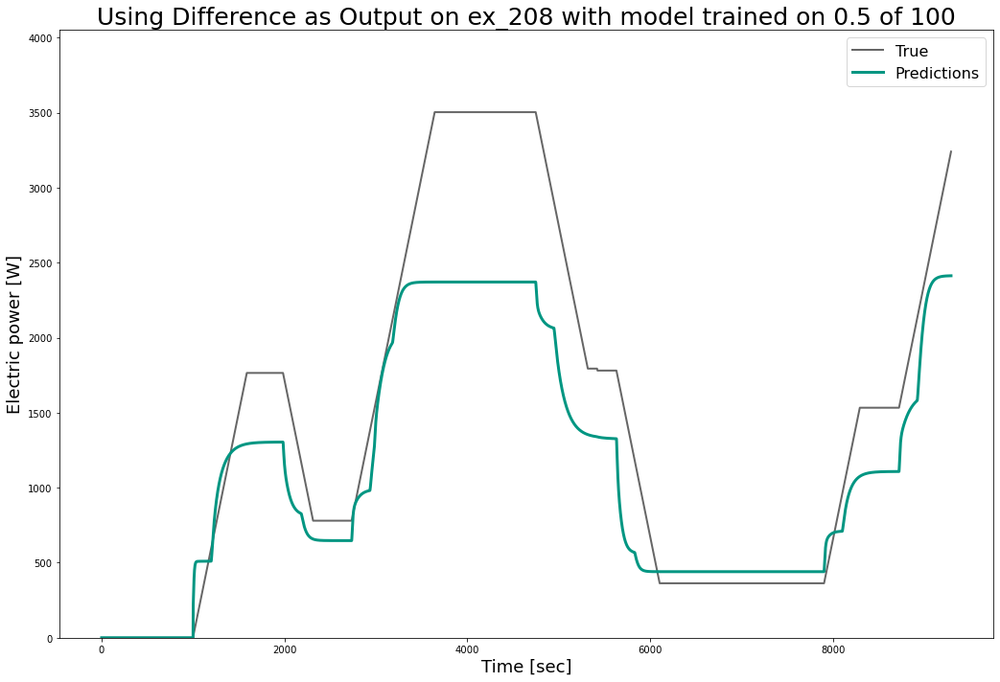

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


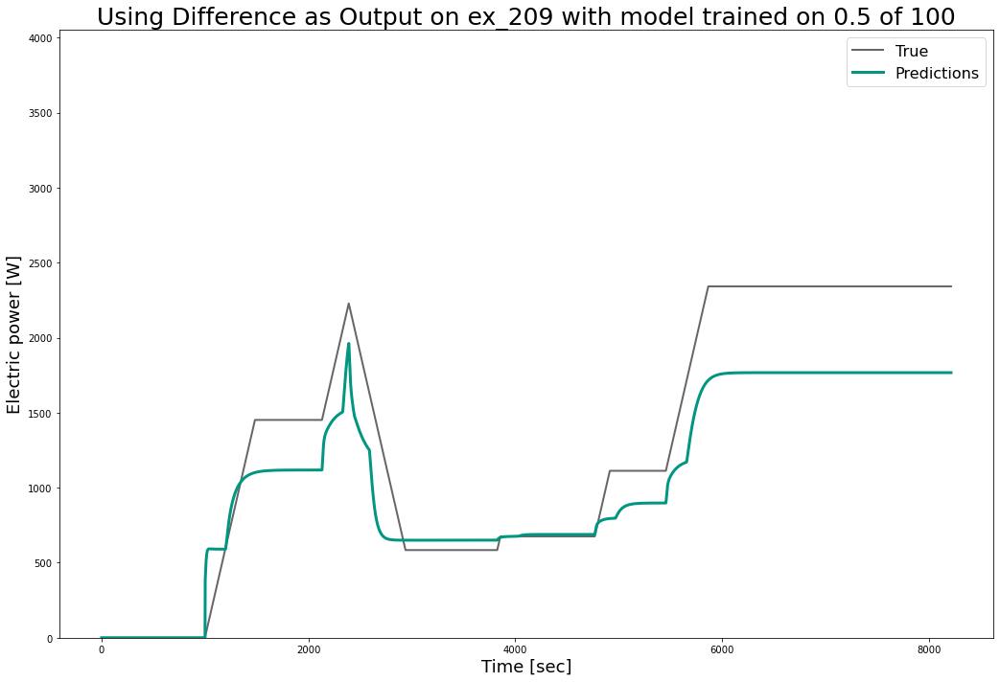

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


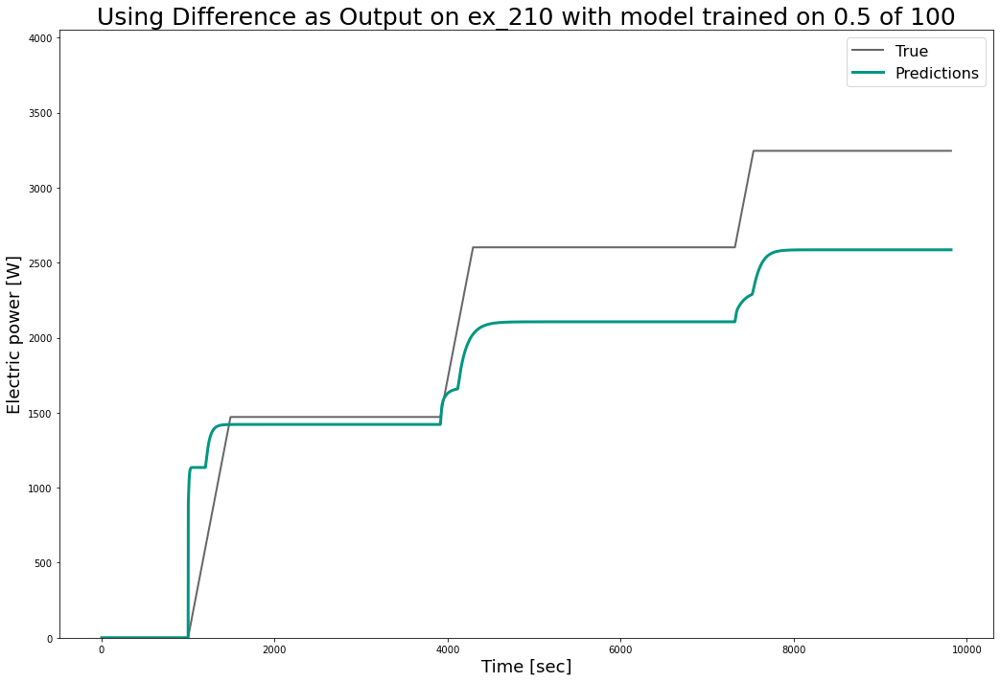

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


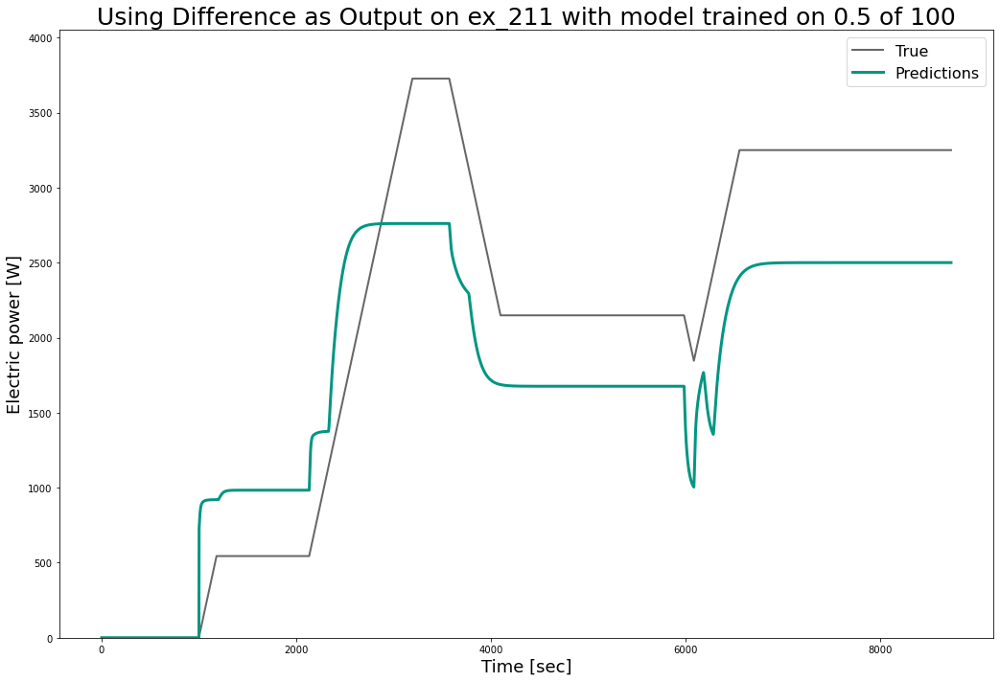

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


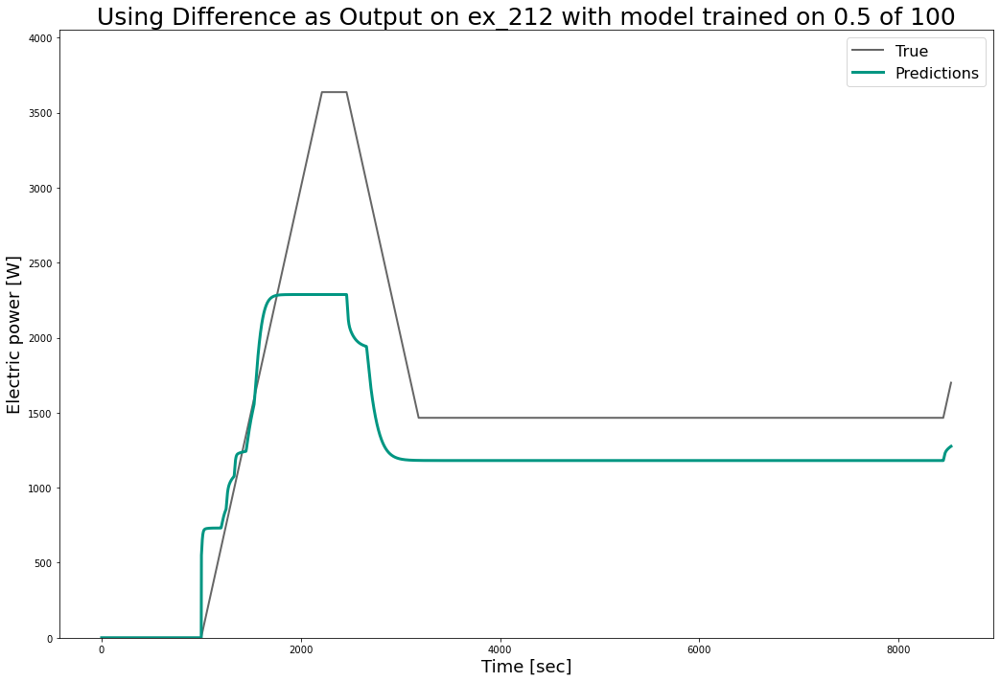

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


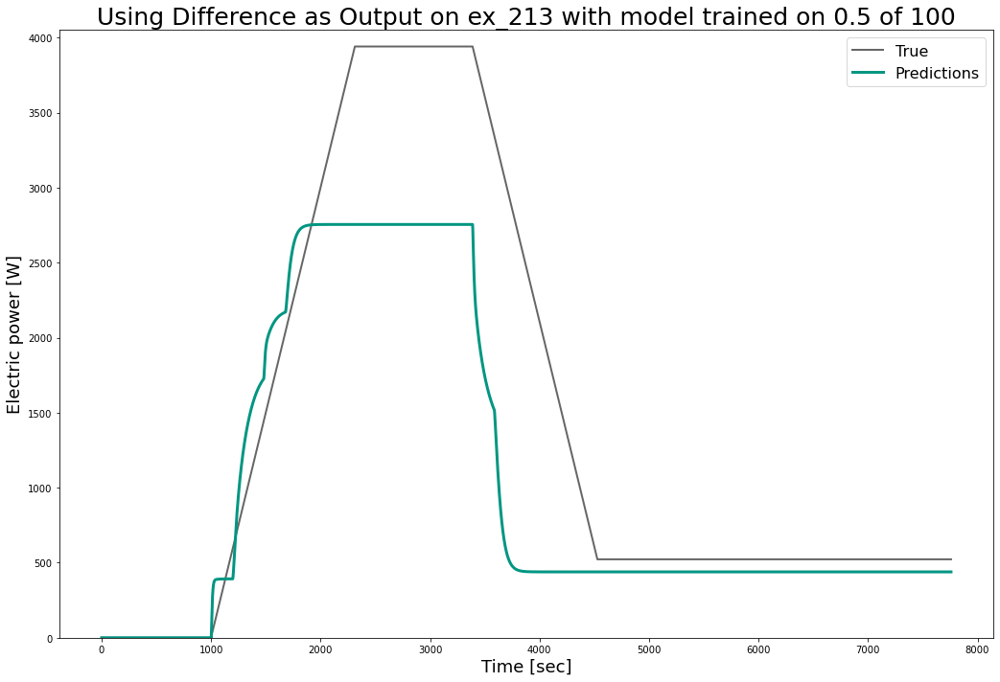

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


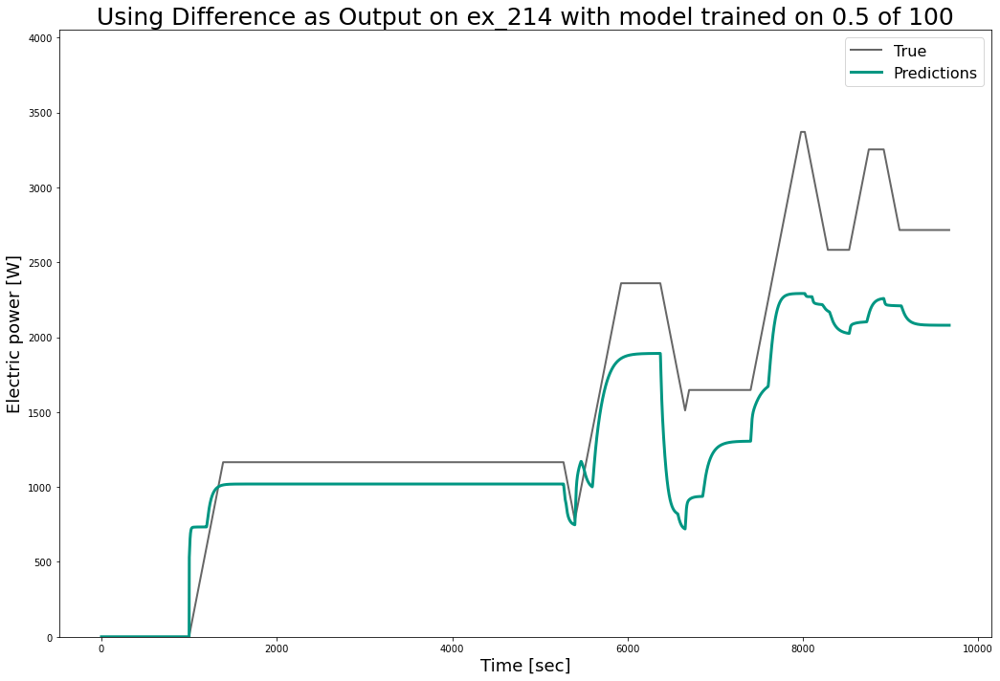

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


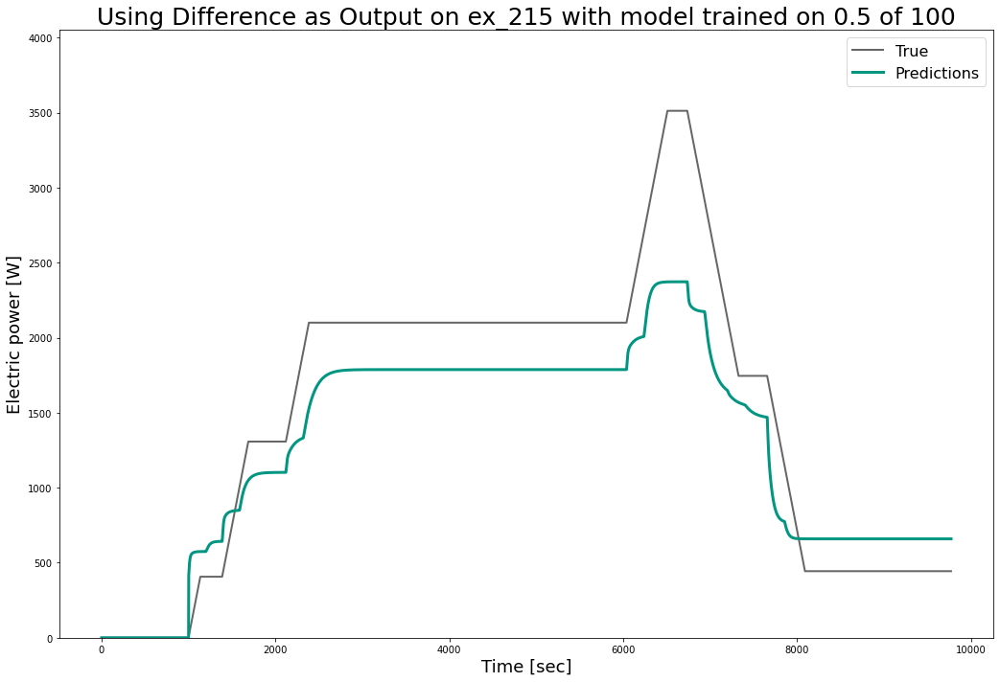

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


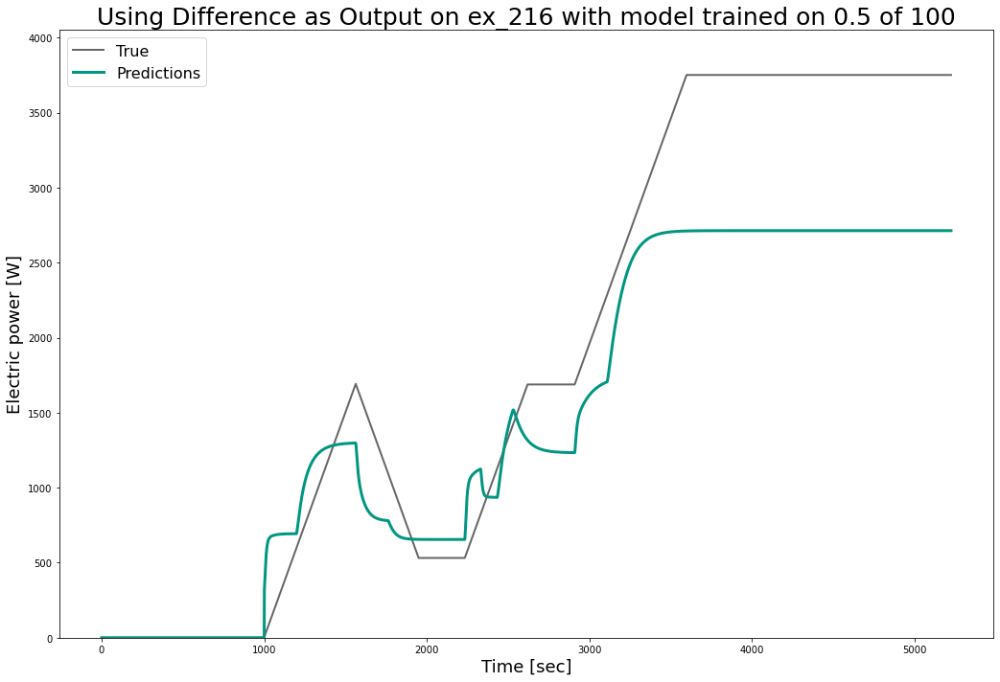

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


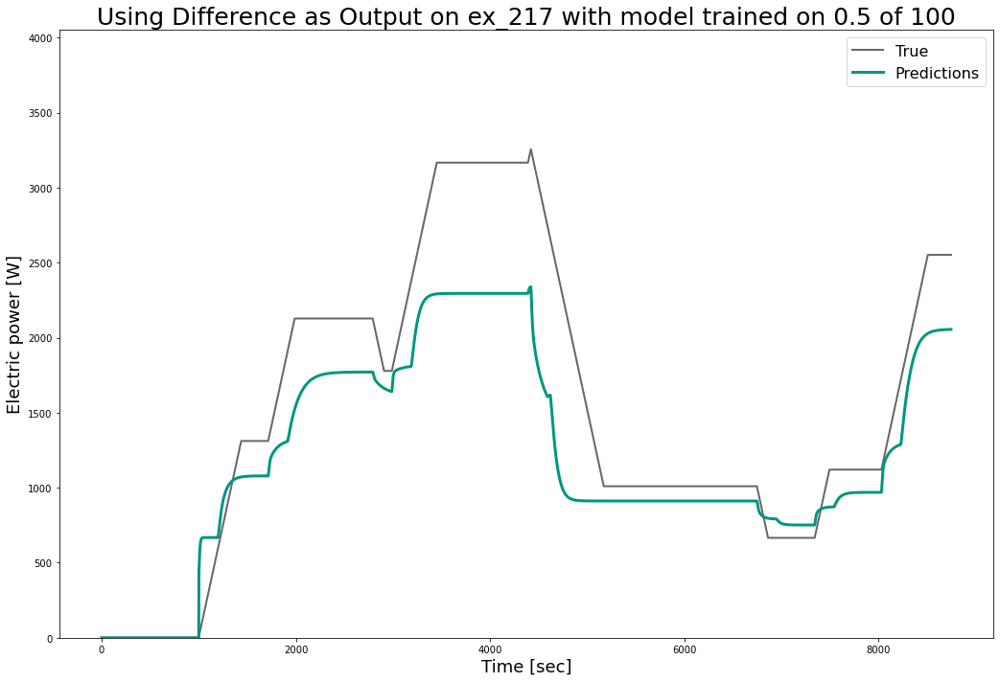

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


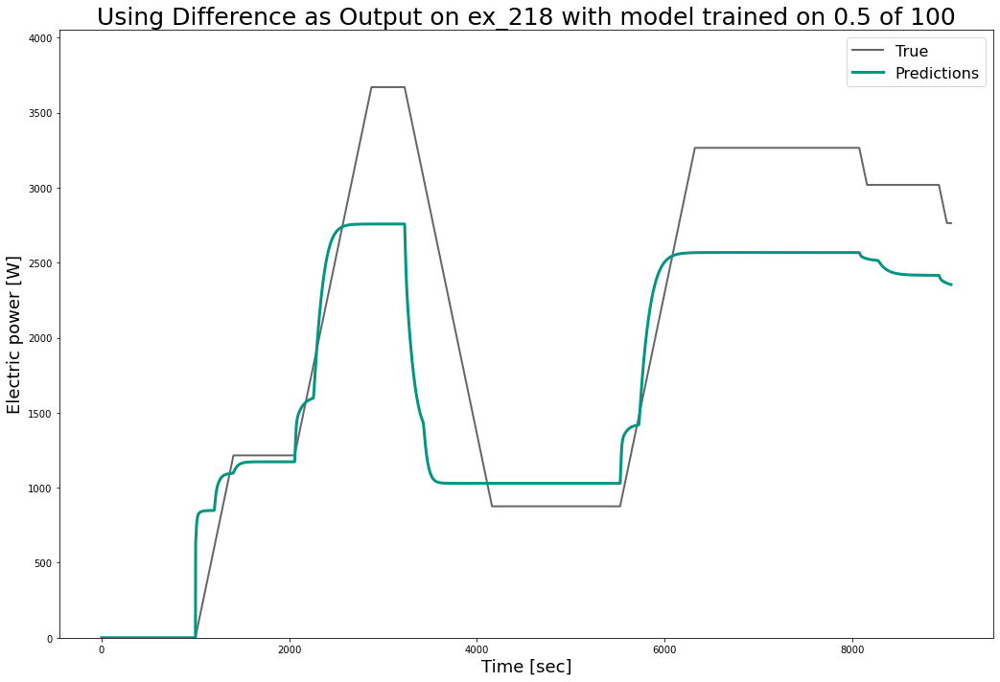

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


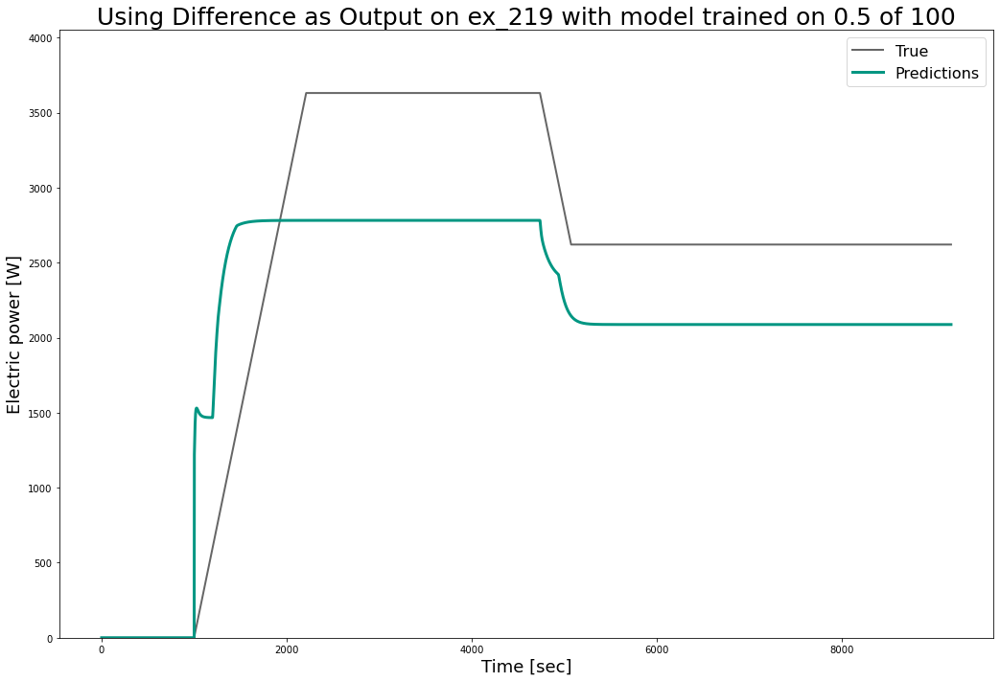

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


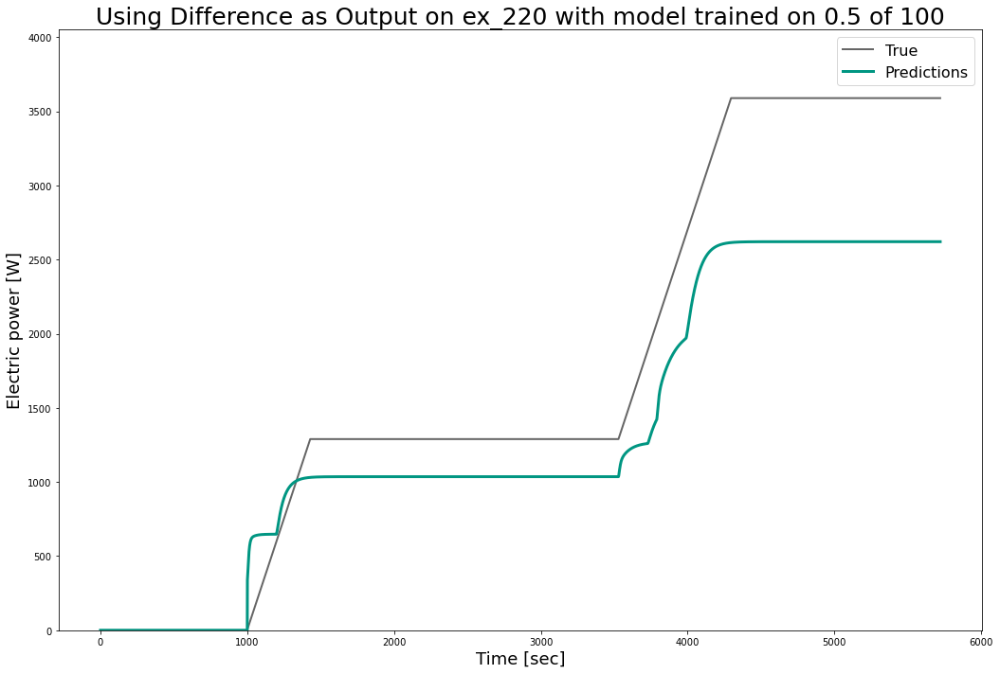

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


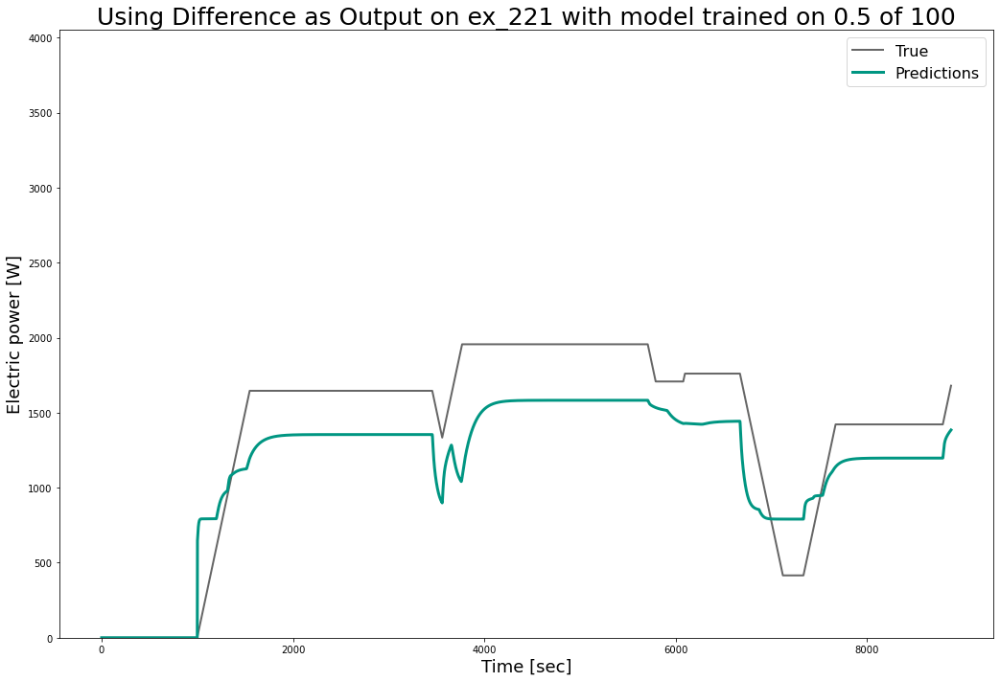

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


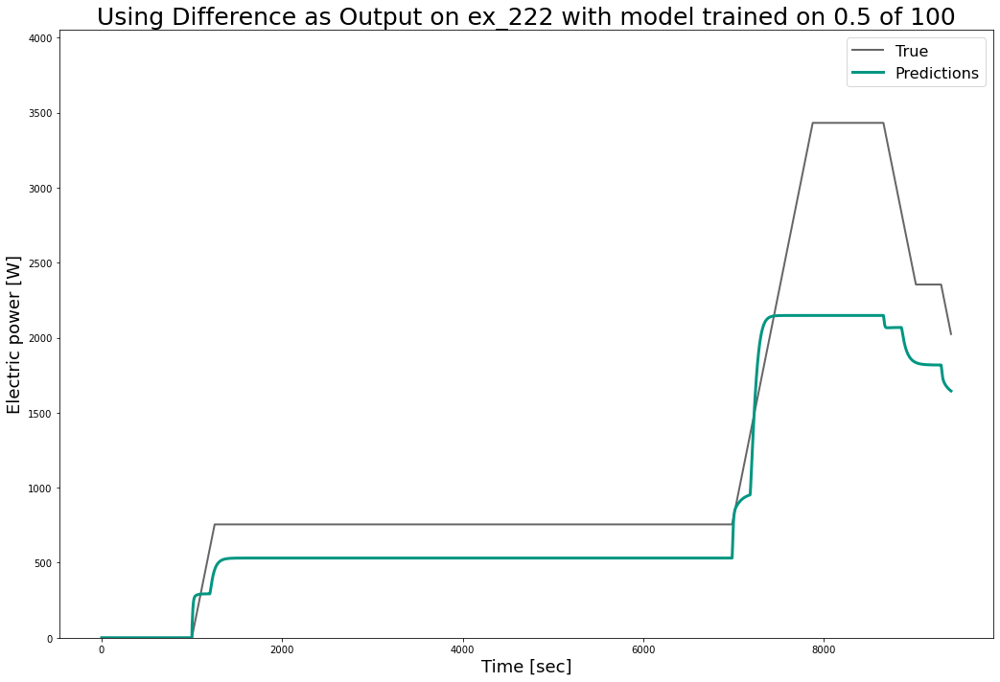

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


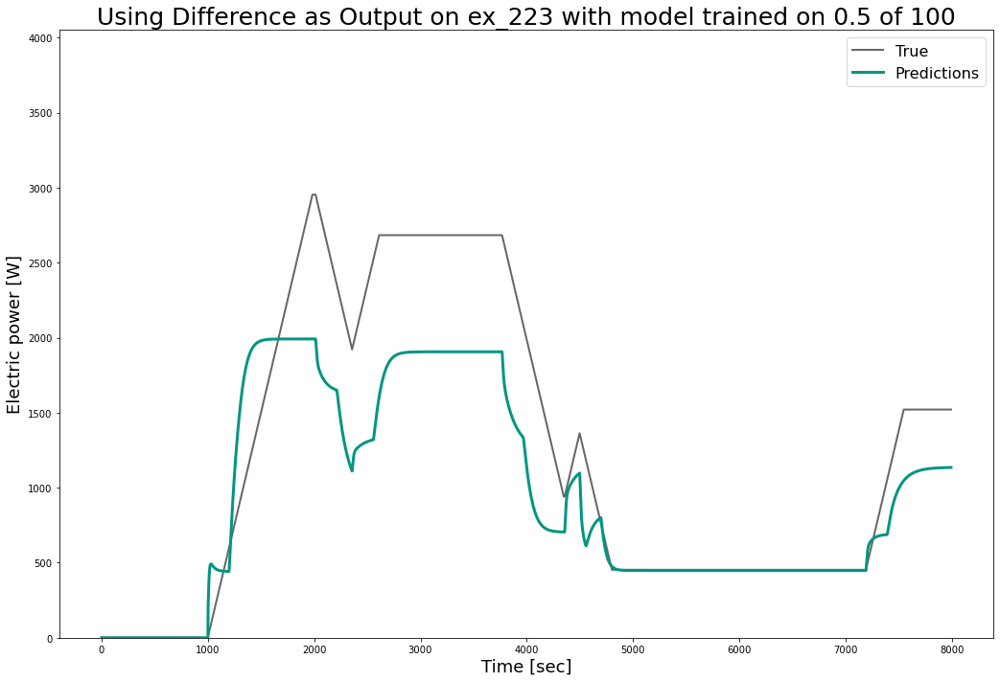

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


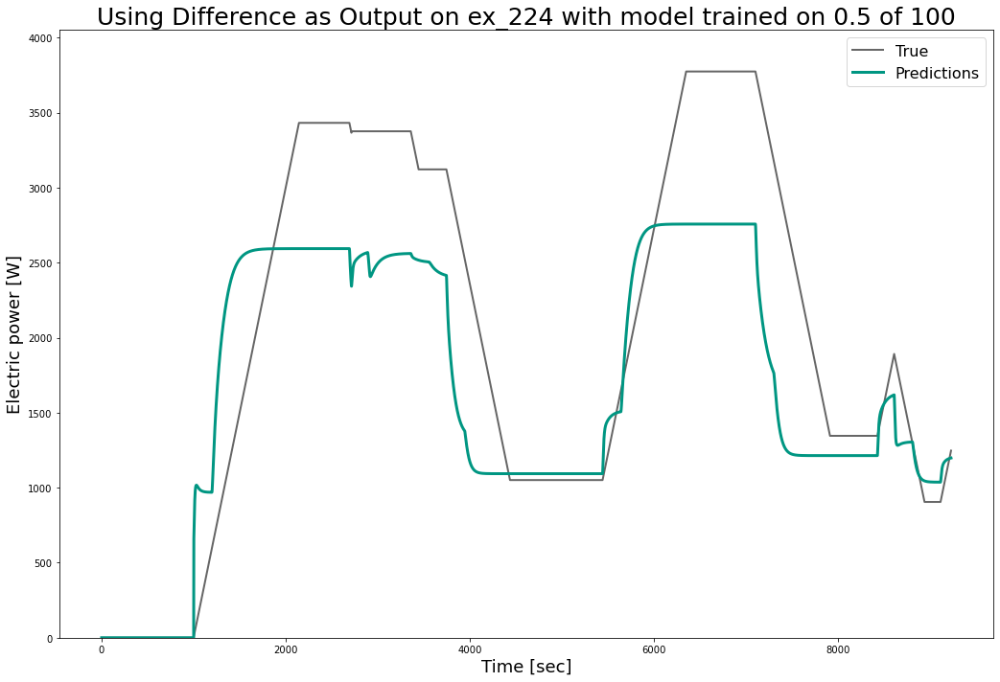

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


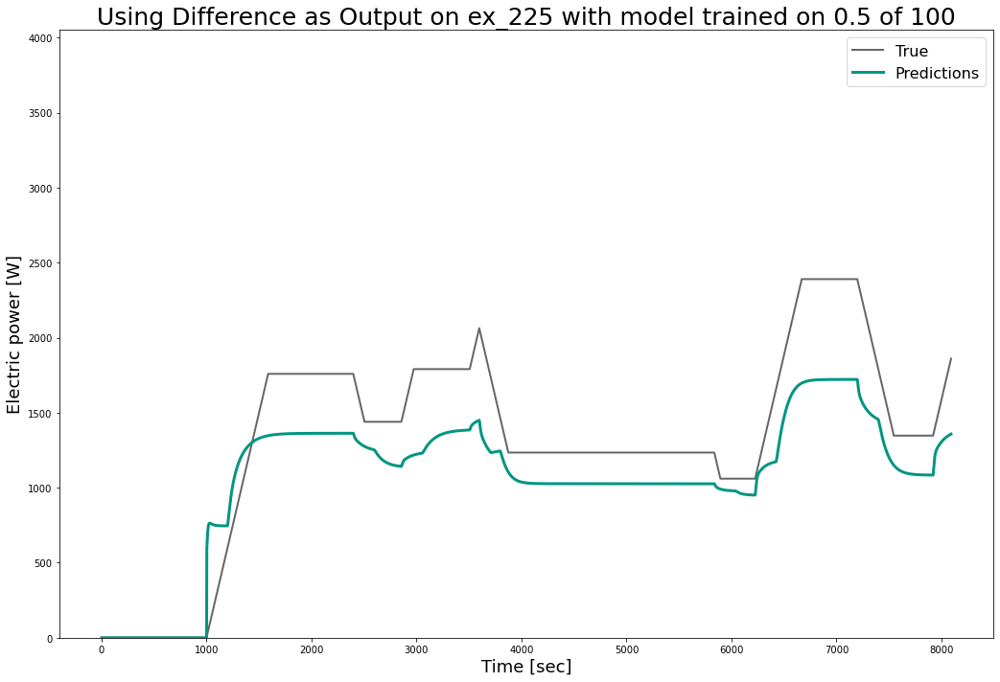

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


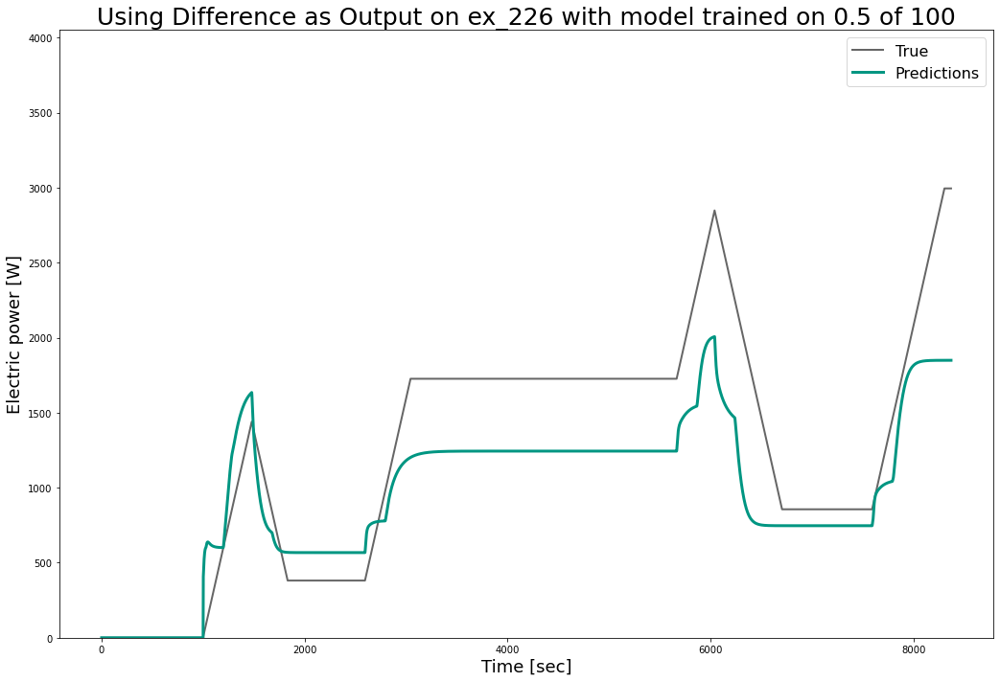

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


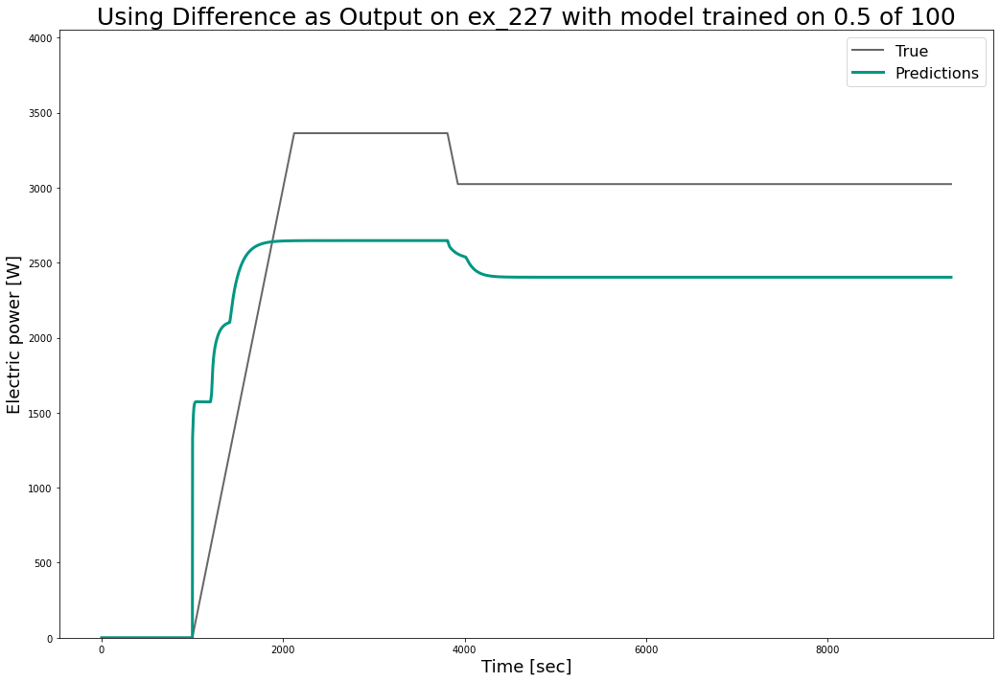

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


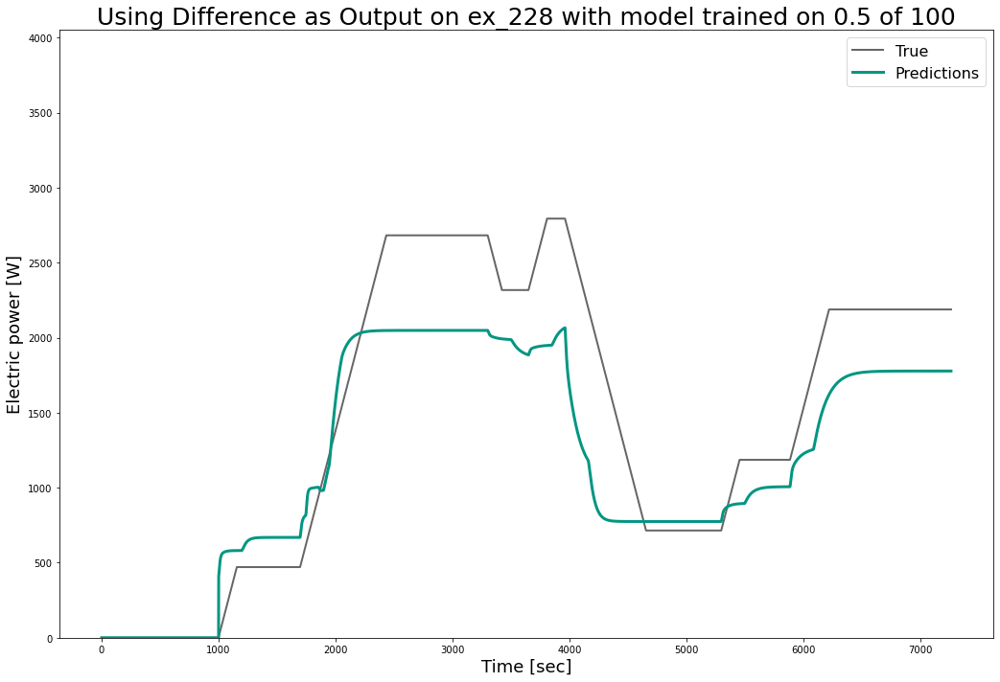

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


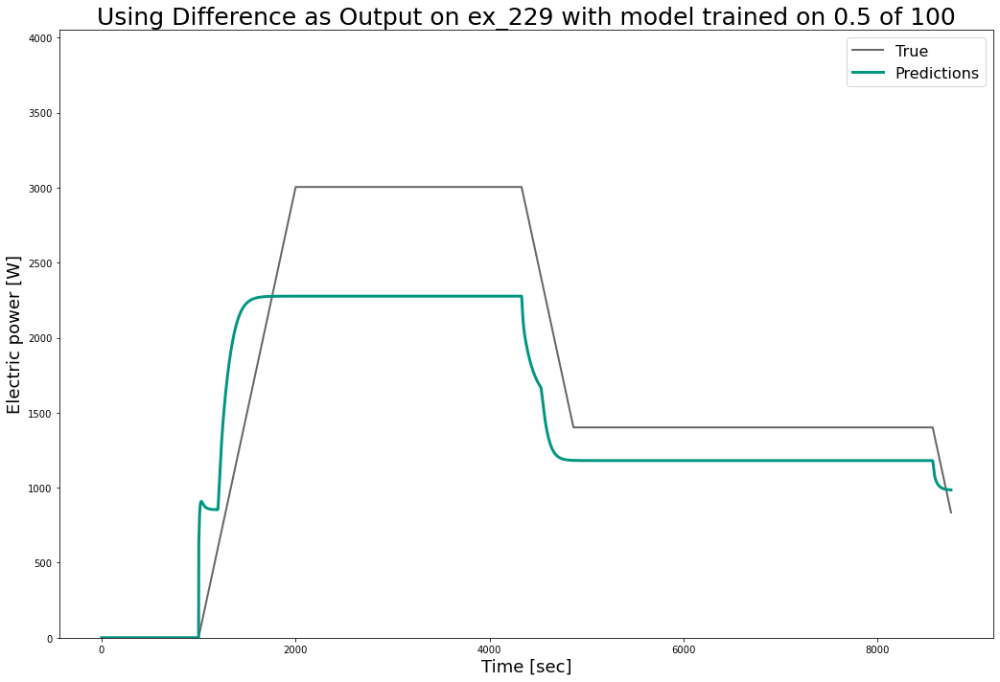

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


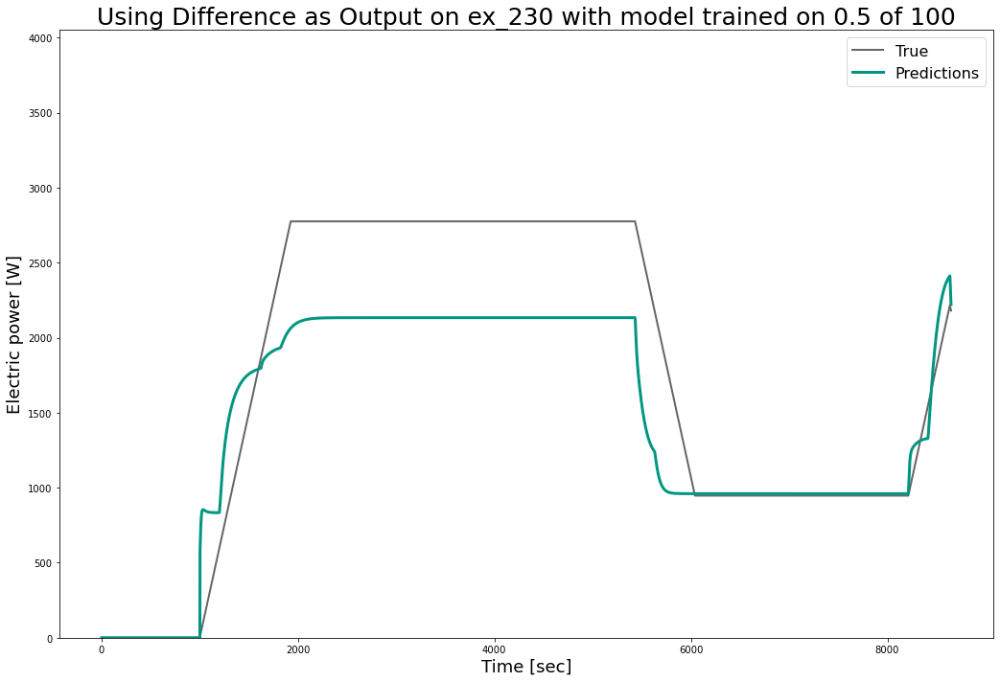

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


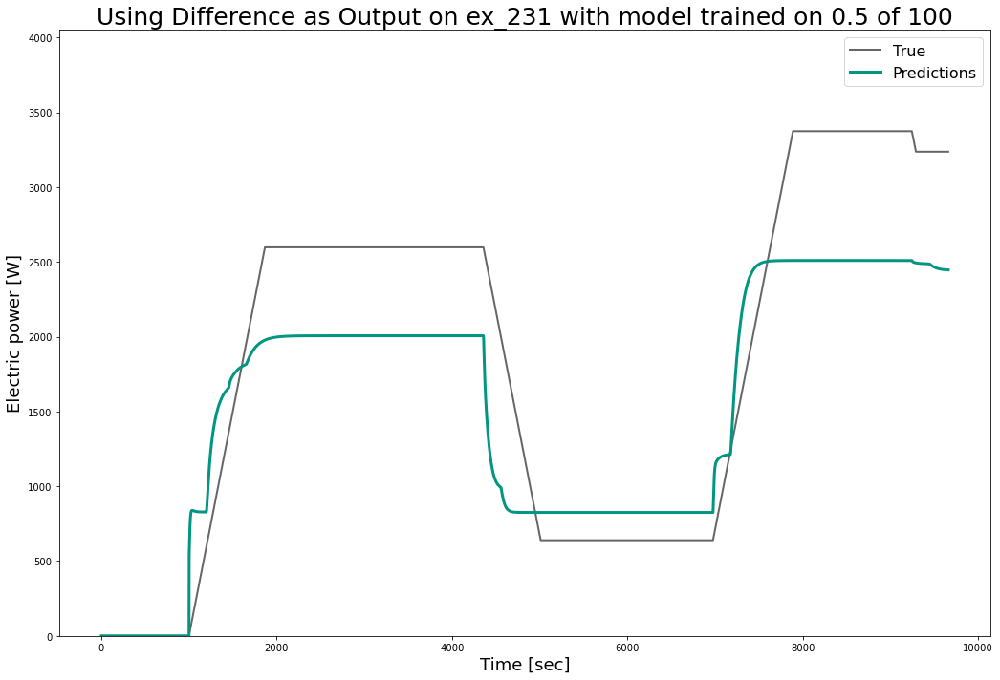

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


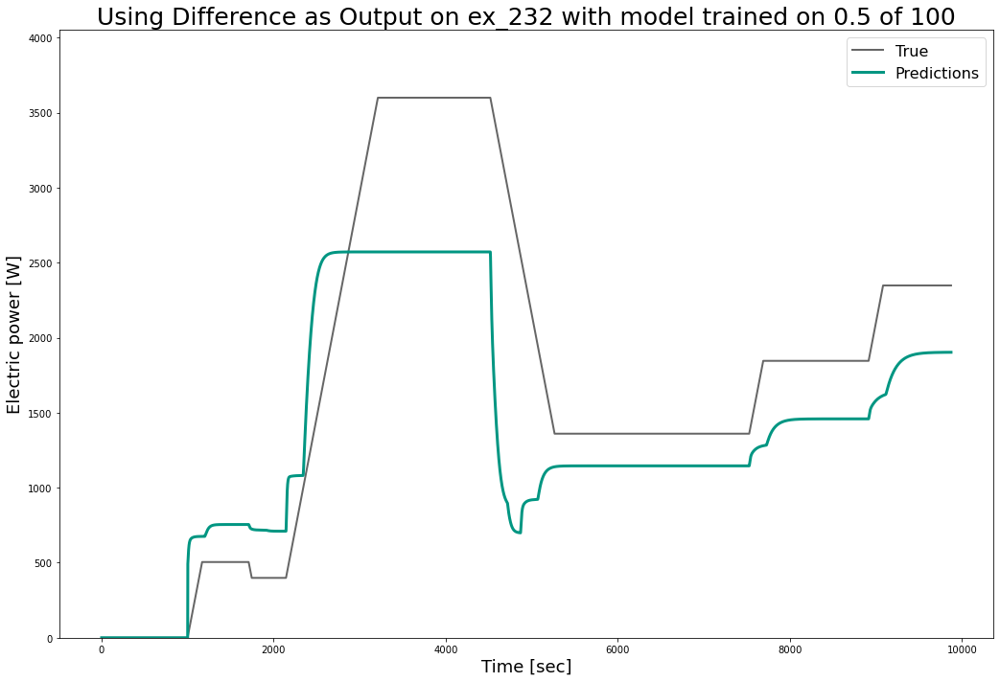

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


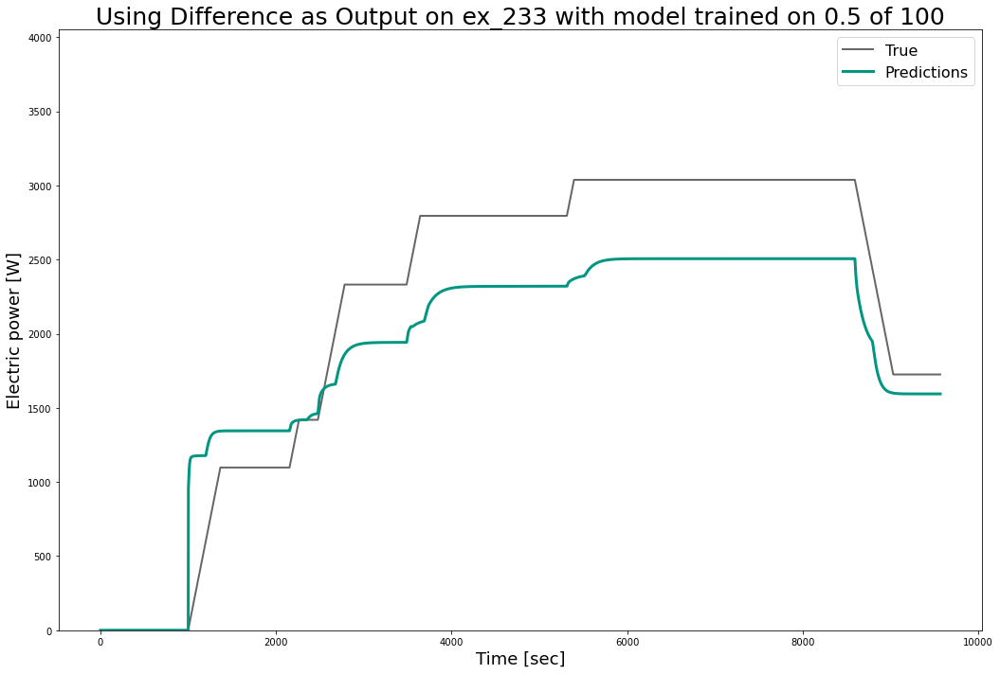

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


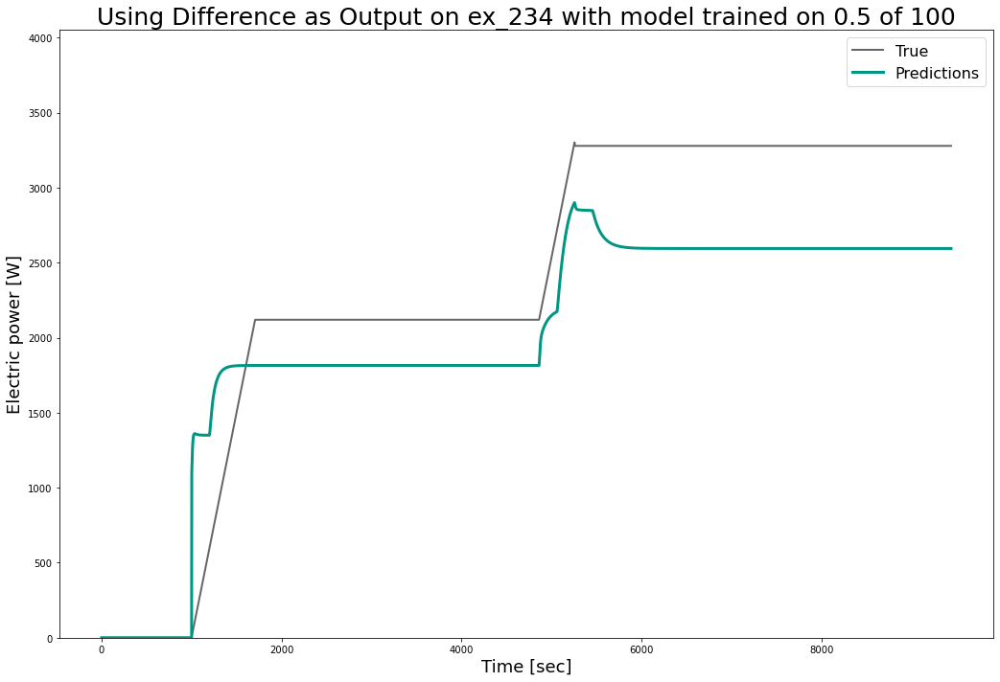

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


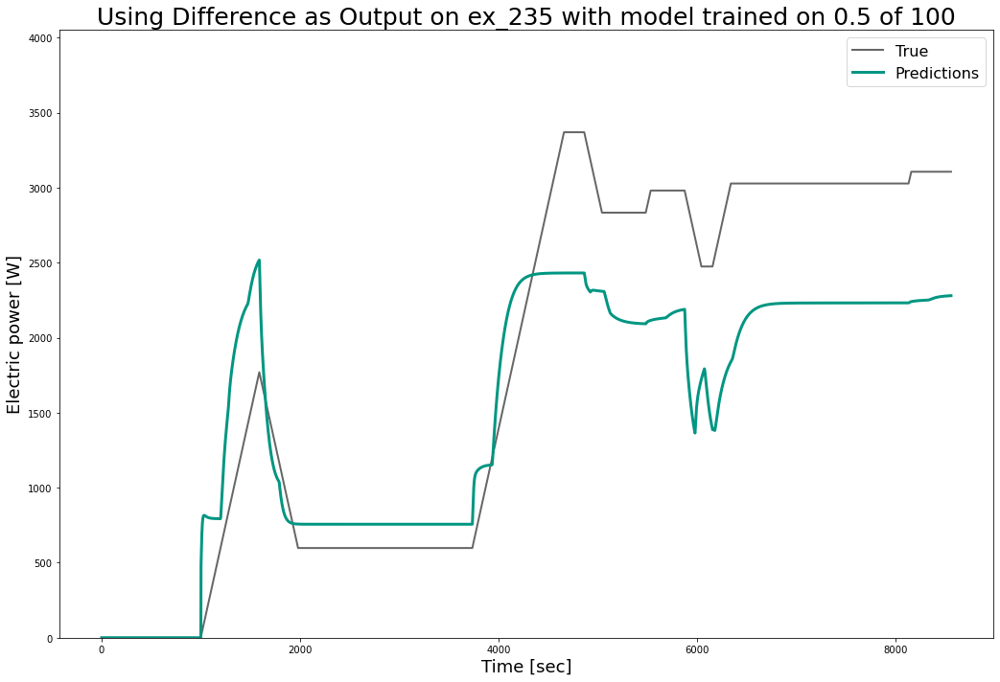

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


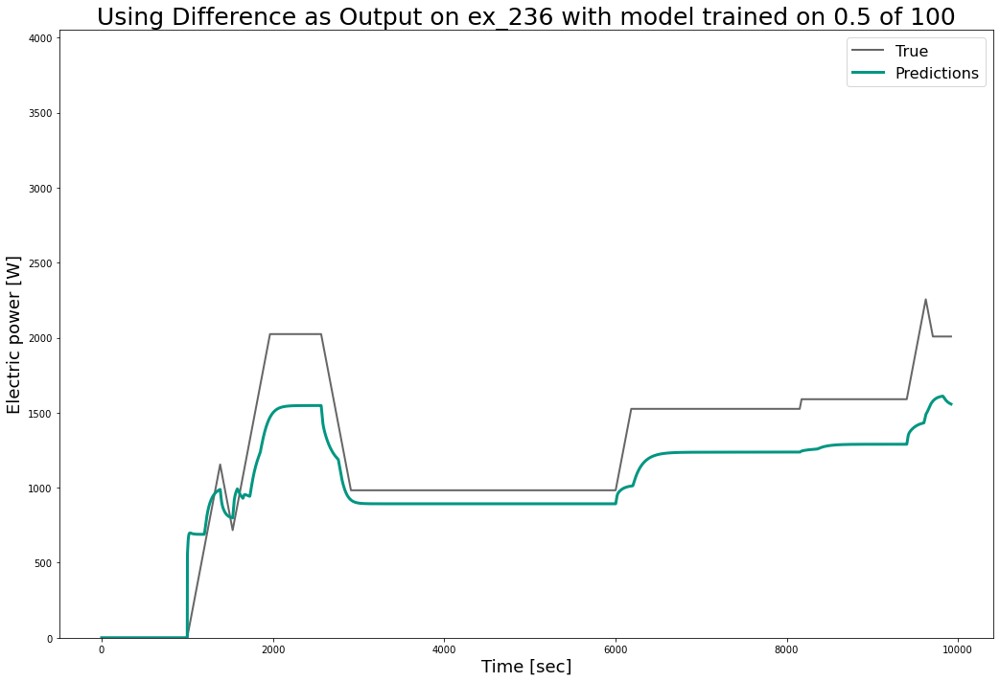

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


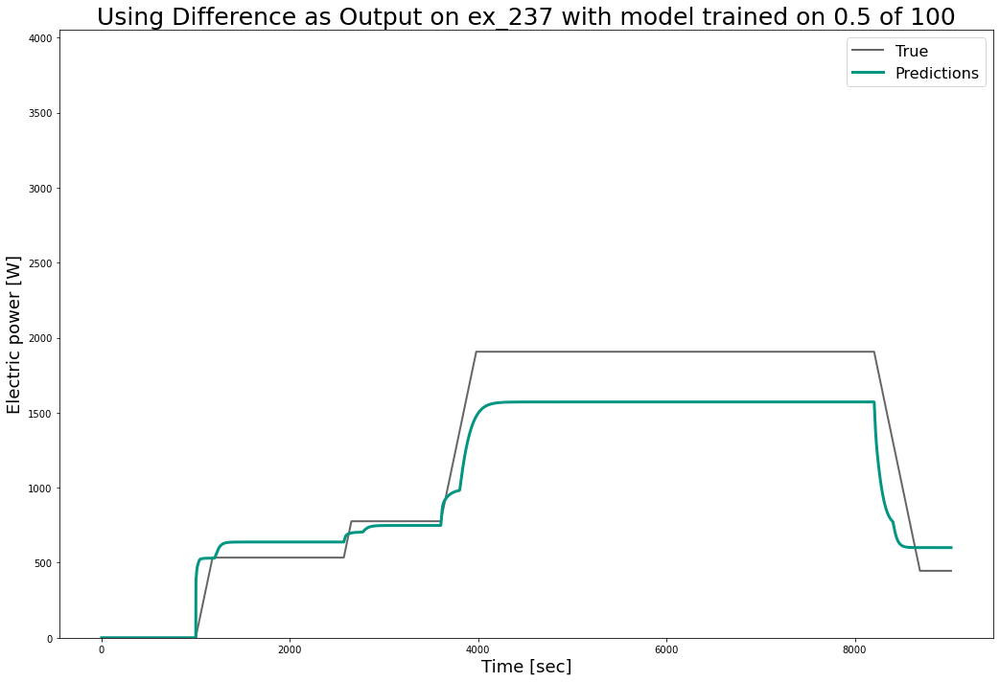

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


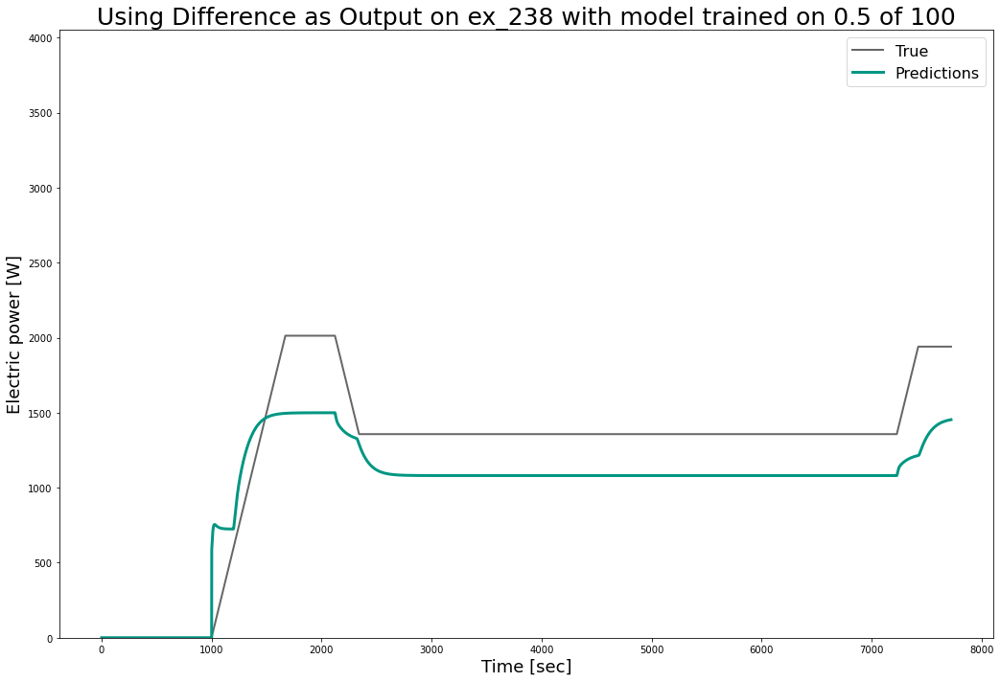

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


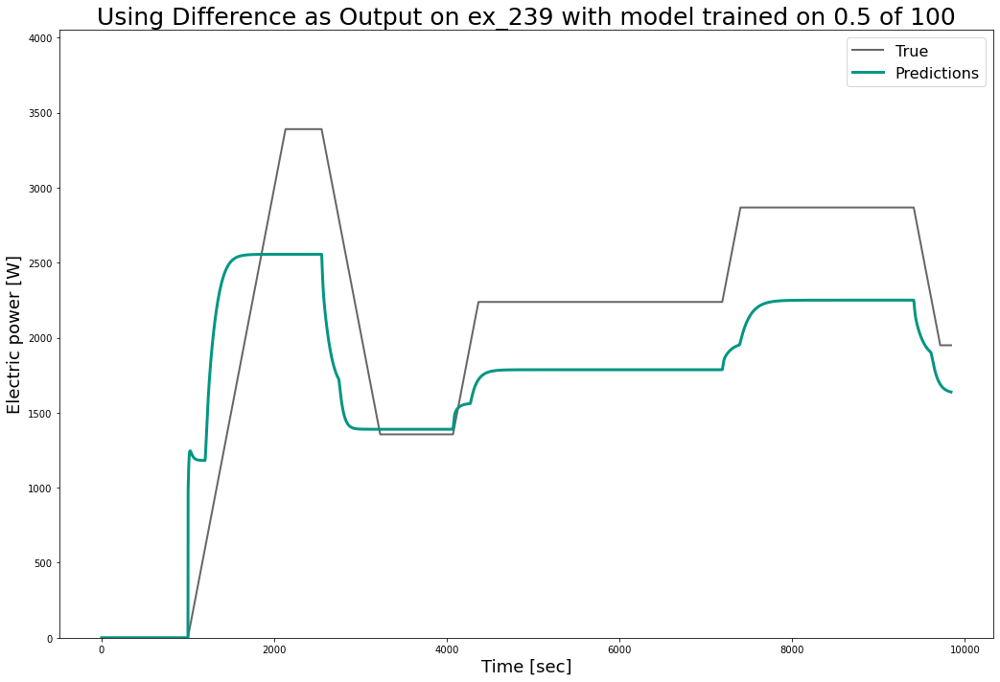

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


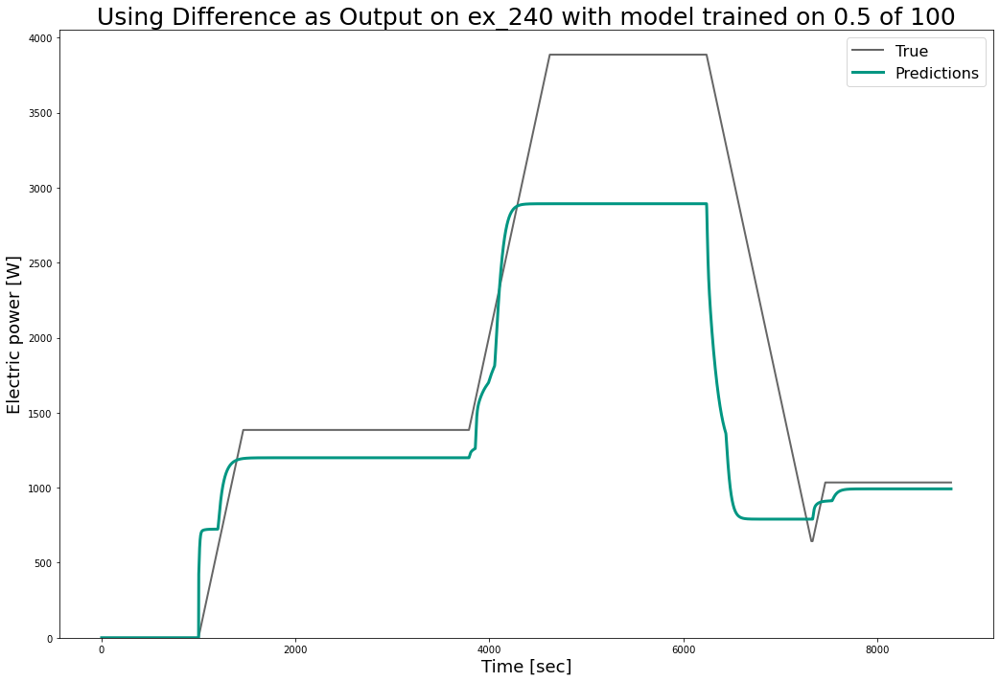

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


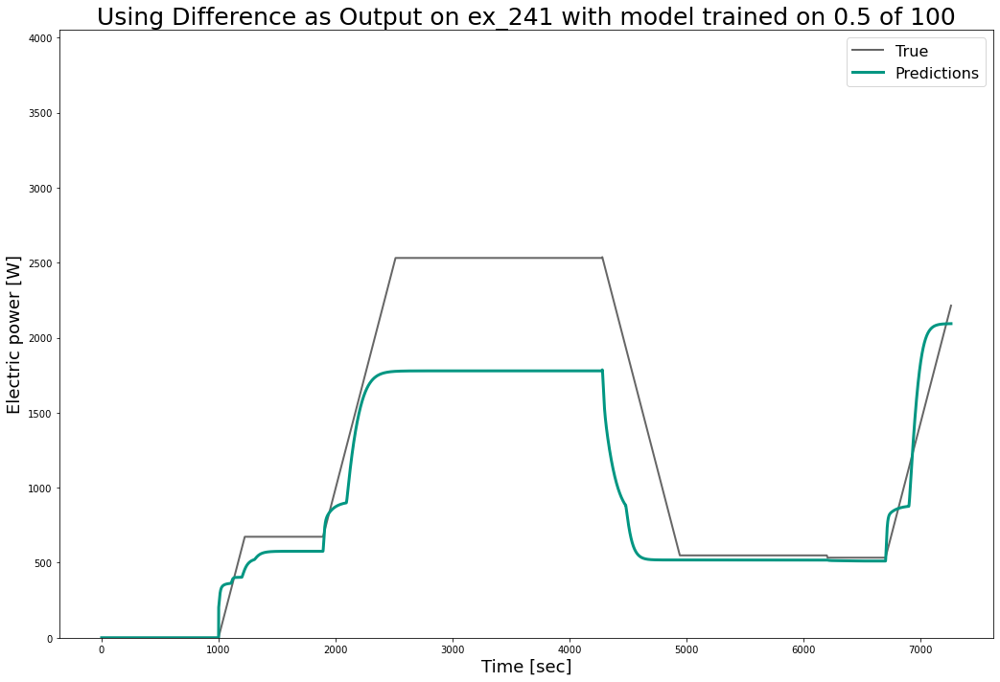

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


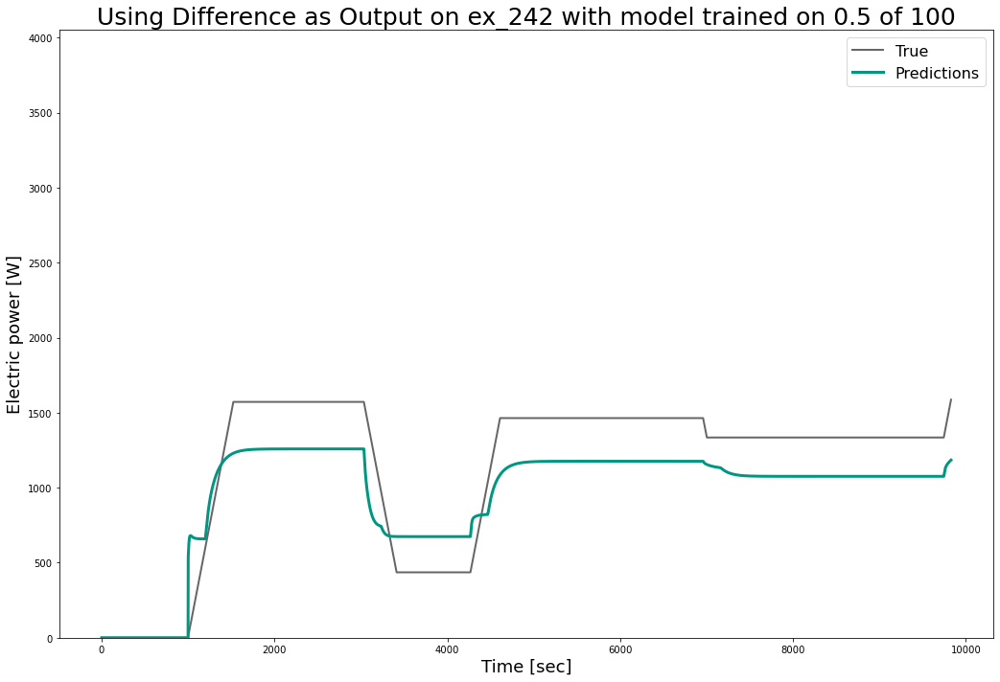

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


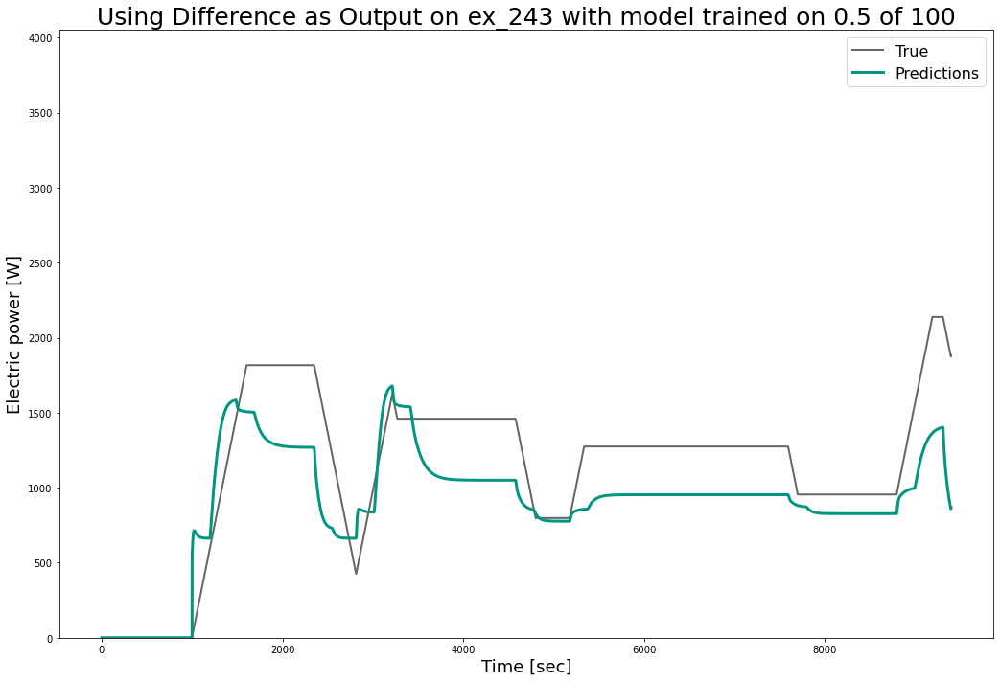

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


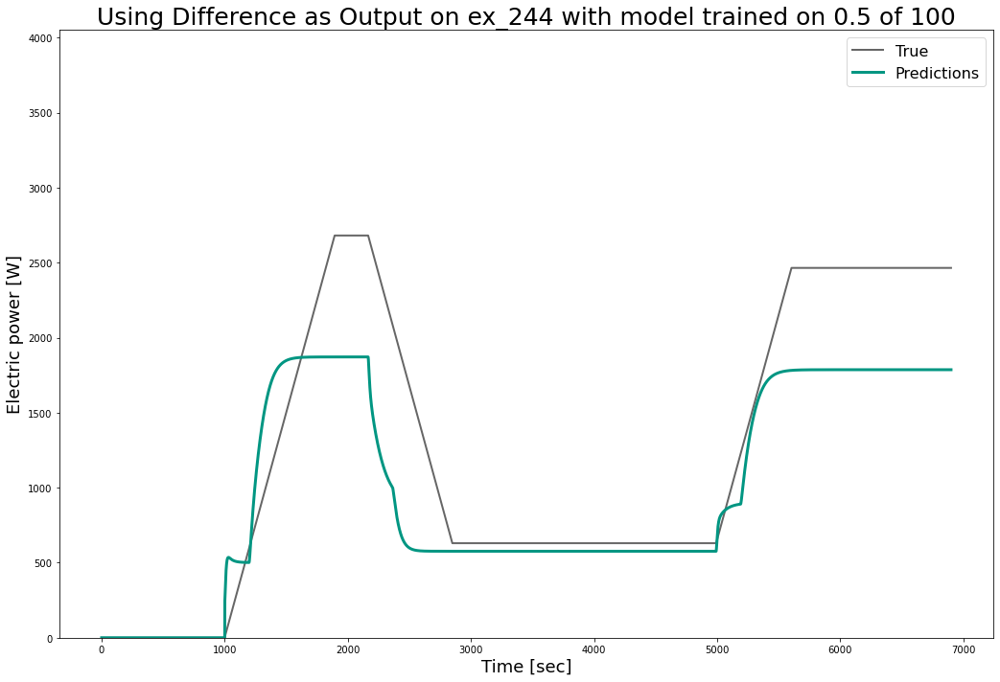

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


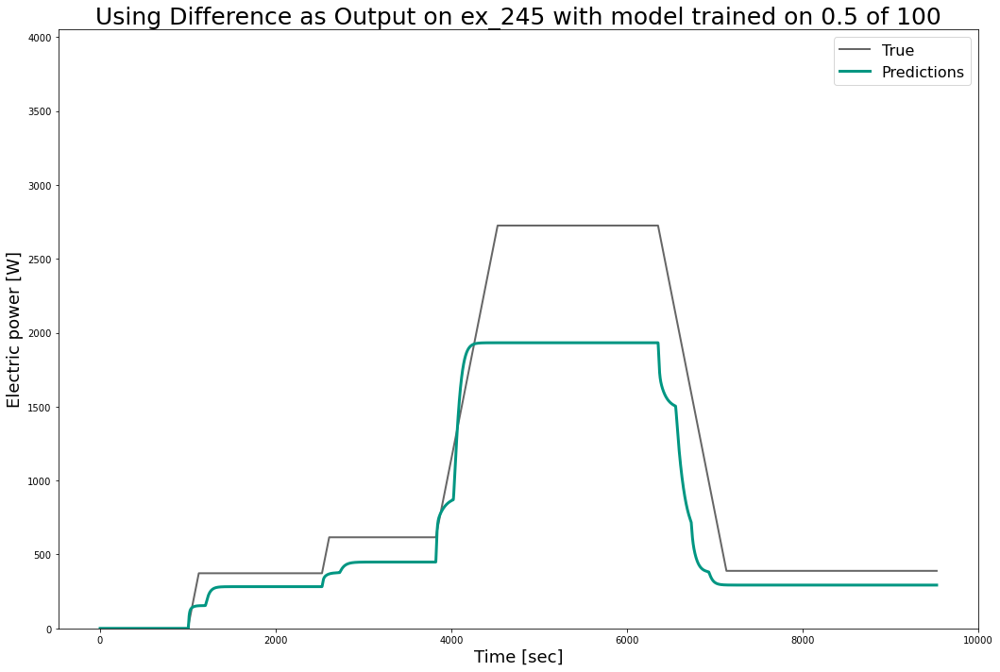

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


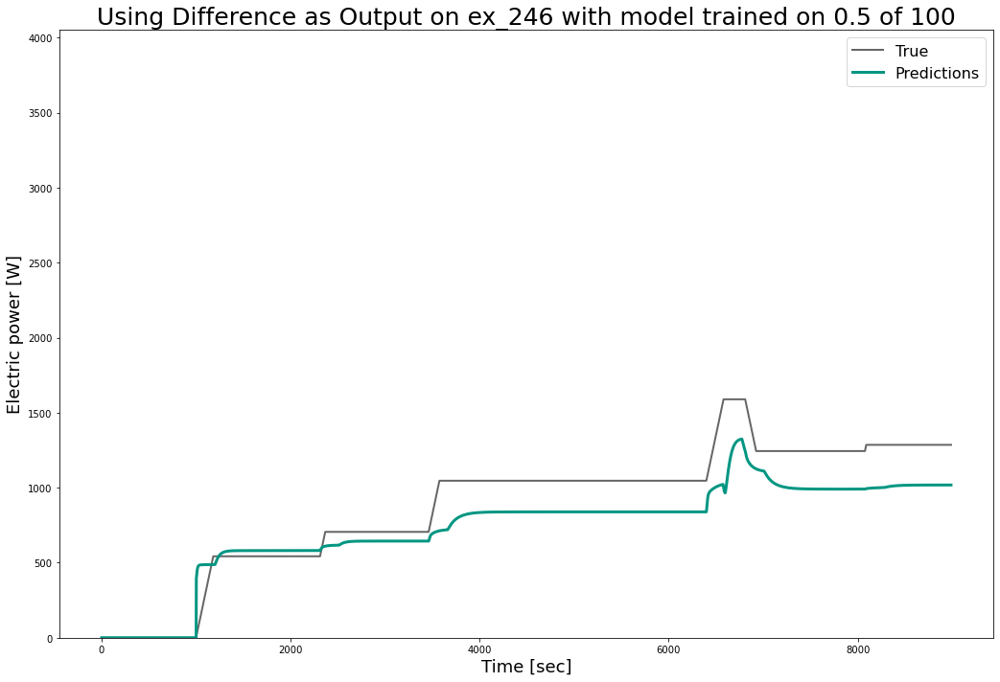

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


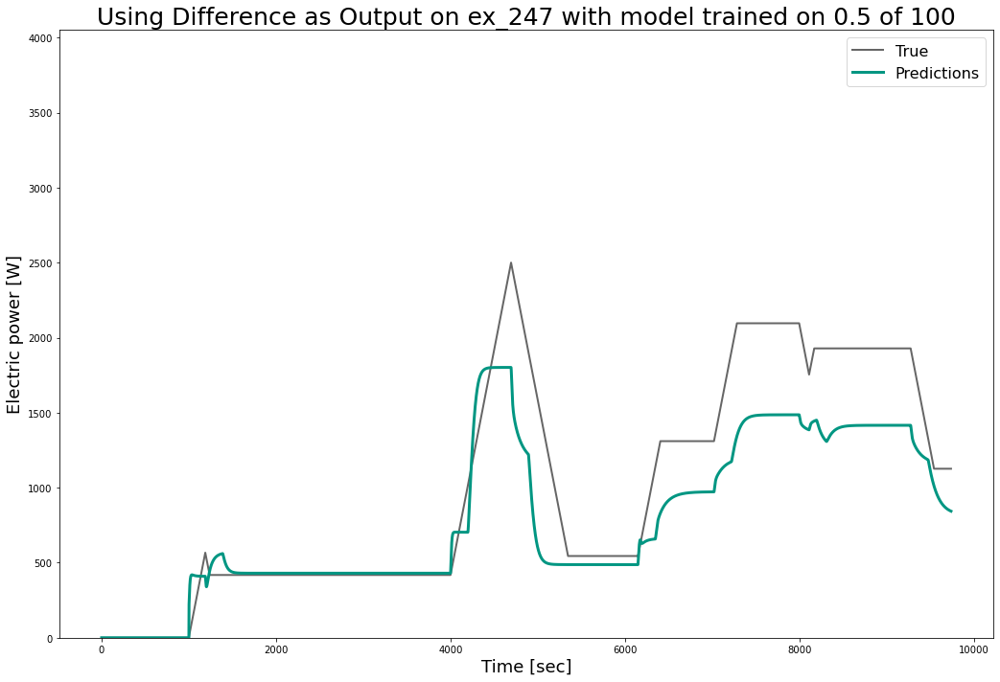

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


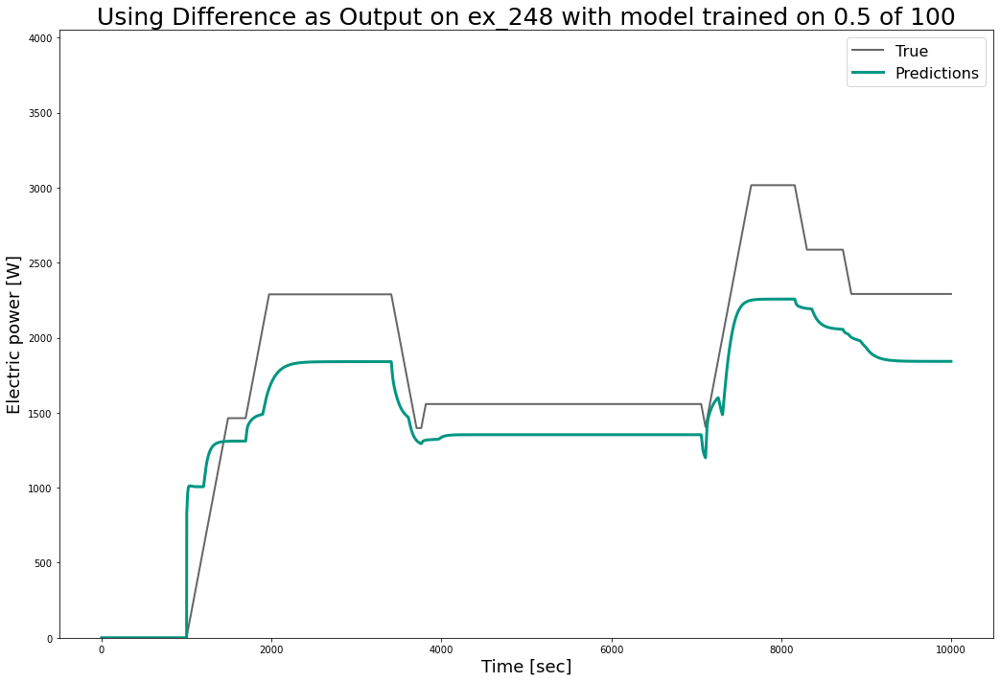

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


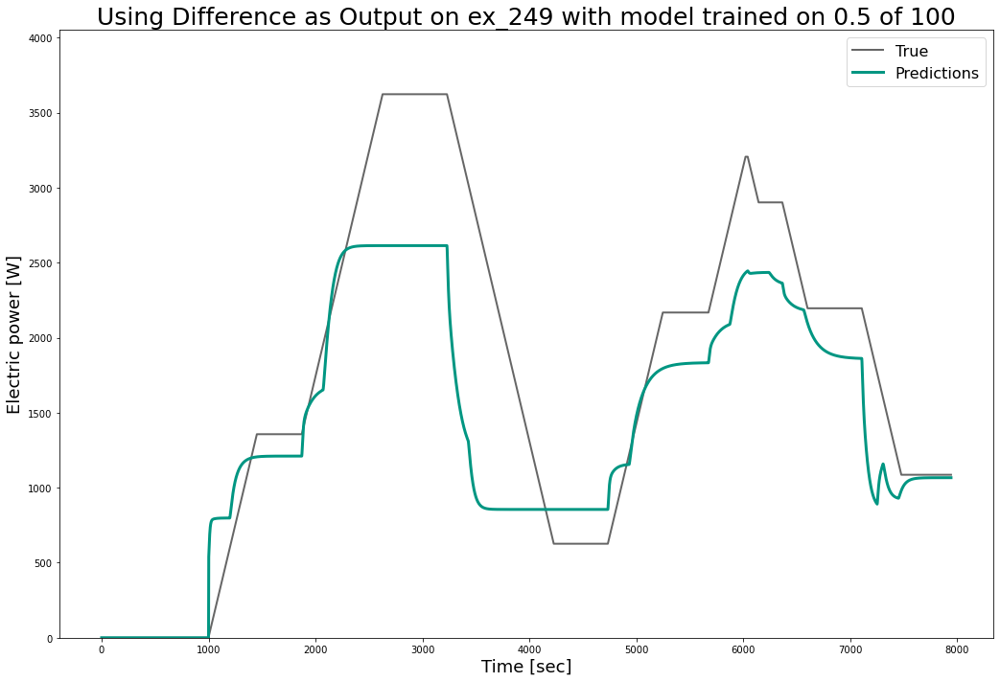

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


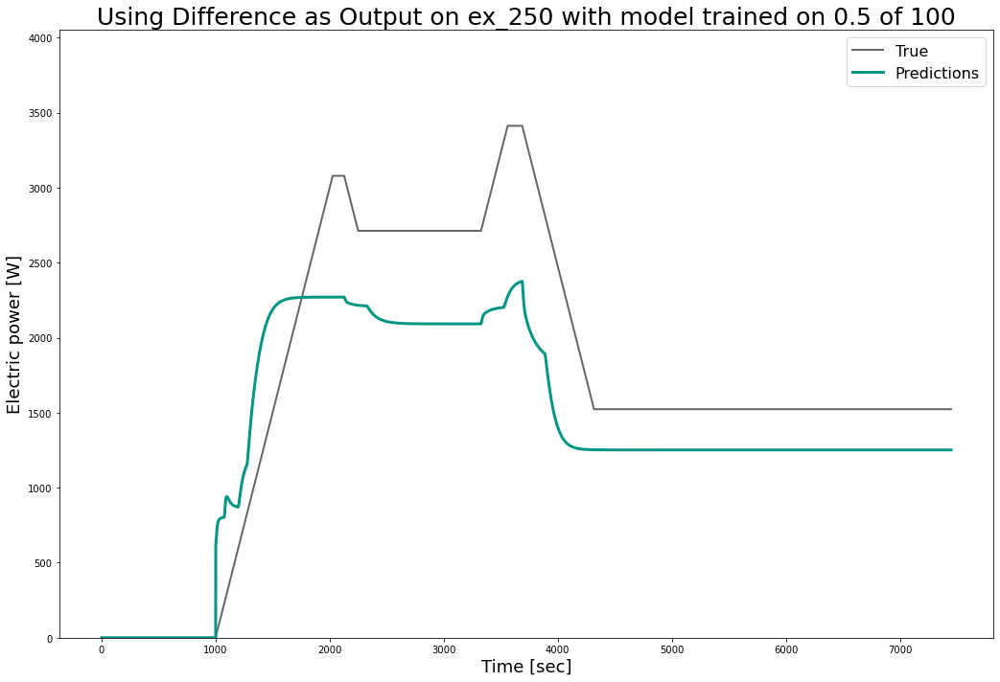

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


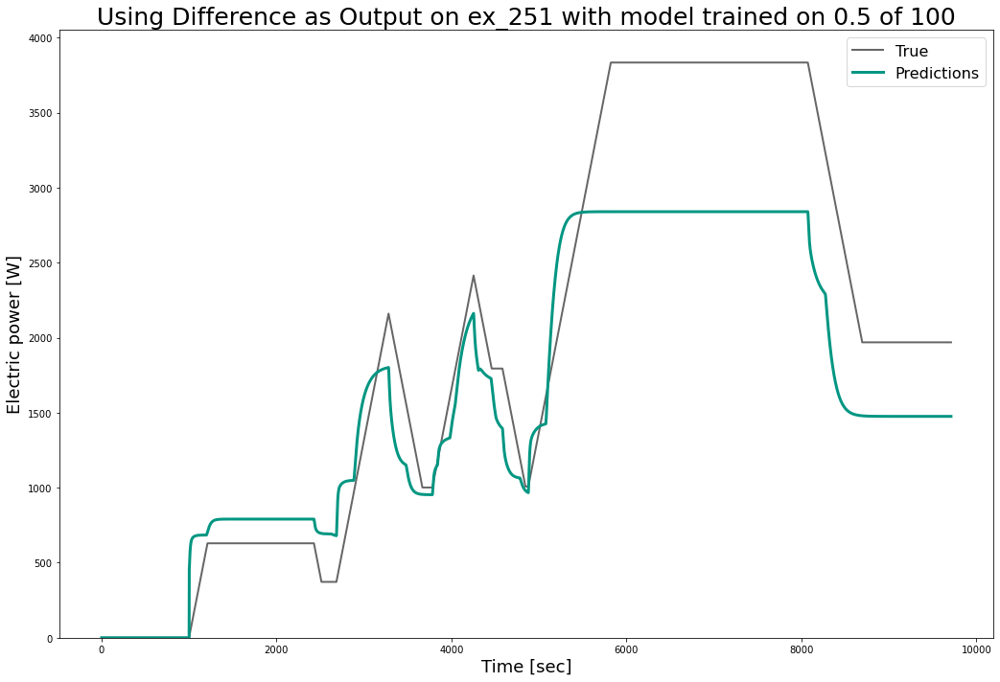

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


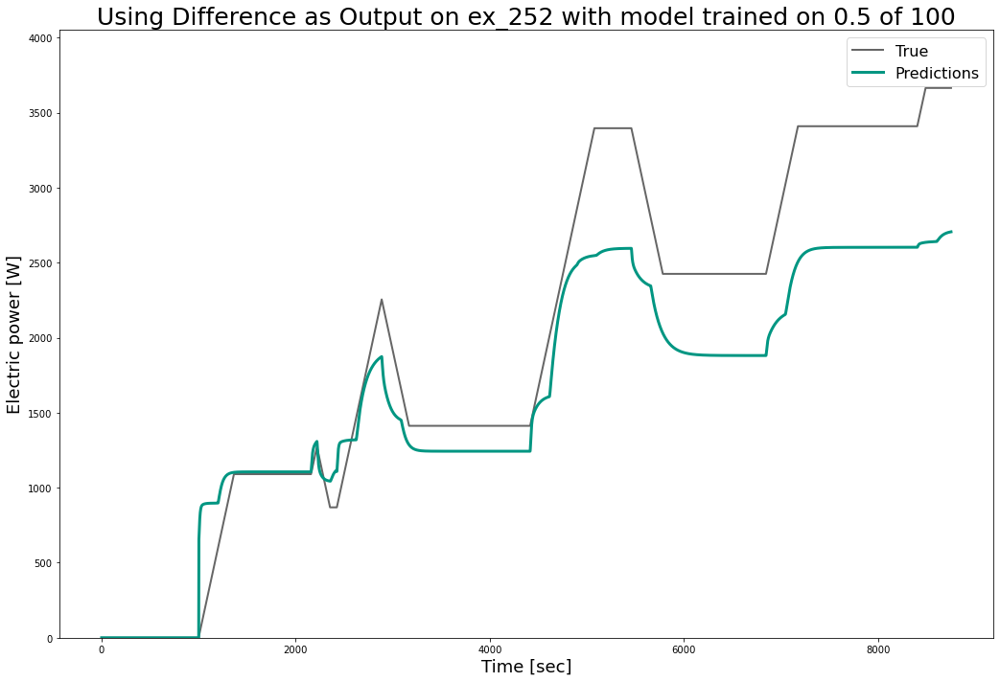

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


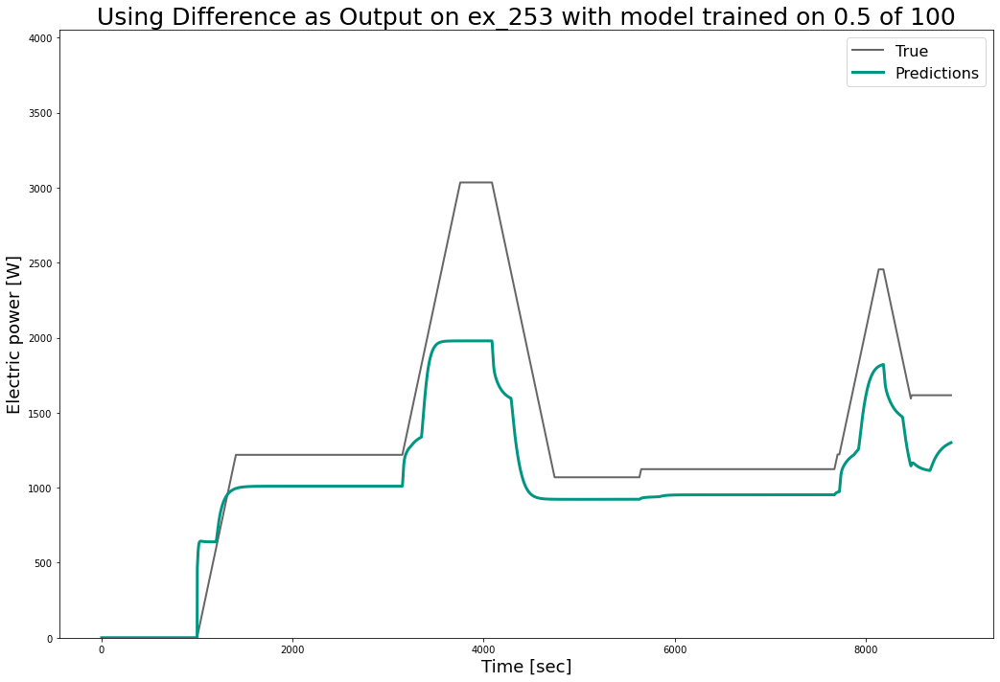

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


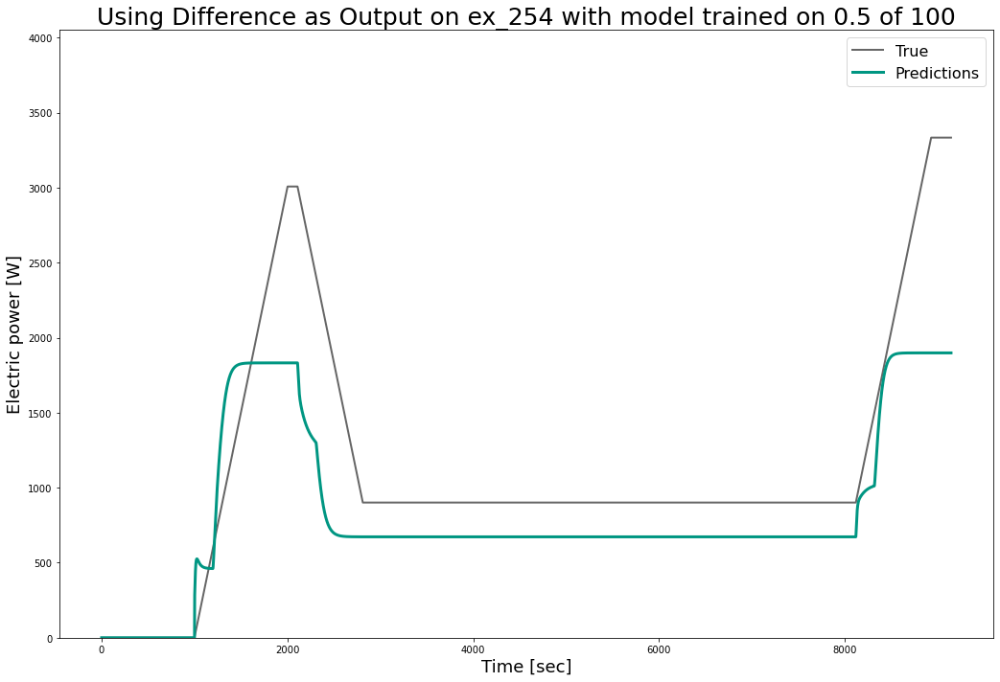

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


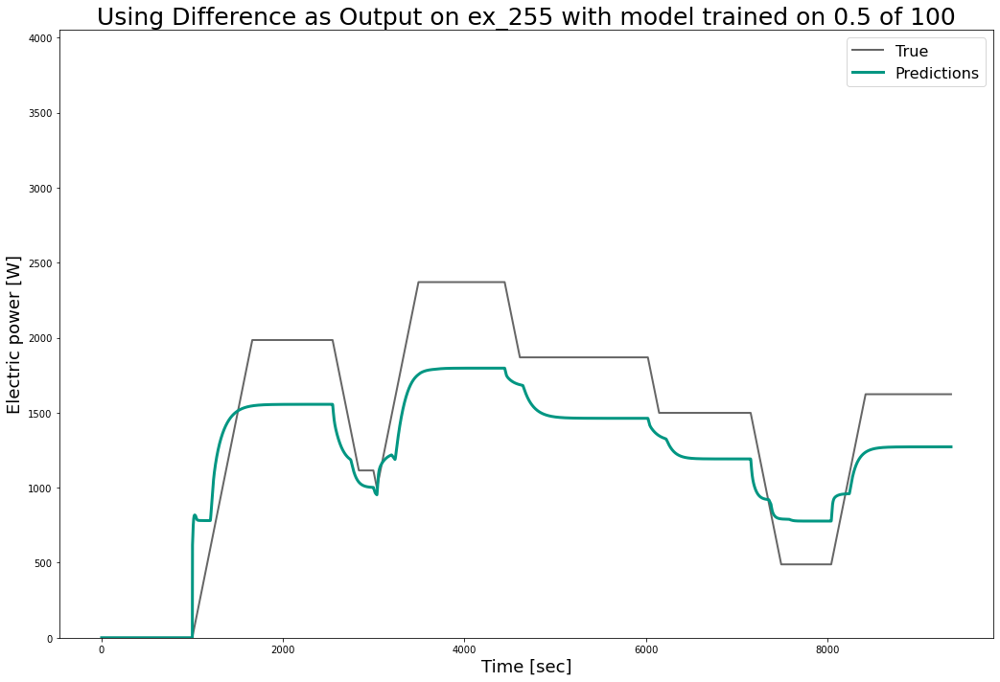

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


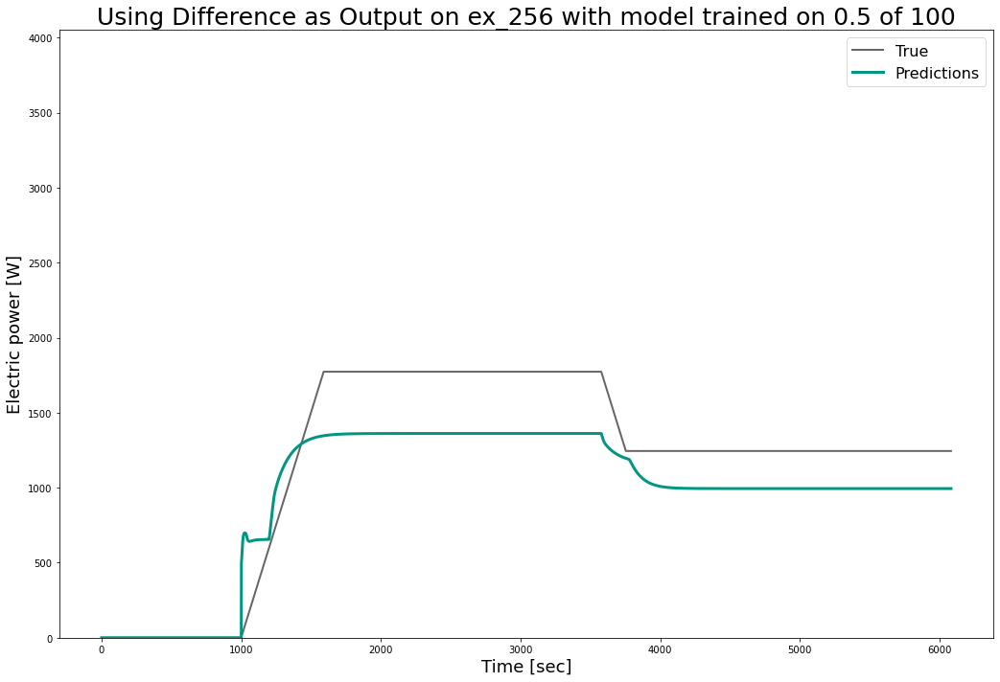

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


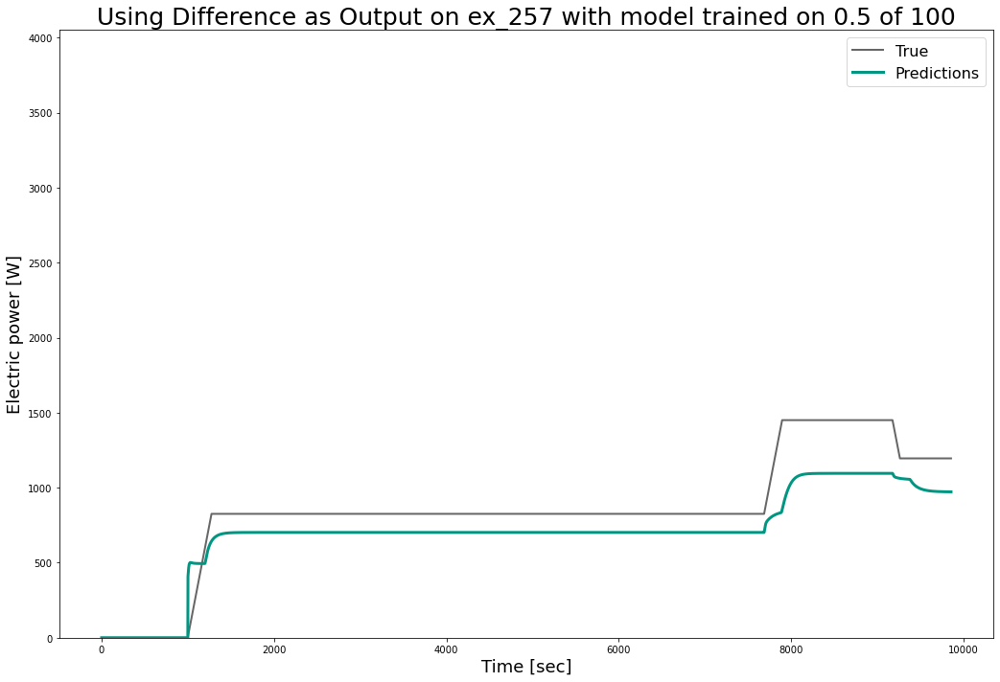

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


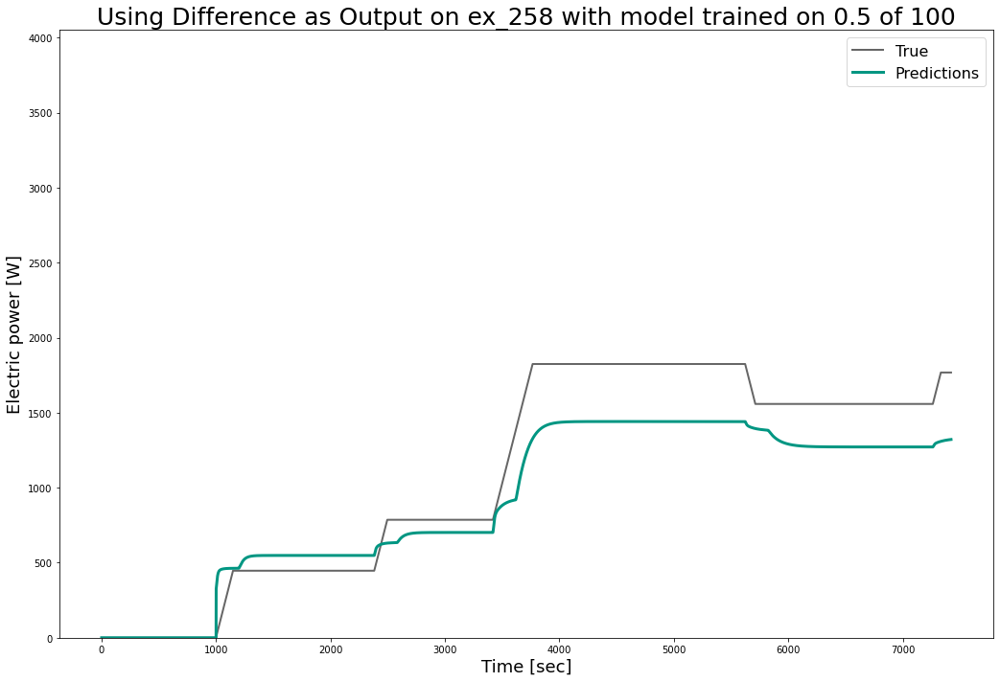

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


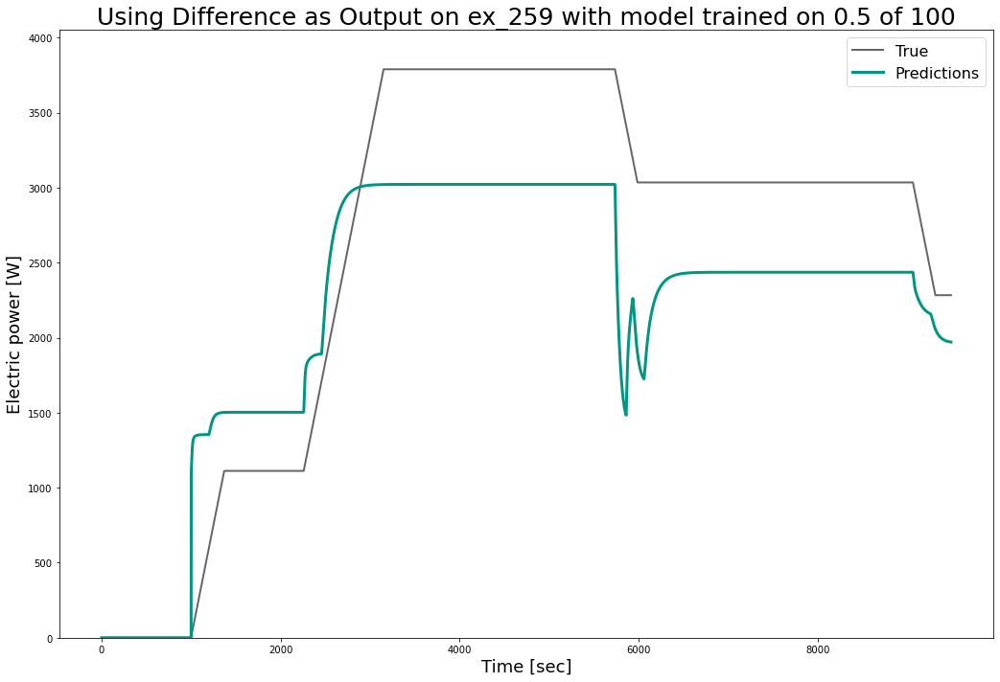

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


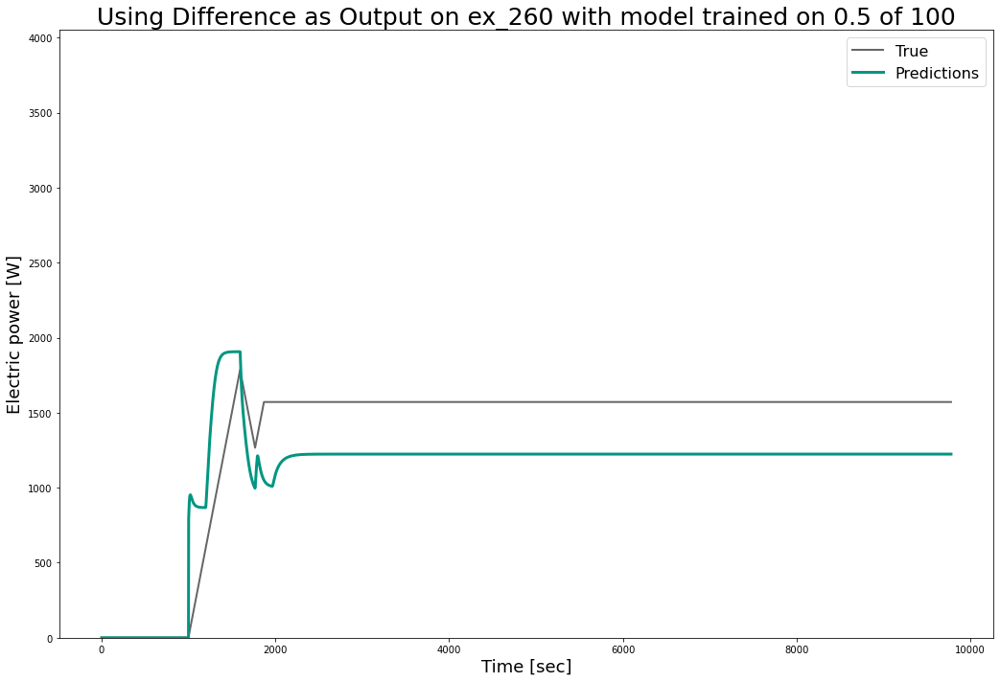

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


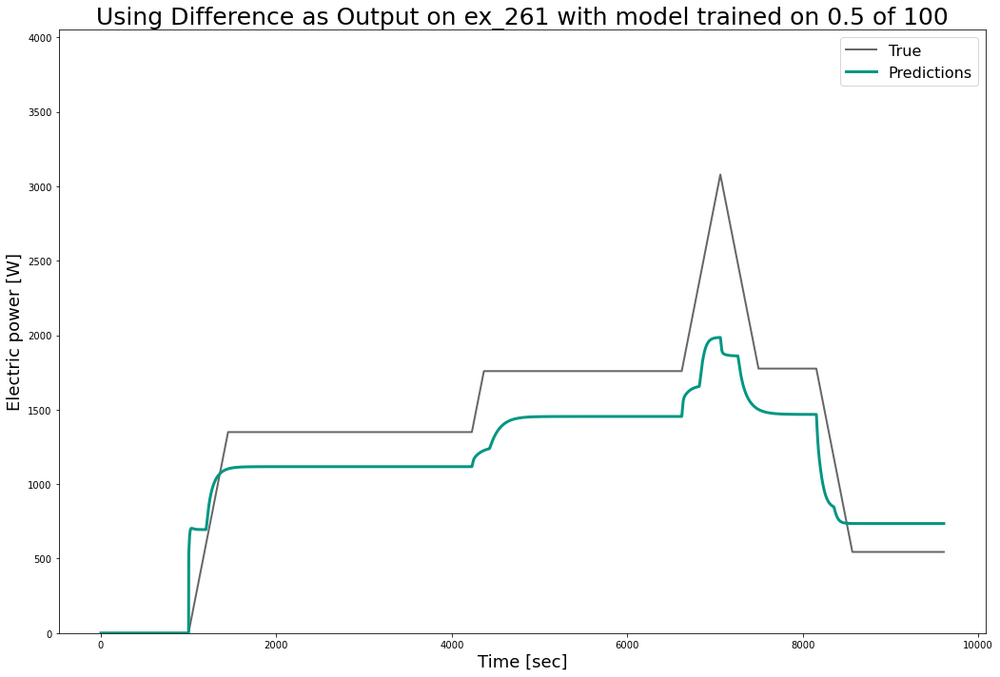

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


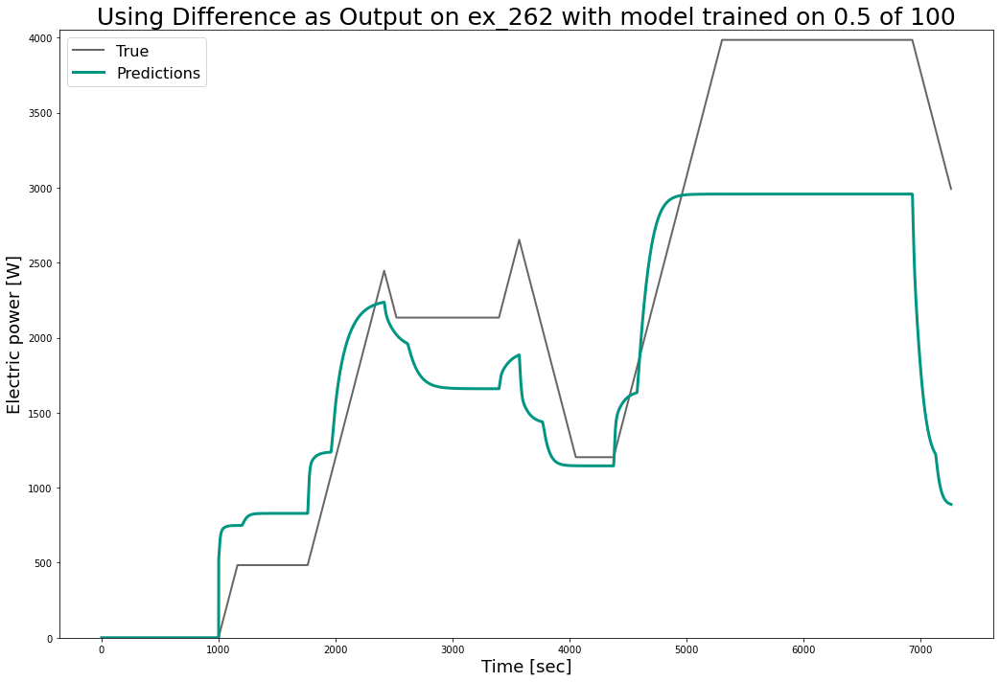

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


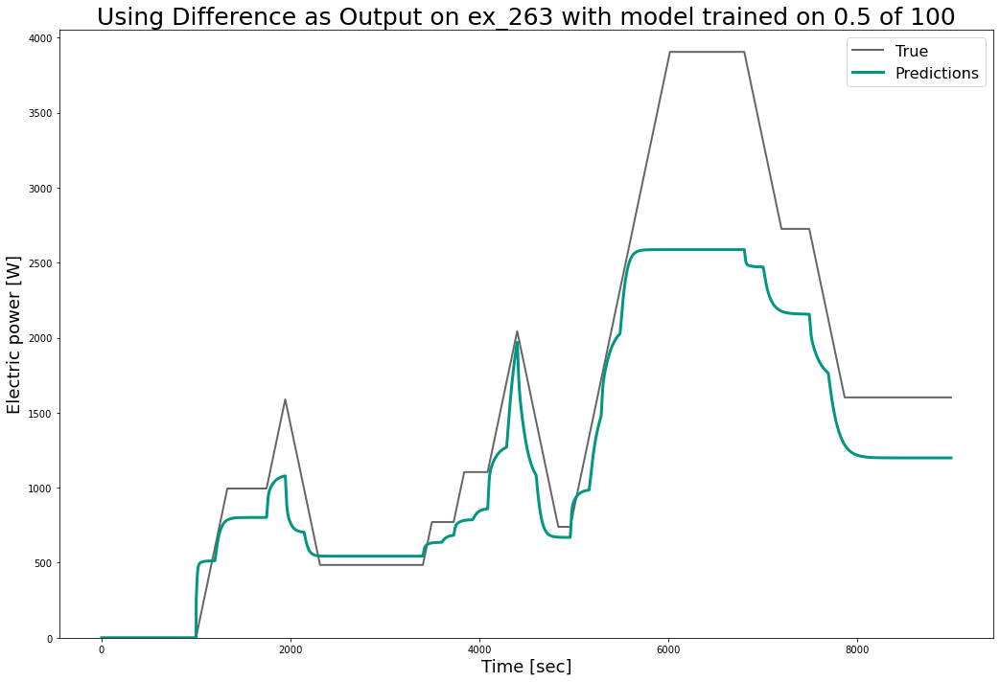

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


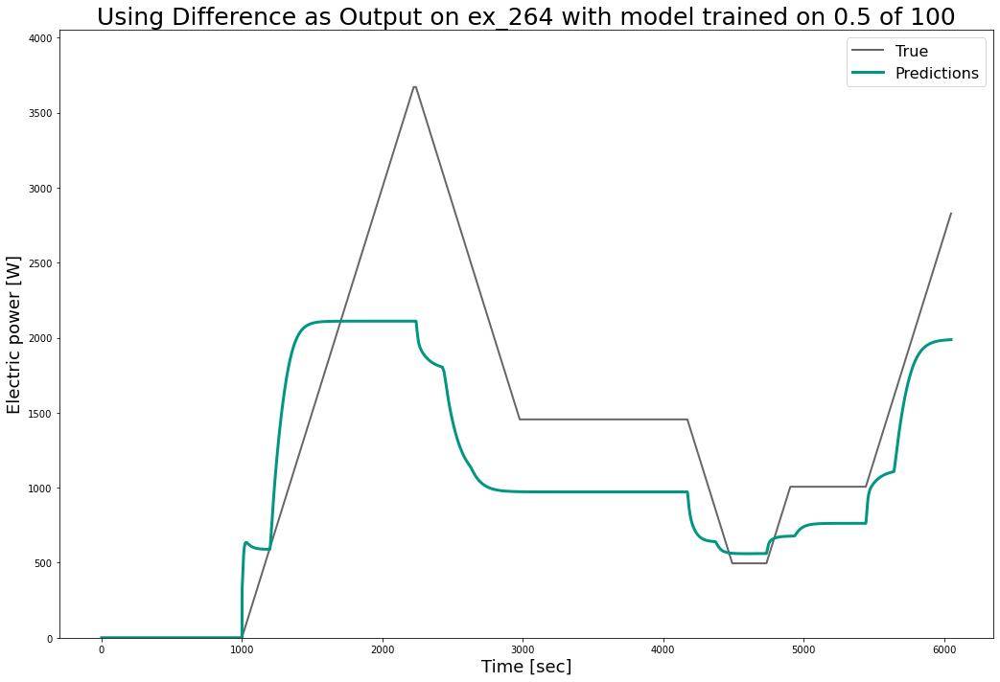

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


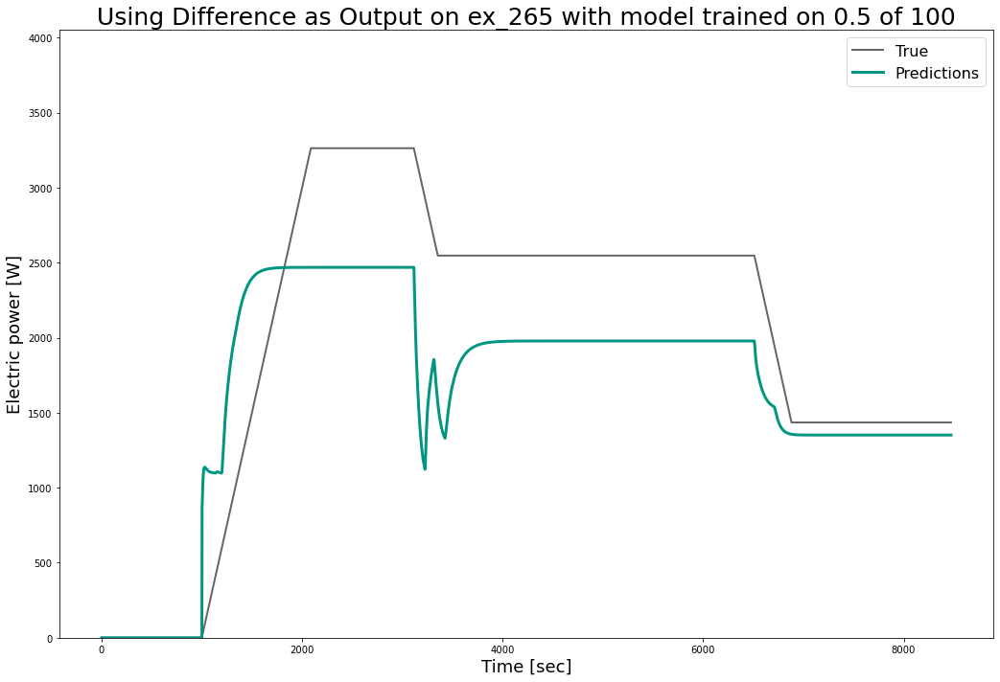

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


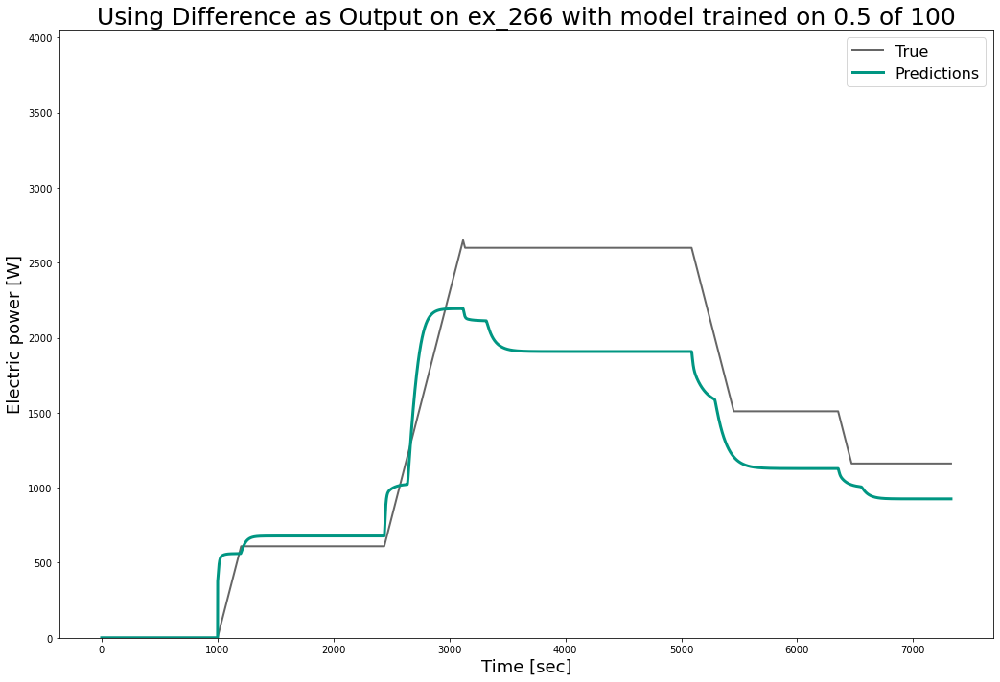

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


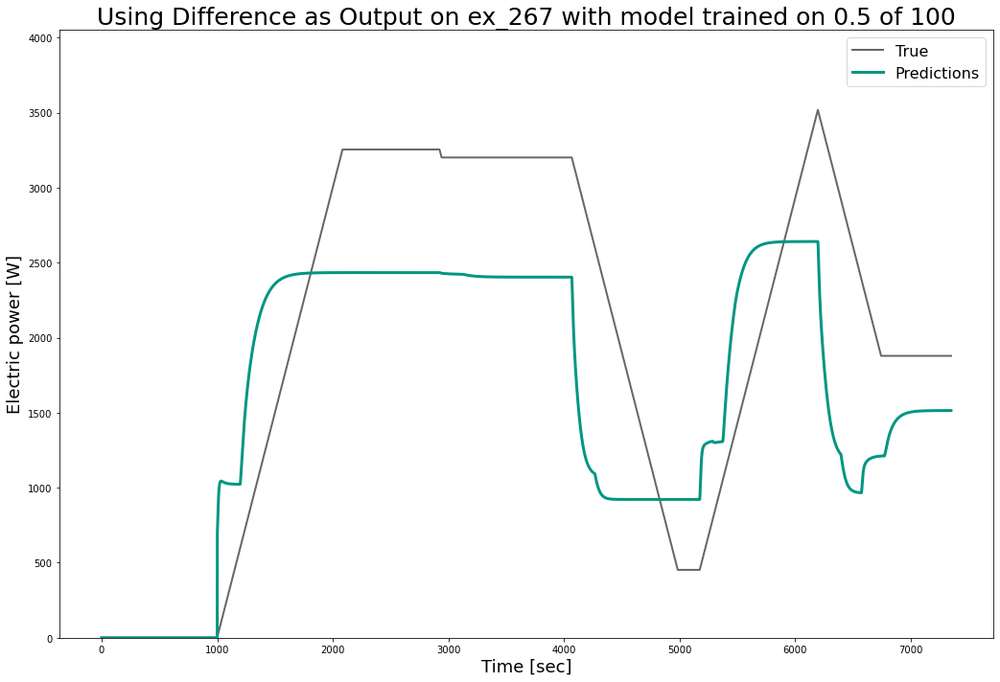

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


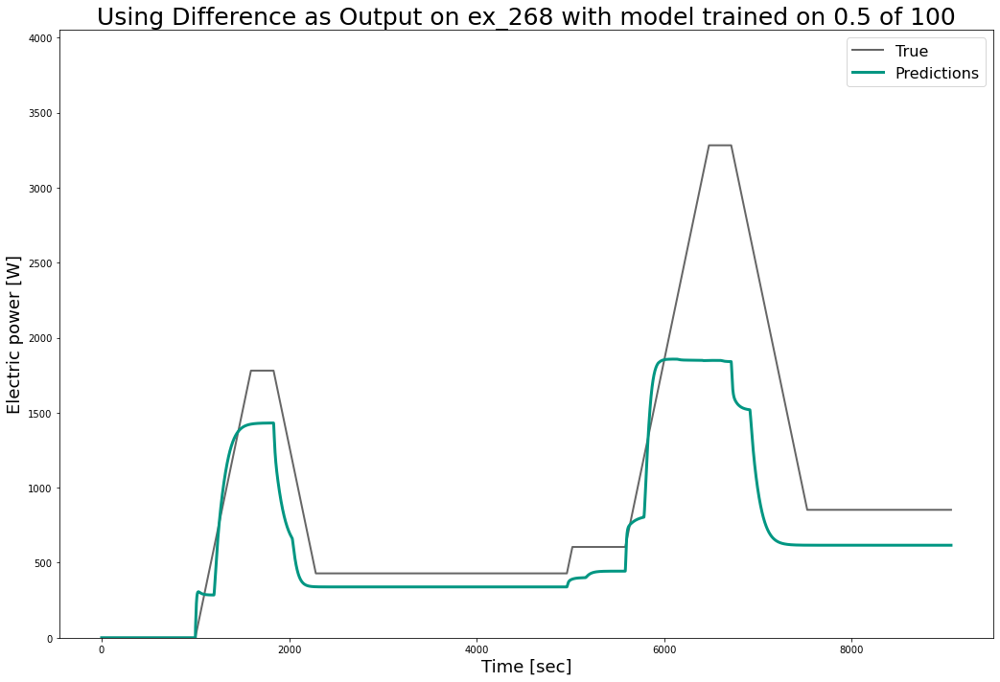

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


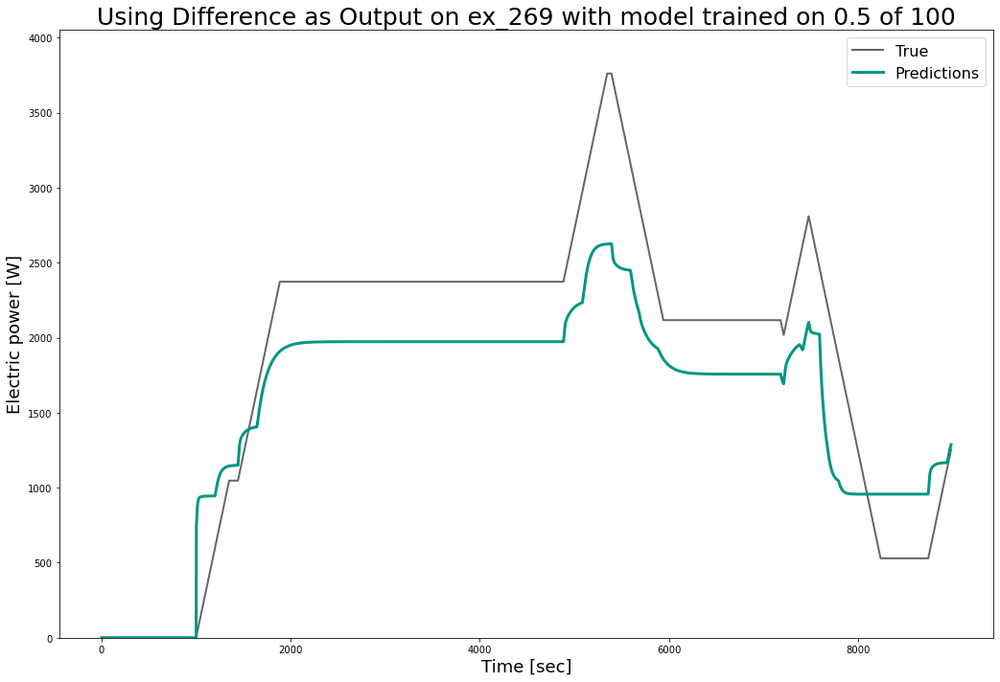

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


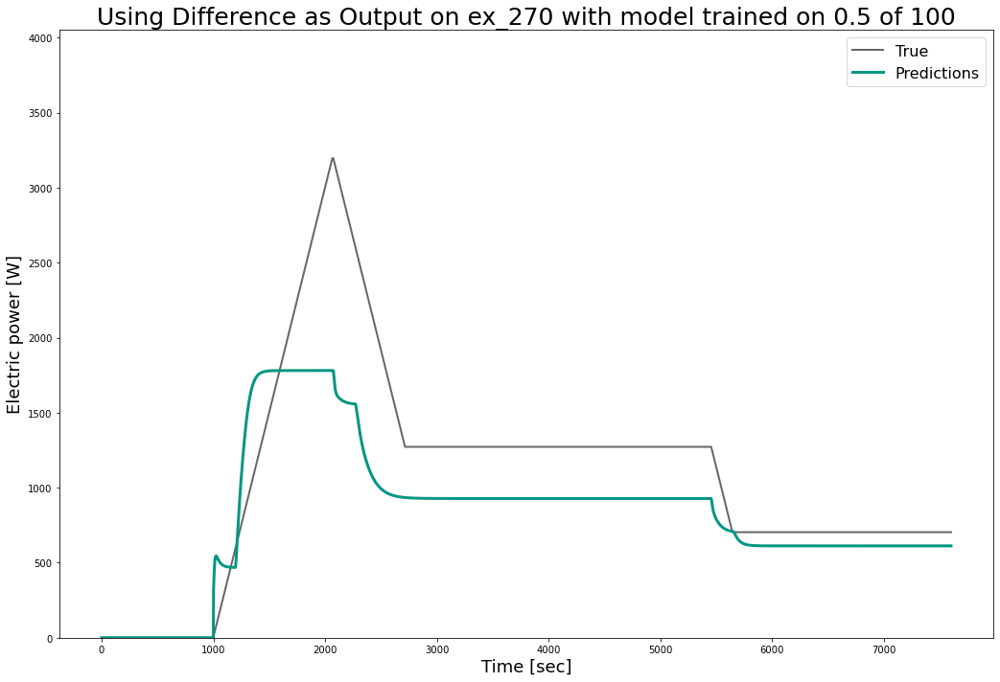

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


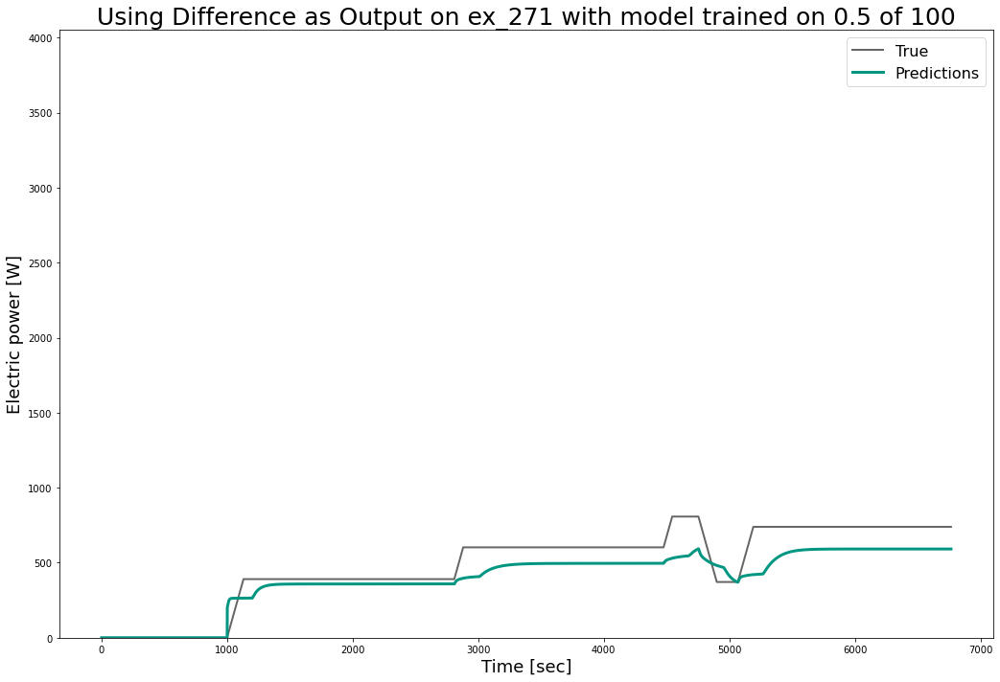

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


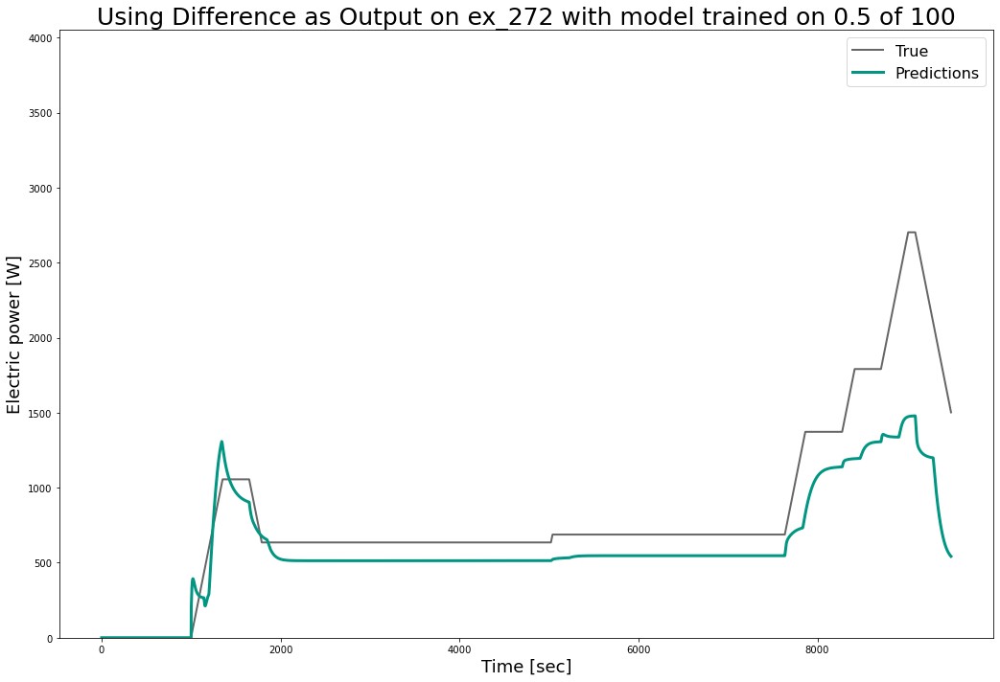

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


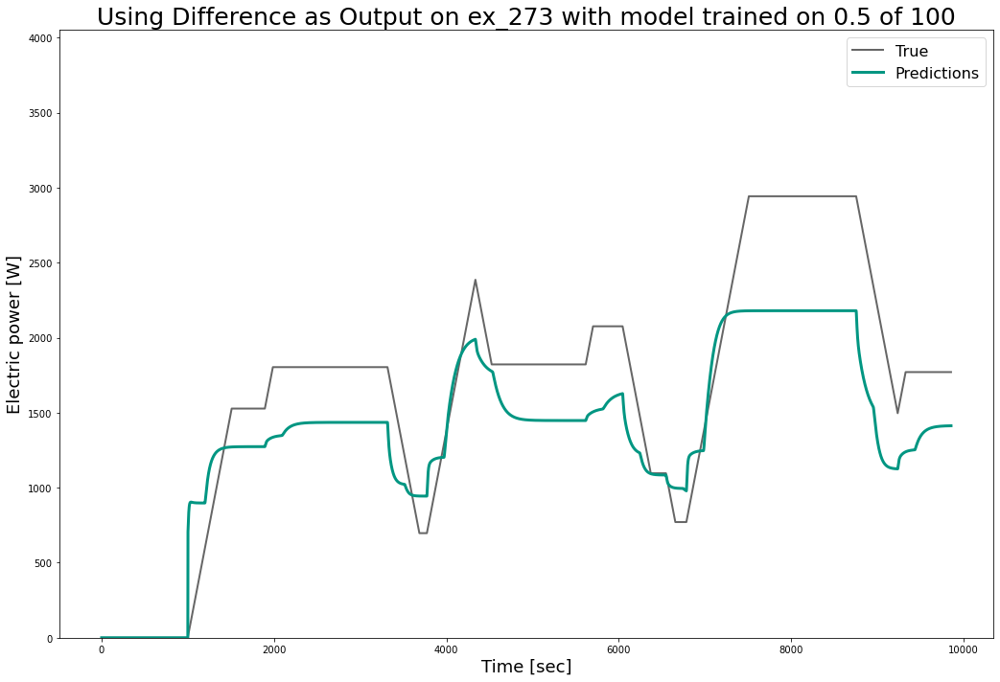

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


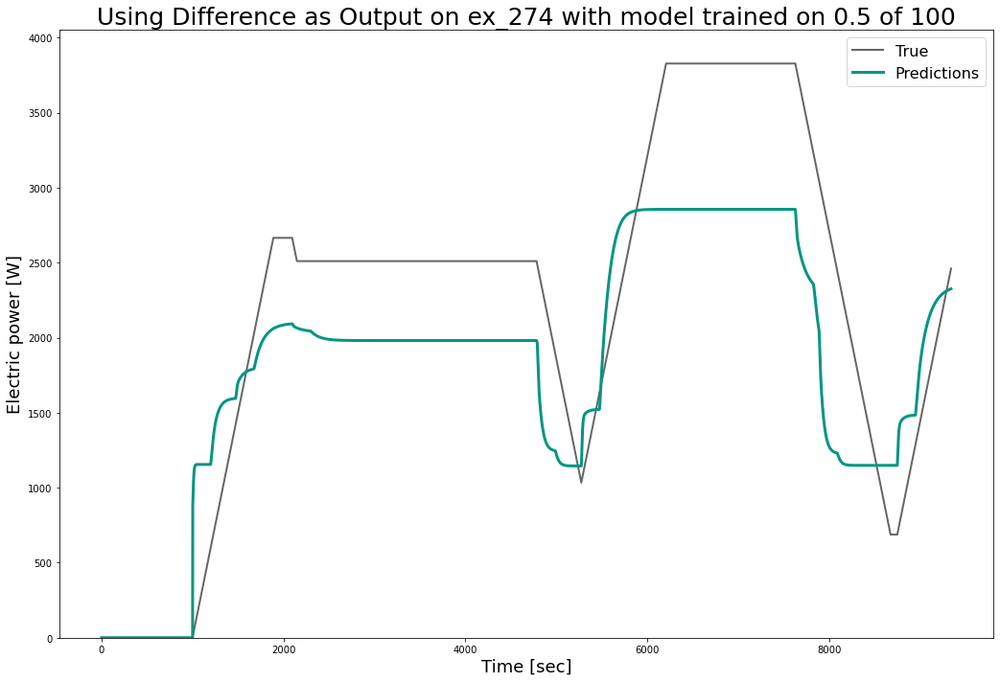

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


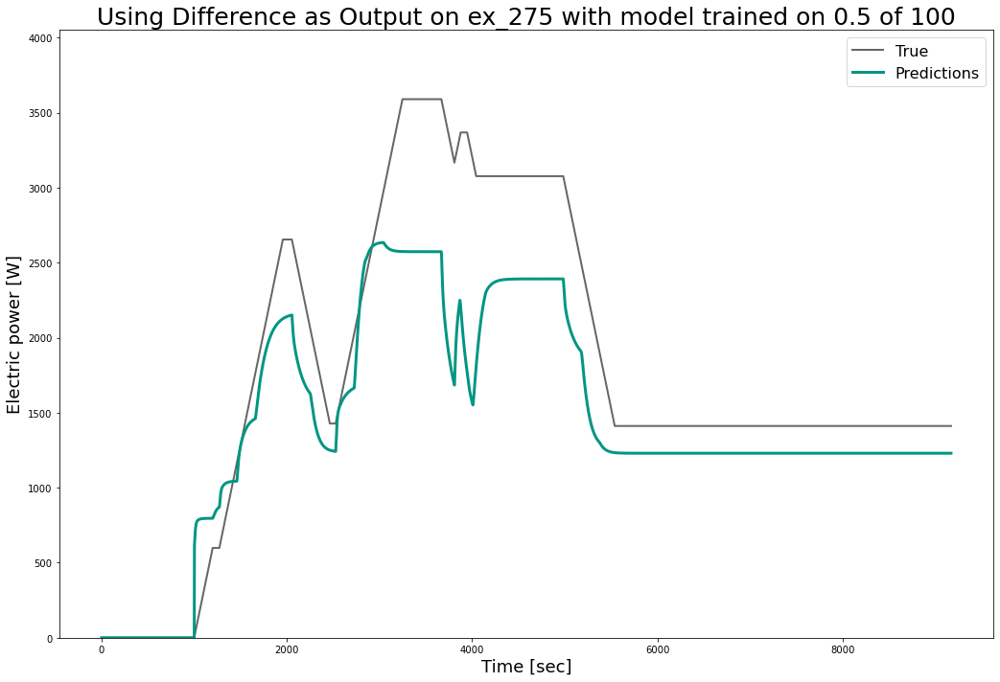

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


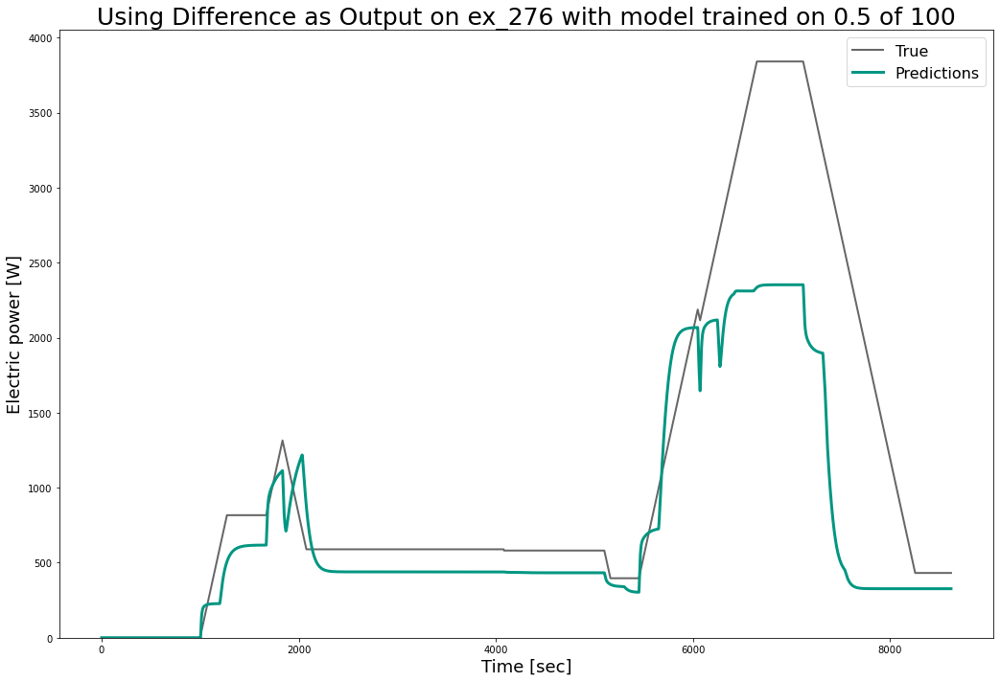

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


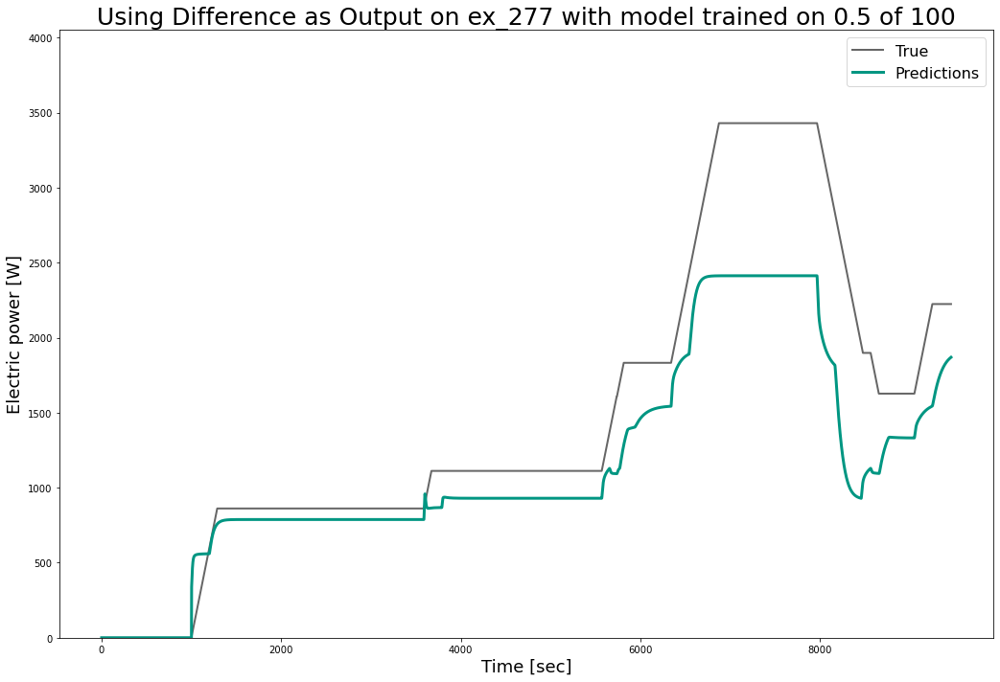

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


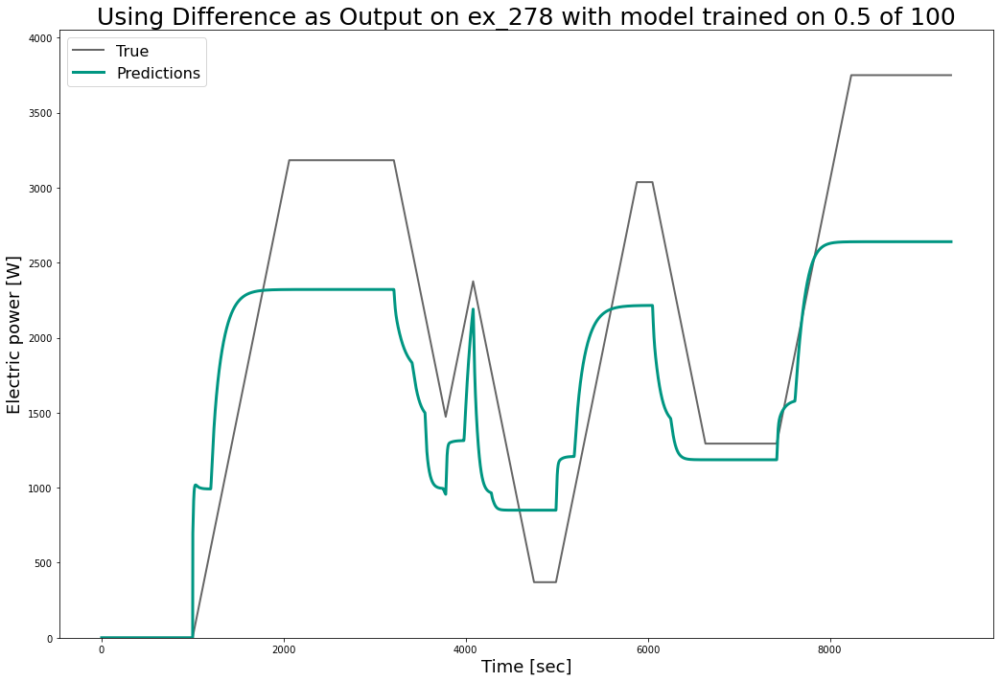

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


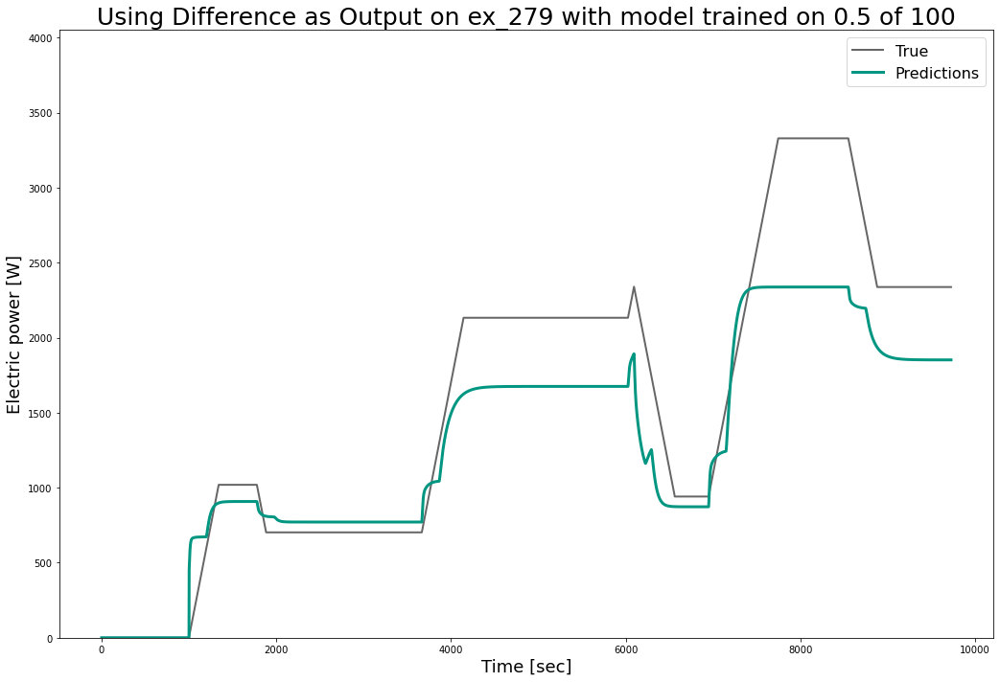

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


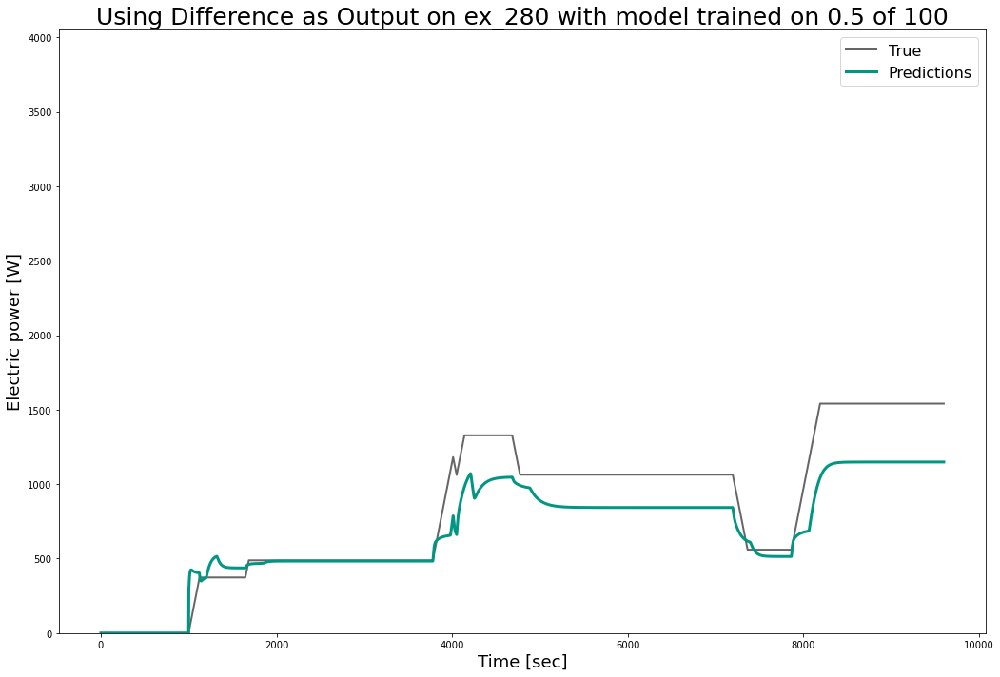

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


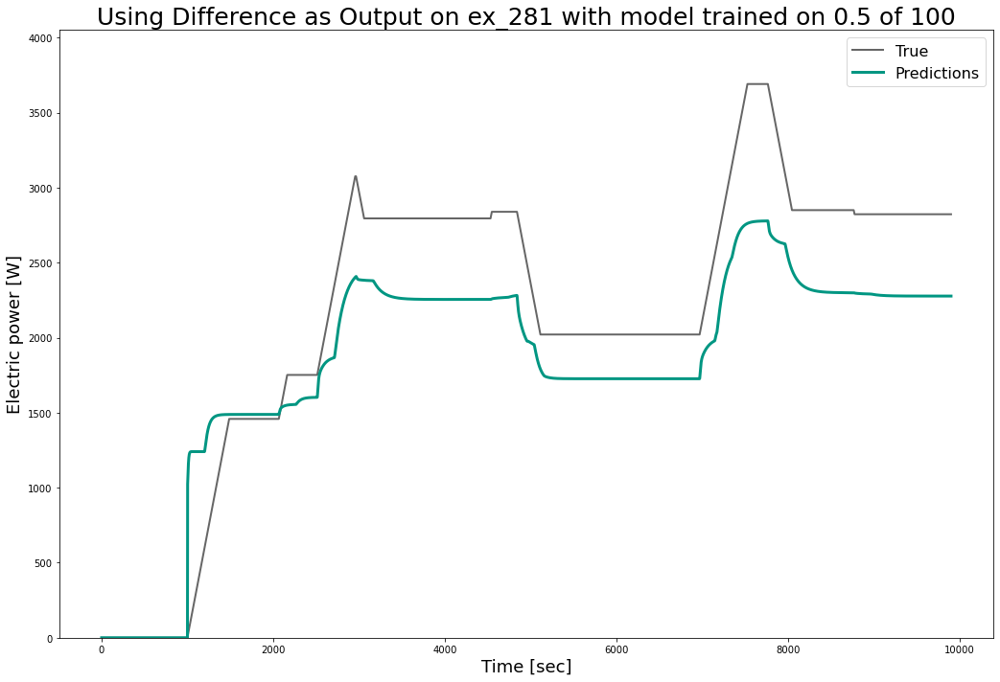

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


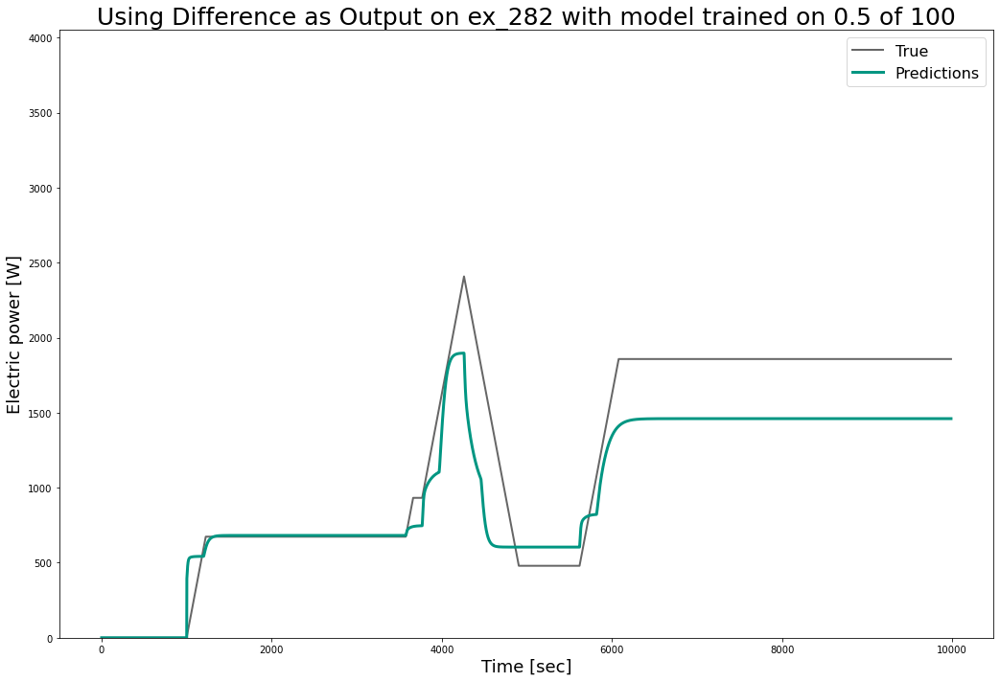

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


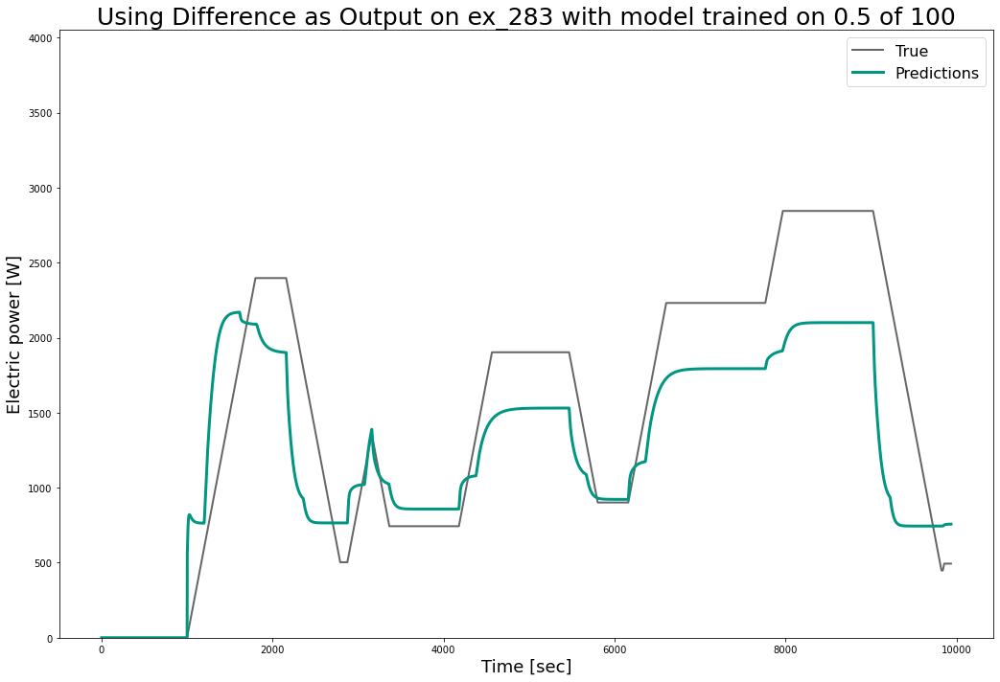

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


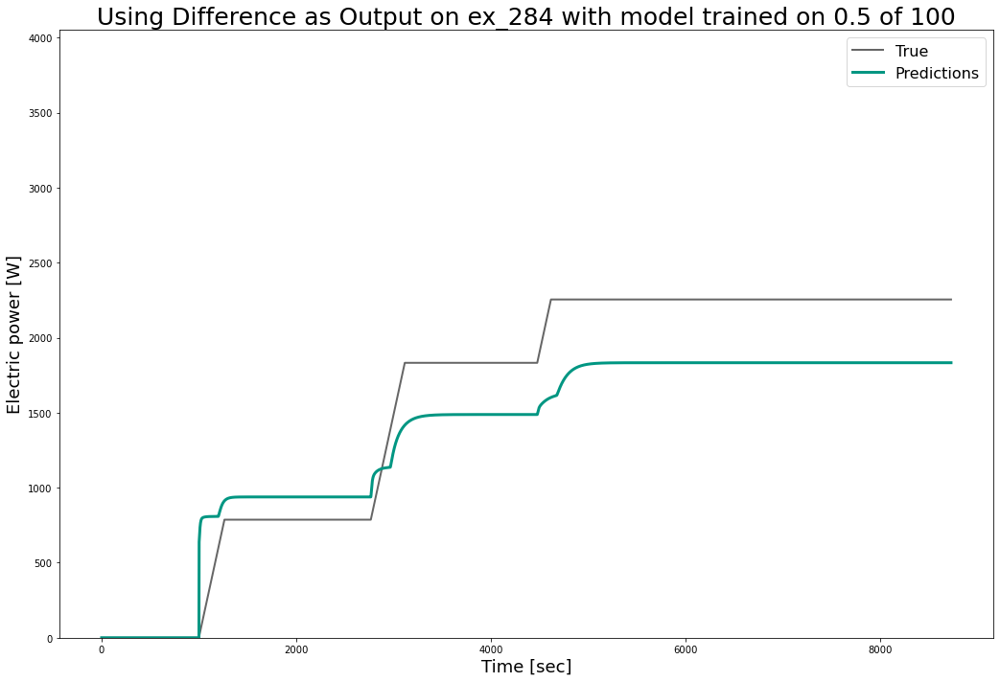

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


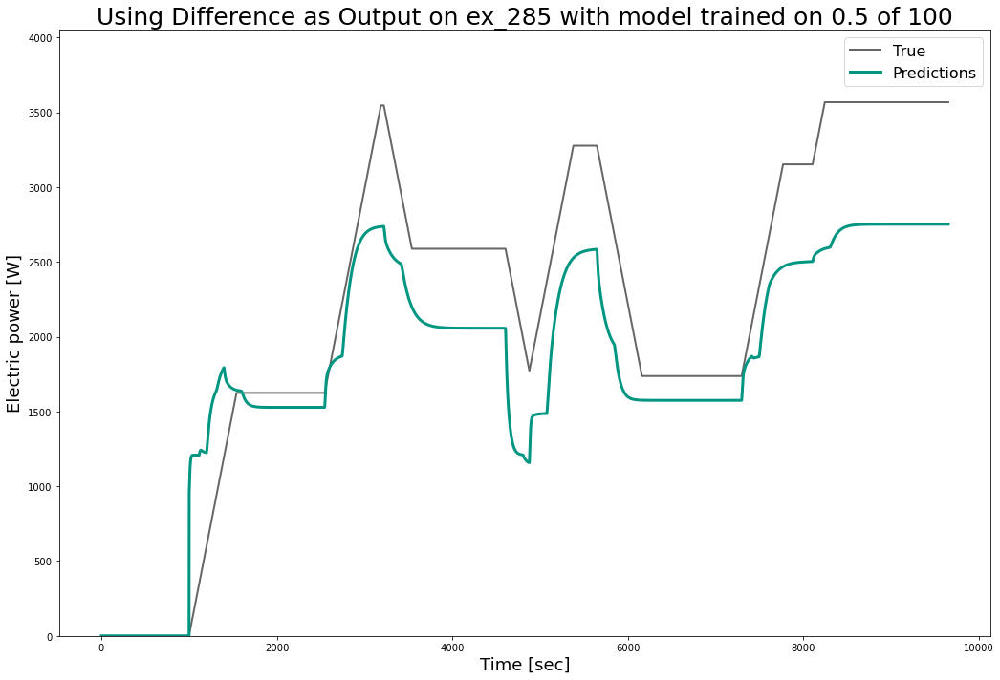

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


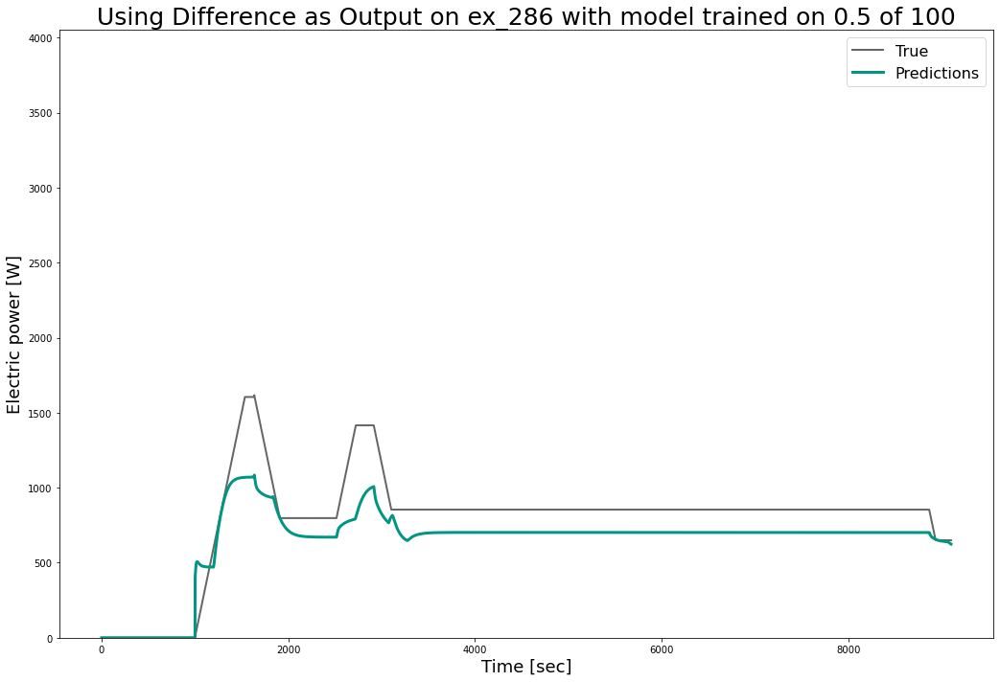

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


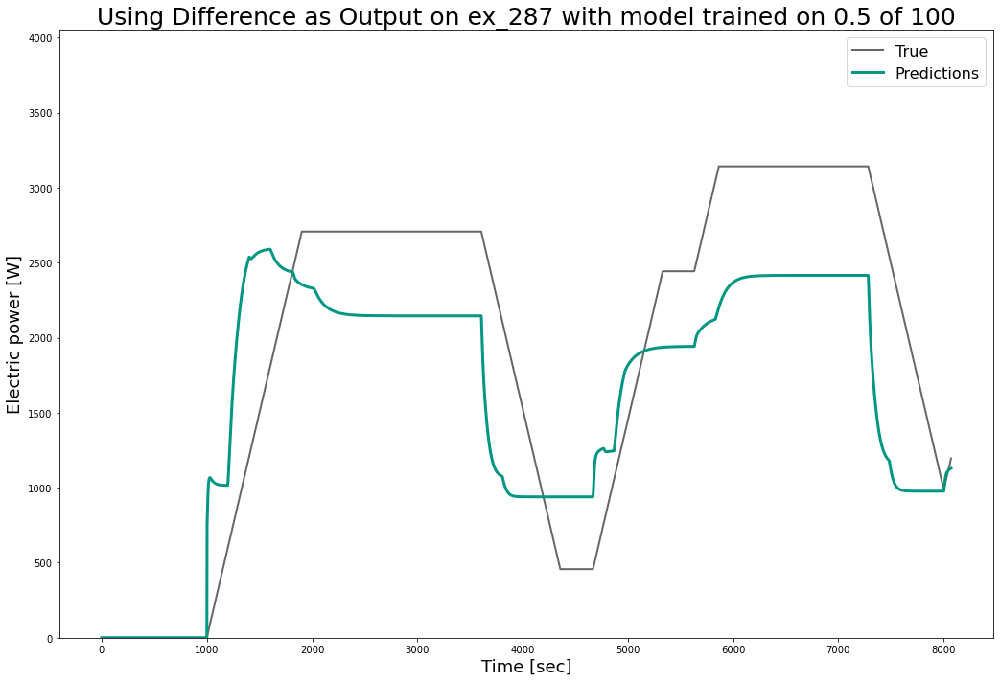

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


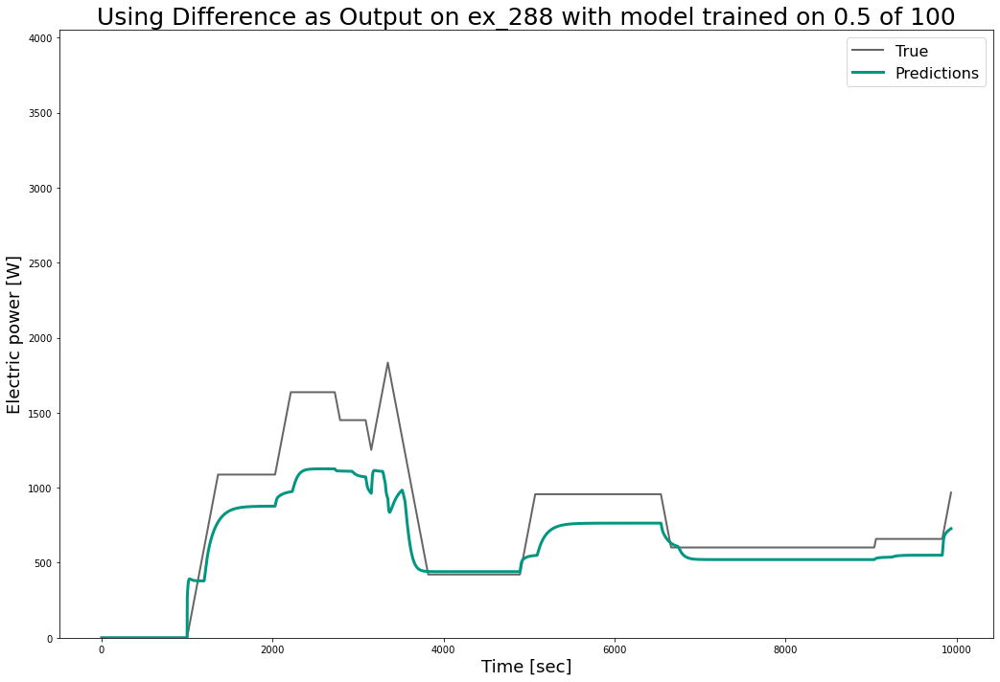

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


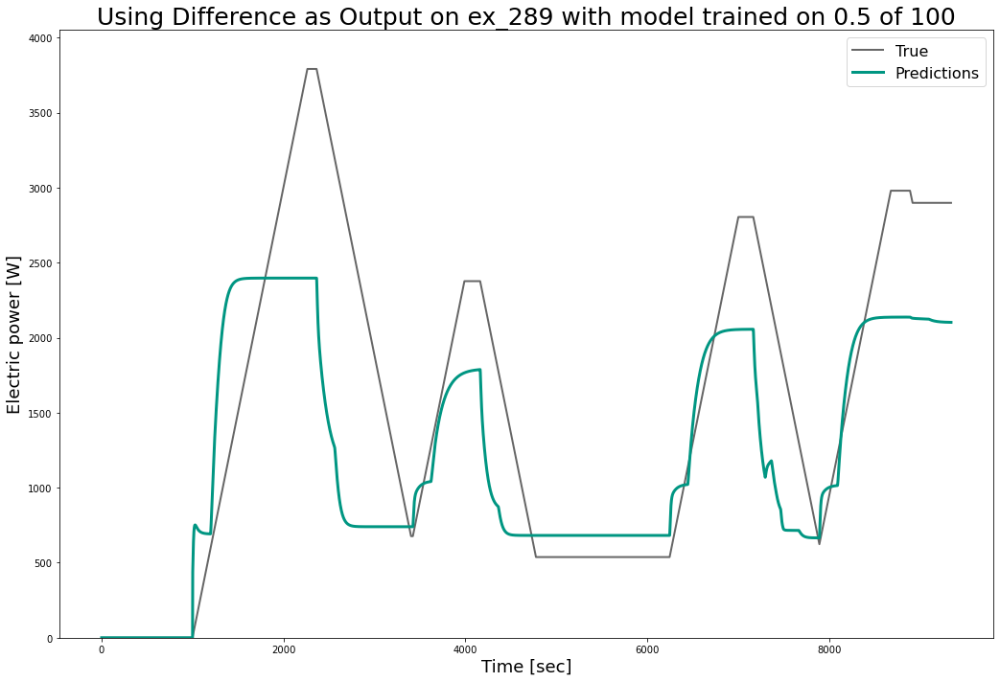

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


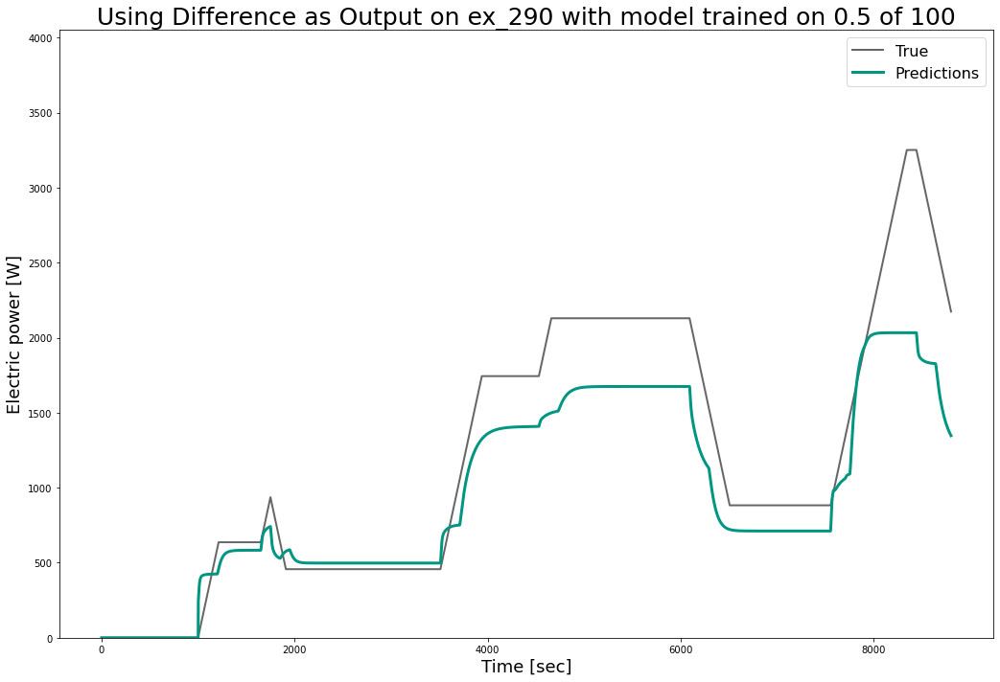

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


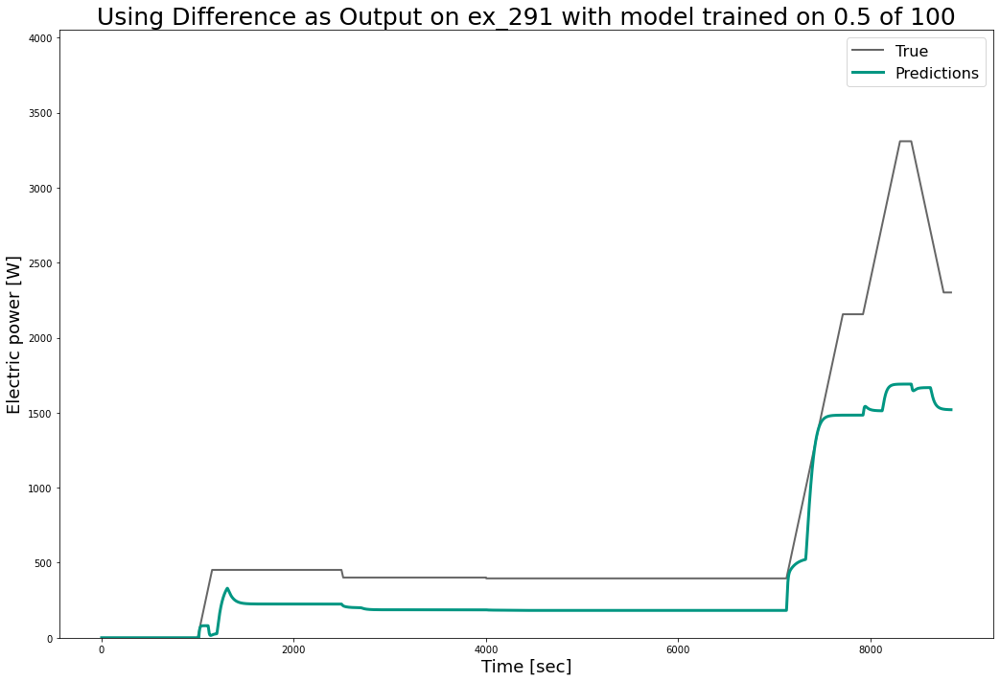

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


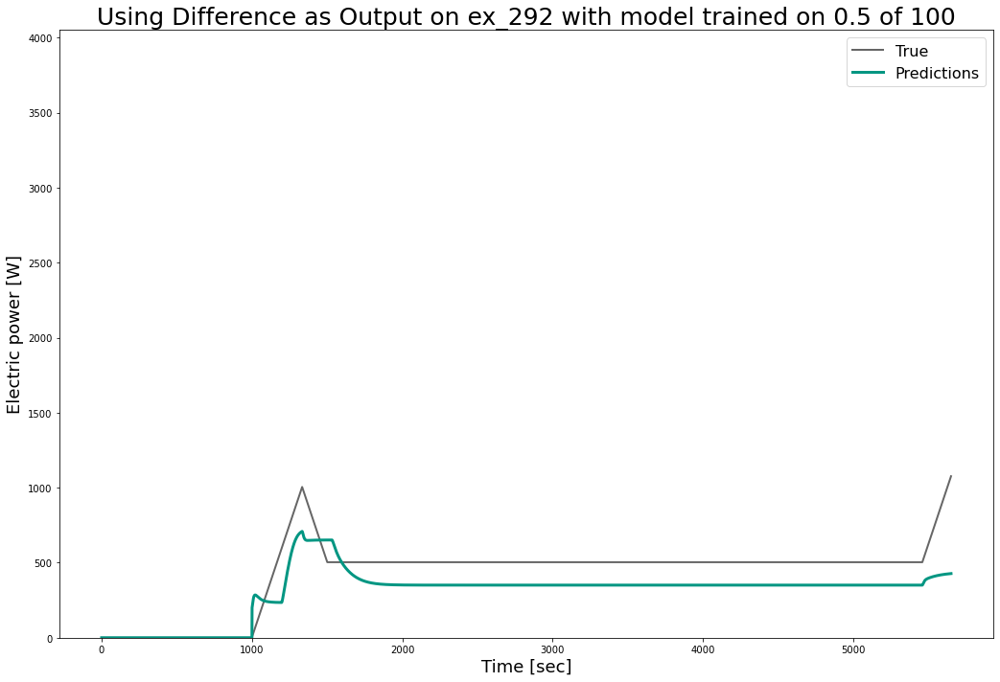

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


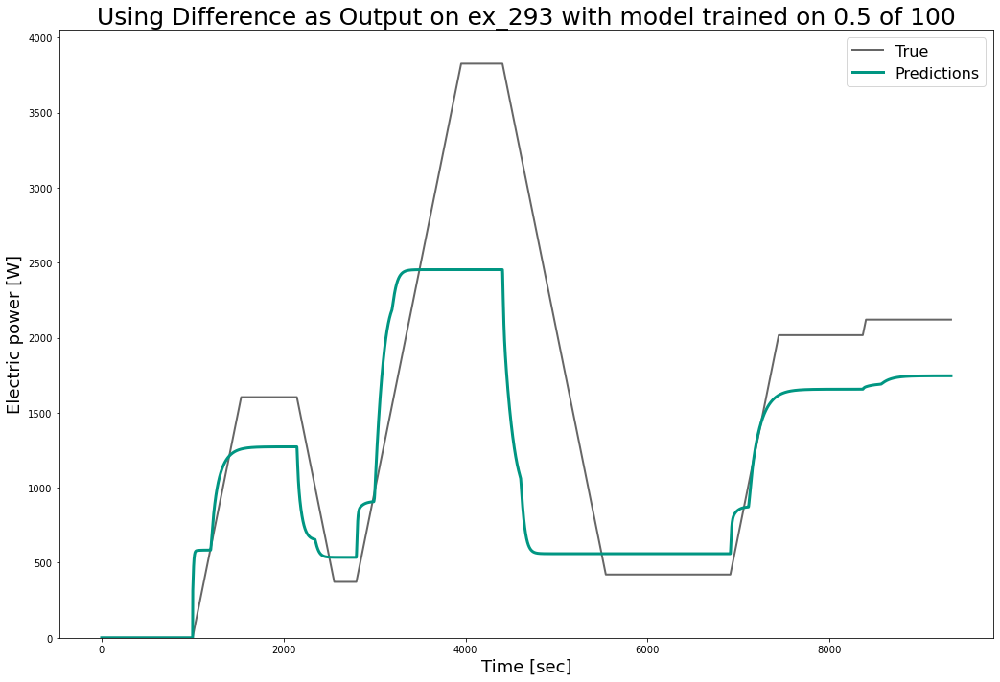

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


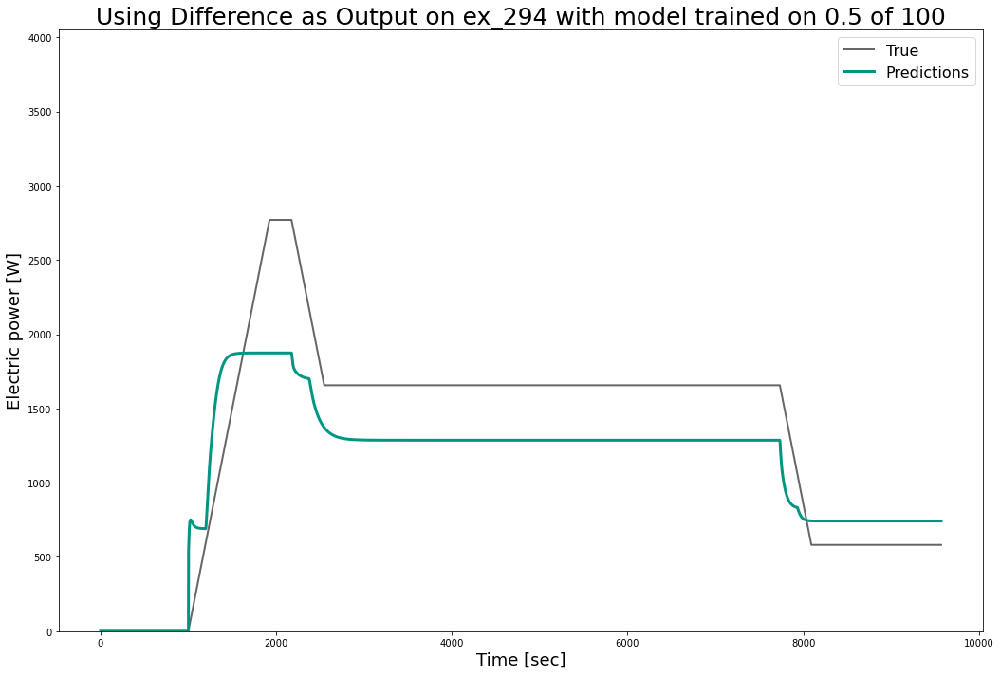

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


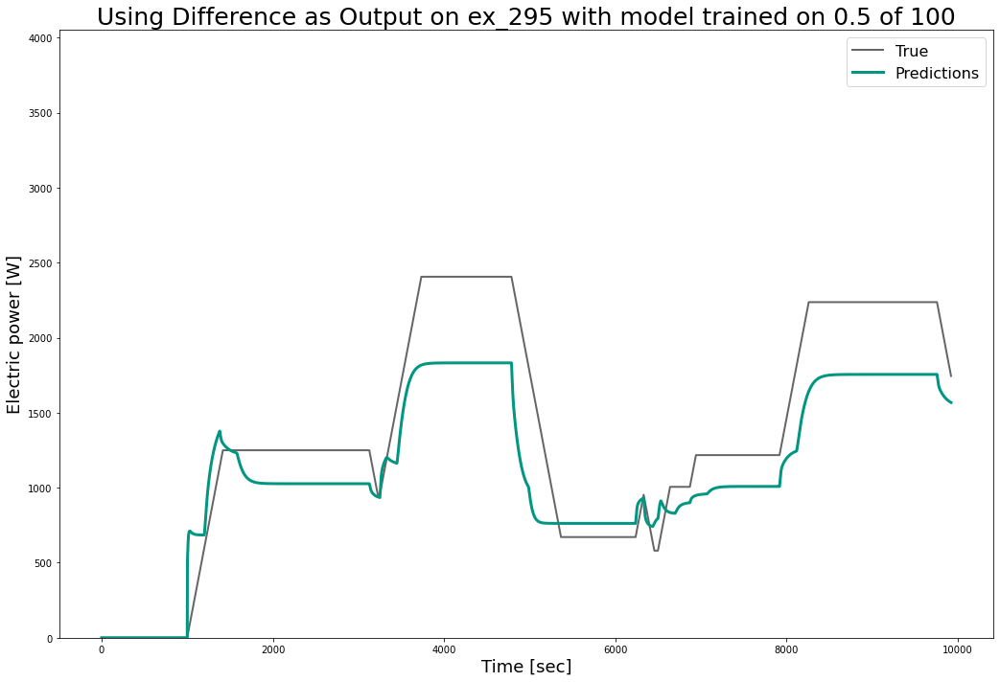

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


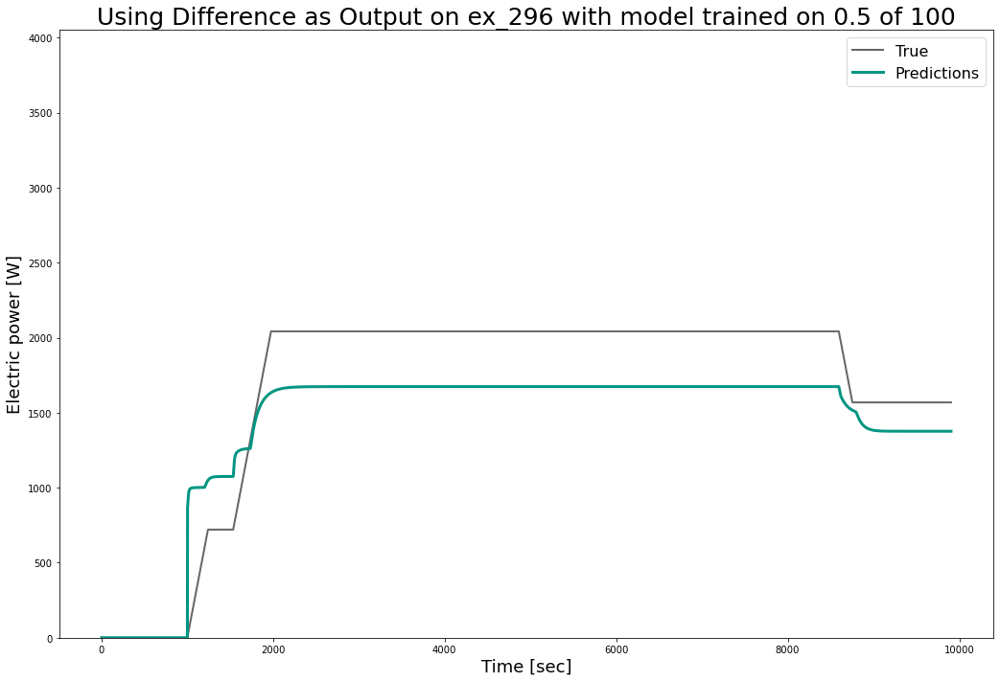

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


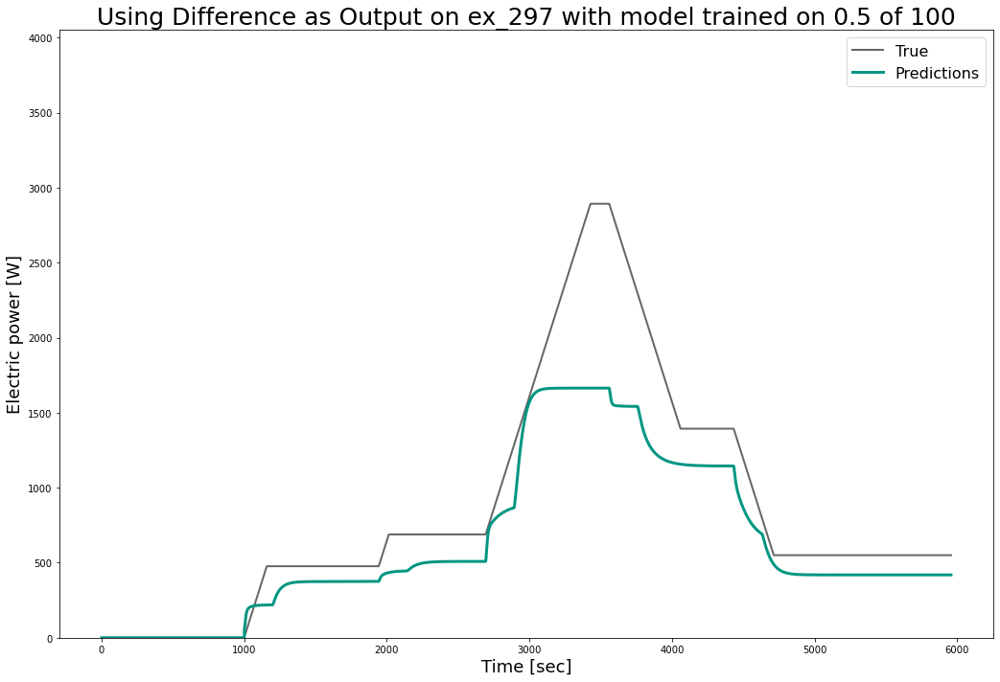

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


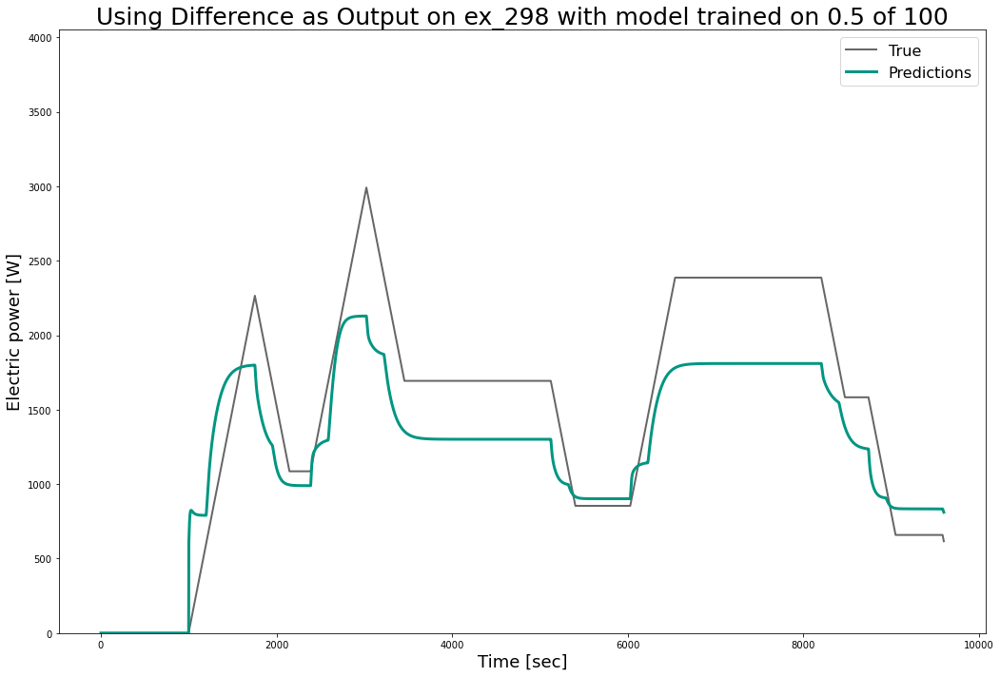

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


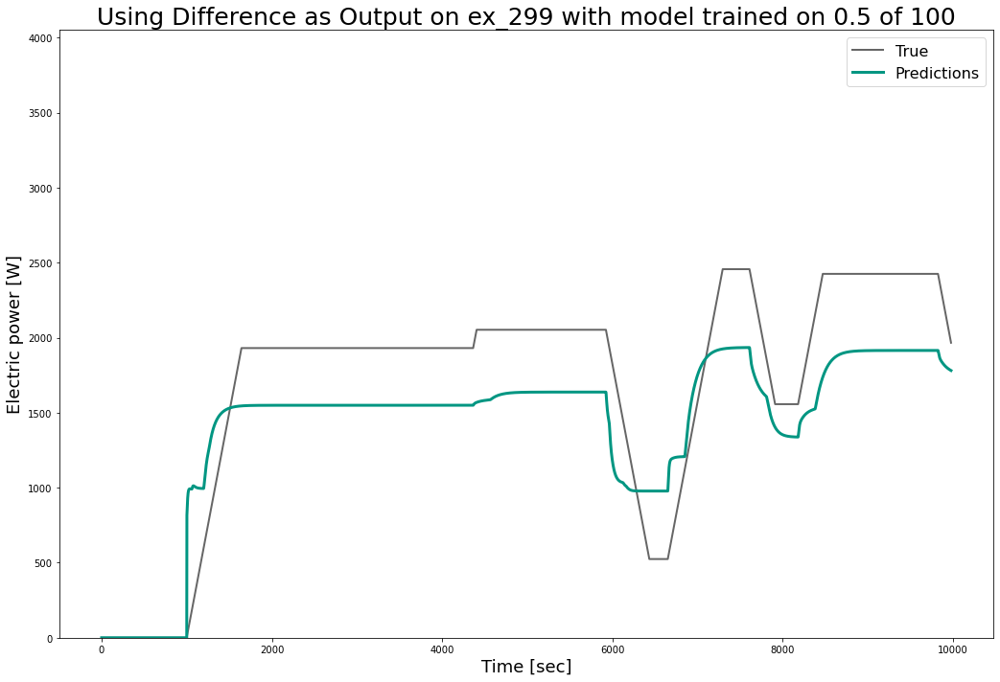

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs_scaled


Folder already exists.


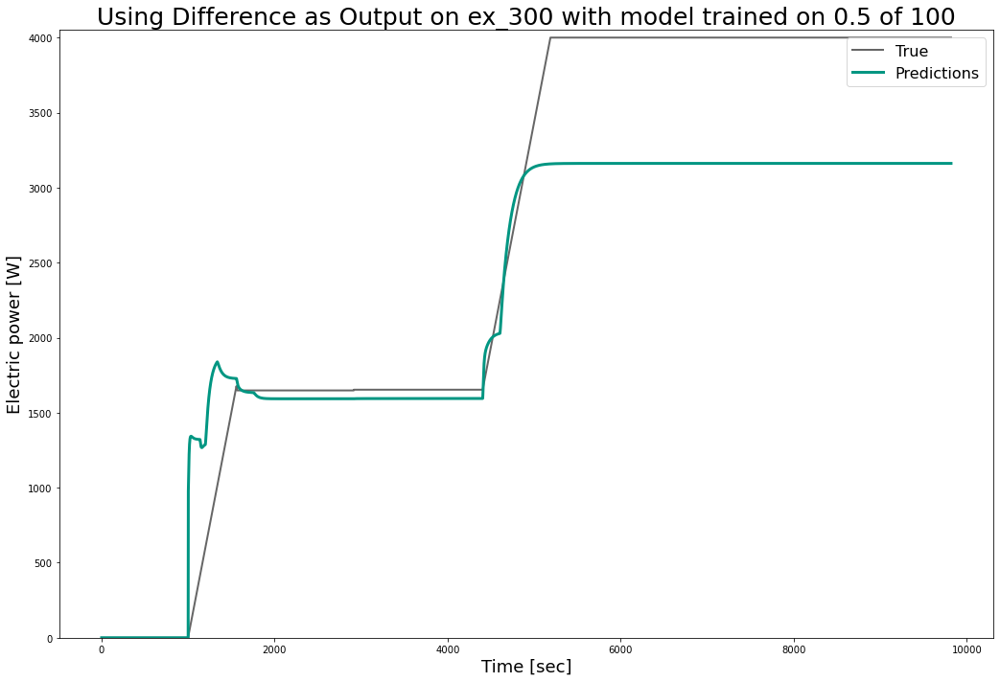

In [18]:
start_pred = time.time()
predictions()
dur_pred = time.time() - start_pred

In [19]:
print(dur_train)
print(dur_pred)

43196.15052771568
2422.4421303272247
